# Week 6 - Classification

This week, we shift from gathering human textual classifications through crowdsourcing, to using machine learning models and algorithms that train on those human classifications and extend them to documents far too numerous to read. If you recall, *clustering* allows us to stably partition text data (e.g., documents, turns of conversation) according to all patterns of covariation among available text features. *Classification*, by contrast, partitions text data according to only those features and their variation that enable us to mimic and extrapolate human annotations.

In this notebook, we will show how to use a variety of classification methods, including Naïve Bayes, Logistic regression, K-nearest neighbor, decision trees and random forests, support vector machines and even a simple neural network, the perceptron. We will also demonstrate ensemble techniques that can link several such methods into a single, more accurate, classification pipeline. We will finally learn to use conventions and metrics to evaluate classifier performance on out-of-sample data. 

For this notebook we will be using the following packages.

In [1]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
import lucem_illud #pip install -U git+git://github.com/Computational-Content-Analysis-2018/lucem_illud.git

#All these packages need to be installed from pip
#For ML
import sklearn
import sklearn.naive_bayes
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
import sklearn.decomposition

import nltk #For tokenizing and normalizing
import numpy as np #arrays
import matplotlib.pyplot as plt #Plots
import matplotlib.colors # For nice colours
import seaborn #Makes plots look nice, also heatmaps
import scipy as sp #for interp

#These are from the standard library
import collections
import os
import os.path
import random
import re
import glob
import pandas
import requests
import json
import math

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

# Simple Simulated Examples

Here we create a sandbox for you to explore different types of classified data and how different statistical classifiers perform on each type.

## Generating example data

We start by loading one of the "cartoon" or simplified data sets and then dividing it into training and testing sets. To maximize our ability to visualize, each dataset involves two classes, colored yellow and blue, arrayed along two two dimensions (`x` and `y`). 

The four data patterns include: 
+ `random` in which the two classes are randomly distributed across both dimensions
+ `andSplit` in which the two classes are linearly split along one of two dimensions (e.g., men like Adidas)
+ `xorSplit` in which the two classes are split, oppositely, along each dimension (e.g., old ladies and young men like Nikes)
+ `targetSplit` in which one class is nested within the other in two dimensions (e.g., middle aged, middle income people like vintage Mustangs)
+ `multiBlobs` in which 5 classes are placed as bivariate Gaussians at random locations

`noise` is a variable [0-1] that ranges from no noise in the prescribed pattern [0] to complete noise/randomness [1].

Uncomment (remove the # in front of) each dataset, one at a time, and then run the cell and subsequent cells to examine how each machine learning approach captures each pattern.

In [52]:
noise = .2

dfTrain_rand, dfTest_rand = lucem_illud.trainTestSplit(lucem_illud.random())
dfTrain_and, dfTest_and = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise))
dfTrain_xor, dfTest_xor = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise)) #Please try this one
dfTrain_target, dfTest_target = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise))
dfTrain_multi, dfTest_multi = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise))

In [86]:
noise_5= .5
dfTrain_xor_5, dfTest_xor_5 = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise_5)) #Please try this one
dfTrain_and_5, dfTest_and_5 = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise_5))
dfTrain_target_5, dfTest_target_5 = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise_5))
dfTrain_multi_5, dfTest_multi_5 = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise_5))

In [509]:
noise_9 = .9
dfTrain_xor_9, dfTest_xor_9 = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise_9)) #Please try this one

In [265]:
noise_10 = 1.0
dfTrain_and_10, dfTest_and_10 = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise_10))

We can easily visualize the rendered datasets because they are generated in two dimensions.

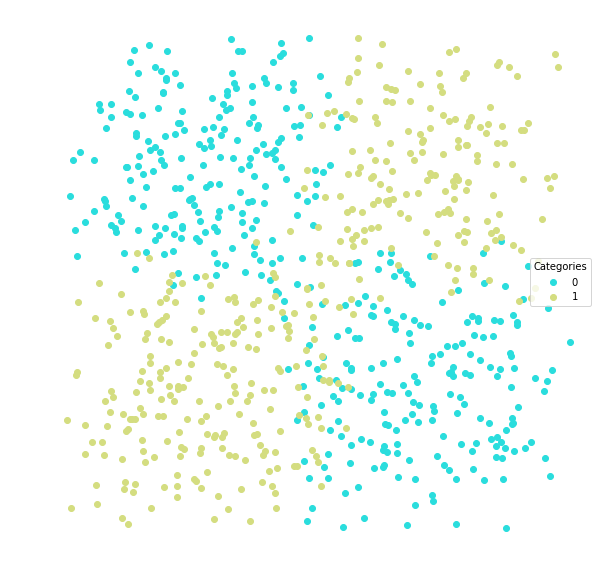

In [53]:
lucem_illud.plotter(dfTrain_xor)

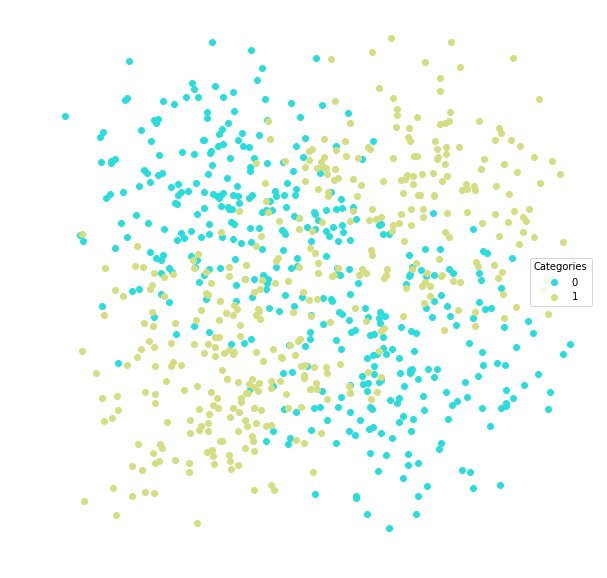

In [85]:
lucem_illud.plotter(dfTrain_xor_5)

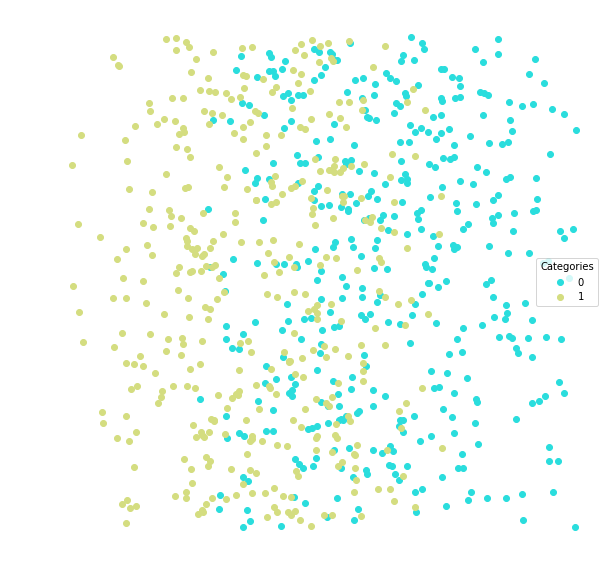

In [87]:
lucem_illud.plotter(dfTrain_and_5)

## Training a Machine Learning algorithm

We can now pick a model, there are many more options in `scikit-learn`. These are just a few examples, which array along the machine learning "tribes" described in Pedro Domingos _The Master Algorithm_.

Uncomment (remove the # in front of) each algorithm one at a time, then run the cell and subsequent cells to evaluate how it learns to understand the data.

In [262]:
#Bayes
clf_bayes = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf_linear = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up
clf_poly = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
clf_KN = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf_log = sklearn.linear_model.LogisticRegression()

#Symbolists
clf_decison = sklearn.tree.DecisionTreeClassifier()
clf_forest = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf_network = sklearn.neural_network.MLPClassifier()

#Ensemble
clf_ensemble = sklearn.ensemble.GradientBoostingClassifier()

Now we fit the model by giving it our training data

In [500]:
#xorSplit+linear+noise=0.2
clf_linear.fit(np.stack(dfTrain_xor['vect'], axis=0), dfTrain_xor['category'])

#xorSplit+Bayes+noise=0.2
clf_bayes.fit(np.stack(dfTrain_xor['vect'], axis=0), dfTrain_xor['category'])

#xorSplit+polynomial+noise=0.2
clf_poly.fit(np.stack(dfTrain_xor['vect'], axis=0), dfTrain_xor['category'])

#xorSplit+KNeighbors+noise=0.2
clf_KN.fit(np.stack(dfTrain_xor['vect'], axis=0), dfTrain_xor['category'])

#xorSplit+logistics+noise=0.2
clf_log.fit(np.stack(dfTrain_xor['vect'], axis=0), dfTrain_xor['category'])

#xorSplit+decisiontree+noise=0.2
clf_decison.fit(np.stack(dfTrain_xor['vect'], axis=0), dfTrain_xor['category'])

#xorSplit+randomforests+noise=0.2
clf_forest.fit(np.stack(dfTrain_xor['vect'], axis=0), dfTrain_xor['category'])

#xorSplit+connectionist+noise=0.2
clf_network.fit(np.stack(dfTrain_xor['vect'], axis=0), dfTrain_xor['category'])

#xorSplit+ensemble+noise=0.2
clf_ensemble.fit(np.stack(dfTrain_xor['vect'], axis=0), dfTrain_xor['category'])

//anaconda/lib/python3.5/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [510]:
#xorSplit+linear+noise=0.9
clf_linear.fit(np.stack(dfTrain_xor_9['vect'], axis=0), dfTrain_xor_9['category'])

#xorSplit+Bayes+noise=0.9
clf_bayes.fit(np.stack(dfTrain_xor_9['vect'], axis=0), dfTrain_xor_9['category'])

#xorSplit+polynomial+noise=0.9
clf_poly.fit(np.stack(dfTrain_xor_9['vect'], axis=0), dfTrain_xor_9['category'])

#xorSplit+KNeighbors+noise=0.9
clf_KN.fit(np.stack(dfTrain_xor_9['vect'], axis=0), dfTrain_xor_9['category'])

#xorSplit+logistics+noise=0.9
clf_log.fit(np.stack(dfTrain_xor_9['vect'], axis=0), dfTrain_xor_9['category'])

#xorSplit+decisiontree+noise=0.9
clf_decison.fit(np.stack(dfTrain_xor_9['vect'], axis=0), dfTrain_xor_9['category'])

#xorSplit+randomforests+noise=0.9
clf_forest.fit(np.stack(dfTrain_xor_9['vect'], axis=0), dfTrain_xor_9['category'])

#xorSplit+connectionist+noise=0.9
clf_network.fit(np.stack(dfTrain_xor_9['vect'], axis=0), dfTrain_xor_9['category'])

#xorSplit+ensemble+noise=0.9
clf_ensemble.fit(np.stack(dfTrain_xor_9['vect'], axis=0), dfTrain_xor_9['category'])

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [511]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_xor_9)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.491971,0.526101,0.52,0.516667,0.292453
1,0.491971,0.466049,0.52,0.464286,0.691489


In [512]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_xor_9)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.51395,0.537443,0.505,0.567568,0.198113
1,0.51395,0.477076,0.505,0.478528,0.829787


In [513]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_xor_9)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.591228,0.592035,0.425,0.723404,0.320755
1,0.591228,0.521195,0.425,0.529412,0.861702


In [514]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_xor_9)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.56674,0.567642,0.435,0.600000,0.537736
1,0.56674,0.507730,0.435,0.533333,0.595745


In [515]:
lucem_illud.evaluateClassifier(clf_log, dfTest_xor_9)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.525692,0.544088,0.49,0.583333,0.264151
1,0.525692,0.483259,0.49,0.486842,0.787234


In [516]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_xor_9)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.544259,0.553831,0.455,0.572816,0.556604
1,0.544259,0.494183,0.455,0.515464,0.531915


In [517]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_xor_9)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.581393,0.576041,0.415,0.601770,0.641509
1,0.581393,0.518593,0.415,0.563218,0.521277


In [518]:
lucem_illud.evaluateClassifier(clf_network, dfTest_xor_9)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.628764,0.611598,0.375,0.674157,0.566038
1,0.628764,0.549926,0.375,0.585586,0.691489


In [519]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_xor_9)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.615616,0.598393,0.38,0.629310,0.688679
1,0.615616,0.544407,0.38,0.607143,0.542553


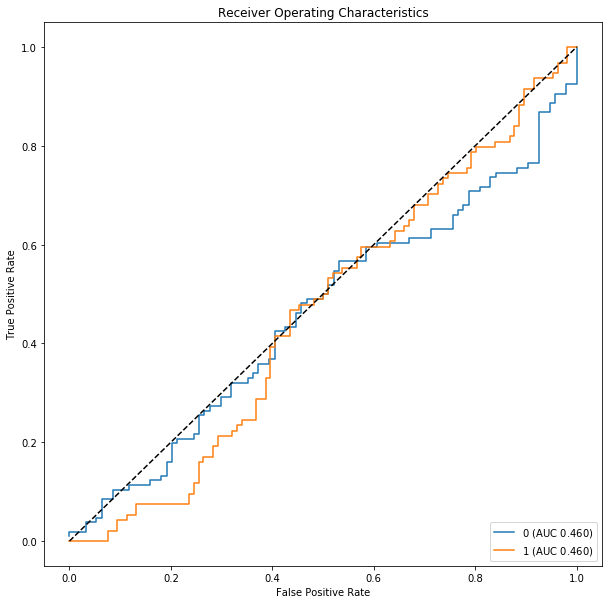

In [520]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_xor_9)

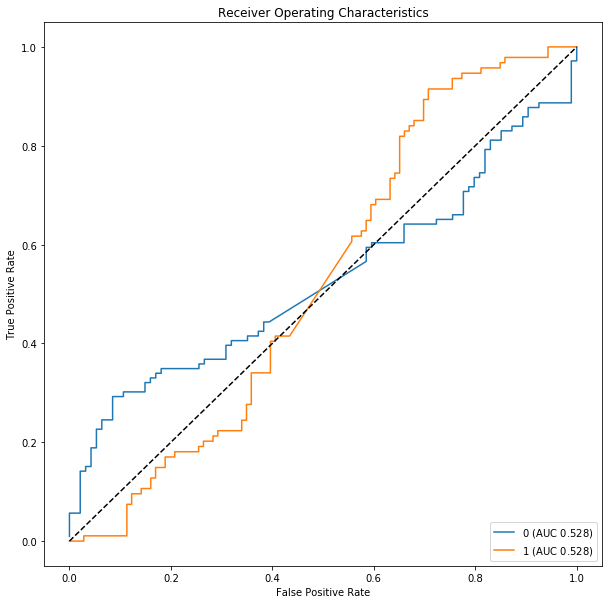

In [521]:
lucem_illud.plotMultiROC(clf_linear, dfTest_xor_9)

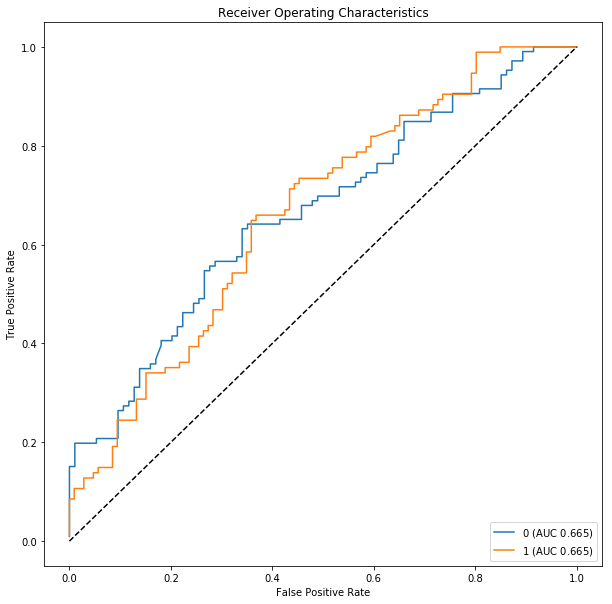

In [522]:
lucem_illud.plotMultiROC(clf_poly, dfTest_xor_9)

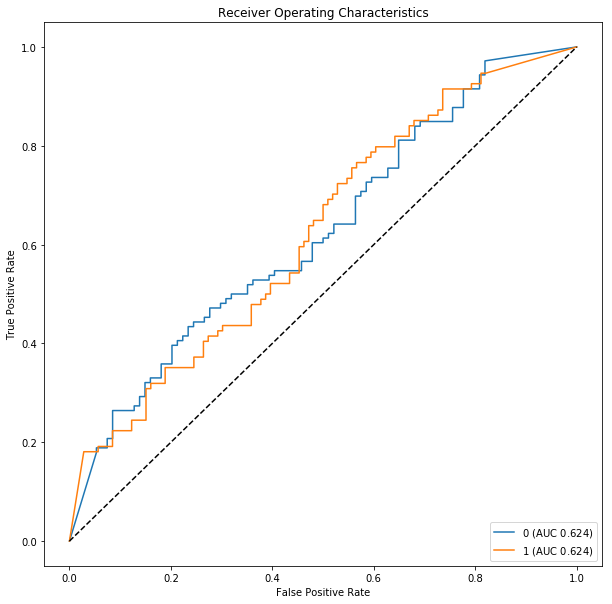

In [523]:
lucem_illud.plotMultiROC(clf_KN, dfTest_xor_9)

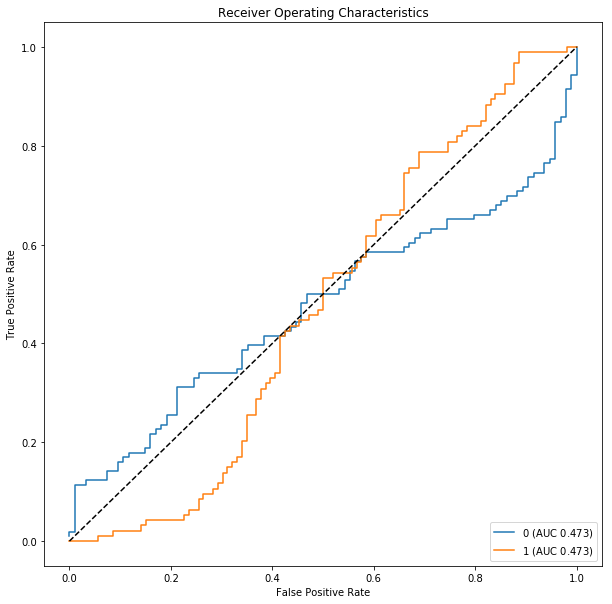

In [524]:
lucem_illud.plotMultiROC(clf_log, dfTest_xor_9)

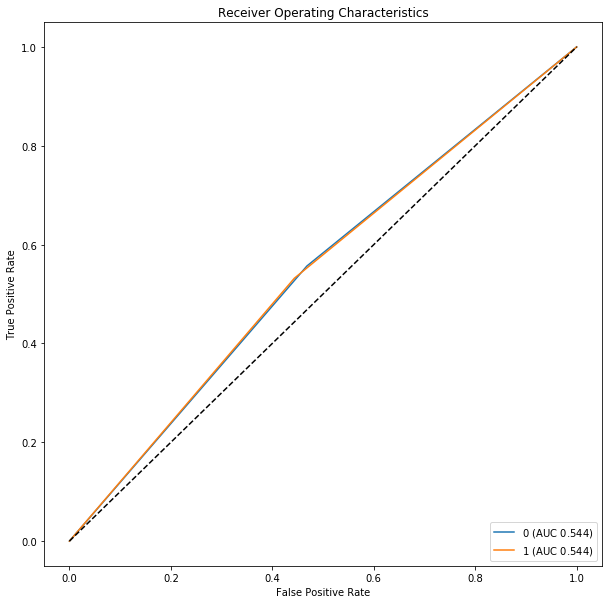

In [525]:
lucem_illud.plotMultiROC(clf_decison, dfTest_xor_9)

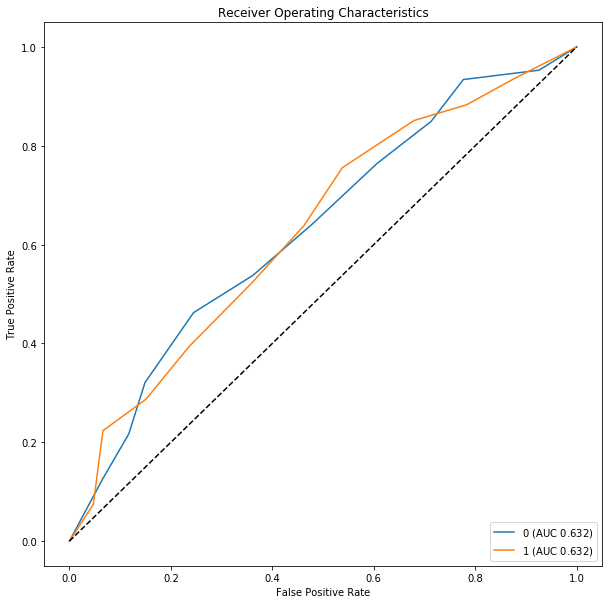

In [526]:
lucem_illud.plotMultiROC(clf_forest, dfTest_xor_9)

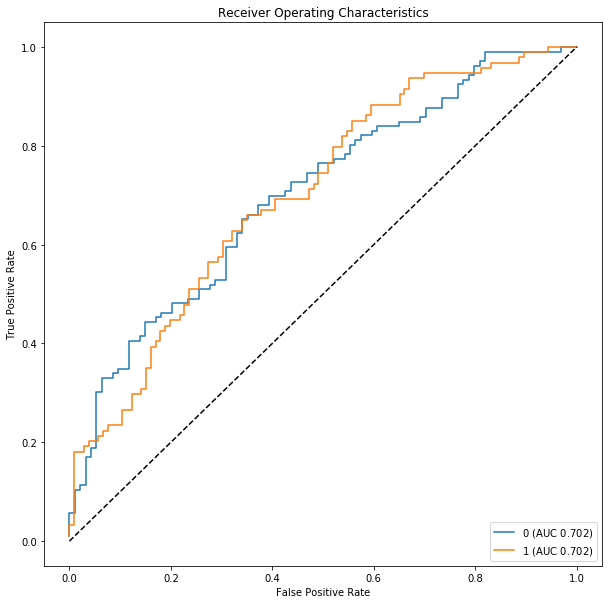

In [527]:
lucem_illud.plotMultiROC(clf_network, dfTest_xor_9)

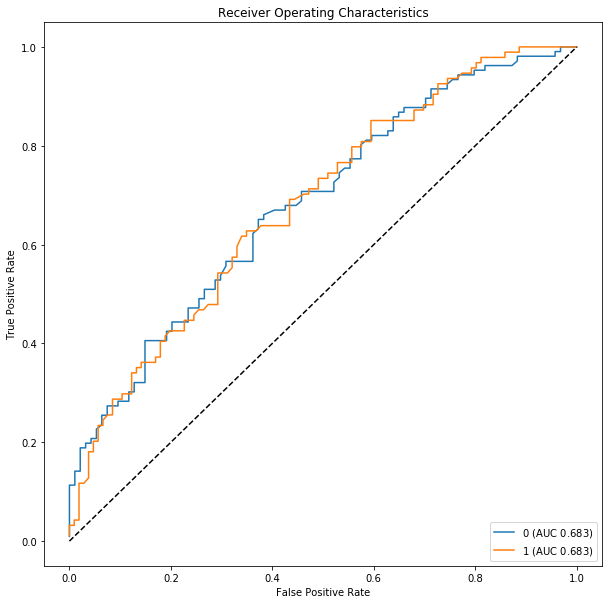

In [528]:
lucem_illud.plotMultiROC(clf_ensemble, dfTest_xor_9)

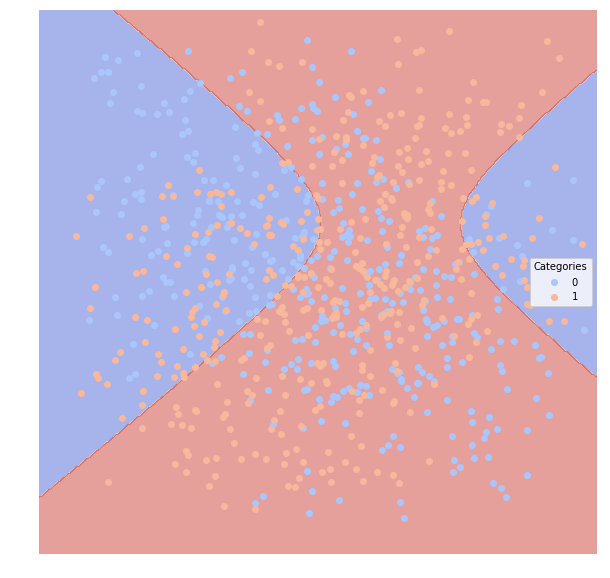

In [529]:
lucem_illud.plotregions(clf_bayes, dfTrain_xor_9)

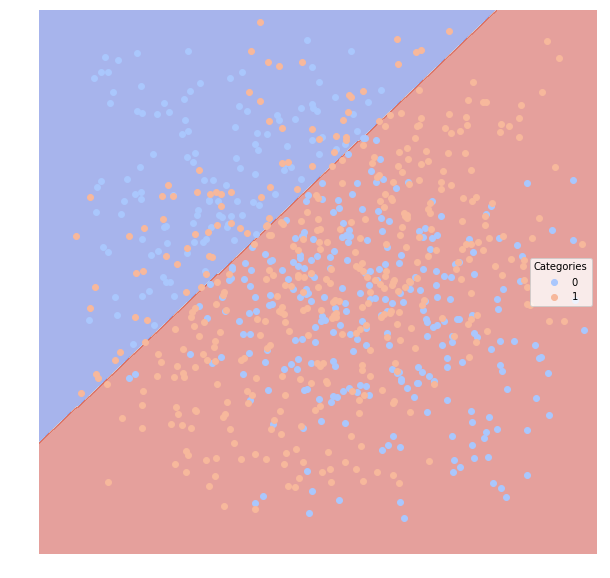

In [530]:
lucem_illud.plotregions(clf_linear, dfTrain_xor_9)

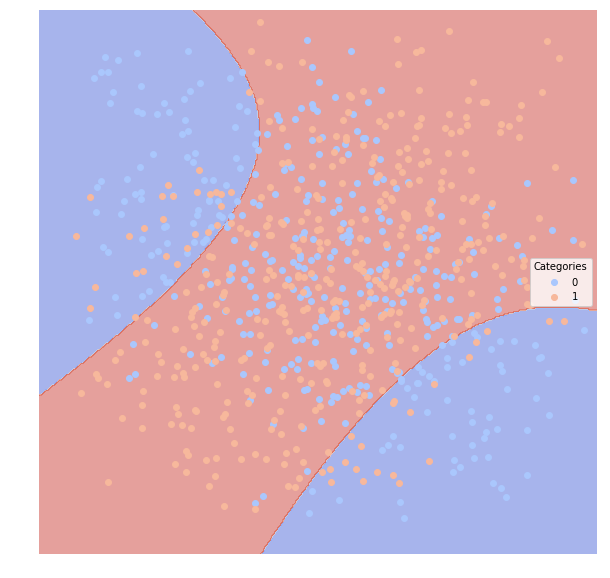

In [531]:
lucem_illud.plotregions(clf_poly, dfTrain_xor_9)

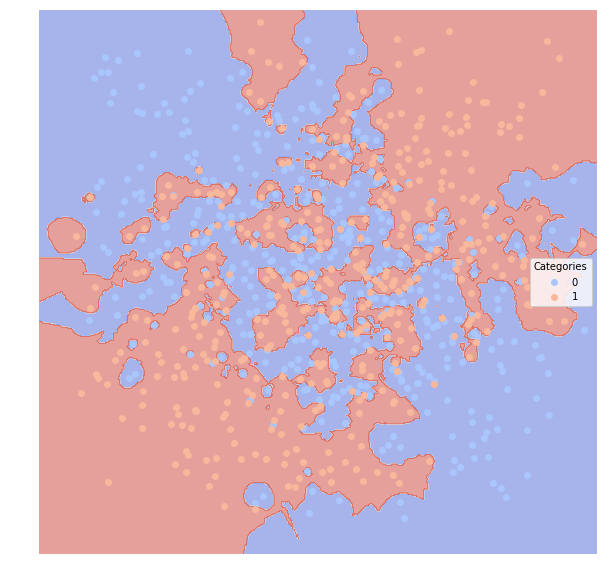

In [532]:
lucem_illud.plotregions(clf_KN, dfTrain_xor_9)

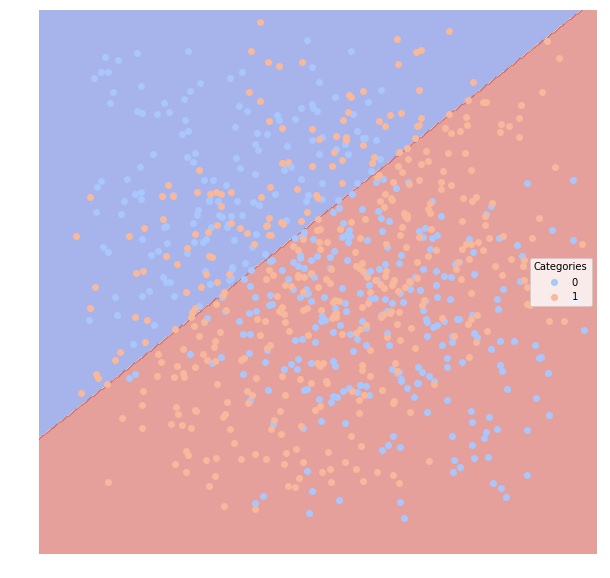

In [533]:
lucem_illud.plotregions(clf_log, dfTrain_xor_9)

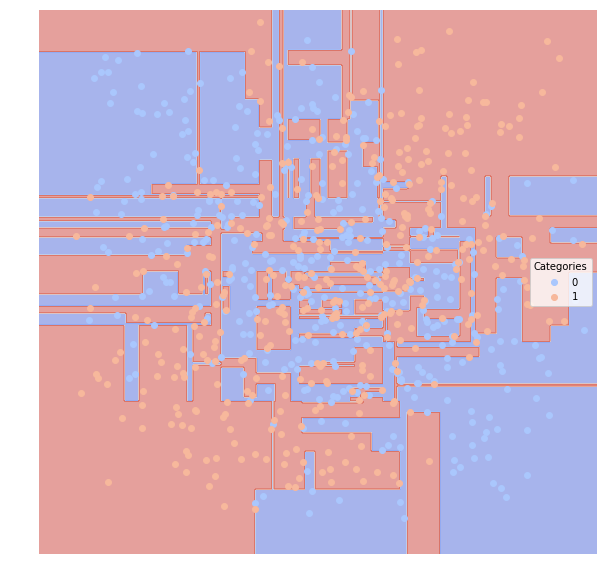

In [534]:
lucem_illud.plotregions(clf_decison, dfTrain_xor_9)

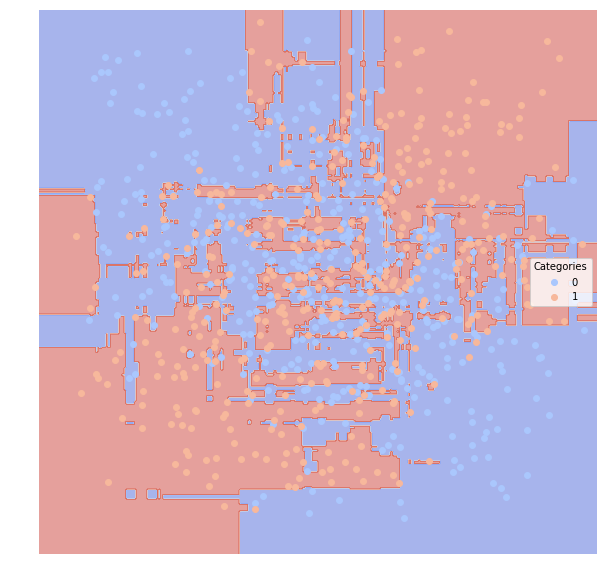

In [535]:
lucem_illud.plotregions(clf_forest, dfTrain_xor_9)

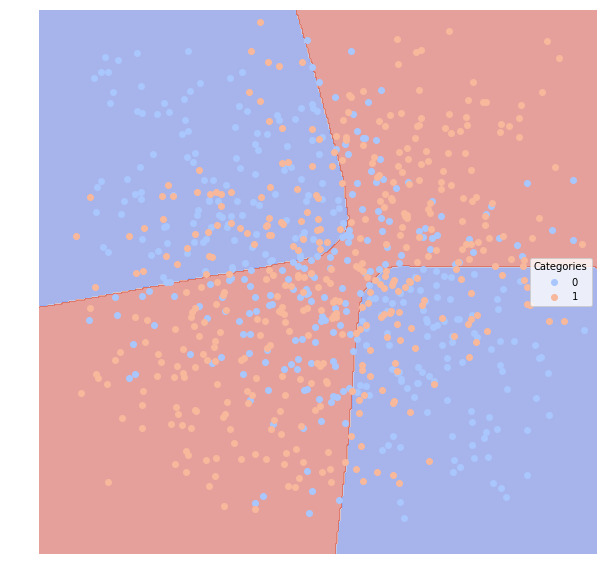

In [536]:
lucem_illud.plotregions(clf_network, dfTrain_xor_9)

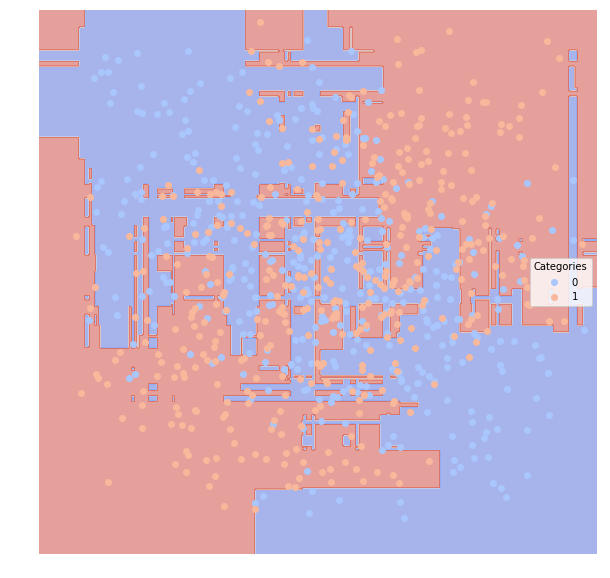

In [537]:
lucem_illud.plotregions(clf_ensemble, dfTrain_xor_9)

In [538]:
#xorSplit+linear+noise=0.5
clf_linear.fit(np.stack(dfTrain_xor_5['vect'], axis=0), dfTrain_xor_5['category'])

#xorSplit+Bayes+noise=0.5
clf_bayes.fit(np.stack(dfTrain_xor_5['vect'], axis=0), dfTrain_xor_5['category'])

#xorSplit+polynomial+noise=0.5
clf_poly.fit(np.stack(dfTrain_xor_5['vect'], axis=0), dfTrain_xor_5['category'])

#xorSplit+KNeighbors+noise=0.5
clf_KN.fit(np.stack(dfTrain_xor_5['vect'], axis=0), dfTrain_xor_5['category'])

#xorSplit+logistics+noise=0.5
clf_log.fit(np.stack(dfTrain_xor_5['vect'], axis=0), dfTrain_xor_5['category'])

#xorSplit+decisiontree+noise=0.5
clf_decison.fit(np.stack(dfTrain_xor_5['vect'], axis=0), dfTrain_xor_5['category'])

#xorSplit+randomforests+noise=0.5
clf_forest.fit(np.stack(dfTrain_xor_5['vect'], axis=0), dfTrain_xor_5['category'])

#xorSplit+connectionist+noise=0.5
clf_network.fit(np.stack(dfTrain_xor_5['vect'], axis=0), dfTrain_xor_5['category'])

#xorSplit+ensemble+noise=0.5
clf_ensemble.fit(np.stack(dfTrain_xor_5['vect'], axis=0), dfTrain_xor_5['category'])

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [539]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_xor_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.494699,0.492380,0.505,0.489362,0.464646
1,0.494699,0.502376,0.505,0.500000,0.524752


In [540]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_xor_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.673017,0.631886,0.325,0.783333,0.474747
1,0.673017,0.612666,0.325,0.628571,0.871287


In [269]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_xor_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.769877,0.705754,0.23,0.773196,0.757576
1,0.769877,0.709923,0.23,0.766990,0.782178


In [270]:
lucem_illud.evaluateClassifier(clf_log, dfTest_xor_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.450745,0.472505,0.55,0.452174,0.525253
1,0.450745,0.483200,0.55,0.447059,0.376238


In [271]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_xor_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.714721,0.651884,0.285,0.723404,0.686869
1,0.714721,0.655406,0.285,0.707547,0.742574


In [272]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_xor_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.754725,0.692060,0.245,0.765957,0.727273
1,0.754725,0.692944,0.245,0.745283,0.782178


In [273]:
lucem_illud.evaluateClassifier(clf_network, dfTest_xor_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.734623,0.672727,0.265,0.750000,0.696970
1,0.734623,0.672756,0.265,0.722222,0.772277


In [274]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_xor_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.729873,0.664940,0.27,0.731959,0.717172
1,0.729873,0.670709,0.27,0.728155,0.742574


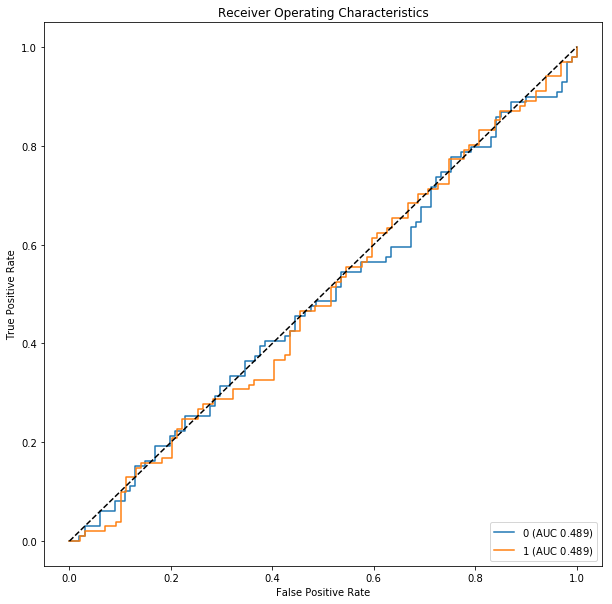

In [275]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_xor_5)

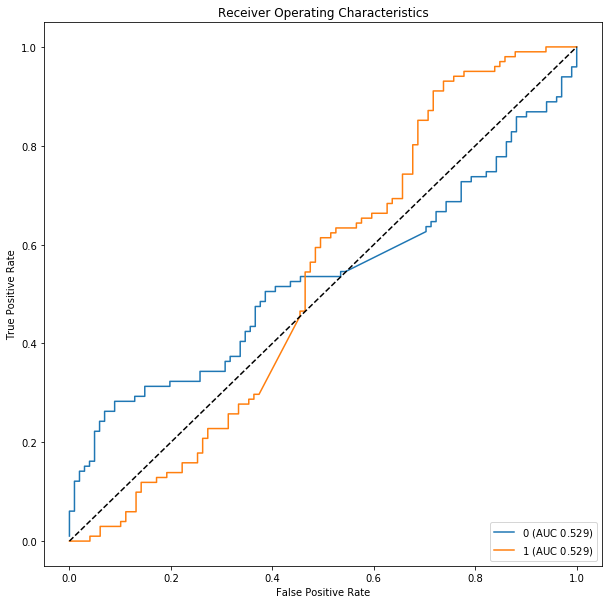

In [276]:
lucem_illud.plotMultiROC(clf_linear,dfTest_xor_5)

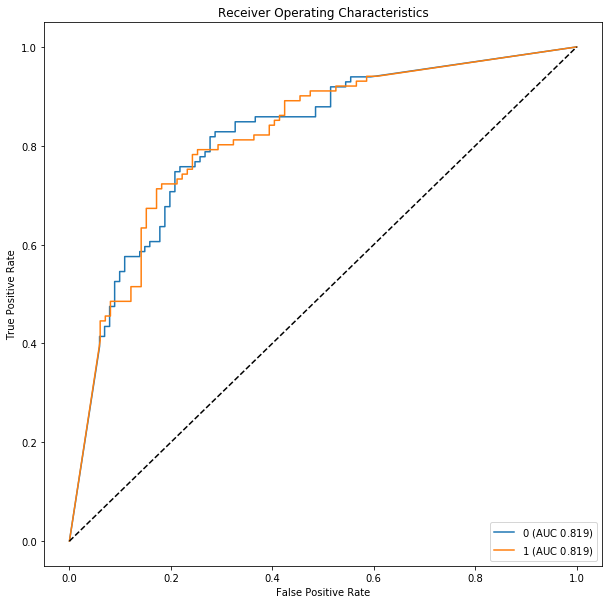

In [277]:
lucem_illud.plotMultiROC(clf_KN,dfTest_xor_5)

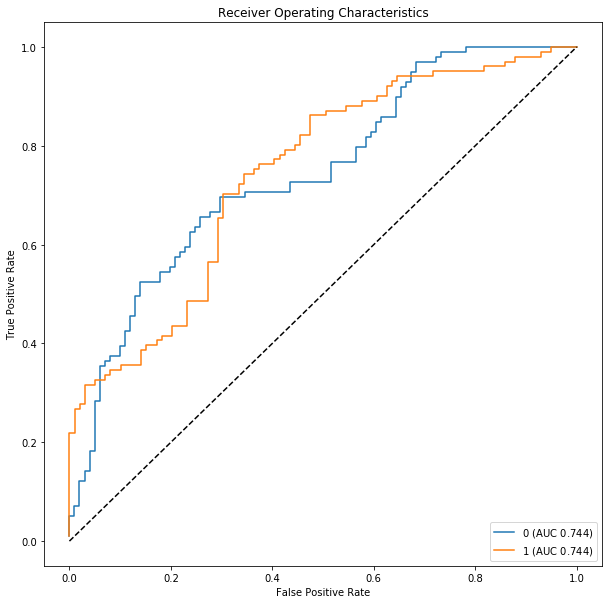

In [278]:
lucem_illud.plotMultiROC(clf_poly, dfTest_xor_5)

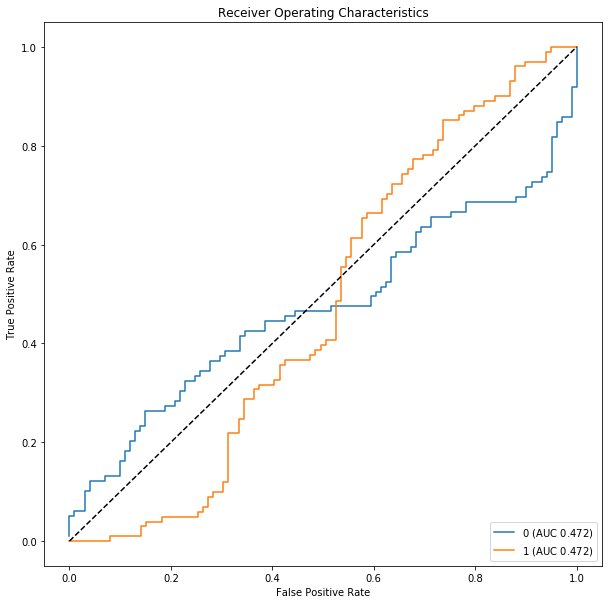

In [279]:
lucem_illud.plotMultiROC(clf_log, dfTest_xor_5)

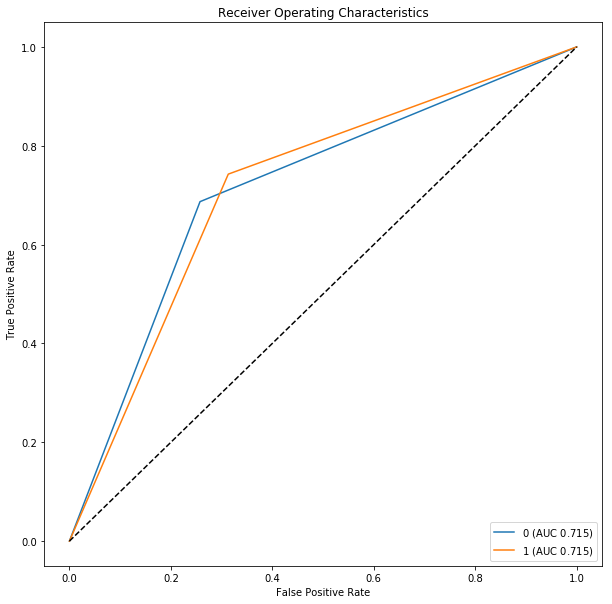

In [280]:
lucem_illud.plotMultiROC(clf_decison, dfTest_xor_5)

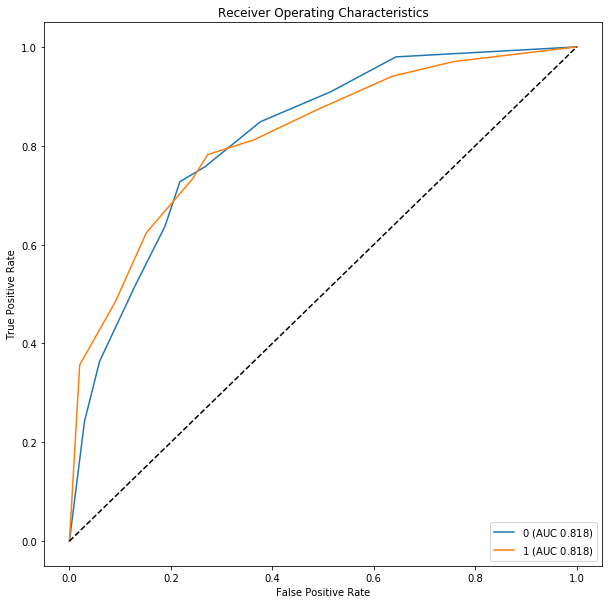

In [281]:
lucem_illud.plotMultiROC(clf_forest, dfTest_xor_5)

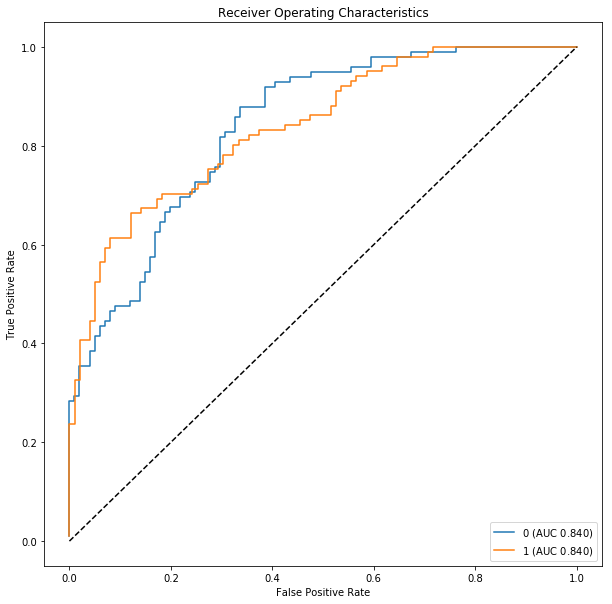

In [282]:
lucem_illud.plotMultiROC(clf_network, dfTest_xor_5)

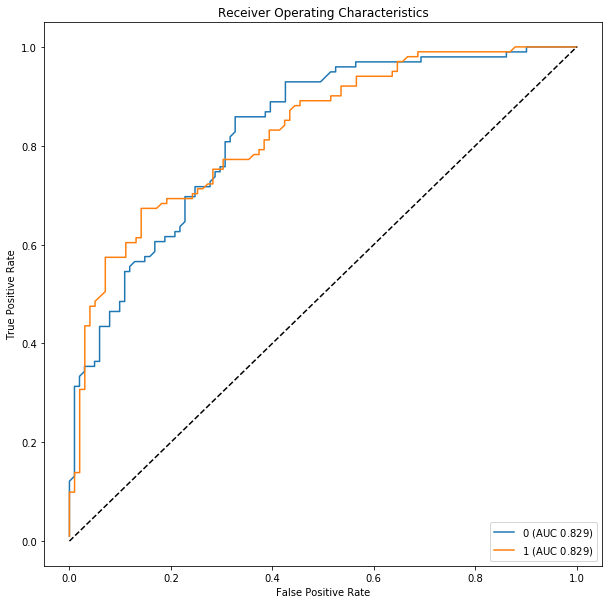

In [283]:
lucem_illud.plotMultiROC(clf_ensemble, dfTest_xor_5)

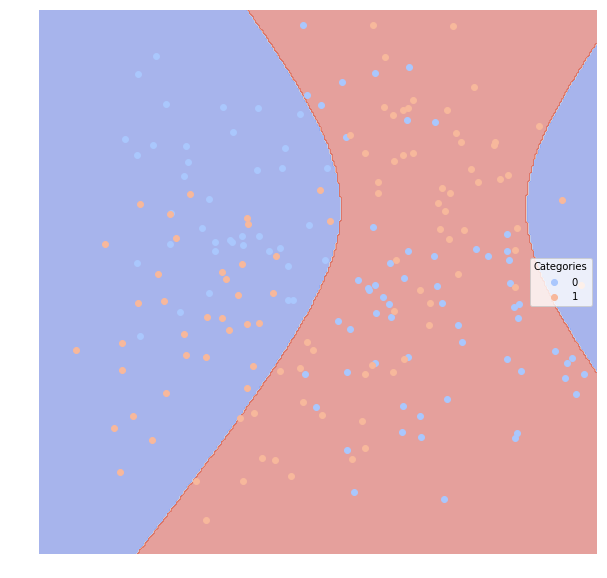

In [284]:
lucem_illud.plotregions(clf_bayes,dfTest_xor_5)

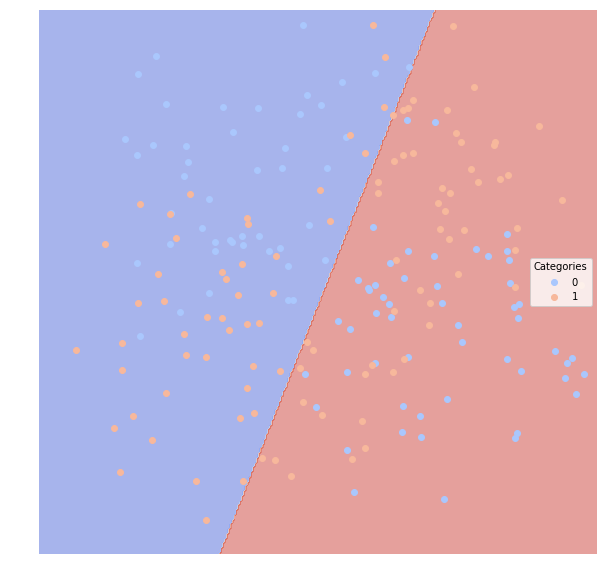

In [285]:
lucem_illud.plotregions(clf_linear, dfTest_xor_5)

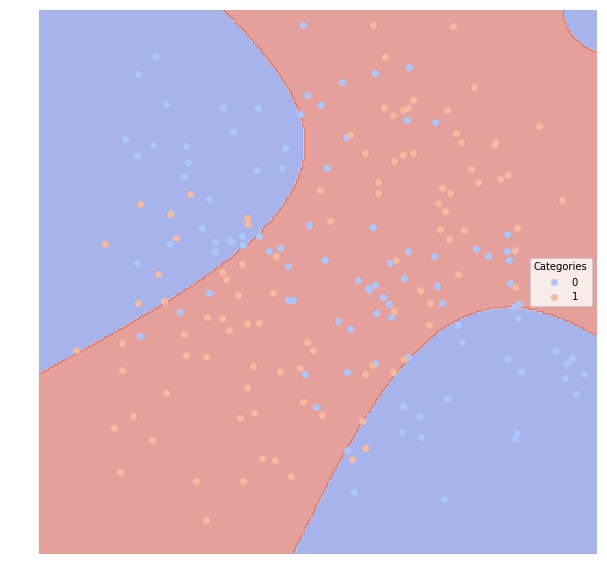

In [286]:
lucem_illud.plotregions(clf_poly, dfTest_xor_5)

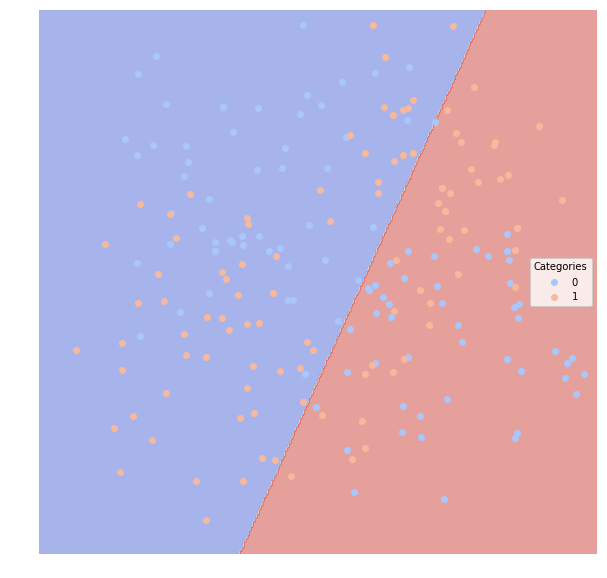

In [287]:
lucem_illud.plotregions(clf_log, dfTest_xor_5)

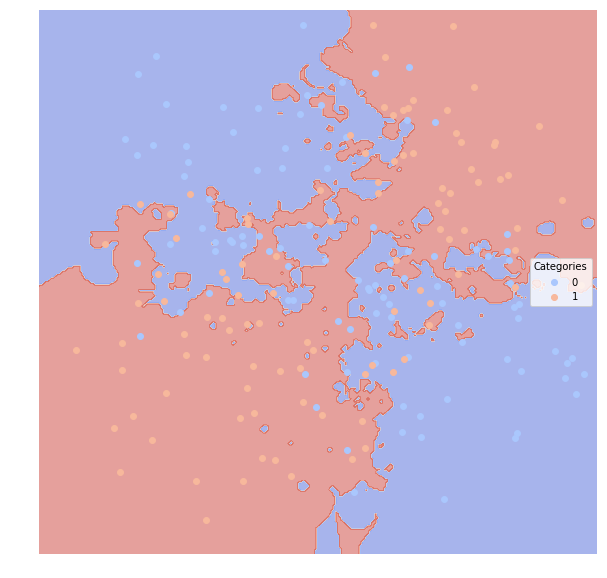

In [288]:
lucem_illud.plotregions(clf_KN, dfTest_xor_5)

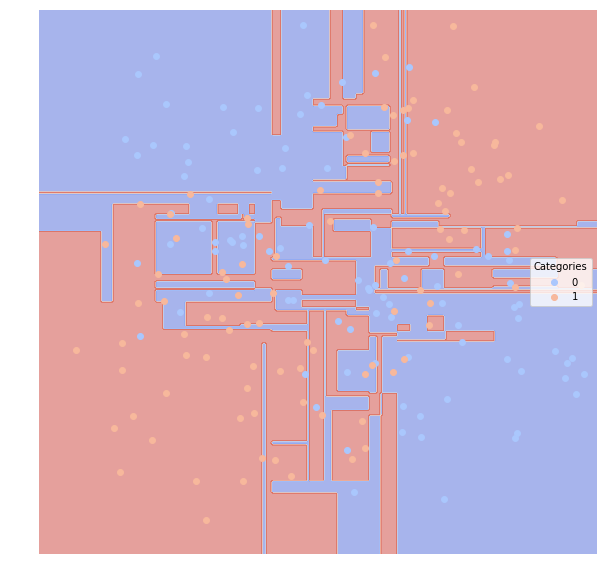

In [289]:
lucem_illud.plotregions(clf_decison, dfTest_xor_5)

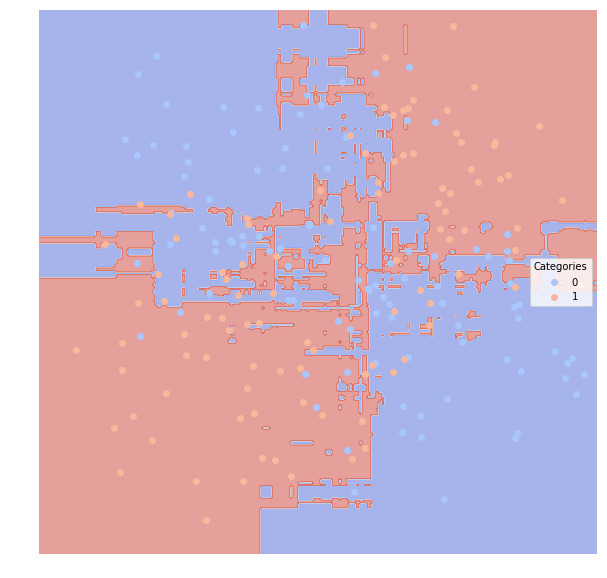

In [290]:
lucem_illud.plotregions(clf_forest, dfTest_xor_5)

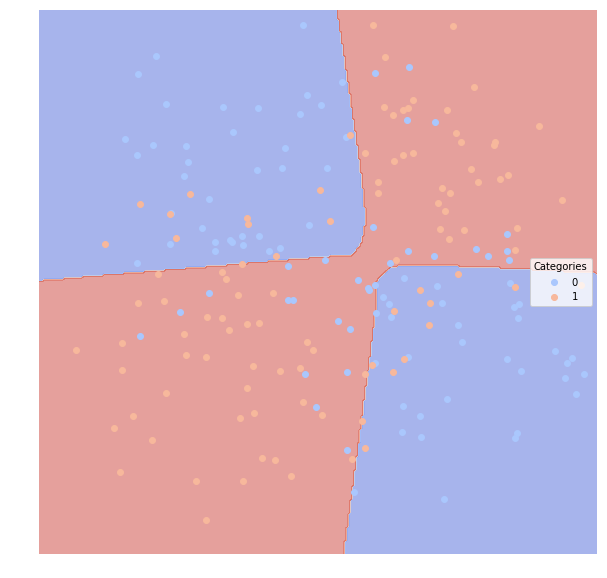

In [291]:
lucem_illud.plotregions(clf_network, dfTest_xor_5)

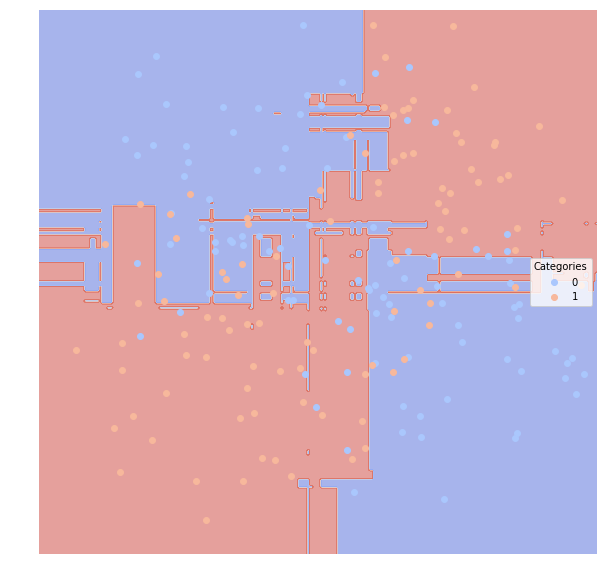

In [292]:
lucem_illud.plotregions(clf_ensemble, dfTest_xor_5)

In [293]:
#andSplit+Linear+noise=0.2
clf_linear.fit(np.stack(dfTrain_and['vect'], axis=0), dfTrain_and['category'])

#andSplit+Bayes+noise=0.2
clf_bayes.fit(np.stack(dfTrain_and['vect'], axis=0), dfTrain_and['category'])

#andSplit+polynomial+noise=0.2
clf_poly.fit(np.stack(dfTrain_and['vect'], axis=0), dfTrain_and['category'])

#andSplit+KNeighbors=+noise=0.2
clf_KN.fit(np.stack(dfTrain_and['vect'], axis=0), dfTrain_and['category'])

#andSplit+logistics+noise=0.2
clf_log.fit(np.stack(dfTrain_and['vect'], axis=0), dfTrain_and['category'])

#andSplit+Decisiontree+noise=0.2
clf_decison.fit(np.stack(dfTrain_and['vect'], axis=0), dfTrain_and['category'])

#andSplit+randomforest+noise=0.2
clf_forest.fit(np.stack(dfTrain_and['vect'], axis=0), dfTrain_and['category'])

#andSplit+connectionist+noise=0.2
clf_network.fit(np.stack(dfTrain_and['vect'], axis=0), dfTrain_and['category'])

#andSplit+ensemble+noise=0.2
clf_ensemble.fit(np.stack(dfTrain_and['vect'], axis=0), dfTrain_and['category'])

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [294]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_and)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.90021,0.851415,0.1,0.888889,0.907216
1,0.90021,0.868611,0.1,0.910891,0.893204


In [295]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_and)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.910219,0.864846,0.09,0.898990,0.917526
1,0.910219,0.881395,0.09,0.920792,0.902913


In [296]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_and)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.892353,0.879021,0.105,0.975000,0.804124
1,0.892353,0.835324,0.105,0.841667,0.980583


In [297]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_and)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.915074,0.873263,0.085,0.908163,0.917526
1,0.915074,0.886043,0.085,0.921569,0.912621


In [298]:
lucem_illud.evaluateClassifier(clf_log, dfTest_and)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.90051,0.848513,0.1,0.881188,0.917526
1,0.90051,0.872102,0.1,0.919192,0.883495


In [299]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_and)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.89991,0.854443,0.1,0.896907,0.896907
1,0.89991,0.865251,0.1,0.902913,0.902913


In [300]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_and)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.920228,0.878486,0.08,0.909091,0.927835
1,0.920228,0.894370,0.08,0.930693,0.912621


In [301]:
lucem_illud.evaluateClassifier(clf_network, dfTest_and)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.910519,0.861784,0.09,0.891089,0.927835
1,0.910519,0.885048,0.09,0.929293,0.893204


In [302]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_and)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.914473,0.880116,0.085,0.925532,0.896907
1,0.914473,0.879111,0.085,0.905660,0.932039


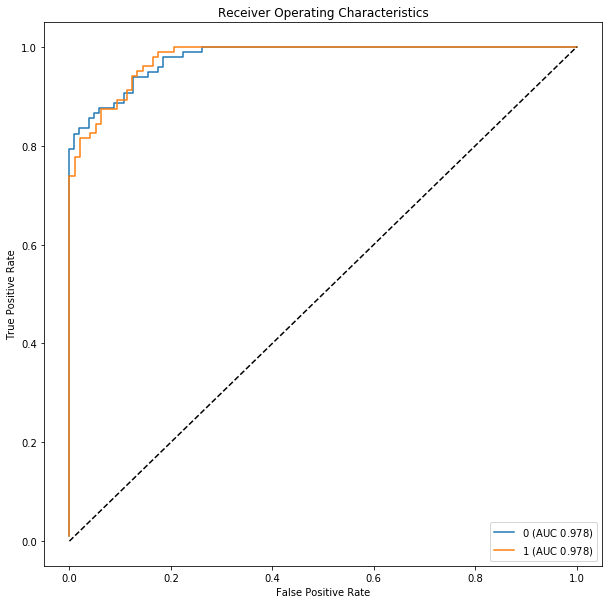

In [303]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_and)

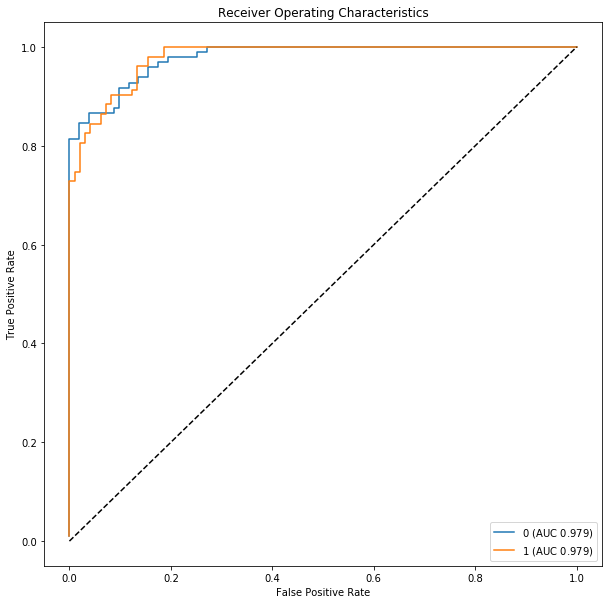

In [304]:
lucem_illud.plotMultiROC(clf_linear, dfTest_and)

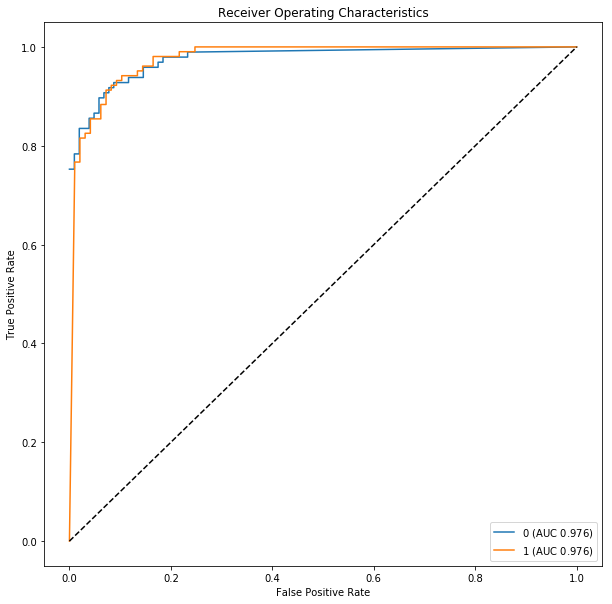

In [305]:
lucem_illud.plotMultiROC(clf_KN, dfTest_and)

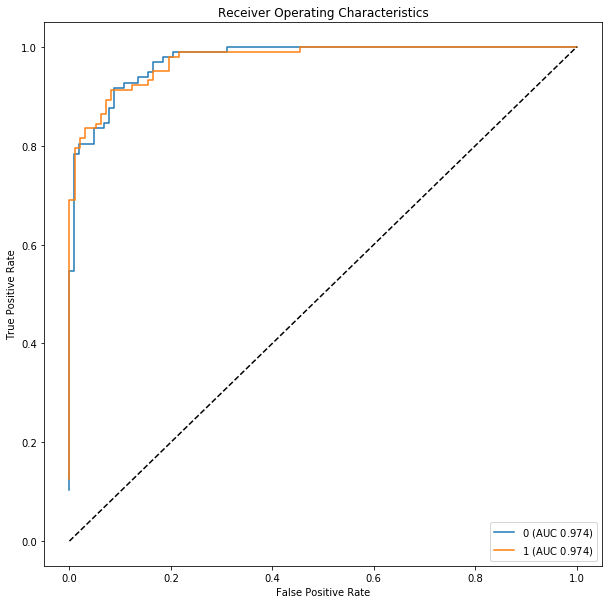

In [306]:
lucem_illud.plotMultiROC(clf_poly, dfTest_and)

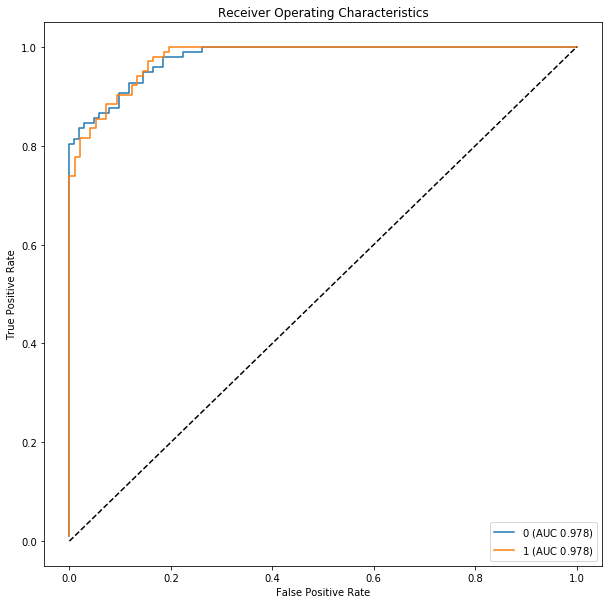

In [307]:
lucem_illud.plotMultiROC(clf_log, dfTest_and)

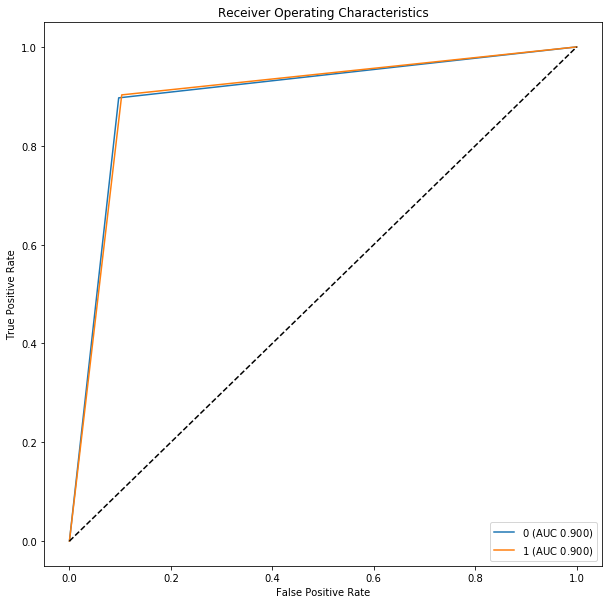

In [308]:
lucem_illud.plotMultiROC(clf_decison, dfTest_and)

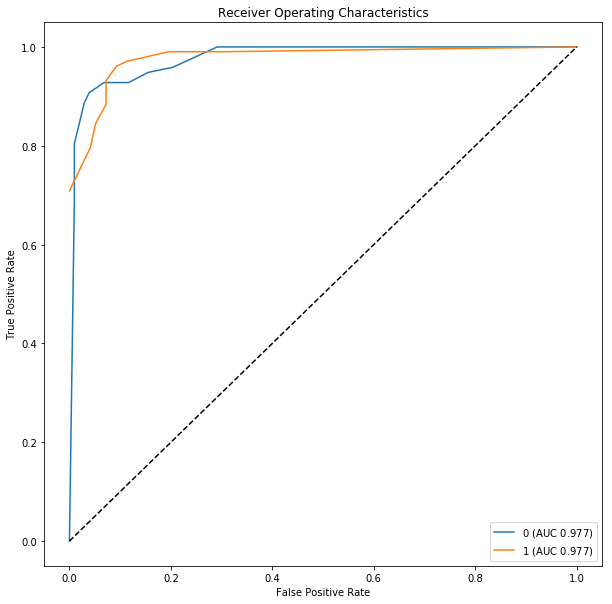

In [309]:
lucem_illud.plotMultiROC(clf_forest, dfTest_and)

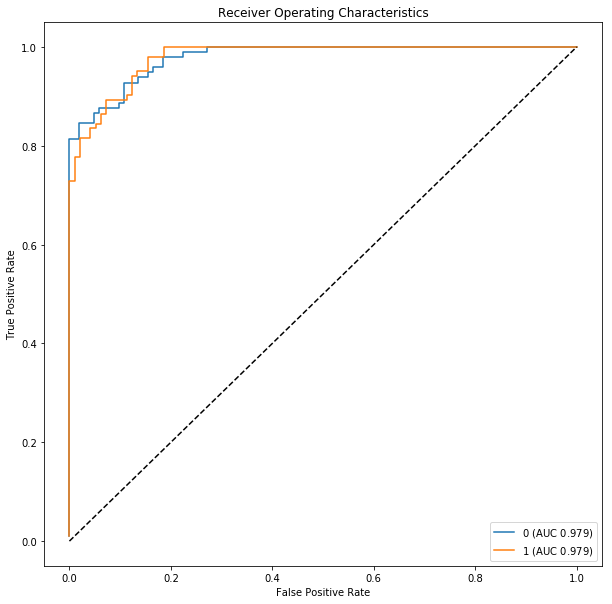

In [310]:
lucem_illud.plotMultiROC(clf_network, dfTest_and)

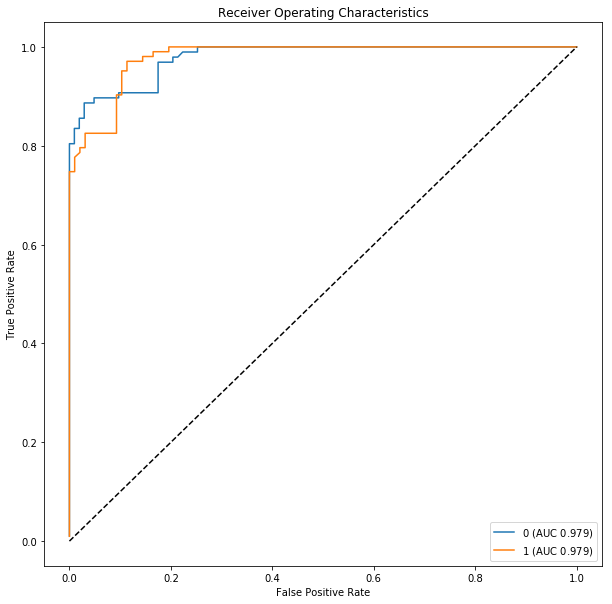

In [311]:
lucem_illud.plotMultiROC(clf_ensemble, dfTest_and)

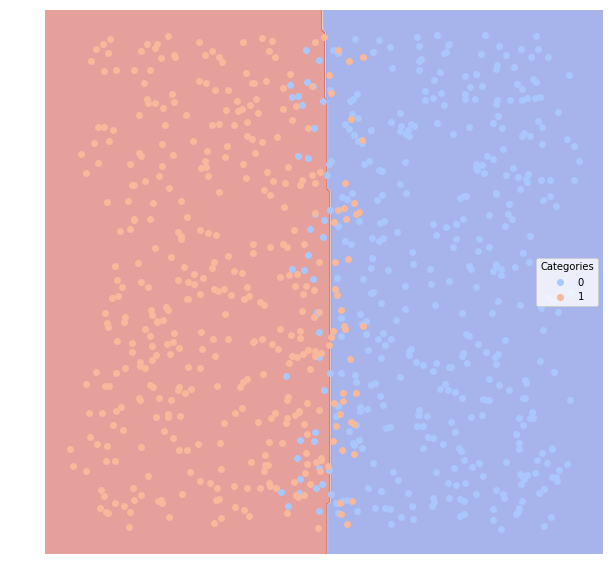

In [312]:
lucem_illud.plotregions(clf_bayes, dfTrain_and)

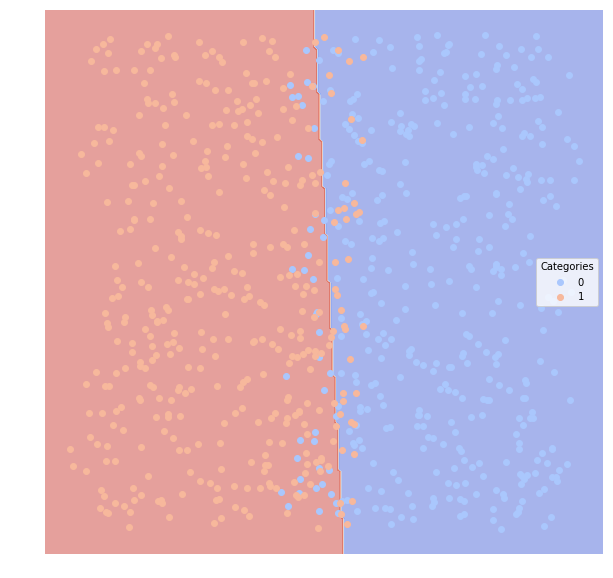

In [313]:
lucem_illud.plotregions(clf_linear, dfTrain_and)

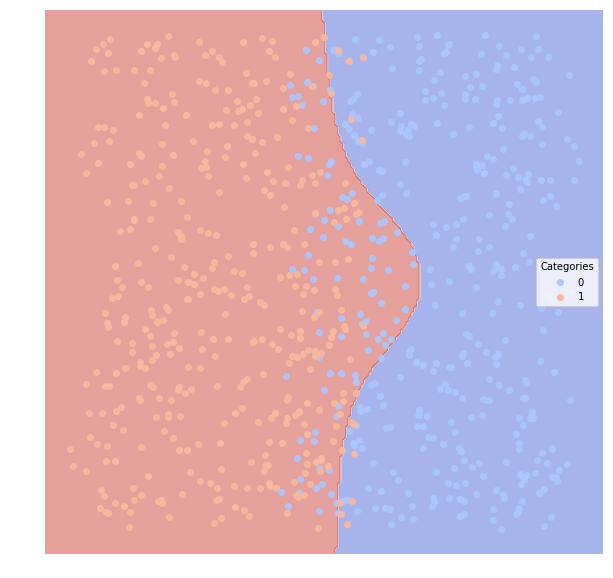

In [314]:
lucem_illud.plotregions(clf_poly, dfTrain_and)

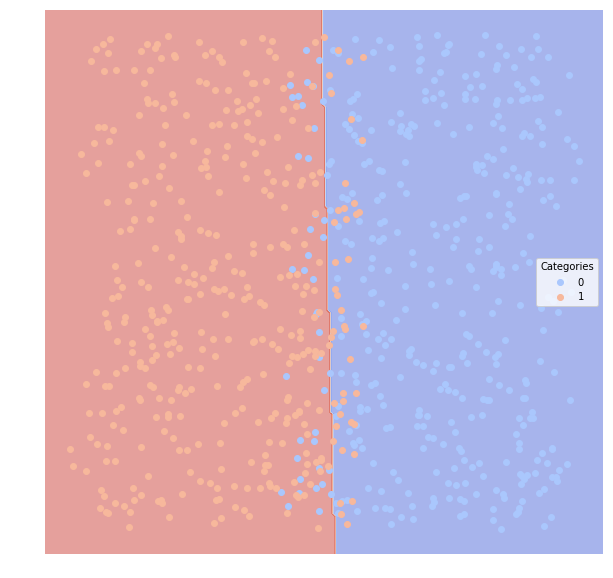

In [315]:
lucem_illud.plotregions(clf_log, dfTrain_and)

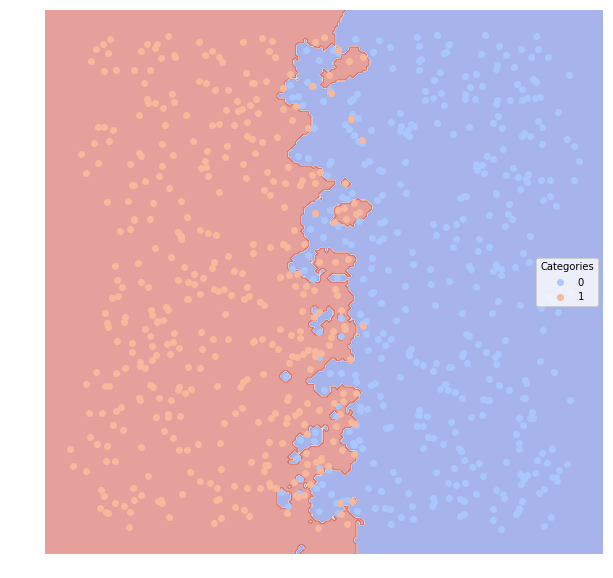

In [316]:
lucem_illud.plotregions(clf_KN, dfTrain_and)

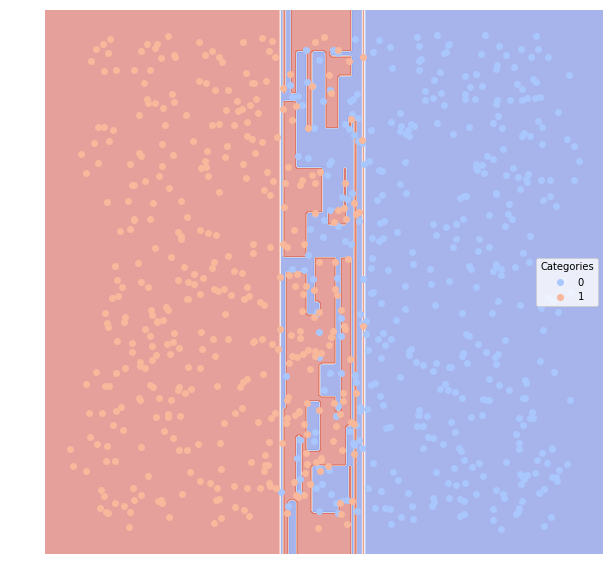

In [317]:
lucem_illud.plotregions(clf_decison, dfTrain_and)

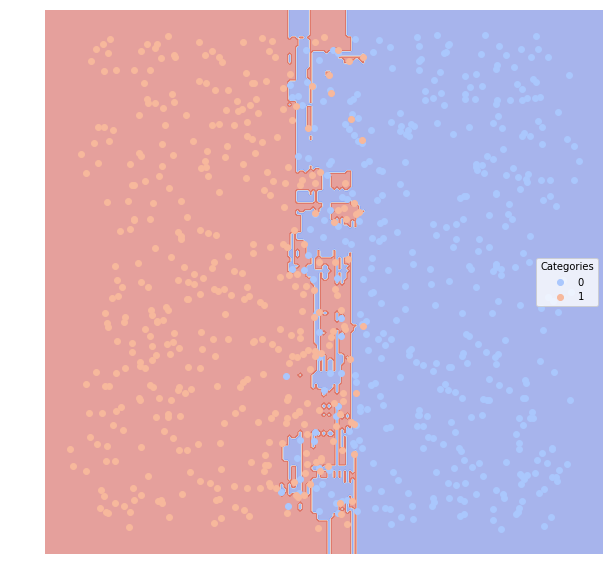

In [318]:
lucem_illud.plotregions(clf_forest, dfTrain_and)

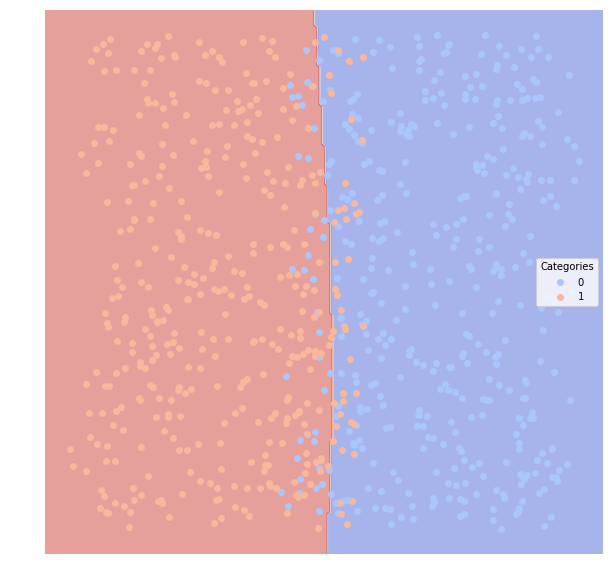

In [319]:
lucem_illud.plotregions(clf_network, dfTrain_and)

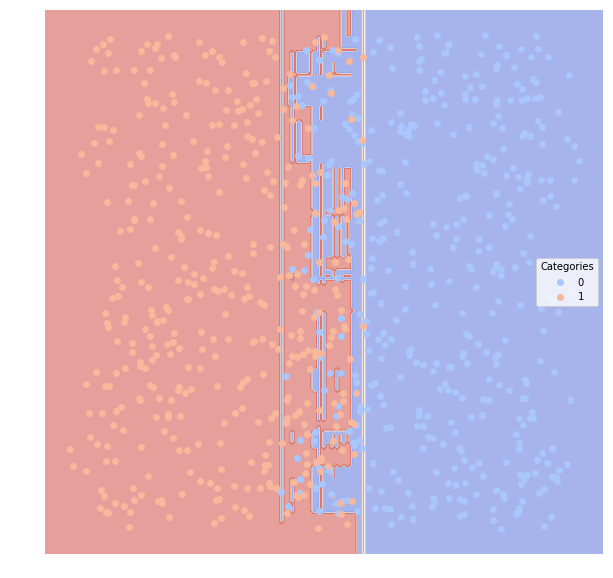

In [320]:
lucem_illud.plotregions(clf_ensemble, dfTrain_and)

In [321]:
#andSplit+Linear+noise=0.5
clf_linear.fit(np.stack(dfTrain_and_5['vect'], axis=0), dfTrain_and_5['category'])

#andSplit+Bayes+noise=0.5
clf_bayes.fit(np.stack(dfTrain_and_5['vect'], axis=0), dfTrain_and_5['category'])

#andSplit+polynomial+noise=0.5
clf_poly.fit(np.stack(dfTrain_and_5['vect'], axis=0), dfTrain_and_5['category'])

#andSplit+KNeighbors=+noise=0.5
clf_KN.fit(np.stack(dfTrain_and_5['vect'], axis=0), dfTrain_and_5['category'])

#andSplit+logistics+noise=0.5
clf_log.fit(np.stack(dfTrain_and_5['vect'], axis=0), dfTrain_and_5['category'])

#andSplit+Decisiontree+noise=0.5
clf_decison.fit(np.stack(dfTrain_and_5['vect'], axis=0), dfTrain_and_5['category'])

#andSplit+randomforest+noise=0.5
clf_forest.fit(np.stack(dfTrain_and_5['vect'], axis=0), dfTrain_and_5['category'])

#andSplit+connectionist+noise=0.5
clf_network.fit(np.stack(dfTrain_and_5['vect'], axis=0), dfTrain_and_5['category'])

#andSplit+ensemble+noise=0.5
clf_ensemble.fit(np.stack(dfTrain_and_5['vect'], axis=0), dfTrain_and_5['category'])

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [322]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_and_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.750805,0.653478,0.25,0.714286,0.760870
1,0.750805,0.720973,0.25,0.784314,0.740741


In [323]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_and_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.75161,0.652935,0.25,0.71,0.771739
1,0.75161,0.722870,0.25,0.79,0.731481


In [324]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_and_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.761071,0.655591,0.245,0.693694,0.836957
1,0.761071,0.739705,0.245,0.831461,0.685185


In [325]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_and_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.684984,0.589756,0.315,0.649485,0.684783
1,0.684984,0.662269,0.315,0.718447,0.685185


In [326]:
lucem_illud.evaluateClassifier(clf_log, dfTest_and_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.75161,0.652935,0.25,0.71,0.771739
1,0.75161,0.722870,0.25,0.79,0.731481


In [327]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_and_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.671095,0.576413,0.33,0.63,0.684783
1,0.671095,0.651759,0.33,0.71,0.657407


In [328]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_and_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.708333,0.607857,0.295,0.657143,0.750000
1,0.708333,0.685263,0.295,0.757895,0.666667


In [329]:
lucem_illud.evaluateClassifier(clf_network, dfTest_and_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.75161,0.652935,0.25,0.71,0.771739
1,0.75161,0.722870,0.25,0.79,0.731481


In [330]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_and_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.728261,0.634173,0.27,0.706522,0.706522
1,0.728261,0.697500,0.27,0.750000,0.750000


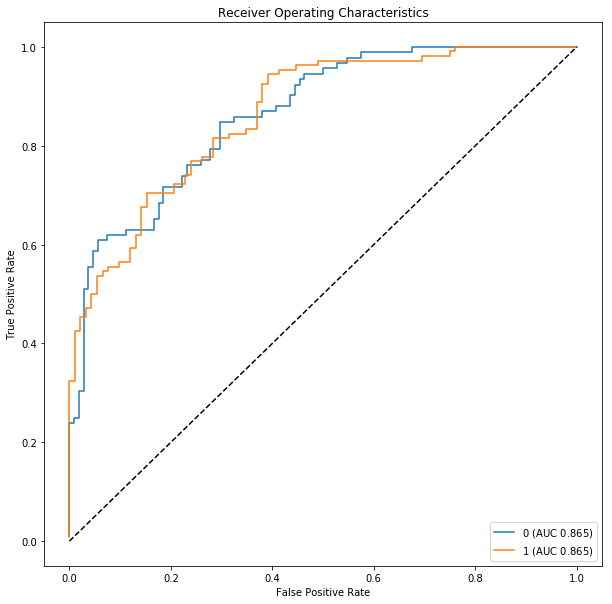

In [331]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_and_5)

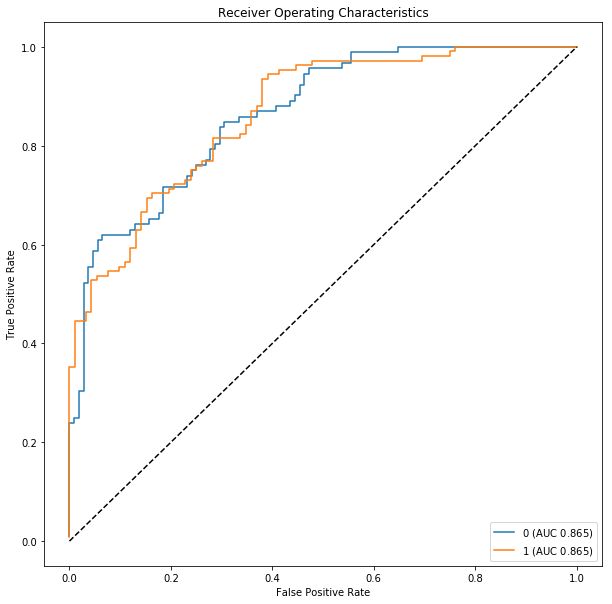

In [332]:
lucem_illud.plotMultiROC(clf_linear, dfTest_and_5)

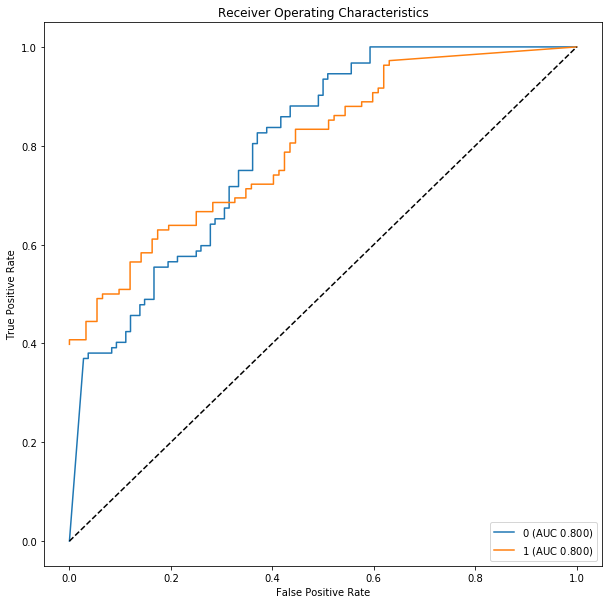

In [333]:
lucem_illud.plotMultiROC(clf_KN, dfTest_and_5)

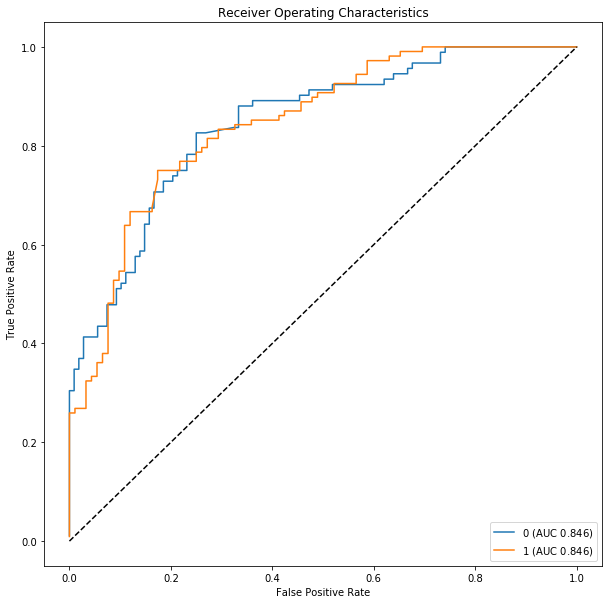

In [334]:
lucem_illud.plotMultiROC(clf_poly, dfTest_and_5)

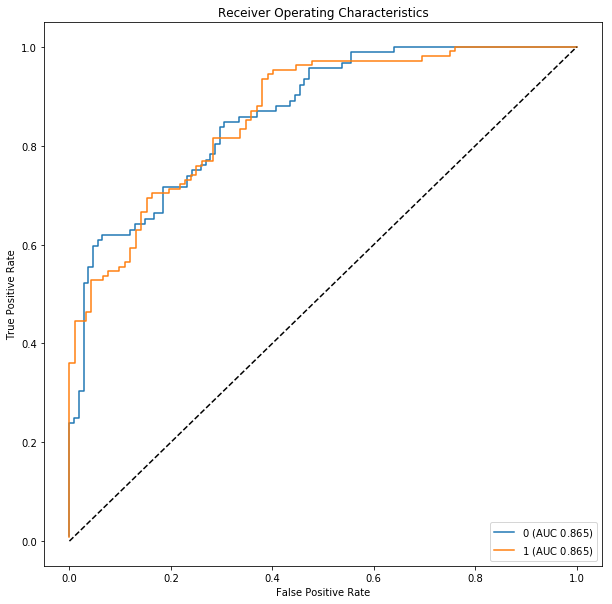

In [335]:
lucem_illud.plotMultiROC(clf_log, dfTest_and_5)

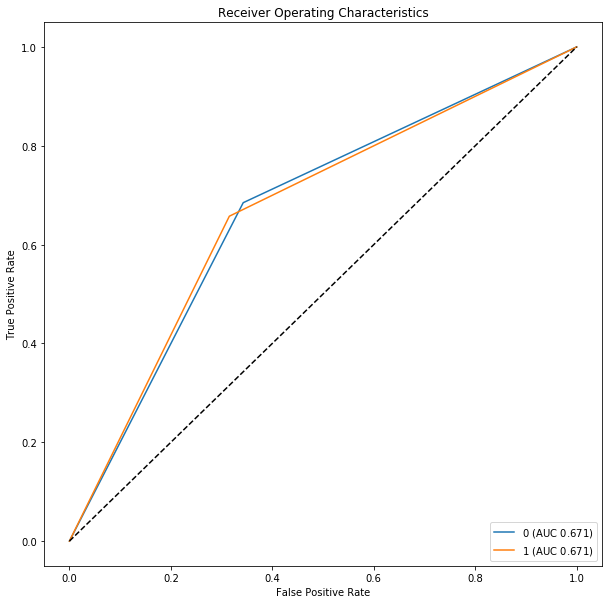

In [336]:
lucem_illud.plotMultiROC(clf_decison, dfTest_and_5)

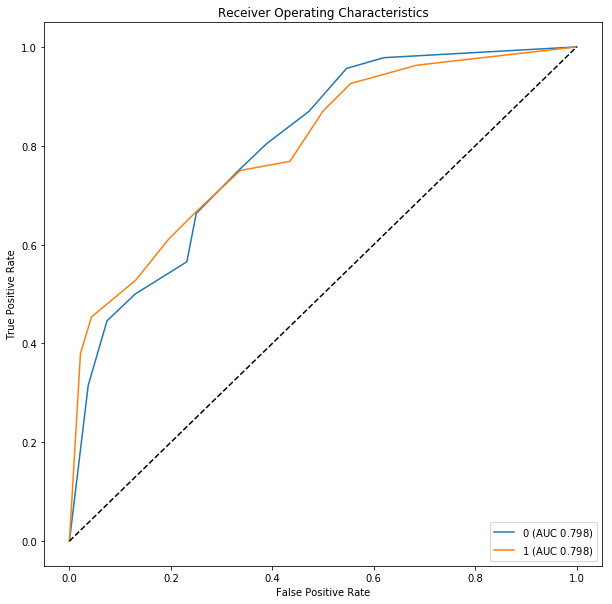

In [337]:
lucem_illud.plotMultiROC(clf_forest, dfTest_and_5)

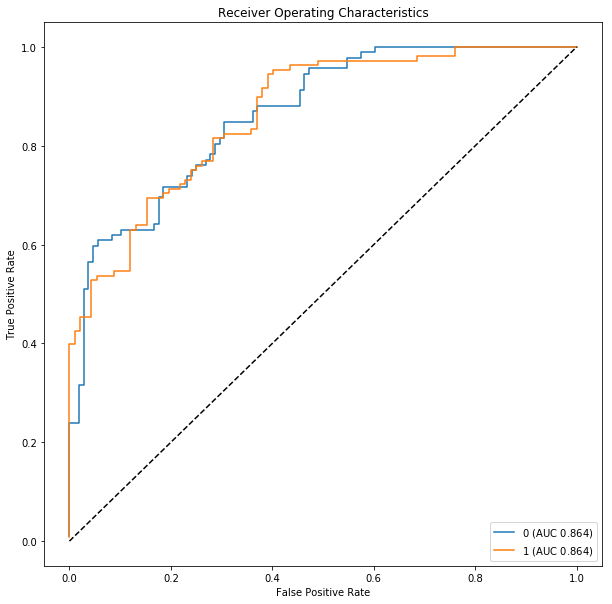

In [338]:
lucem_illud.plotMultiROC(clf_network, dfTest_and_5)

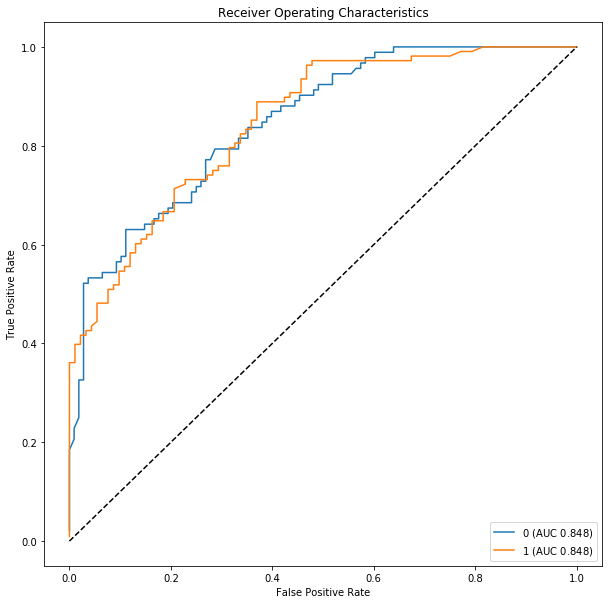

In [339]:
lucem_illud.plotMultiROC(clf_ensemble, dfTest_and_5)

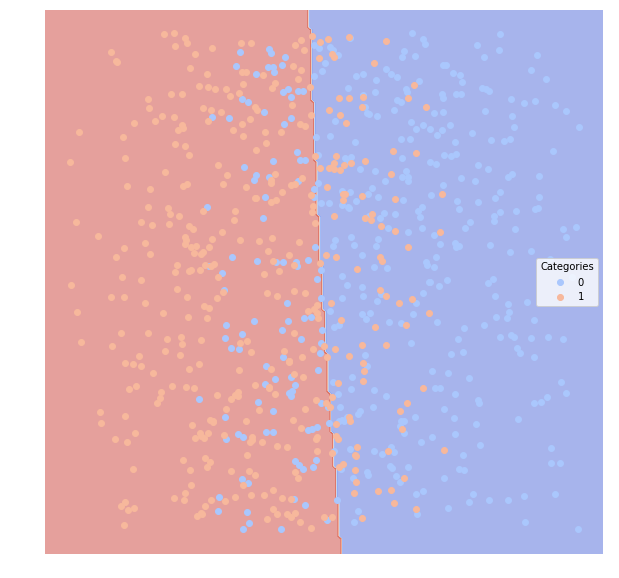

In [340]:
lucem_illud.plotregions(clf_bayes, dfTrain_and_5)

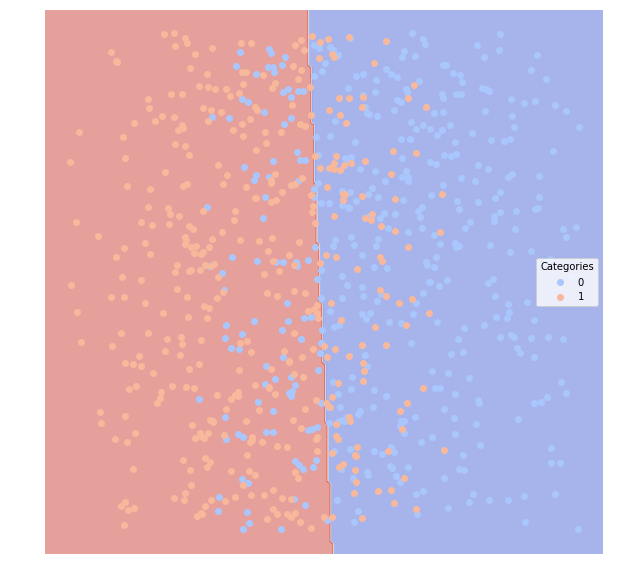

In [341]:
lucem_illud.plotregions(clf_linear, dfTrain_and_5)

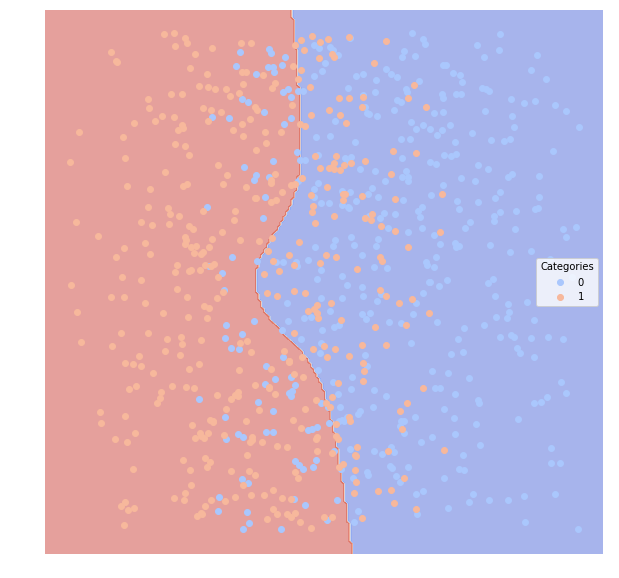

In [342]:
lucem_illud.plotregions(clf_poly, dfTrain_and_5)

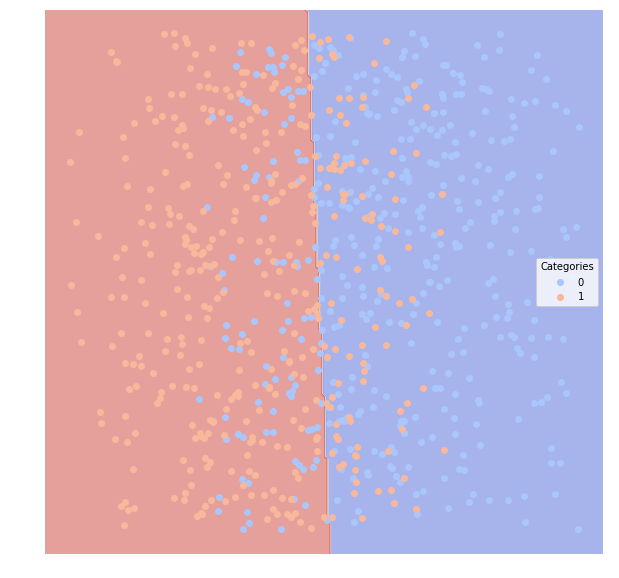

In [343]:
lucem_illud.plotregions(clf_log, dfTrain_and_5)

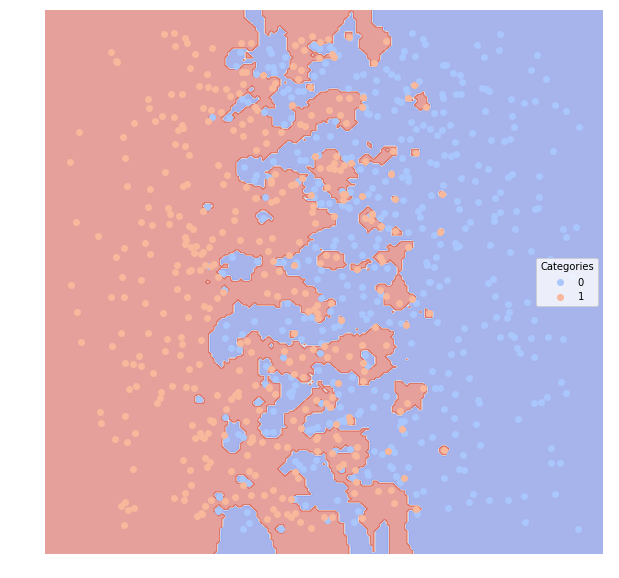

In [344]:
lucem_illud.plotregions(clf_KN, dfTrain_and_5)

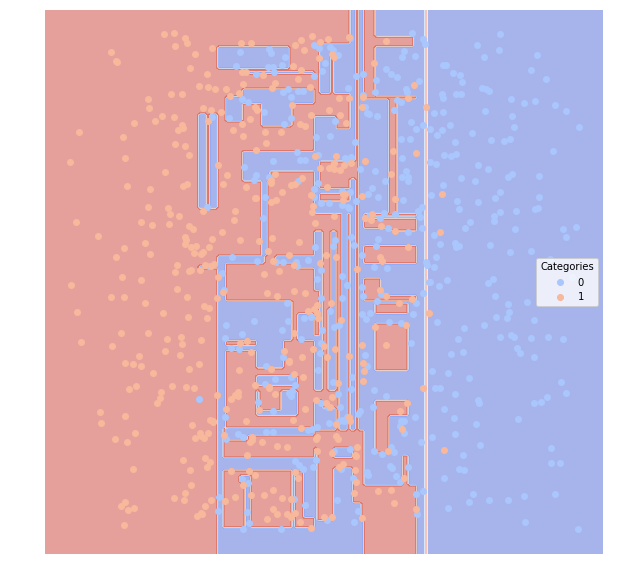

In [345]:
lucem_illud.plotregions(clf_decison, dfTrain_and_5)

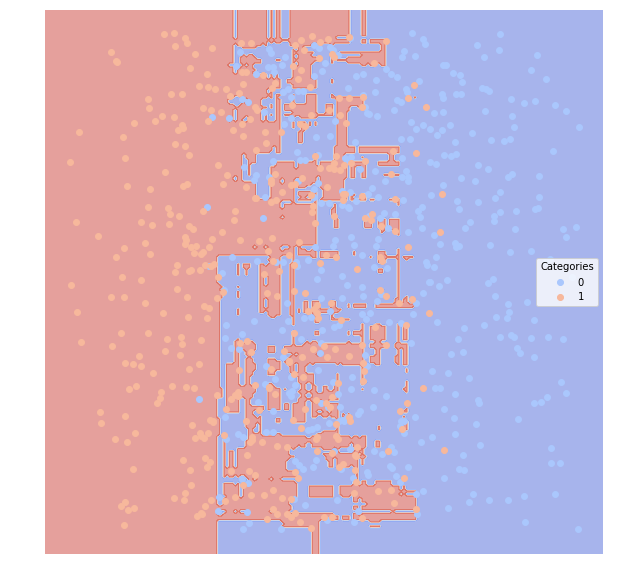

In [346]:
lucem_illud.plotregions(clf_forest, dfTrain_and_5)

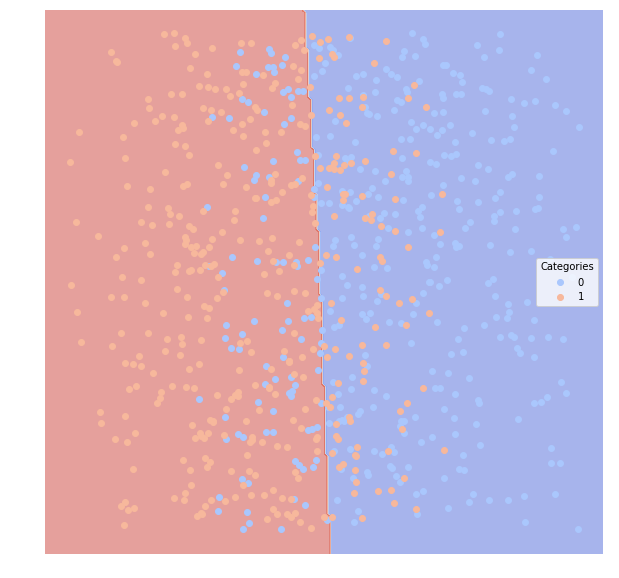

In [347]:
lucem_illud.plotregions(clf_network, dfTrain_and_5)

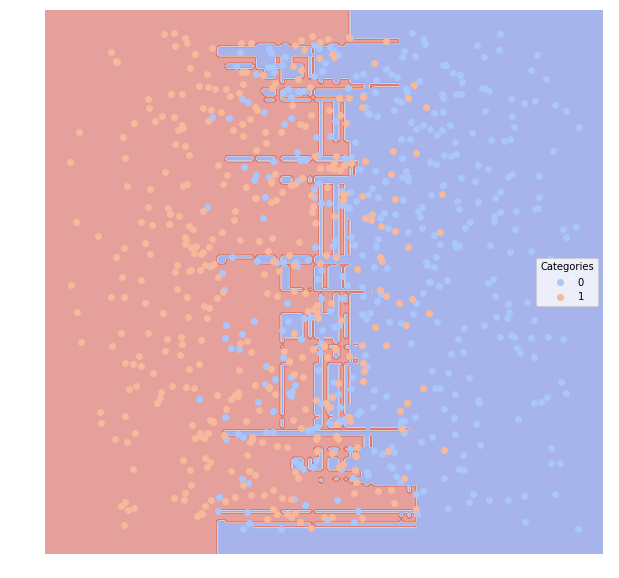

In [348]:
lucem_illud.plotregions(clf_ensemble, dfTrain_and_5)

In [349]:
#andSplit+Linear+noise=1.0
clf_linear.fit(np.stack(dfTrain_and_10['vect'], axis=0), dfTrain_and_10['category'])

#andSplit+Bayes+noise=1.0
clf_bayes.fit(np.stack(dfTrain_and_10['vect'], axis=0), dfTrain_and_10['category'])

#andSplit+polynomial+noise=1.0
clf_poly.fit(np.stack(dfTrain_and_10['vect'], axis=0), dfTrain_and_10['category'])

#andSplit+KNeighbors=+noise=1.0
clf_KN.fit(np.stack(dfTrain_and_10['vect'], axis=0), dfTrain_and_10['category'])

#andSplit+logistics+noise=1.0
clf_log.fit(np.stack(dfTrain_and_10['vect'], axis=0), dfTrain_and_10['category'])

#andSplit+Decisiontree+noise=1.0
clf_decison.fit(np.stack(dfTrain_and_10['vect'], axis=0), dfTrain_and_10['category'])

#andSplit+randomforest+noise=1.0
clf_forest.fit(np.stack(dfTrain_and_10['vect'], axis=0), dfTrain_and_10['category'])

#andSplit+connectionist+noise=1.0
clf_network.fit(np.stack(dfTrain_and_10['vect'], axis=0), dfTrain_and_10['category'])

#andSplit+ensemble+noise=1.0
clf_ensemble.fit(np.stack(dfTrain_and_10['vect'], axis=0), dfTrain_and_10['category'])

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [350]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_and_10)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.458863,0.496666,0.545,0.459459,0.330097
1,0.458863,0.465832,0.545,0.452381,0.587629


In [351]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_and_10)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.439796,0.488403,0.56,0.455446,0.446602
1,0.439796,0.458693,0.56,0.424242,0.432990


In [352]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_and_10)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.470023,0.502664,0.54,0.424242,0.135922
1,0.470023,0.470579,0.54,0.467066,0.804124


In [353]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_and_10)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.440997,0.489153,0.56,0.451613,0.407767
1,0.440997,0.458873,0.56,0.429907,0.474227


In [354]:
lucem_illud.evaluateClassifier(clf_log, dfTest_and_10)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.440096,0.488588,0.56,0.454545,0.436893
1,0.440096,0.458731,0.56,0.425743,0.443299


In [355]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_and_10)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.496197,0.513115,0.505,0.510870,0.456311
1,0.496197,0.483114,0.505,0.481481,0.536082


In [356]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_and_10)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.504104,0.517065,0.495,0.518868,0.533981
1,0.504104,0.487068,0.495,0.489362,0.474227


In [357]:
lucem_illud.evaluateClassifier(clf_network, dfTest_and_10)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.442498,0.490136,0.56,0.445783,0.359223
1,0.442498,0.459183,0.56,0.435897,0.525773


In [358]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_and_10)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.497097,0.513559,0.505,0.511628,0.427184
1,0.497097,0.483558,0.505,0.482456,0.567010


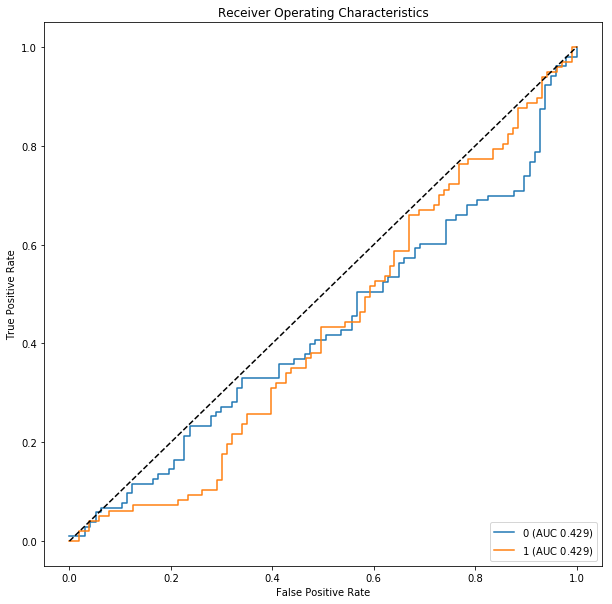

In [359]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_and_10)

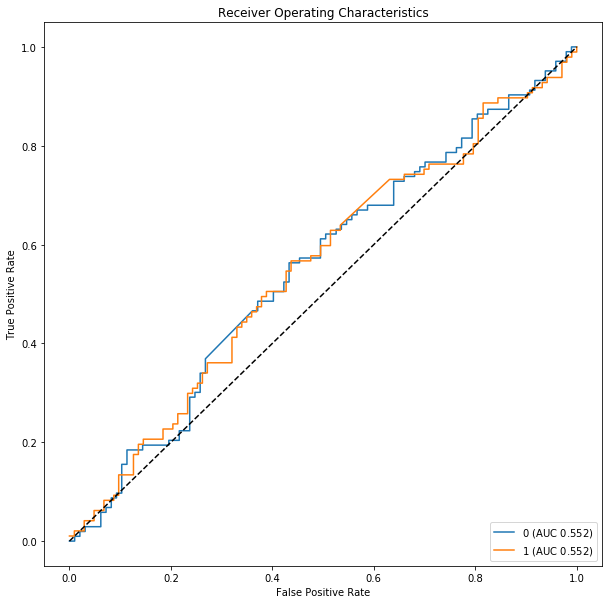

In [360]:
lucem_illud.plotMultiROC(clf_linear, dfTest_and_10)

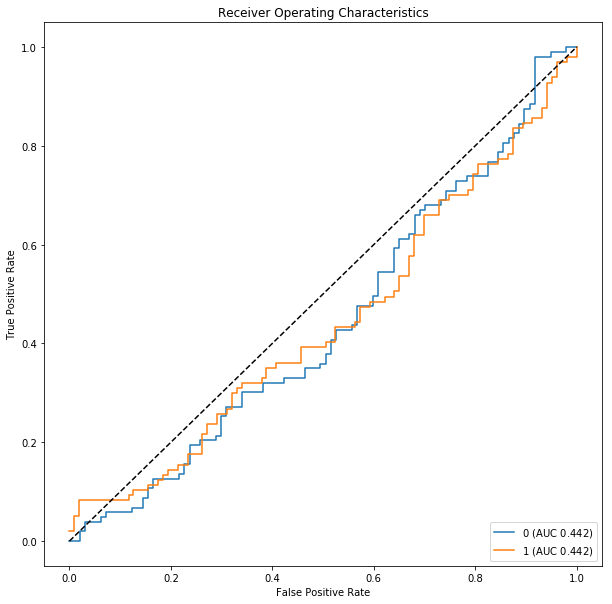

In [361]:
lucem_illud.plotMultiROC(clf_KN, dfTest_and_10)

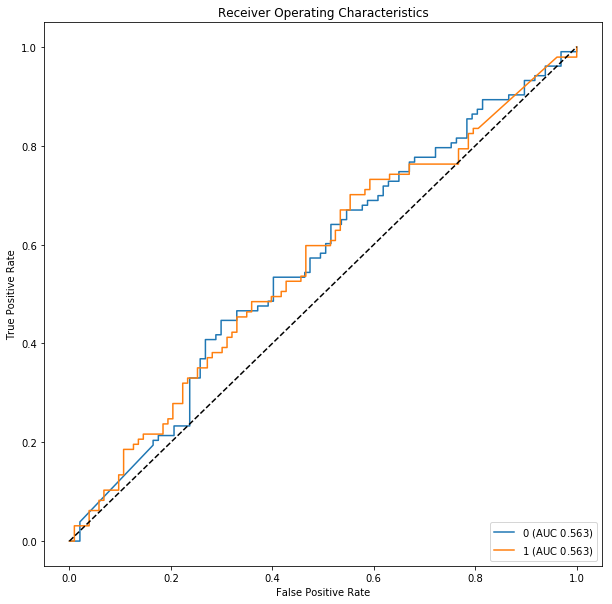

In [362]:
lucem_illud.plotMultiROC(clf_poly, dfTest_and_10)

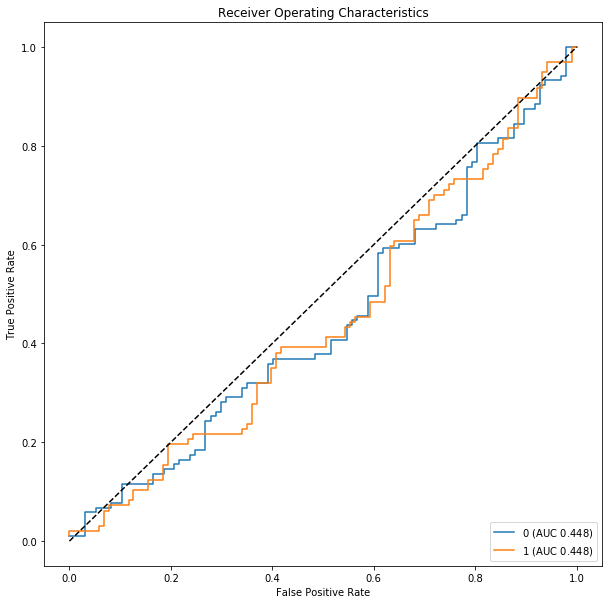

In [363]:
lucem_illud.plotMultiROC(clf_log, dfTest_and_10)

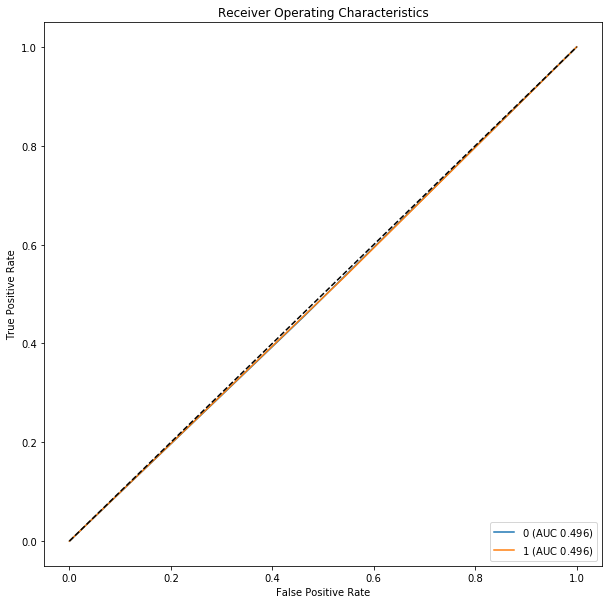

In [364]:
lucem_illud.plotMultiROC(clf_decison, dfTest_and_10)

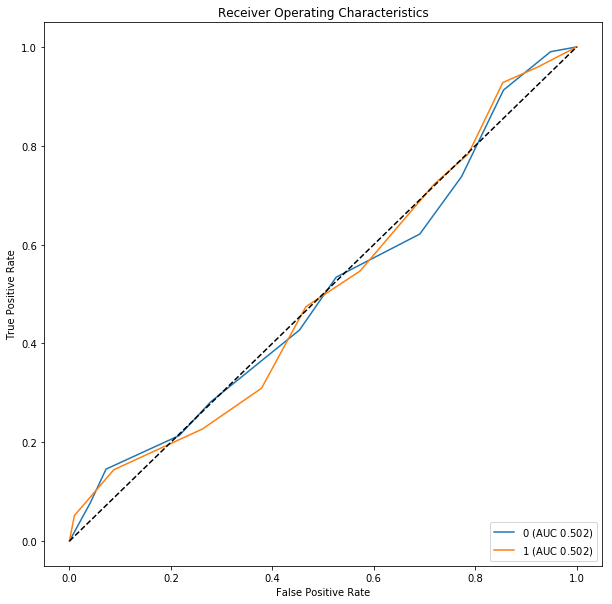

In [365]:
lucem_illud.plotMultiROC(clf_forest, dfTest_and_10)

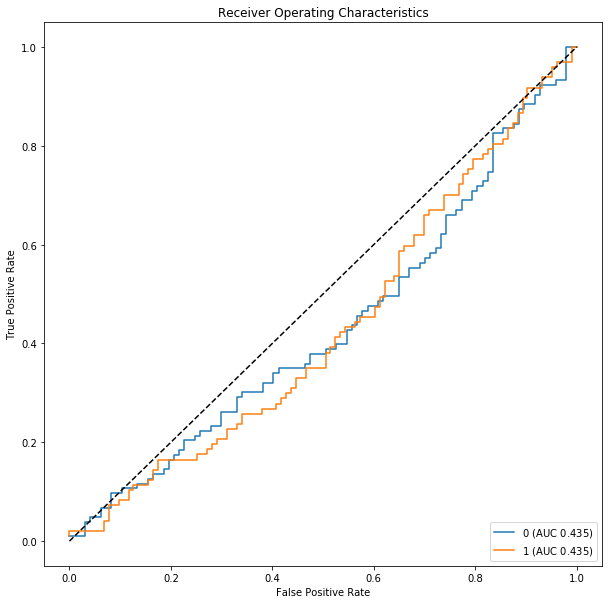

In [366]:
lucem_illud.plotMultiROC(clf_network, dfTest_and_10)

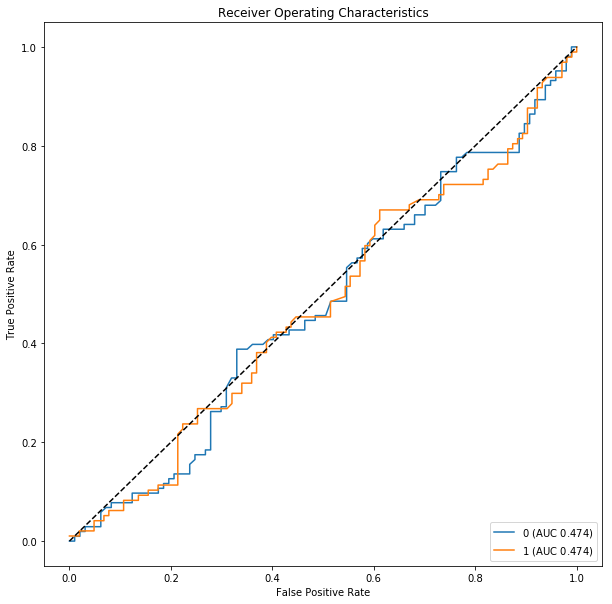

In [367]:
lucem_illud.plotMultiROC(clf_ensemble, dfTest_and_10)

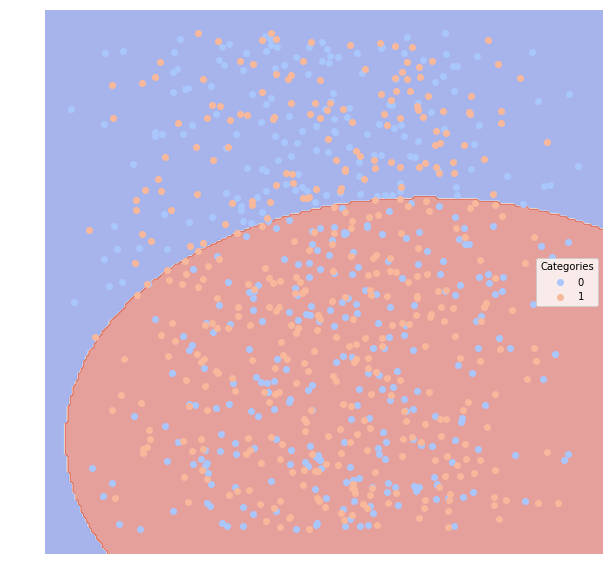

In [368]:
lucem_illud.plotregions(clf_bayes, dfTrain_and_10)

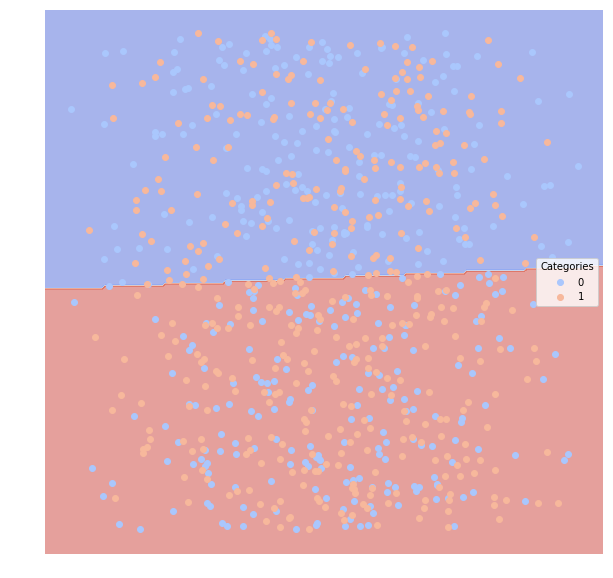

In [369]:
lucem_illud.plotregions(clf_linear, dfTrain_and_10)

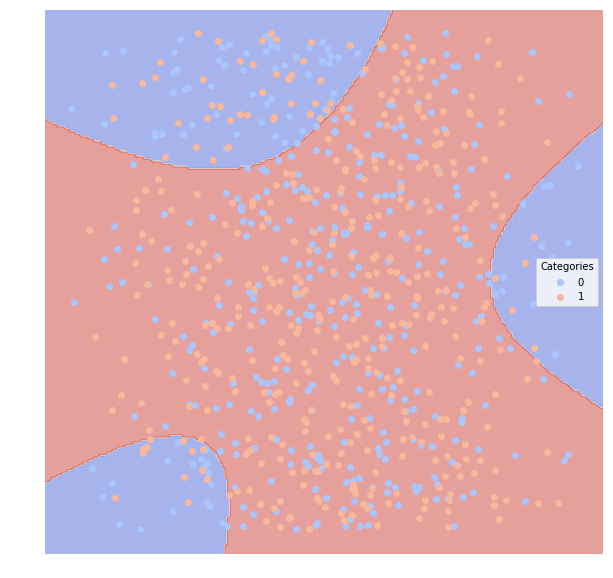

In [370]:
lucem_illud.plotregions(clf_poly, dfTrain_and_10)

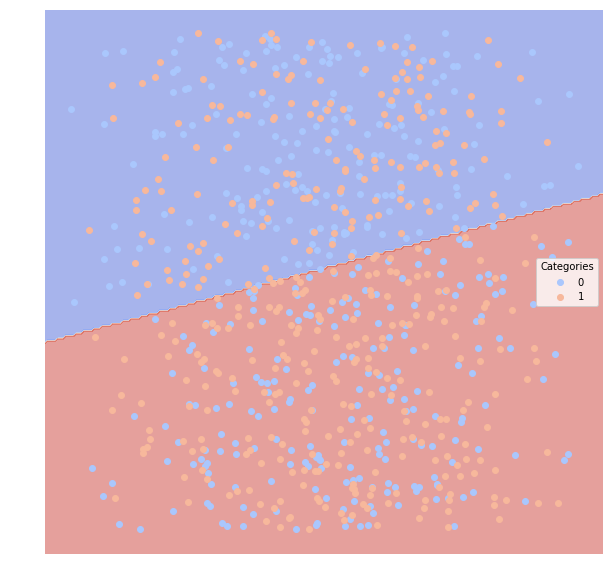

In [371]:
lucem_illud.plotregions(clf_log, dfTrain_and_10)

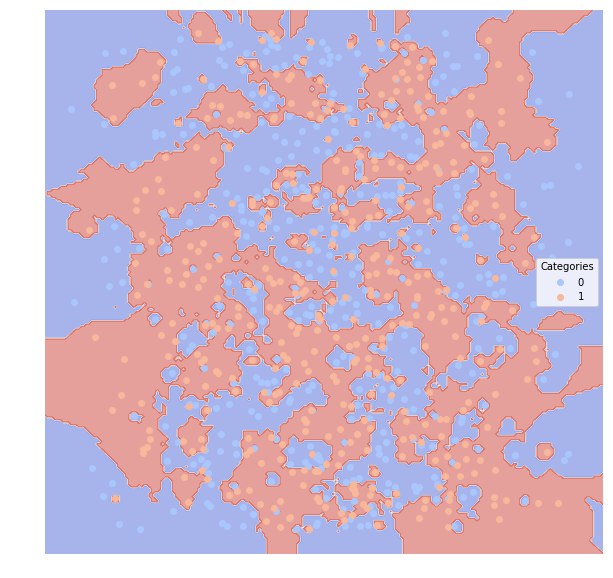

In [372]:
lucem_illud.plotregions(clf_KN, dfTrain_and_10)

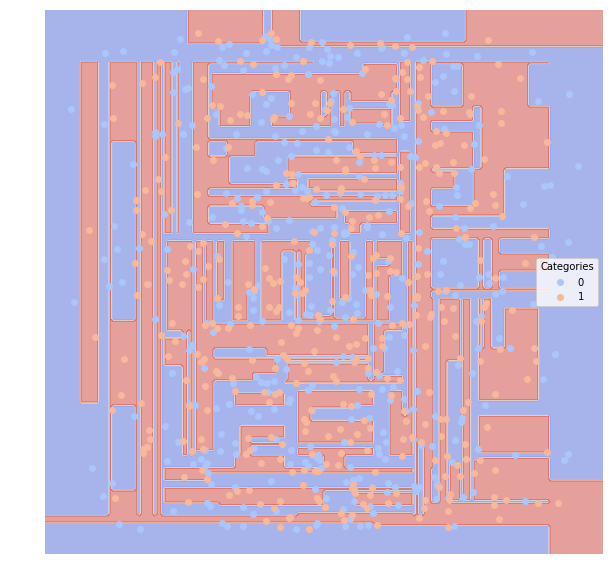

In [373]:
lucem_illud.plotregions(clf_decison, dfTrain_and_10)

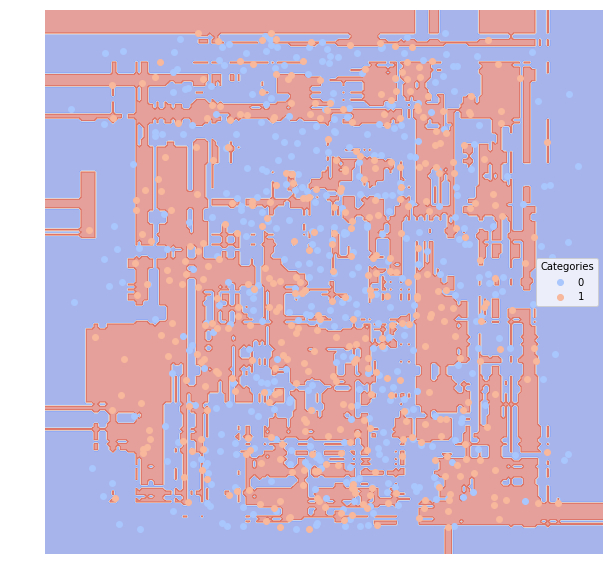

In [374]:
lucem_illud.plotregions(clf_forest, dfTrain_and_10)

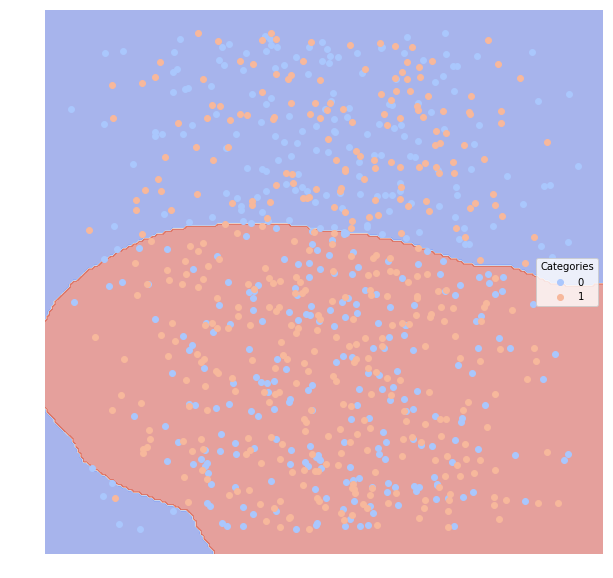

In [375]:
lucem_illud.plotregions(clf_network, dfTrain_and_10)

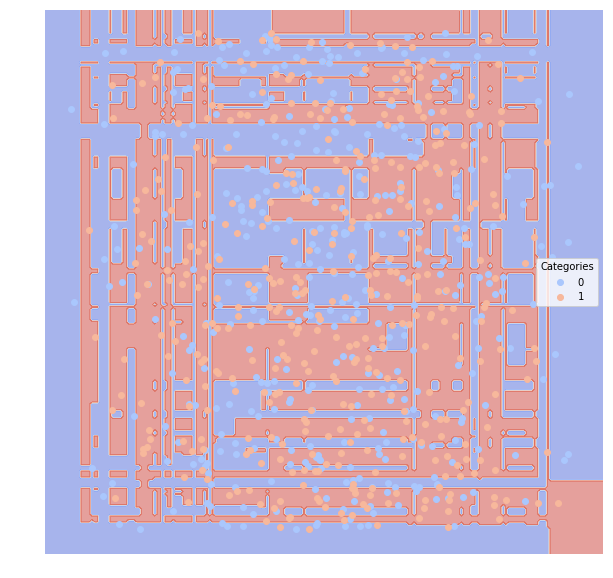

In [376]:
lucem_illud.plotregions(clf_ensemble, dfTrain_and_10)

In [377]:
#targetSplit+Linear+noise=0.2
clf_linear.fit(np.stack(dfTrain_target['vect'], axis=0), dfTrain_target['category'])

#targetSplit+Bayes+noise=0.2
clf_bayes.fit(np.stack(dfTrain_target['vect'], axis=0), dfTrain_target['category'])

#targetSplit+polynomial+noise=0.2
clf_poly.fit(np.stack(dfTrain_target['vect'], axis=0), dfTrain_target['category'])

#targetSplit+KNeighbors=+noise=0.2
clf_KN.fit(np.stack(dfTrain_target['vect'], axis=0), dfTrain_target['category'])

#targetSplit+logistics+noise=0.2
clf_log.fit(np.stack(dfTrain_target['vect'], axis=0), dfTrain_target['category'])

#targetSplit+Decisiontree+noise=0.2
clf_decison.fit(np.stack(dfTrain_target['vect'], axis=0), dfTrain_target['category'])

#targetSplit+randomforest+noise=0.2
clf_forest.fit(np.stack(dfTrain_target['vect'], axis=0), dfTrain_target['category'])

#targetSplit+connectionist+noise=0.2
clf_network.fit(np.stack(dfTrain_target['vect'], axis=0), dfTrain_target['category'])

#targetSplit+ensemble+noise=0.2
clf_ensemble.fit(np.stack(dfTrain_target['vect'], axis=0), dfTrain_target['category'])

//anaconda/lib/python3.5/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [378]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_target)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.878697,0.838554,0.12,0.87156,0.904762
1,0.878697,0.828936,0.12,0.89011,0.852632


In [379]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_target)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.432331,0.497449,0.575,0.428571,0.285714
1,0.432331,0.444939,0.575,0.423077,0.578947


In [380]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_target)

//anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.5,0.525,0.525,0.000,0.0
1,0.5,0.475,0.525,0.475,1.0


In [381]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_target)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.878195,0.835734,0.12,0.864865,0.914286
1,0.878195,0.831949,0.12,0.898876,0.842105


In [382]:
lucem_illud.evaluateClassifier(clf_log, dfTest_target)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.418546,0.494048,0.59,0.400000,0.247619
1,0.418546,0.439522,0.59,0.414815,0.589474


In [383]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_target)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.872431,0.826048,0.125,0.850877,0.923810
1,0.872431,0.829676,0.125,0.906977,0.821053


In [384]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_target)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.877694,0.833005,0.12,0.858407,0.923810
1,0.877694,0.835112,0.12,0.908046,0.831579


In [385]:
lucem_illud.evaluateClassifier(clf_network, dfTest_target)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.877193,0.830362,0.12,0.852174,0.933333
1,0.877193,0.838437,0.12,0.917647,0.821053


In [386]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_target)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.892481,0.848797,0.105,0.868421,0.942857
1,0.892481,0.858354,0.105,0.930233,0.842105


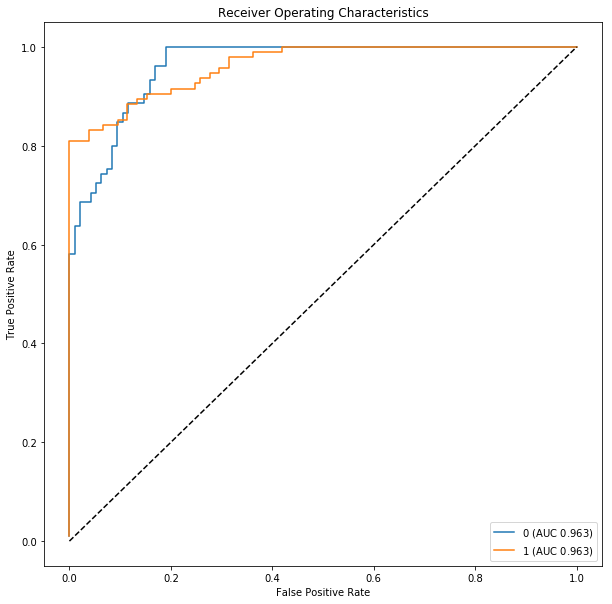

In [387]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_target)

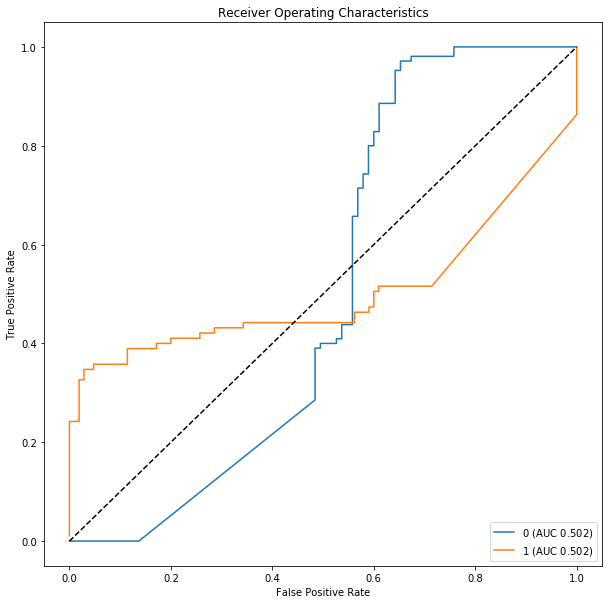

In [388]:
lucem_illud.plotMultiROC(clf_linear, dfTest_target)

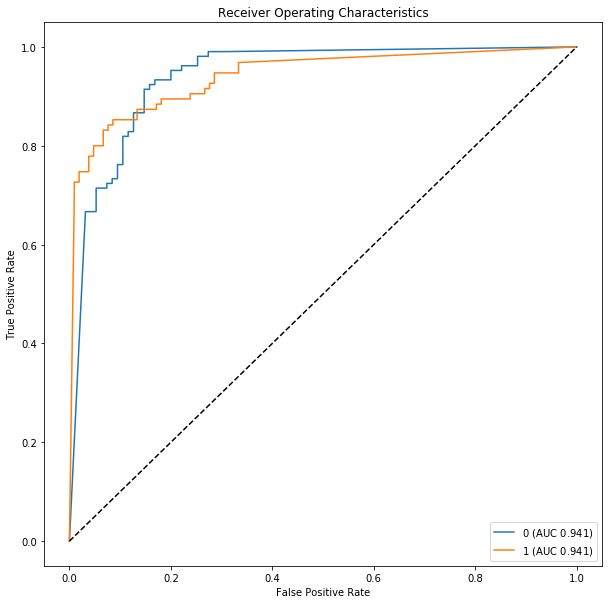

In [389]:
lucem_illud.plotMultiROC(clf_KN, dfTest_target)

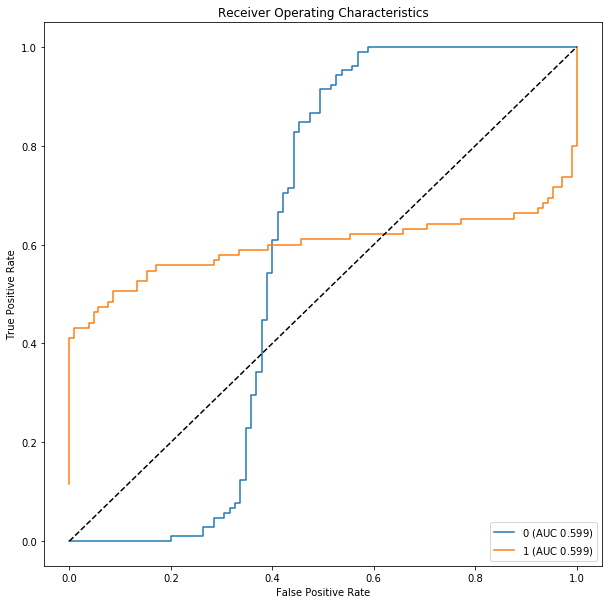

In [390]:
lucem_illud.plotMultiROC(clf_poly, dfTest_target)

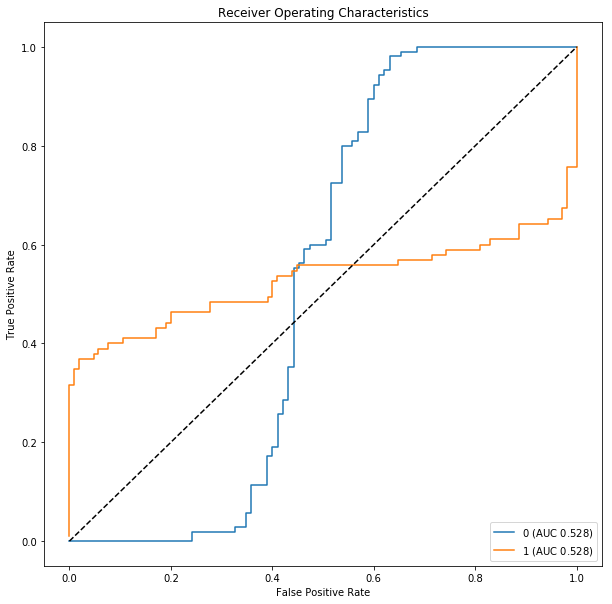

In [391]:
lucem_illud.plotMultiROC(clf_log, dfTest_target)

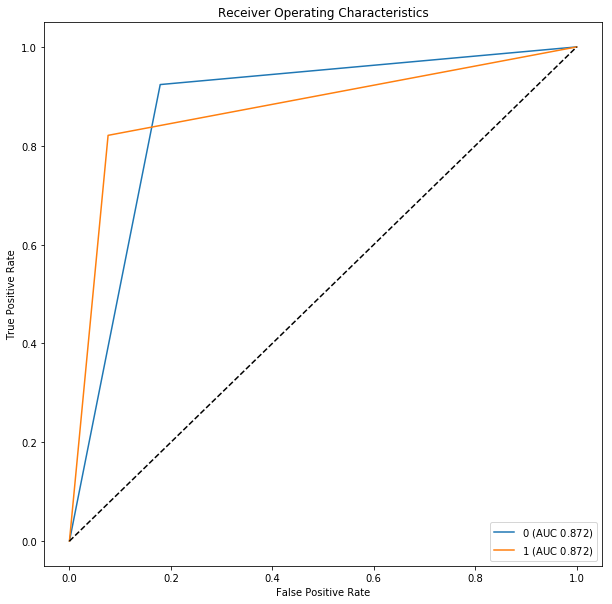

In [392]:
lucem_illud.plotMultiROC(clf_decison, dfTest_target)

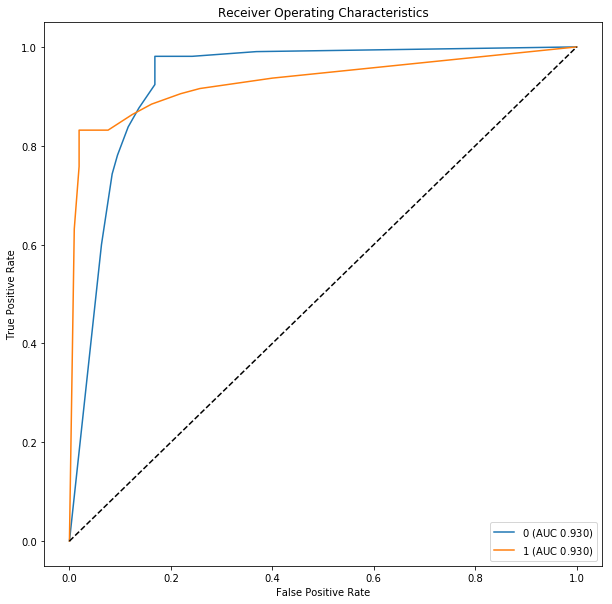

In [393]:
lucem_illud.plotMultiROC(clf_forest, dfTest_target)

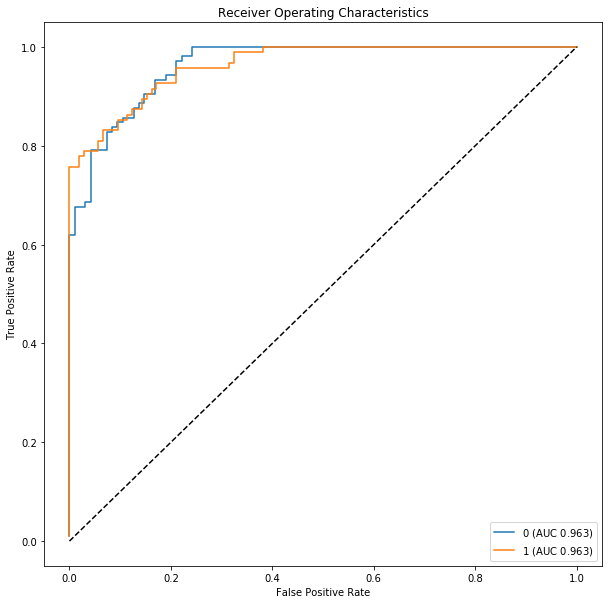

In [394]:
lucem_illud.plotMultiROC(clf_network, dfTest_target)

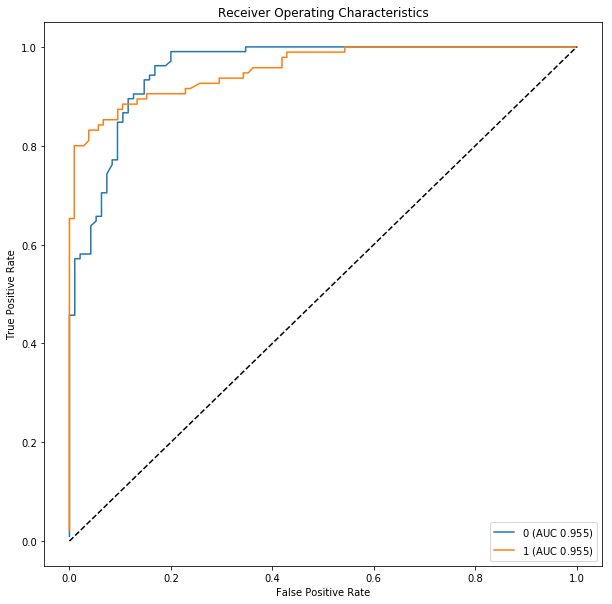

In [395]:
lucem_illud.plotMultiROC(clf_ensemble,dfTest_target)

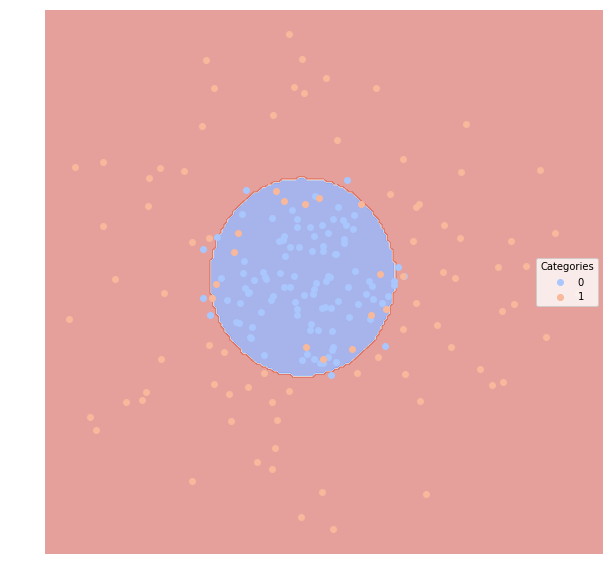

In [396]:
lucem_illud.plotregions(clf_bayes, dfTest_target)

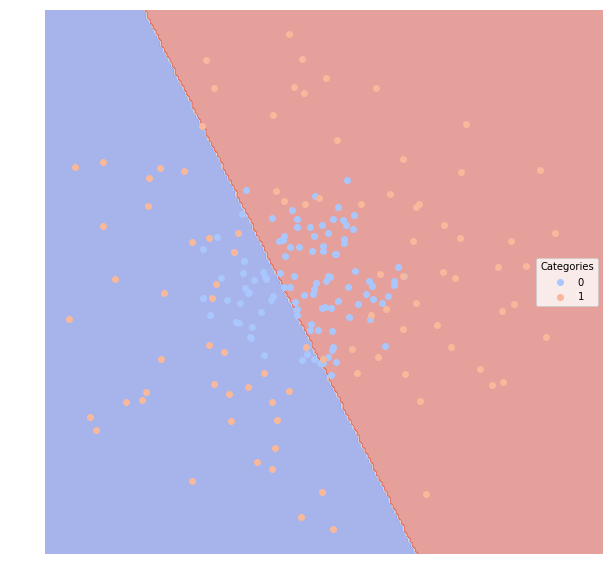

In [397]:
lucem_illud.plotregions(clf_linear, dfTest_target)

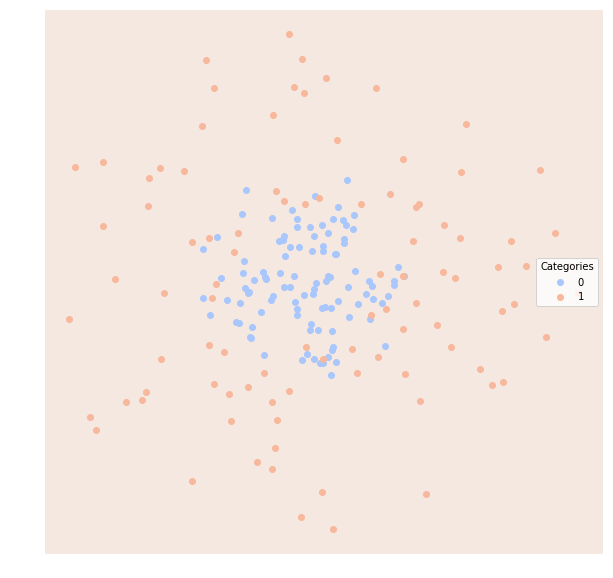

In [398]:
lucem_illud.plotregions(clf_poly, dfTest_target)

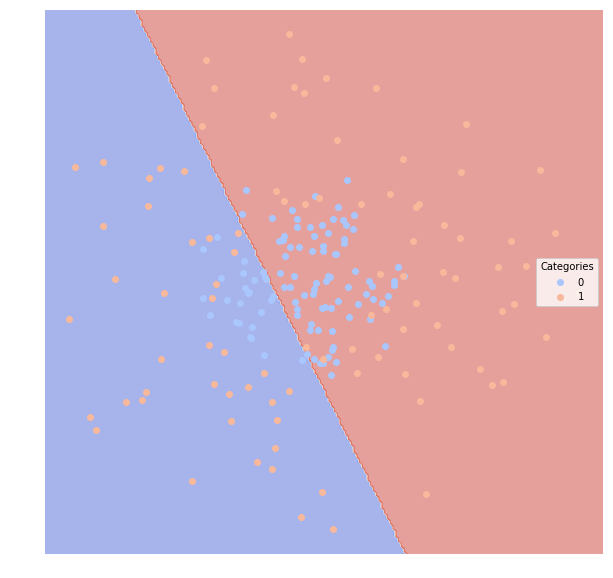

In [399]:
lucem_illud.plotregions(clf_log, dfTest_target)

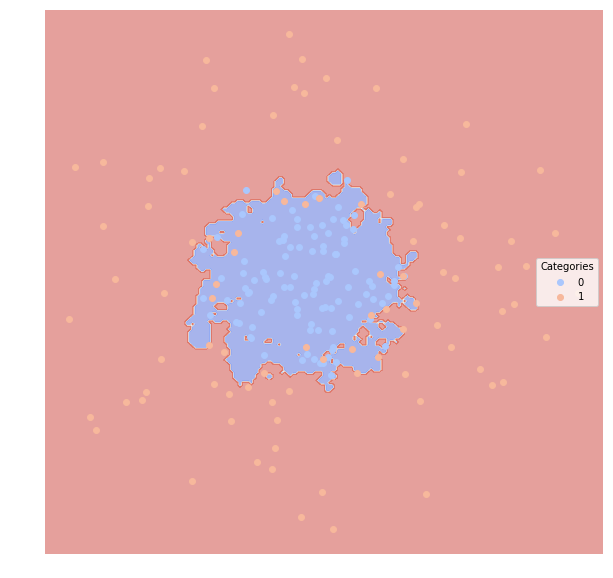

In [400]:
lucem_illud.plotregions(clf_KN, dfTest_target)

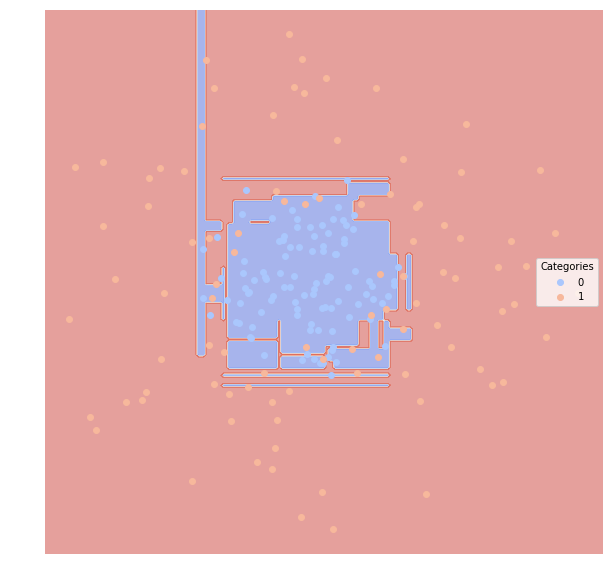

In [401]:
lucem_illud.plotregions(clf_decison, dfTest_target)

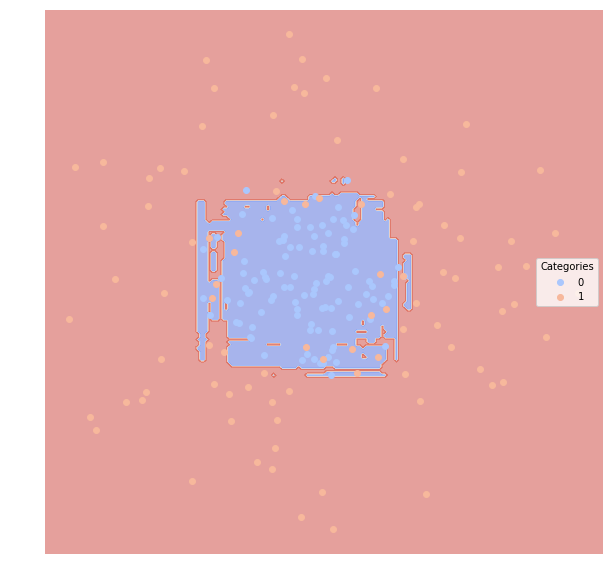

In [402]:
lucem_illud.plotregions(clf_forest, dfTest_target)

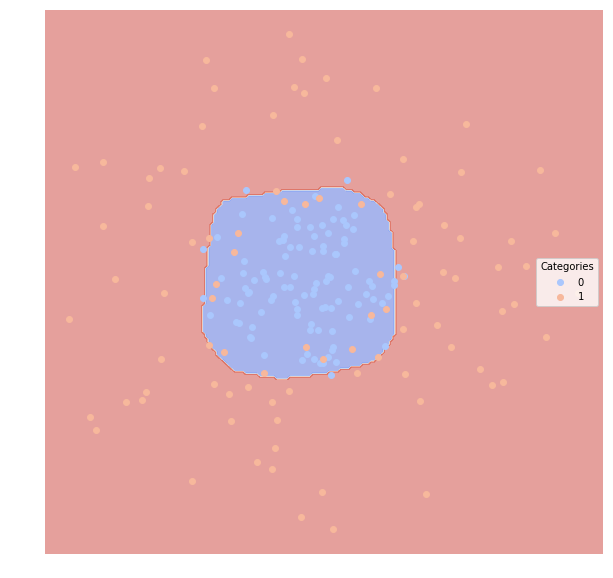

In [403]:
lucem_illud.plotregions(clf_network, dfTest_target)

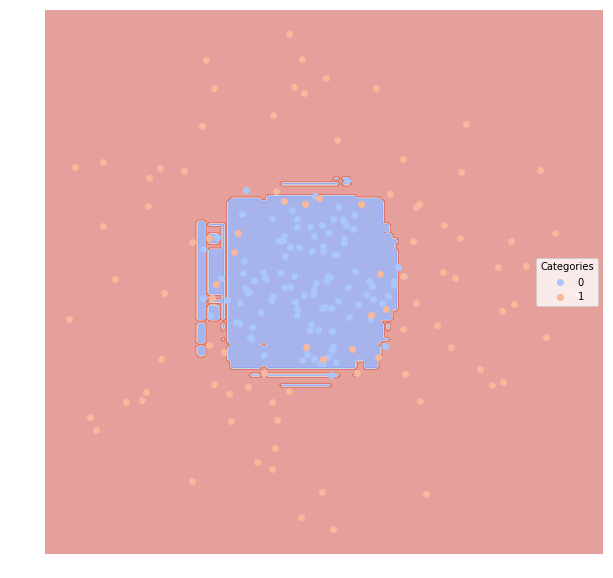

In [404]:
lucem_illud.plotregions(clf_ensemble, dfTest_target)

In [405]:
#targetSplit+Linear+noise=0.5
clf_linear.fit(np.stack(dfTrain_target_5['vect'], axis=0), dfTrain_target_5['category'])

#targetSplit+Bayes+noise=0.5
clf_bayes.fit(np.stack(dfTrain_target_5['vect'], axis=0), dfTrain_target_5['category'])

#targetSplit+polynomial+noise=0.5
clf_poly.fit(np.stack(dfTrain_target_5['vect'], axis=0), dfTrain_target_5['category'])

#targetSplit+KNeighbors=+noise=0.5
clf_KN.fit(np.stack(dfTrain_target_5['vect'], axis=0), dfTrain_target_5['category'])

#targetSplit+logistics+noise=0.5
clf_log.fit(np.stack(dfTrain_target_5['vect'], axis=0), dfTrain_target_5['category'])

#targetSplit+Decisiontree+noise=0.5
clf_decison.fit(np.stack(dfTrain_target_5['vect'], axis=0), dfTrain_target_5['category'])

#targetSplit+randomforest+noise=0.5
clf_forest.fit(np.stack(dfTrain_target_5['vect'], axis=0), dfTrain_target_5['category'])

#targetSplit+connectionist+noise=0.5
clf_network.fit(np.stack(dfTrain_target_5['vect'], axis=0), dfTrain_target_5['category'])

#targetSplit+ensemble+noise=0.5
clf_ensemble.fit(np.stack(dfTrain_target_5['vect'], axis=0), dfTrain_target_5['category'])

//anaconda/lib/python3.5/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [406]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_target_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.753205,0.664795,0.25,0.701754,0.833333
1,0.753205,0.717853,0.25,0.813953,0.673077


In [407]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_target_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.512821,0.486523,0.495,0.489209,0.708333
1,0.512821,0.526658,0.495,0.540984,0.317308


In [408]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_target_5)

//anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.5,0.48,0.52,0.48,1.0
1,0.5,0.52,0.52,0.00,0.0


In [409]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_target_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.676282,0.598730,0.325,0.647619,0.708333
1,0.676282,0.639352,0.325,0.705263,0.644231


In [410]:
lucem_illud.evaluateClassifier(clf_log, dfTest_target_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.468349,0.465089,0.535,0.452991,0.552083
1,0.468349,0.505357,0.535,0.481928,0.384615


In [411]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_target_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.655449,0.582442,0.345,0.633663,0.666667
1,0.655449,0.620995,0.345,0.676768,0.644231


In [412]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_target_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.753205,0.664795,0.25,0.701754,0.833333
1,0.753205,0.717853,0.25,0.813953,0.673077


In [413]:
lucem_illud.evaluateClassifier(clf_network, dfTest_target_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.746795,0.662305,0.255,0.710280,0.791667
1,0.746795,0.705972,0.255,0.784946,0.701923


In [414]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_target_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.74359,0.654713,0.26,0.689655,0.833333
1,0.74359,0.709304,0.26,0.809524,0.653846


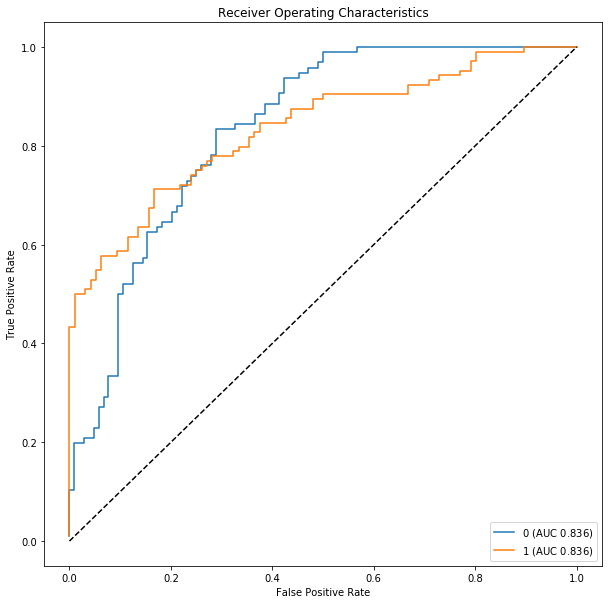

In [415]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_target_5)

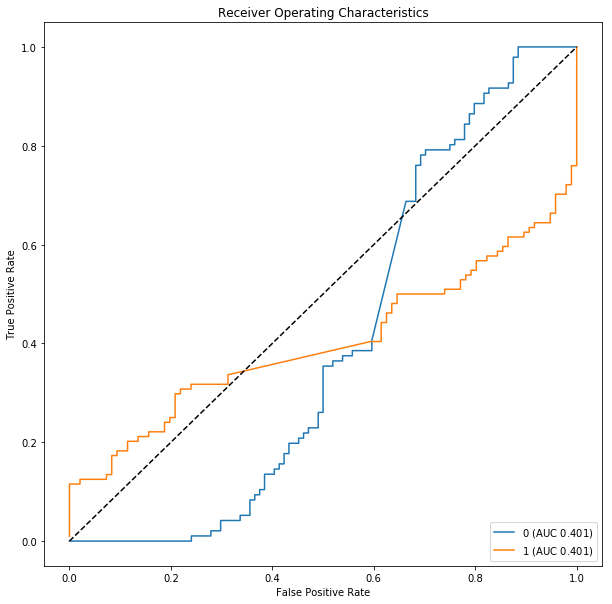

In [416]:
lucem_illud.plotMultiROC(clf_linear, dfTest_target_5)

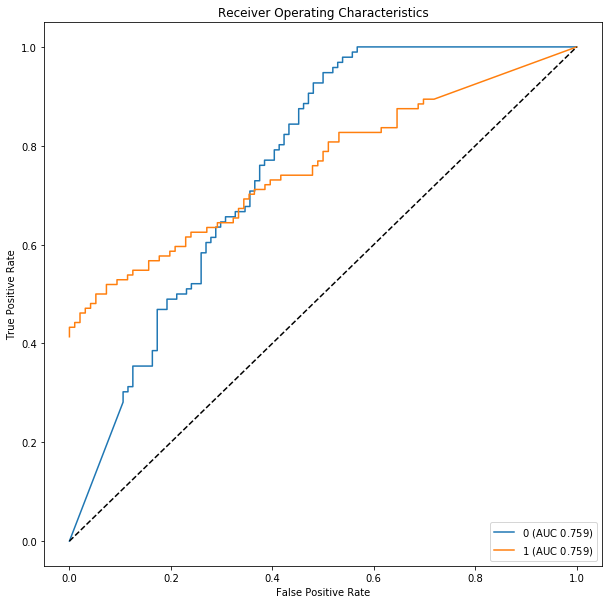

In [417]:
lucem_illud.plotMultiROC(clf_KN, dfTest_target_5)

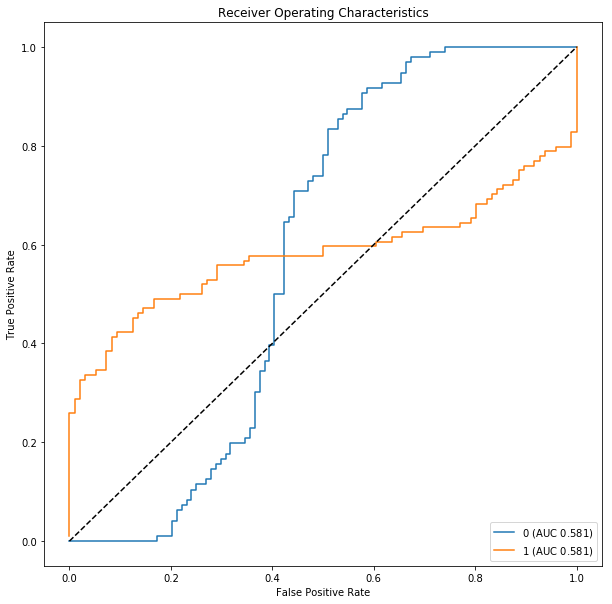

In [418]:
lucem_illud.plotMultiROC(clf_poly, dfTest_target_5)

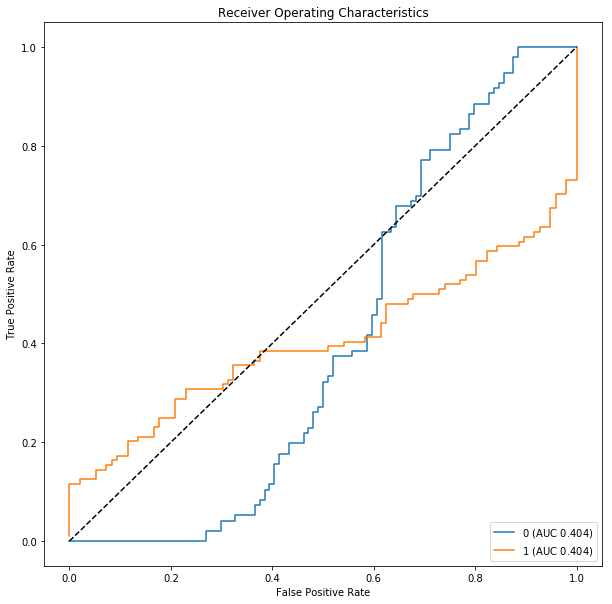

In [419]:
lucem_illud.plotMultiROC(clf_log, dfTest_target_5)

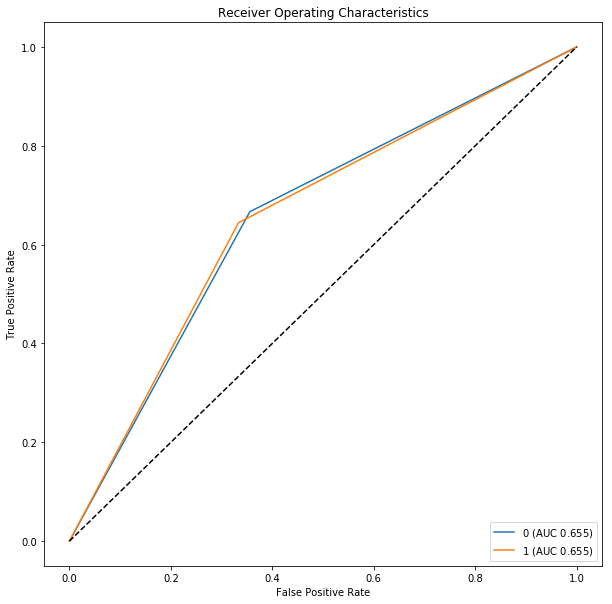

In [420]:
lucem_illud.plotMultiROC(clf_decison, dfTest_target_5)

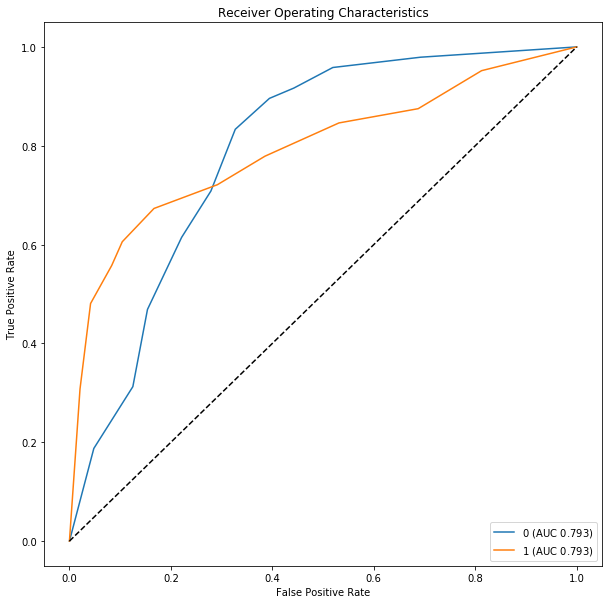

In [421]:
lucem_illud.plotMultiROC(clf_forest, dfTest_target_5)

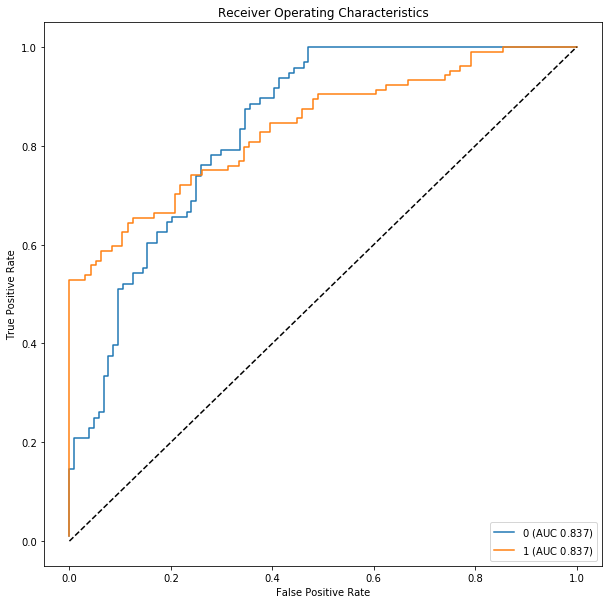

In [422]:
lucem_illud.plotMultiROC(clf_network, dfTest_target_5)

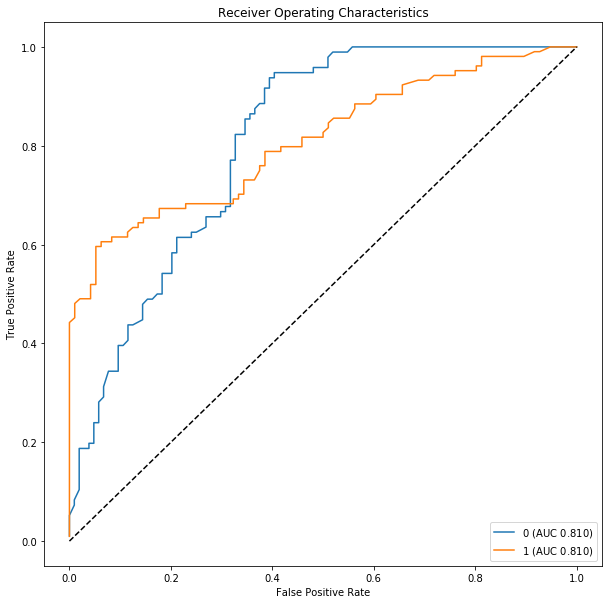

In [423]:
lucem_illud.plotMultiROC(clf_ensemble,dfTest_target_5)

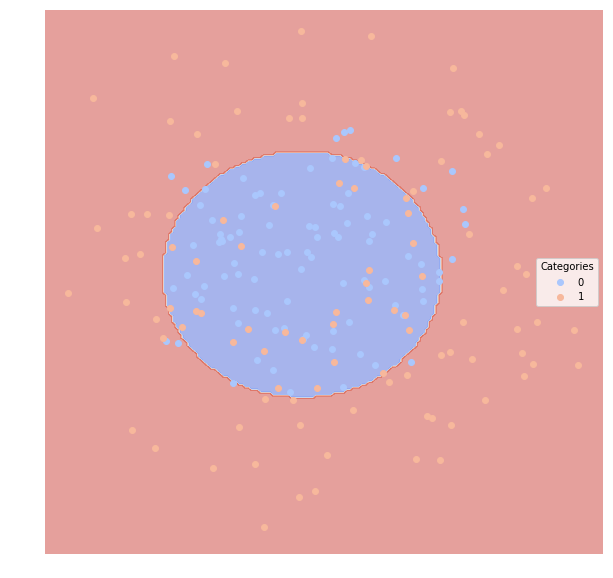

In [424]:
lucem_illud.plotregions(clf_bayes, dfTest_target_5)

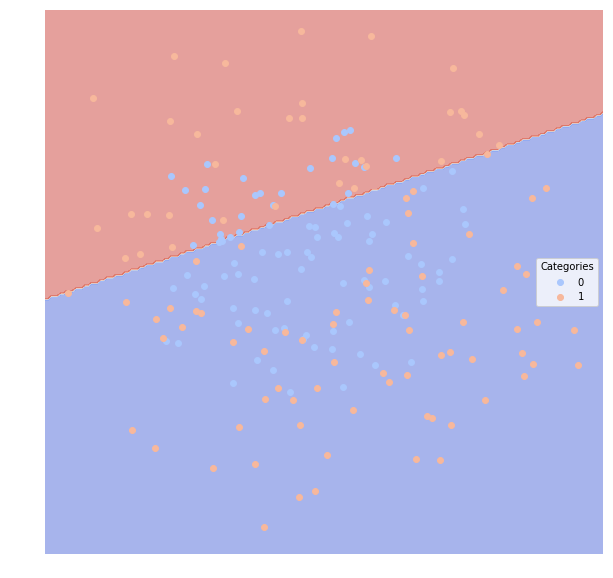

In [425]:
lucem_illud.plotregions(clf_linear, dfTest_target_5)

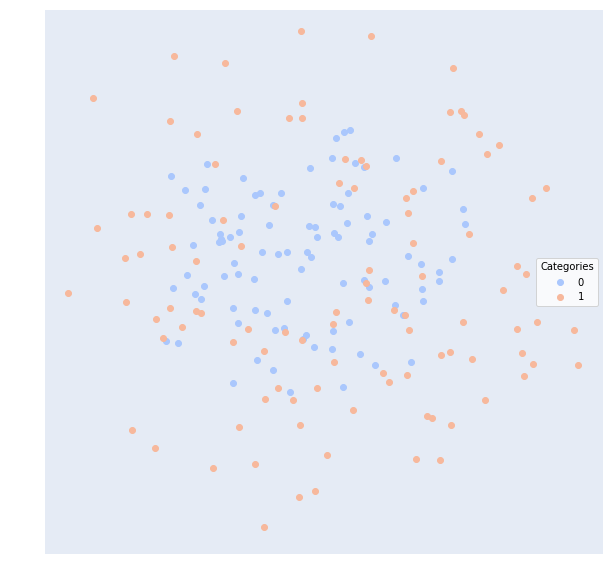

In [426]:
lucem_illud.plotregions(clf_poly, dfTest_target_5)

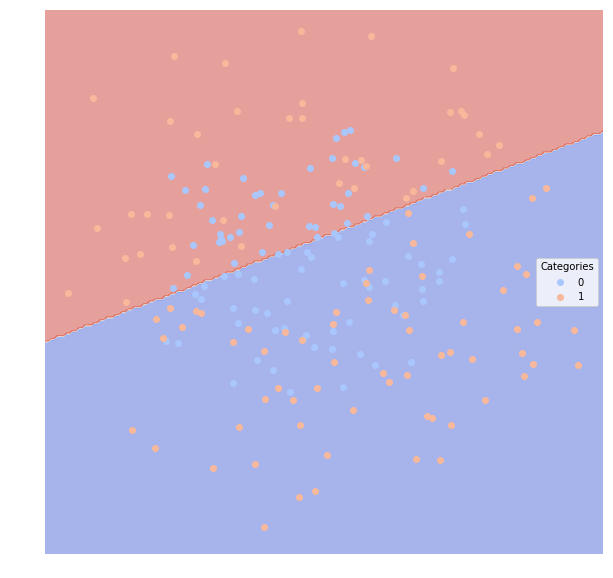

In [427]:
lucem_illud.plotregions(clf_log, dfTest_target_5)

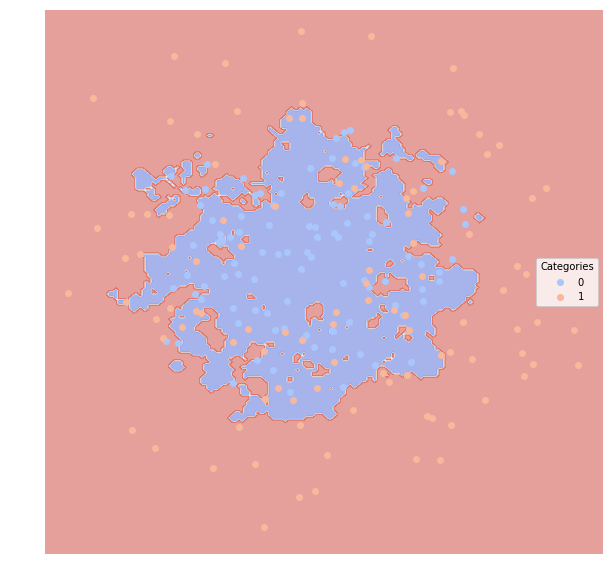

In [428]:
lucem_illud.plotregions(clf_KN, dfTest_target_5)

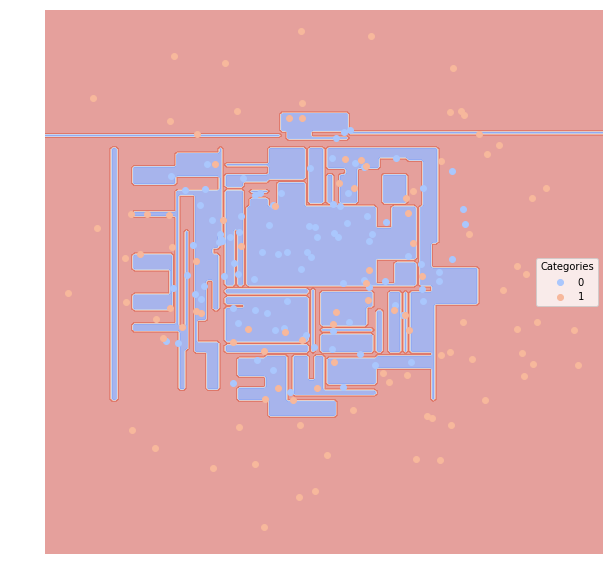

In [429]:
lucem_illud.plotregions(clf_decison, dfTest_target_5)

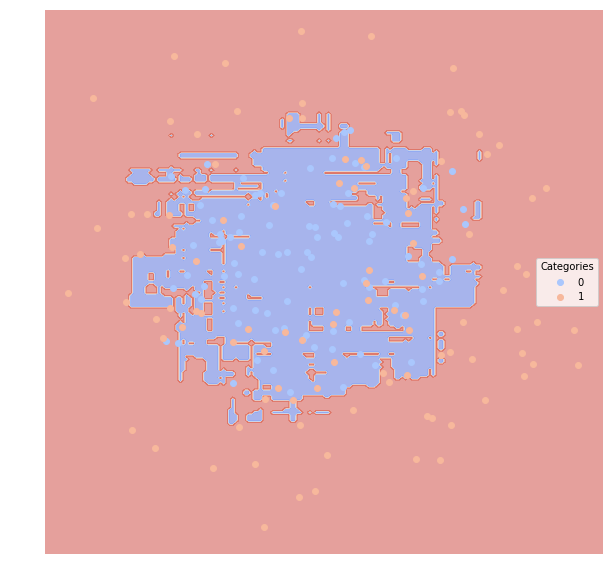

In [430]:
lucem_illud.plotregions(clf_forest, dfTest_target_5)

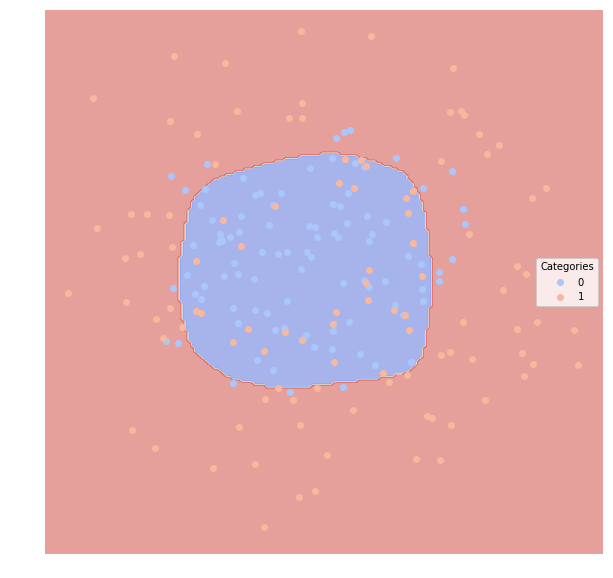

In [431]:
lucem_illud.plotregions(clf_network, dfTest_target_5)

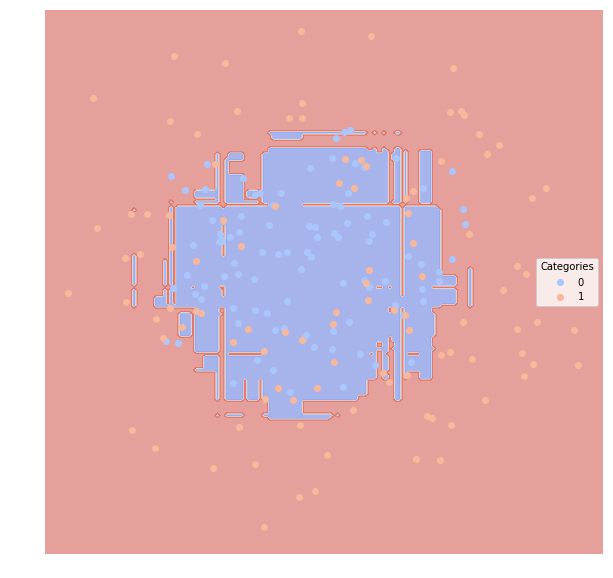

In [432]:
lucem_illud.plotregions(clf_ensemble, dfTest_target_5)

In [434]:
#multiSplit+Linear+noise=0.2
clf_linear.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+Bayes+noise=0.2
clf_bayes.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+polynomial+noise=0.2
clf_poly.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplitKNeighbors=+noise=0.2
clf_KN.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+logistics+noise=0.2
clf_log.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+Decisiontree+noise=0.2
clf_decison.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+randomforest+noise=0.2
clf_forest.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+connectionist+noise=0.2
clf_network.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+ensemble+noise=0.2
clf_ensemble.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [435]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_multi)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,1.000000,1.000000,0.000,1.000000,1.000000
1,0.998765,0.989583,0.002,0.989583,1.000000
2,0.914223,0.769576,0.060,0.853211,0.869159
3,0.902045,0.759499,0.062,0.864078,0.839623
4,1.000000,1.000000,0.000,1.000000,1.000000


In [436]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_multi)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,1.000000,1.000000,0.000,1.000000,1.000000
1,0.998765,0.989583,0.002,0.989583,1.000000
2,0.922297,0.777087,0.058,0.848214,0.887850
3,0.901135,0.773945,0.058,0.888889,0.830189
4,0.998778,0.989130,0.002,0.989130,1.000000


In [437]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_multi)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.995050,0.992099,0.002,1.000000,0.990099
1,0.998765,0.989583,0.002,0.989583,1.000000
2,0.846234,0.712377,0.076,0.915663,0.710280
3,0.924193,0.723842,0.076,0.765625,0.924528
4,0.997555,0.978495,0.004,0.978495,1.000000


In [438]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_multi)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.993796,0.982296,0.004,0.990099,0.990099
1,1.000000,1.000000,0.000,1.000000,1.000000
2,0.888314,0.720772,0.074,0.830189,0.822430
3,0.892252,0.725213,0.072,0.830189,0.830189
4,0.992061,0.969511,0.006,0.978261,0.989011


In [439]:
lucem_illud.evaluateClassifier(clf_log, dfTest_multi)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.968982,0.913441,0.020,0.950495,0.950495
1,0.997531,0.979381,0.004,0.979381,1.000000
2,0.883641,0.713698,0.076,0.828571,0.813084
3,0.882818,0.710900,0.076,0.826923,0.811321
4,0.943819,0.830014,0.036,0.892473,0.912088


In [440]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_multi)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.987593,0.964788,0.008,0.980198,0.980198
1,1.000000,1.000000,0.000,1.000000,1.000000
2,0.867078,0.680076,0.086,0.807692,0.785047
3,0.877742,0.686052,0.084,0.796296,0.811321
4,0.978627,0.930988,0.014,0.956522,0.967033


In [441]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_multi)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.992543,0.972685,0.006,0.980392,0.990099
1,0.998765,0.989583,0.002,0.989583,1.000000
2,0.899788,0.729230,0.072,0.819820,0.850467
3,0.880639,0.716855,0.074,0.841584,0.801887
4,0.981071,0.951543,0.010,0.977778,0.967033


In [442]:
lucem_illud.evaluateClassifier(clf_network, dfTest_multi)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.995050,0.992099,0.002,1.000000,0.990099
1,1.000000,1.000000,0.000,1.000000,1.000000
2,0.908278,0.755714,0.064,0.844037,0.859813
3,0.902045,0.759499,0.062,0.864078,0.839623
4,0.990838,0.959107,0.008,0.967742,0.989011


In [443]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_multi)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.993796,0.982296,0.004,0.990099,0.990099
1,0.994737,0.991474,0.002,1.000000,0.989474
2,0.898932,0.741485,0.068,0.841121,0.841121
3,0.895700,0.725911,0.072,0.824074,0.839623
4,0.981071,0.951543,0.010,0.977778,0.967033


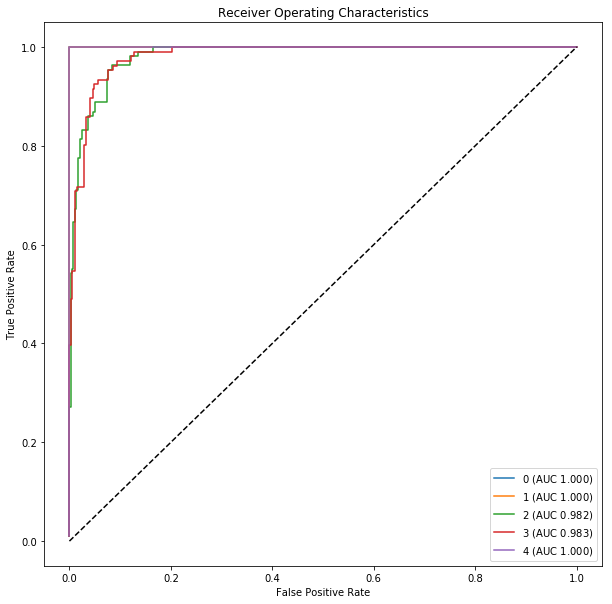

In [444]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_multi)

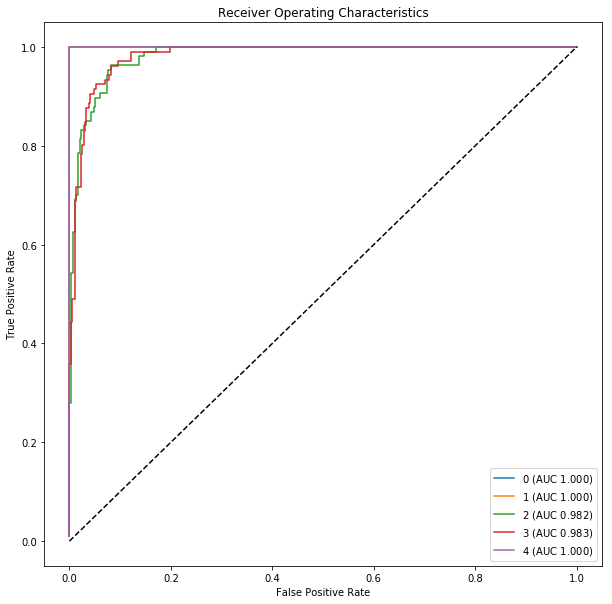

In [445]:
lucem_illud.plotMultiROC(clf_linear, dfTest_multi)

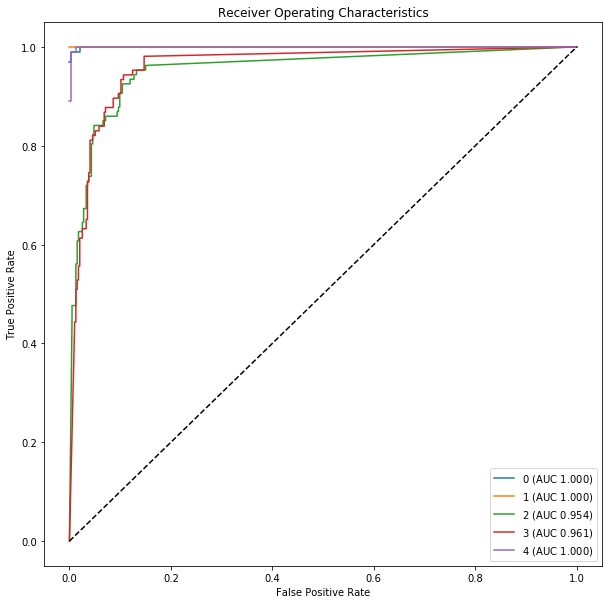

In [446]:
lucem_illud.plotMultiROC(clf_KN, dfTest_multi)

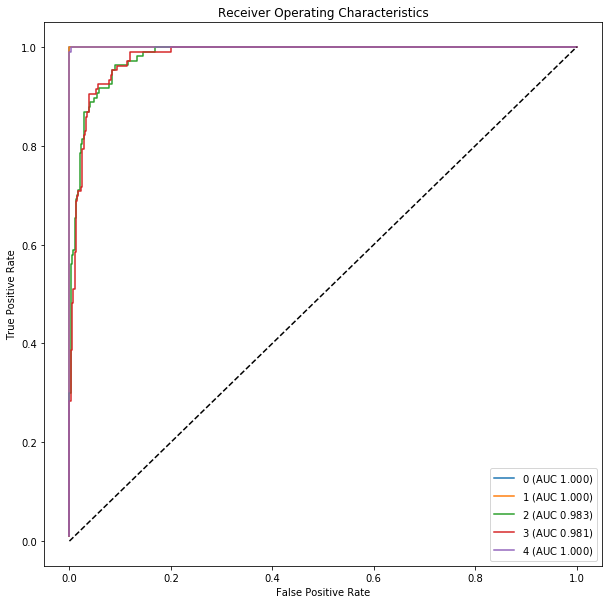

In [447]:
lucem_illud.plotMultiROC(clf_poly, dfTest_multi)

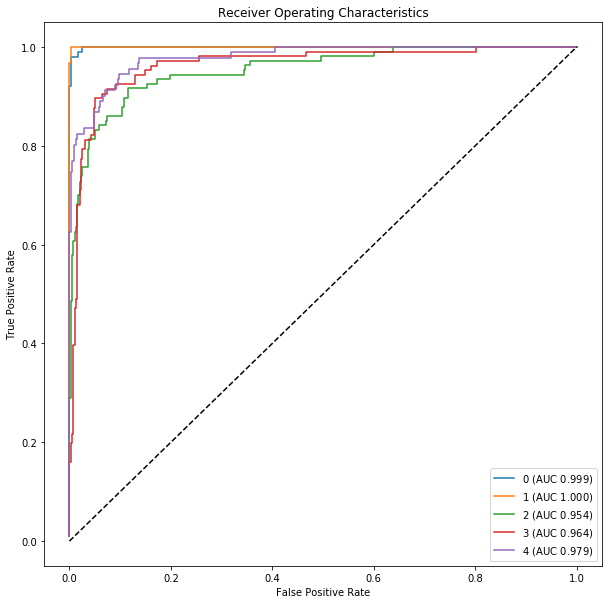

In [448]:
lucem_illud.plotMultiROC(clf_log, dfTest_multi)

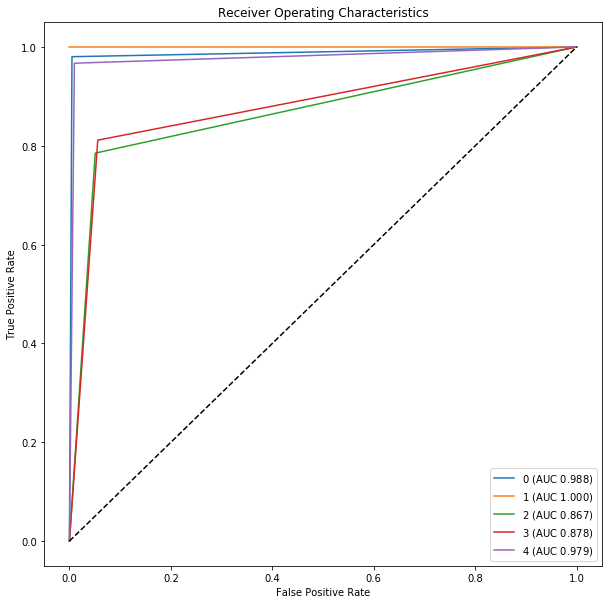

In [449]:
lucem_illud.plotMultiROC(clf_decison, dfTest_multi)

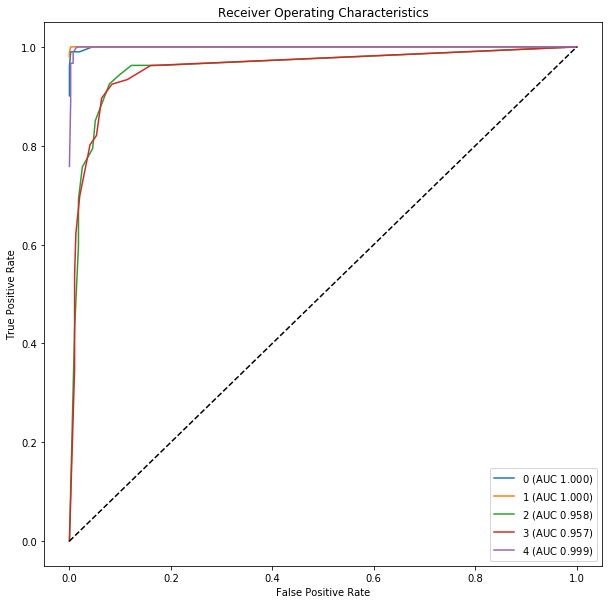

In [450]:
lucem_illud.plotMultiROC(clf_forest, dfTest_multi)

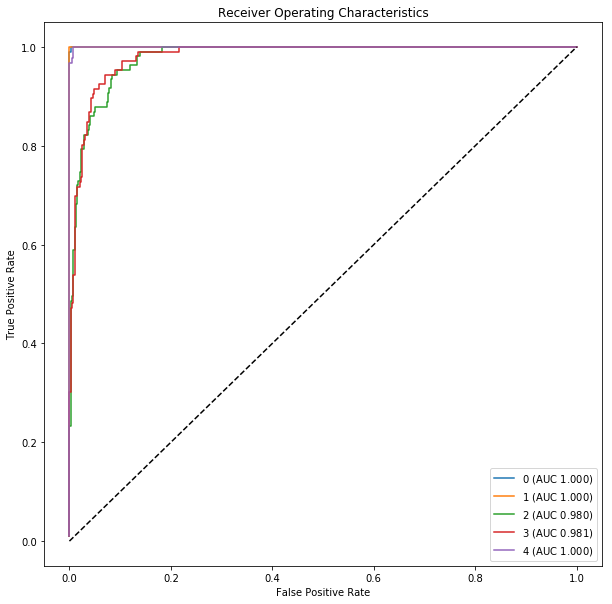

In [451]:
lucem_illud.plotMultiROC(clf_network, dfTest_multi)

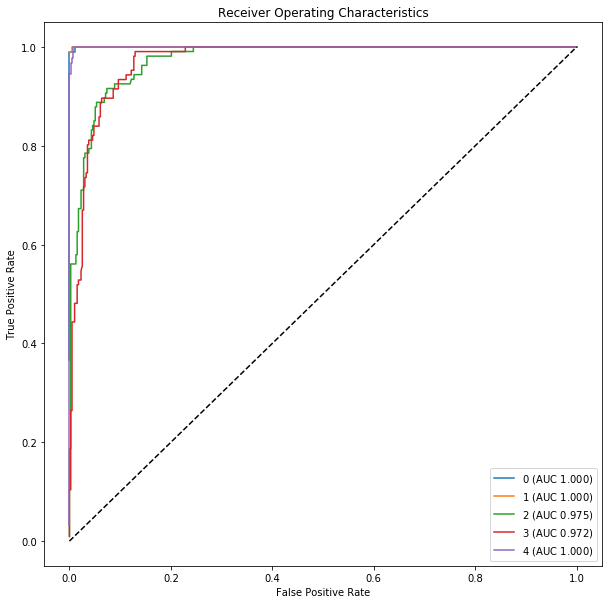

In [452]:
lucem_illud.plotMultiROC(clf_ensemble,dfTest_multi)

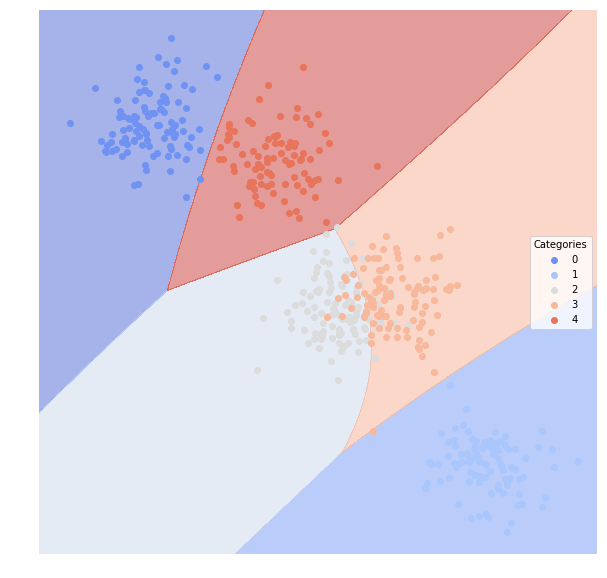

In [453]:
lucem_illud.plotregions(clf_bayes, dfTest_multi)

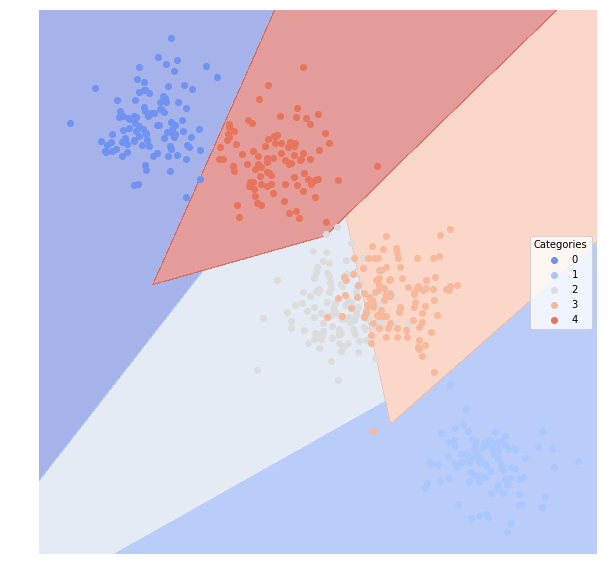

In [454]:
lucem_illud.plotregions(clf_linear, dfTest_multi)

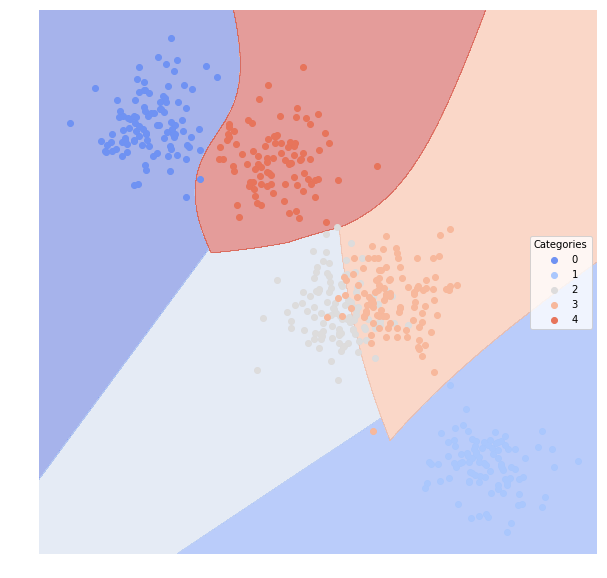

In [455]:
lucem_illud.plotregions(clf_poly,dfTest_multi)

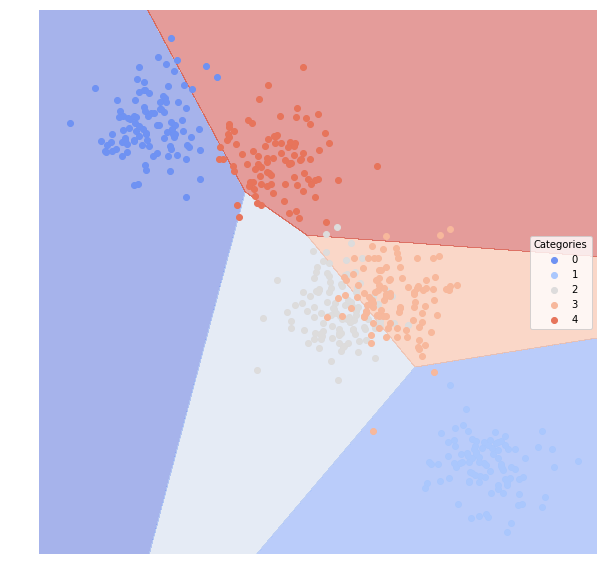

In [456]:
lucem_illud.plotregions(clf_log, dfTest_multi)

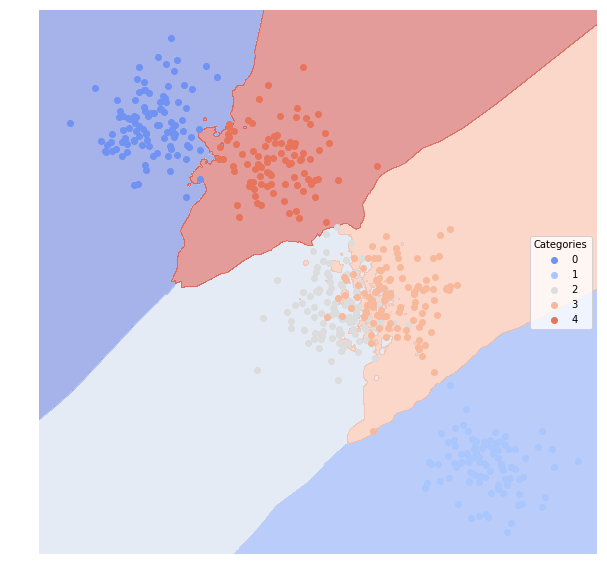

In [457]:
lucem_illud.plotregions(clf_KN, dfTest_multi)

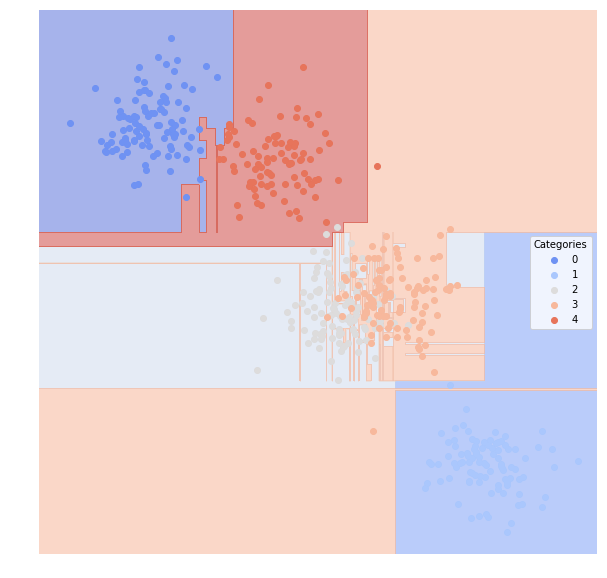

In [458]:
lucem_illud.plotregions(clf_decison, dfTest_multi)

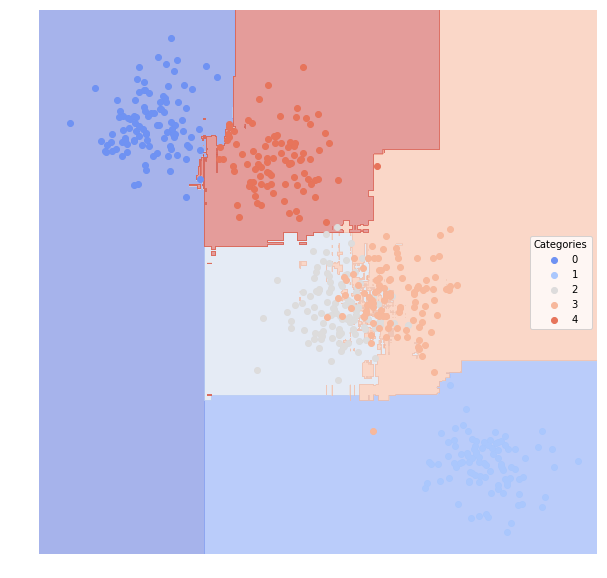

In [459]:
lucem_illud.plotregions(clf_forest, dfTest_multi)

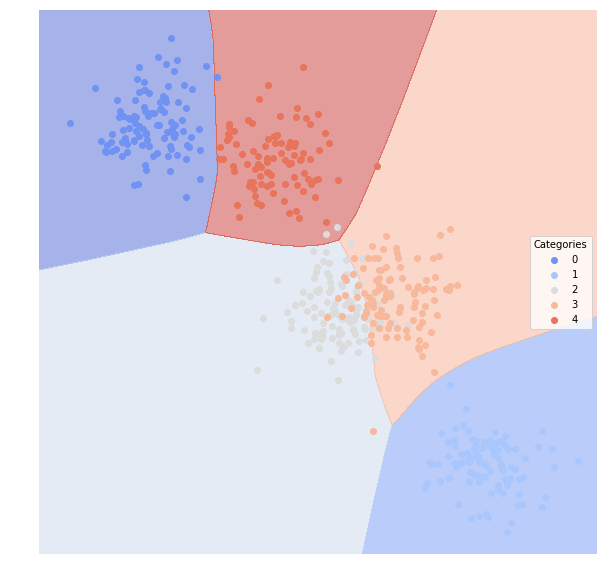

In [460]:
lucem_illud.plotregions(clf_network, dfTest_multi)

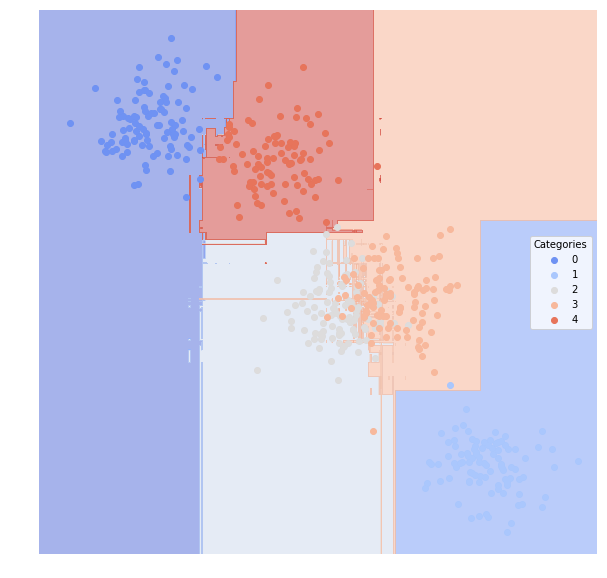

In [461]:
lucem_illud.plotregions(clf_ensemble, dfTest_multi)

In [ ]:
#multiSplit+Linear+noise=0.9
clf_linear.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+Bayes+noise=0.9
clf_bayes.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+polynomial+noise=0.2
clf_poly.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplitKNeighbors=+noise=0.2
clf_KN.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+logistics+noise=0.2
clf_log.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+Decisiontree+noise=0.2
clf_decison.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+randomforest+noise=0.2
clf_forest.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+connectionist+noise=0.2
clf_network.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

#multiSplit+ensemble+noise=0.2
clf_ensemble.fit(np.stack(dfTrain_multi['vect'], axis=0), dfTrain_multi['category'])

In [462]:
#multiSplit+Linear+noise=0.5
clf_linear.fit(np.stack(dfTrain_multi_5['vect'], axis=0), dfTrain_multi_5['category'])

#multiSplit+Bayes+noise=0.5
clf_bayes.fit(np.stack(dfTrain_multi_5['vect'], axis=0), dfTrain_multi_5['category'])

#multiSplit+polynomial+noise=0.5
clf_poly.fit(np.stack(dfTrain_multi_5['vect'], axis=0), dfTrain_multi_5['category'])

#multiSplitKNeighbors=+noise=0.5
clf_KN.fit(np.stack(dfTrain_multi_5['vect'], axis=0), dfTrain_multi_5['category'])

#multiSplit+logistics+noise=0.5
clf_log.fit(np.stack(dfTrain_multi_5['vect'], axis=0), dfTrain_multi_5['category'])

#multiSplit+Decisiontree+noise=0.5
clf_decison.fit(np.stack(dfTrain_multi_5['vect'], axis=0), dfTrain_multi_5['category'])

#multiSplit+randomforest+noise=0.5
clf_forest.fit(np.stack(dfTrain_multi_5['vect'], axis=0), dfTrain_multi_5['category'])

#multiSplit+connectionist+noise=0.5
clf_network.fit(np.stack(dfTrain_multi_5['vect'], axis=0), dfTrain_multi_5['category'])

#multiSplit+ensemble+noise=0.5
clf_ensemble.fit(np.stack(dfTrain_multi_5['vect'], axis=0), dfTrain_multi_5['category'])

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [463]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_multi_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,1.000000,1.000000,0.000,1.000000,1.000000
1,0.978064,0.950132,0.012,0.980198,0.961165
2,0.819150,0.569258,0.122,0.710280,0.716981
3,0.943360,0.828077,0.036,0.891304,0.911111
4,0.852981,0.630320,0.090,0.768421,0.760417


In [464]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_multi_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,1.000000,1.000000,0.000,1.000000,1.000000
1,0.968355,0.934722,0.016,0.979798,0.941748
2,0.827315,0.577784,0.120,0.709091,0.735849
3,0.940921,0.810799,0.040,0.872340,0.911111
4,0.850248,0.634957,0.088,0.782609,0.750000


In [465]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_multi_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,1.000000,1.000000,0.000,1.000000,1.000000
1,0.973209,0.942427,0.014,0.980000,0.951456
2,0.824059,0.546896,0.136,0.655738,0.754717
3,0.942141,0.819345,0.038,0.881720,0.911111
4,0.800639,0.568521,0.104,0.775000,0.645833


In [466]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_multi_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,1.000000,1.000000,0.000,1.000000,1.000000
1,0.965836,0.916451,0.020,0.960396,0.941748
2,0.776889,0.484736,0.156,0.625000,0.660377
3,0.892818,0.715645,0.062,0.831461,0.822222
4,0.823226,0.573921,0.106,0.731183,0.708333


In [467]:
lucem_illud.evaluateClassifier(clf_log, dfTest_multi_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,1.000000,1.000000,0.000,1.000000,1.000000
1,0.976804,0.940895,0.014,0.970588,0.961165
2,0.732425,0.465246,0.150,0.691358,0.528302
3,0.921274,0.738294,0.058,0.808081,0.888889
4,0.862933,0.596841,0.106,0.690265,0.812500


In [468]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_multi_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,1.000000,1.000000,0.000,1.000000,1.000000
1,0.976804,0.940895,0.014,0.970588,0.961165
2,0.762738,0.466523,0.162,0.614679,0.632075
3,0.887940,0.686241,0.070,0.795699,0.822222
4,0.819255,0.571851,0.106,0.736264,0.697917


In [469]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_multi_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,1.000000,1.000000,0.000,1.000000,1.000000
1,0.962241,0.917795,0.020,0.969697,0.932039
2,0.789412,0.490945,0.158,0.611570,0.698113
3,0.903930,0.733250,0.058,0.835165,0.844444
4,0.795689,0.544687,0.112,0.738095,0.645833


In [470]:
lucem_illud.evaluateClassifier(clf_network, dfTest_multi_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,1.000000,1.000000,0.000,1.000000,1.000000
1,0.969614,0.944138,0.014,0.989796,0.941748
2,0.823867,0.575907,0.120,0.712963,0.726415
3,0.963144,0.846549,0.032,0.877551,0.955556
4,0.832147,0.598986,0.098,0.758242,0.718750


In [471]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_multi_5)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,1.000000,1.000000,0.000,1.000000,1.000000
1,0.971950,0.933195,0.016,0.970297,0.951456
2,0.814984,0.544382,0.134,0.669565,0.726415
3,0.929810,0.792947,0.044,0.869565,0.888889
4,0.817760,0.581552,0.102,0.758621,0.687500


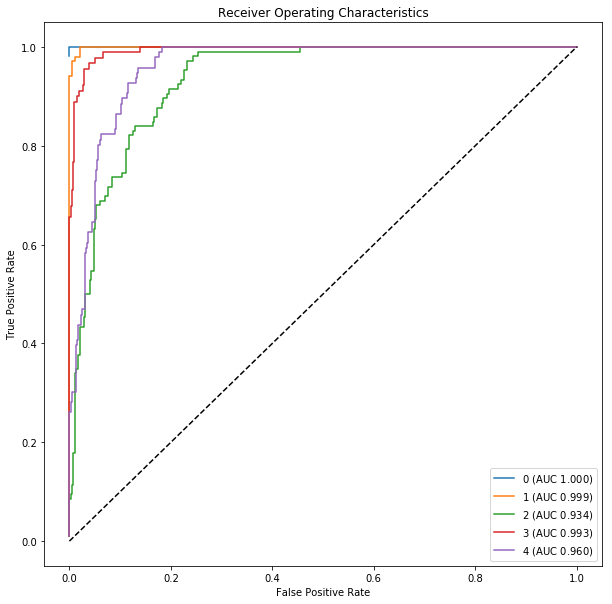

In [472]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_multi_5)

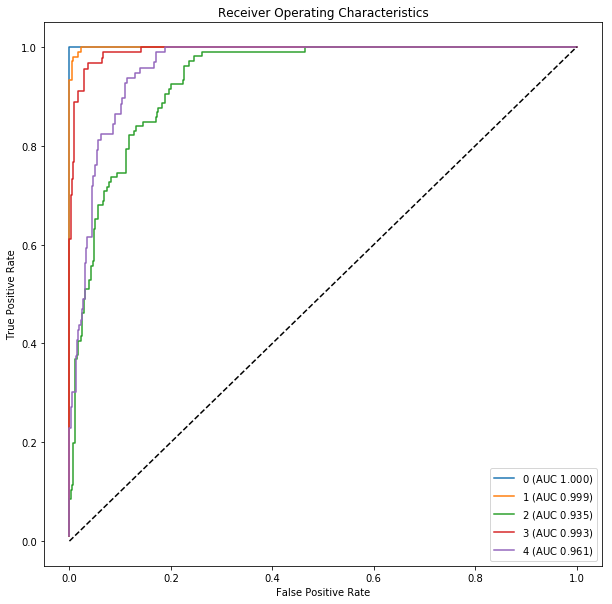

In [473]:
lucem_illud.plotMultiROC(clf_linear, dfTest_multi_5)

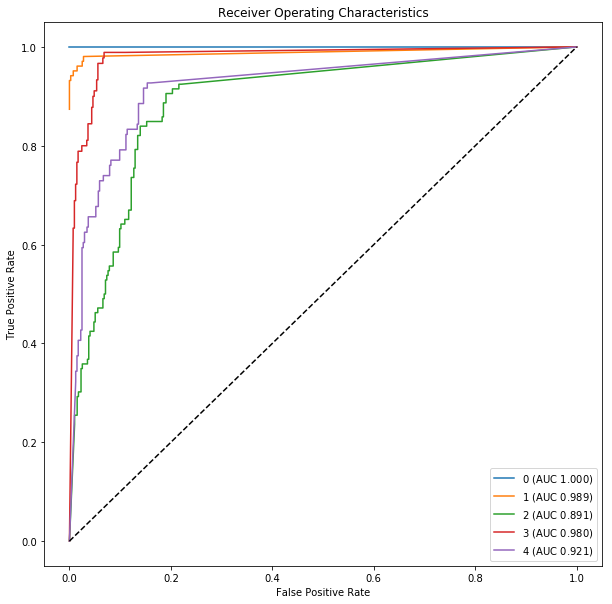

In [474]:
lucem_illud.plotMultiROC(clf_KN, dfTest_multi_5)

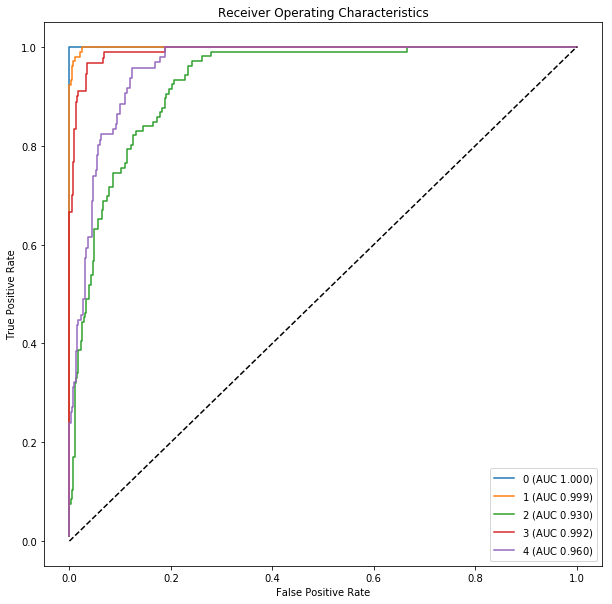

In [475]:
lucem_illud.plotMultiROC(clf_poly, dfTest_multi_5)

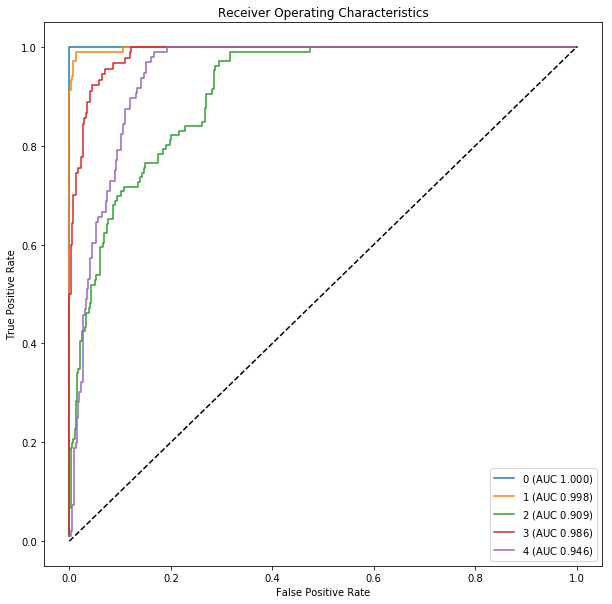

In [476]:
lucem_illud.plotMultiROC(clf_log, dfTest_multi_5)

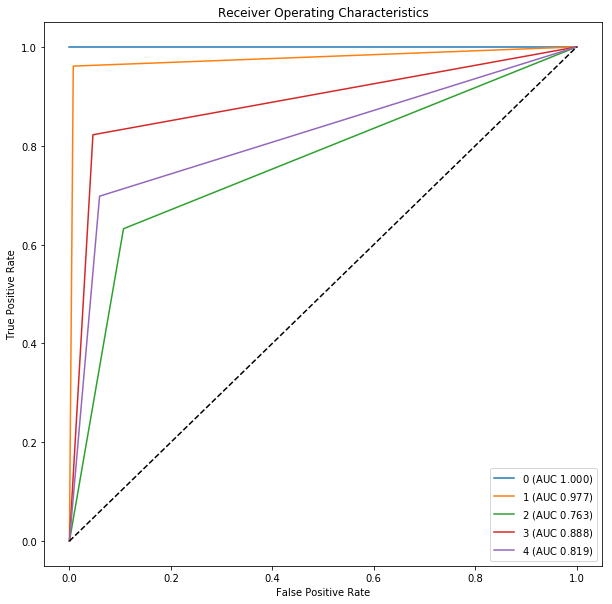

In [477]:
lucem_illud.plotMultiROC(clf_decison, dfTest_multi_5)

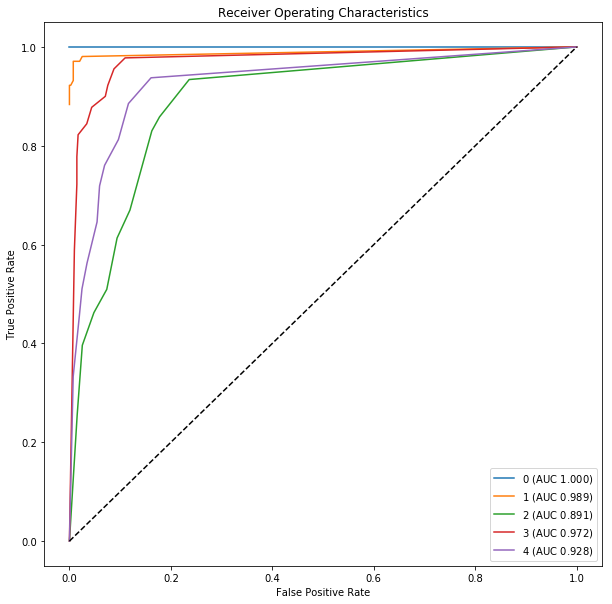

In [478]:
lucem_illud.plotMultiROC(clf_forest, dfTest_multi_5)

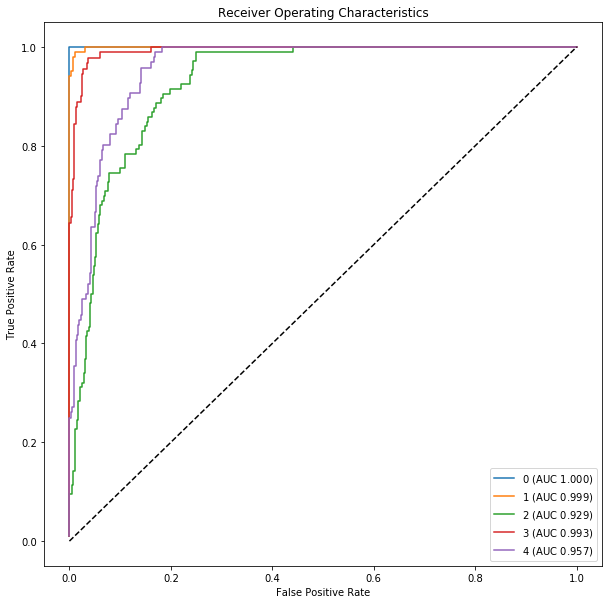

In [479]:
lucem_illud.plotMultiROC(clf_network, dfTest_multi_5)

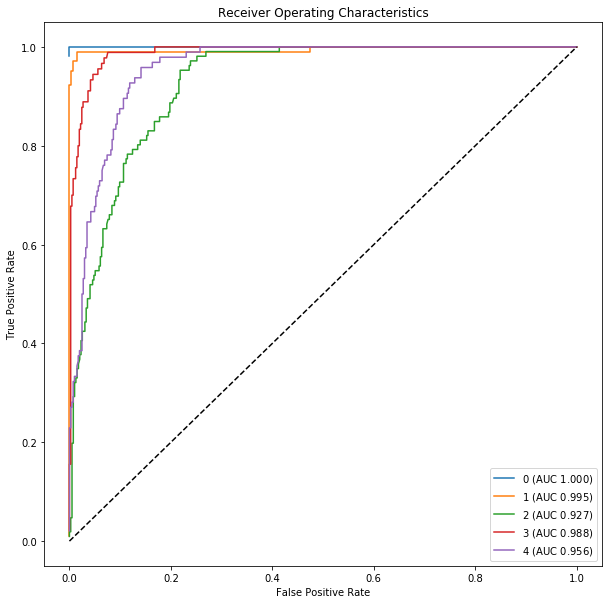

In [480]:
lucem_illud.plotMultiROC(clf_ensemble,dfTest_multi_5)

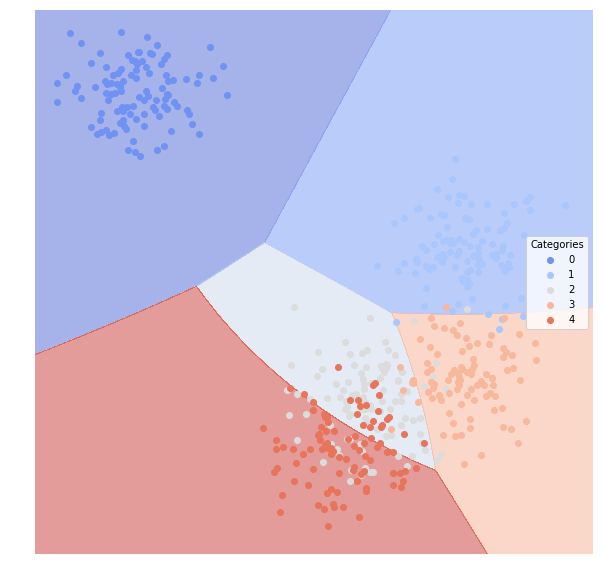

In [481]:
lucem_illud.plotregions(clf_bayes, dfTest_multi_5)

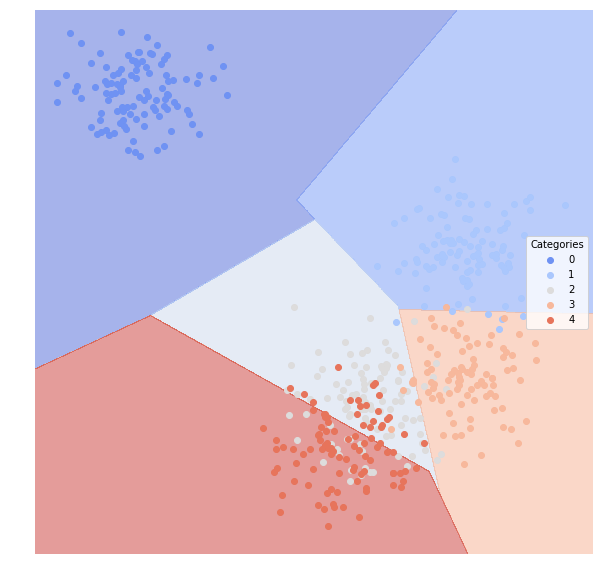

In [482]:
lucem_illud.plotregions(clf_linear, dfTest_multi_5)

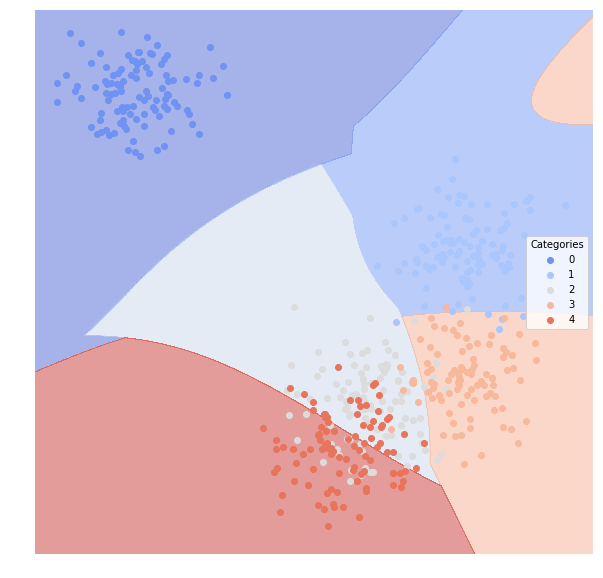

In [483]:
lucem_illud.plotregions(clf_poly,dfTest_multi_5)

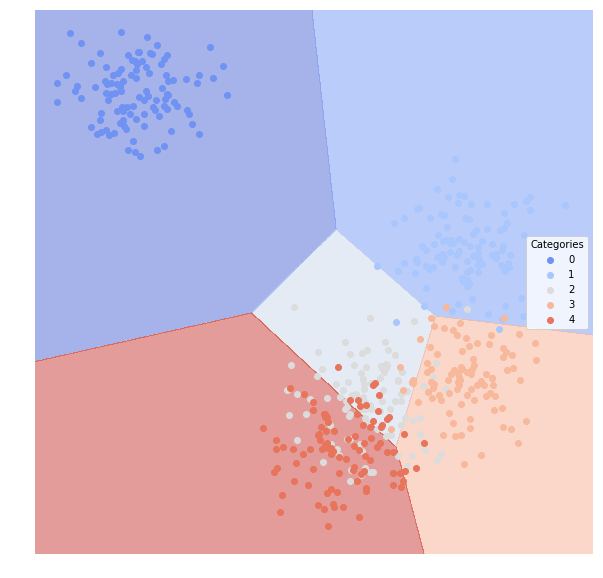

In [484]:
lucem_illud.plotregions(clf_log, dfTest_multi_5)

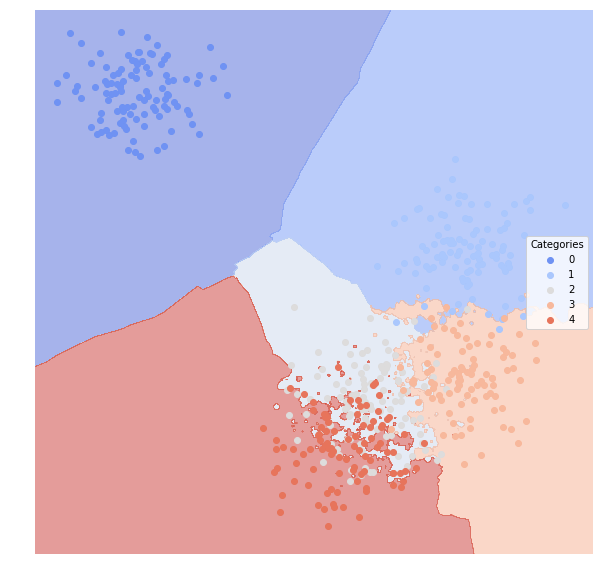

In [485]:
lucem_illud.plotregions(clf_KN, dfTest_multi_5)

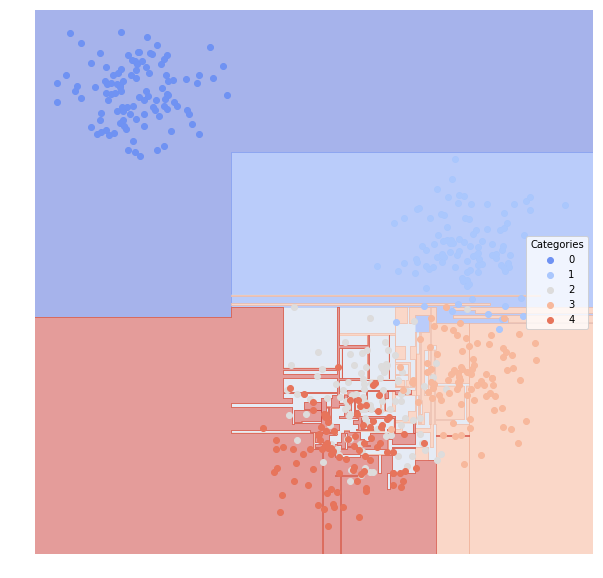

In [486]:
lucem_illud.plotregions(clf_decison, dfTest_multi_5)

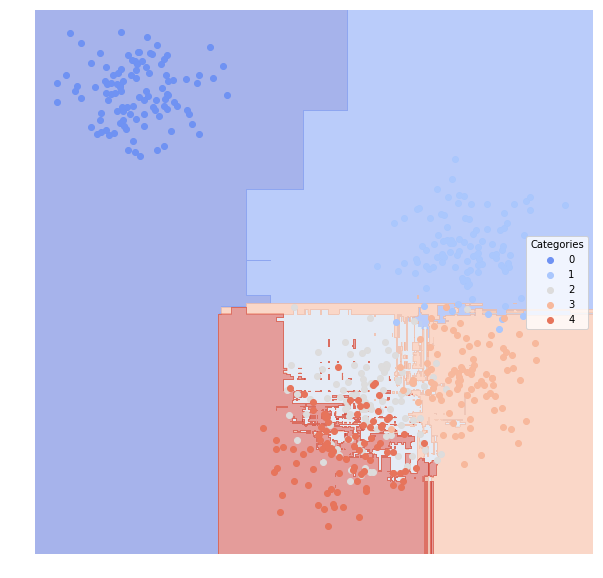

In [487]:
lucem_illud.plotregions(clf_forest, dfTest_multi_5)

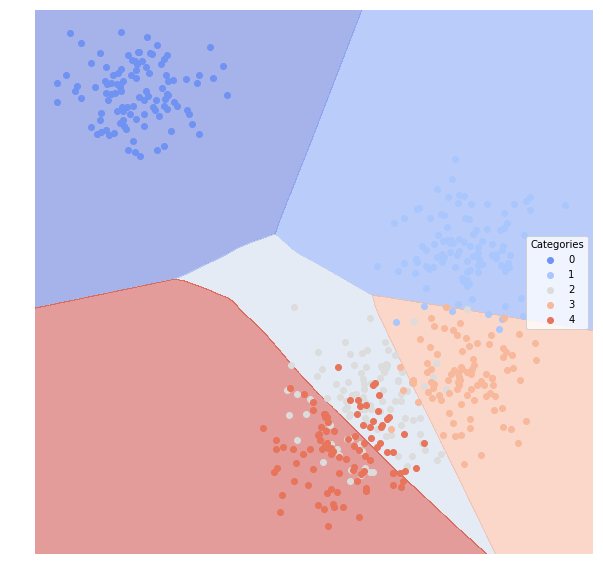

In [488]:
lucem_illud.plotregions(clf_network, dfTest_multi_5)

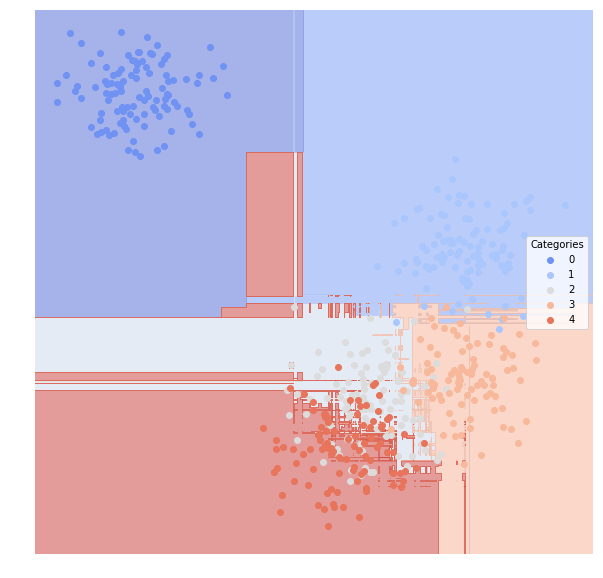

In [489]:
lucem_illud.plotregions(clf_ensemble, dfTest_multi_5)

## Algorithm evaluation

We can look at few measurements of each classifier's performance by using the testing set

In [92]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_xor)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.491342,0.480746,0.51,0.477064,0.536082
1,0.491342,0.510755,0.51,0.505495,0.446602


In [93]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_xor)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.580472,0.530100,0.425,0.544118,0.762887
1,0.580472,0.565006,0.425,0.640625,0.398058


In [59]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_xor)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.694525,0.612361,0.31,0.635659,0.845361
1,0.694525,0.663825,0.31,0.788732,0.543689


In [60]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_xor)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.893854,0.859118,0.105,0.922222,0.855670
1,0.893854,0.848416,0.105,0.872727,0.932039


In [61]:
lucem_illud.evaluateClassifier(clf_log, dfTest_xor)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.527425,0.499367,0.475,0.508621,0.608247
1,0.527425,0.529568,0.475,0.547619,0.446602


In [62]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_xor)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.885347,0.830309,0.115,0.87,0.896907
1,0.885347,0.851408,0.115,0.90,0.873786


In [63]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_xor)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.930237,0.892335,0.07,0.919192,0.938144
1,0.930237,0.907538,0.07,0.940594,0.922330


In [64]:
lucem_illud.evaluateClassifier(clf_network, dfTest_xor)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.895056,0.846234,0.105,0.887755,0.896907
1,0.895056,0.860635,0.105,0.901961,0.893204


In [65]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_xor)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.909619,0.871378,0.09,0.915789,0.896907
1,0.909619,0.874489,0.09,0.904762,0.922330


This lets us look at which classes do better:

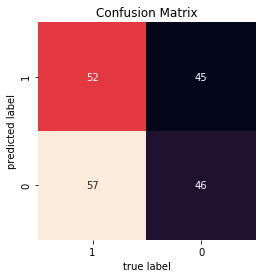

In [66]:
lucem_illud.plotConfusionMatrix(clf_bayes, dfTest_xor)

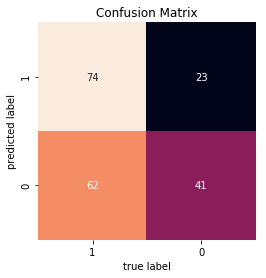

In [67]:
lucem_illud.plotConfusionMatrix(clf_linear, dfTest_xor)

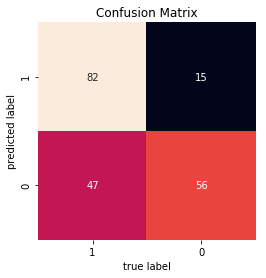

In [68]:
lucem_illud.plotConfusionMatrix(clf_poly, dfTest_xor)

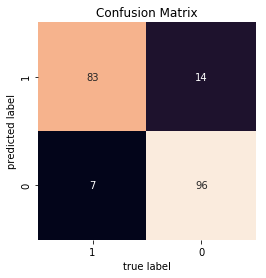

In [69]:
lucem_illud.plotConfusionMatrix(clf_KN, dfTest_xor)

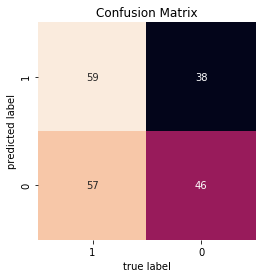

In [70]:
lucem_illud.plotConfusionMatrix(clf_log, dfTest_xor)

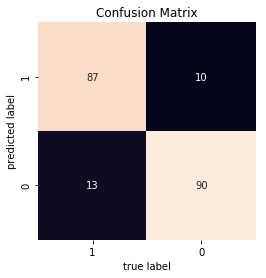

In [71]:
lucem_illud.plotConfusionMatrix(clf_decison, dfTest_xor)

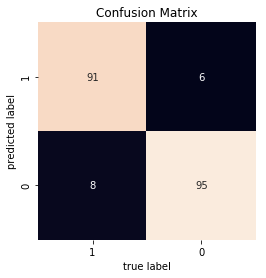

In [72]:
lucem_illud.plotConfusionMatrix(clf_forest, dfTest_xor)

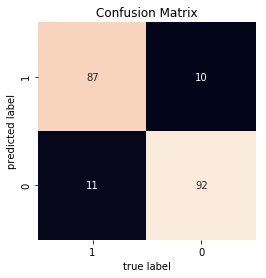

In [73]:
lucem_illud.plotConfusionMatrix(clf_network, dfTest_xor)

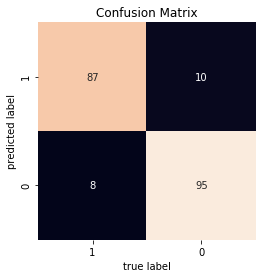

In [74]:
lucem_illud.plotConfusionMatrix(clf_ensemble, dfTest_xor)

The greater the area under the curve the better.

//anaconda/lib/python3.5/site-packages/sklearn/metrics/ranking.py:571: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning)


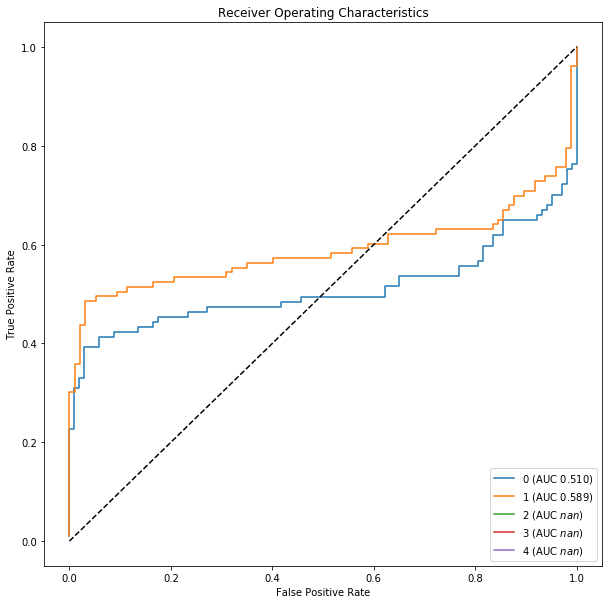

In [490]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_xor)

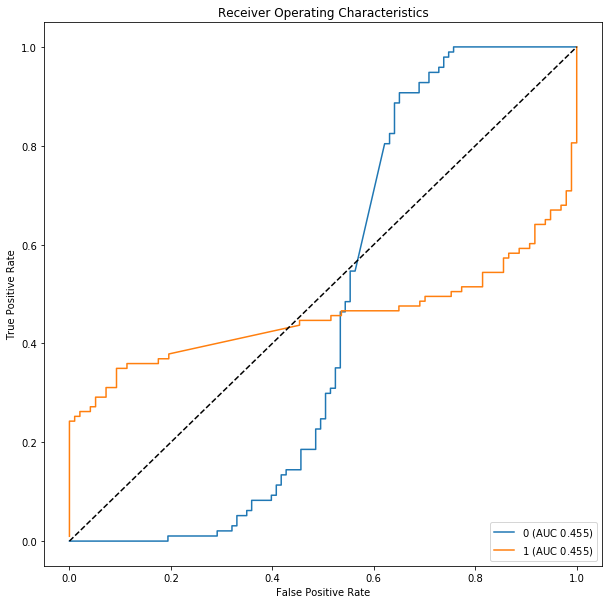

In [501]:
lucem_illud.plotMultiROC(clf_linear, dfTest_xor)

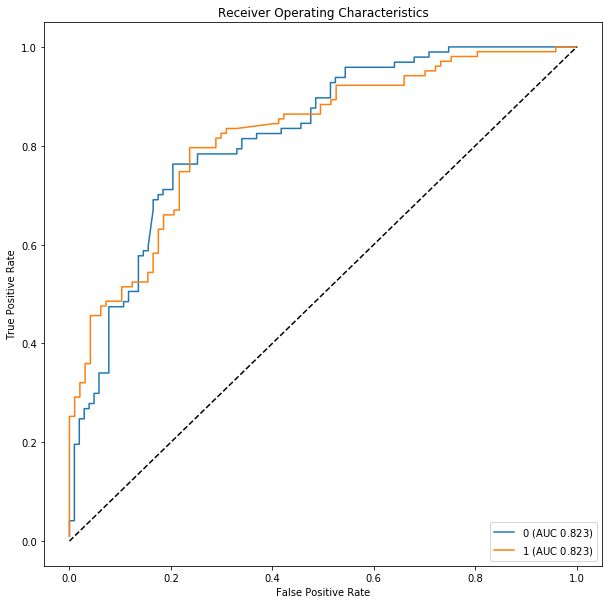

In [502]:
lucem_illud.plotMultiROC(clf_poly, dfTest_xor)

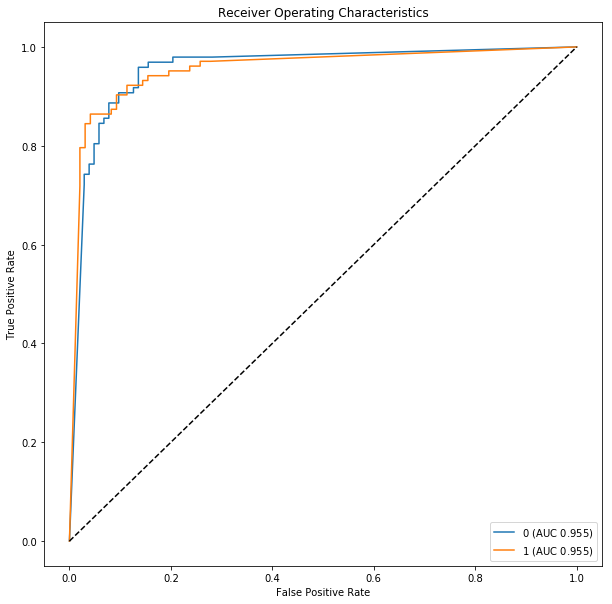

In [503]:
lucem_illud.plotMultiROC(clf_KN, dfTest_xor)

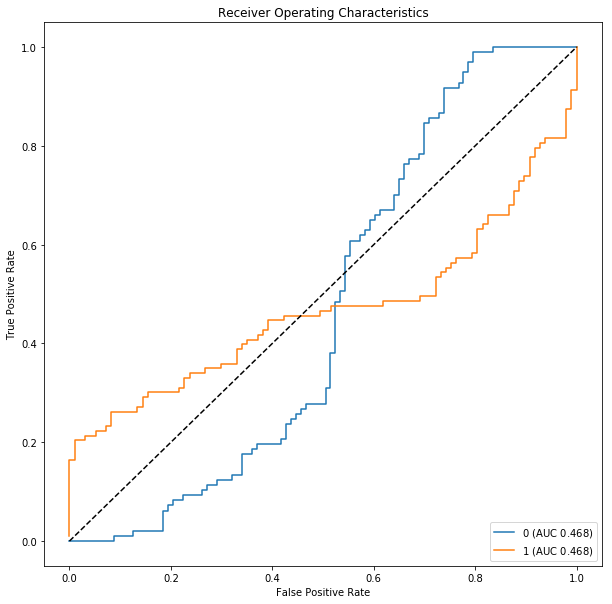

In [504]:
lucem_illud.plotMultiROC(clf_log, dfTest_xor)

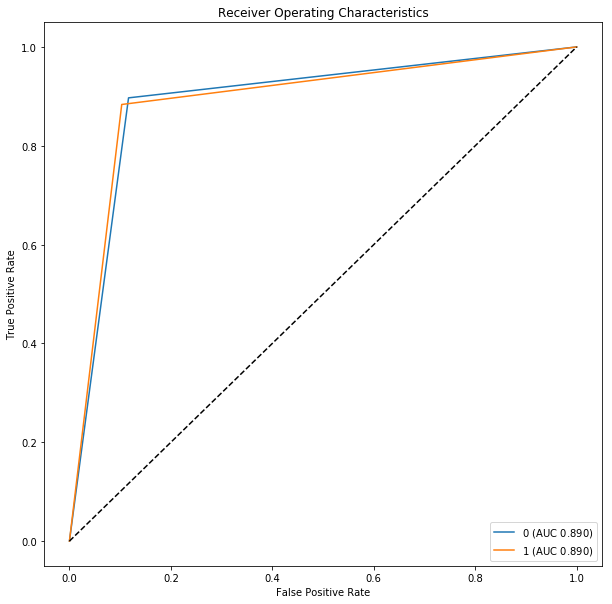

In [505]:
lucem_illud.plotMultiROC(clf_decison, dfTest_xor)

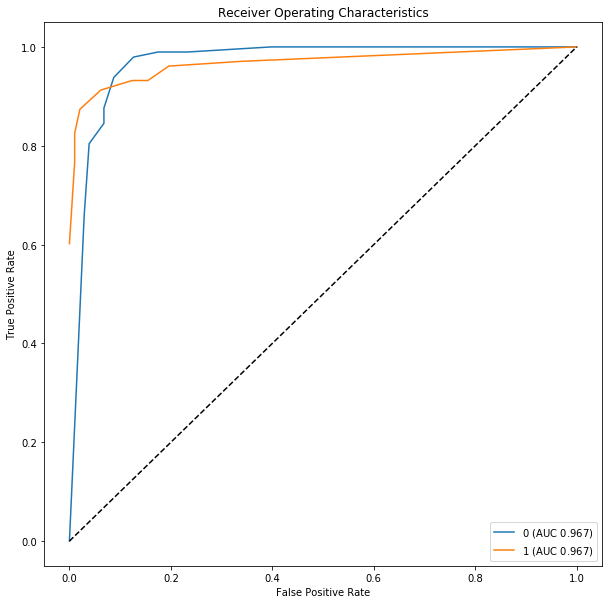

In [506]:
lucem_illud.plotMultiROC(clf_forest, dfTest_xor)

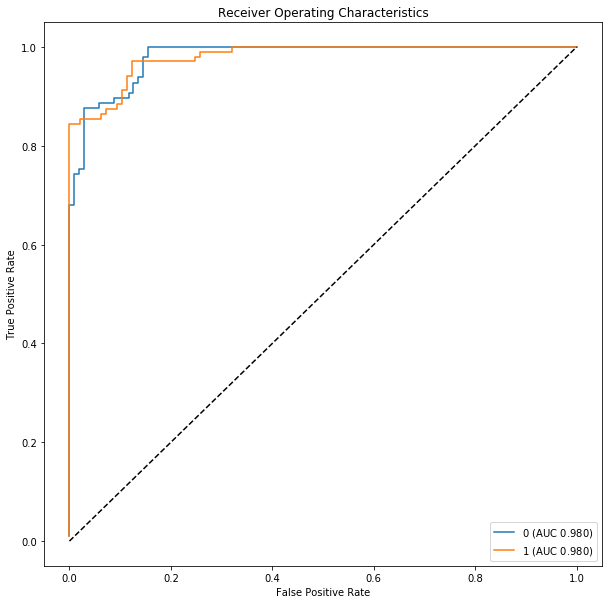

In [507]:
lucem_illud.plotMultiROC(clf_network, dfTest_xor)

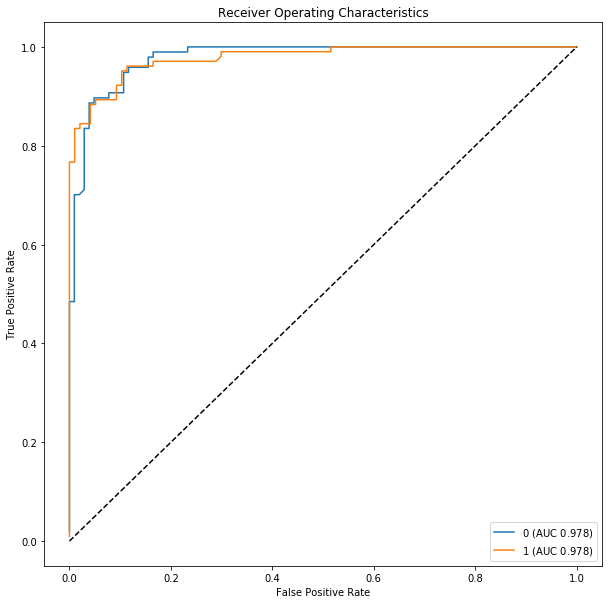

In [508]:
lucem_illud.plotMultiROC(clf_ensemble, dfTest_xor)

We can also look at the regions the classifer identifies as one class or the other:

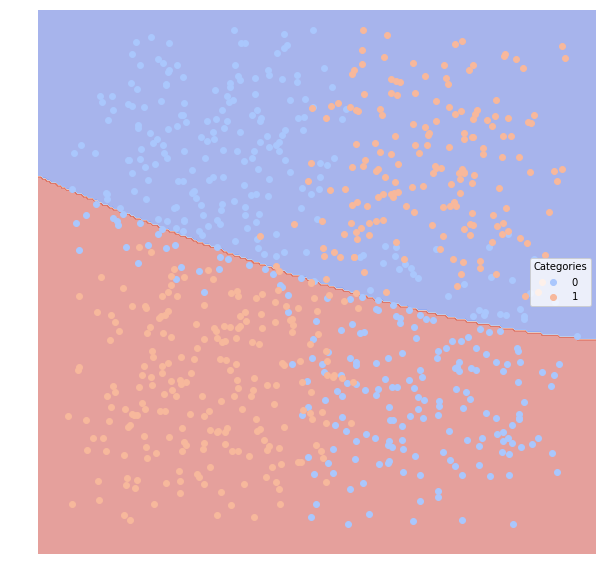

In [75]:
lucem_illud.plotregions(clf_bayes, dfTrain_xor)

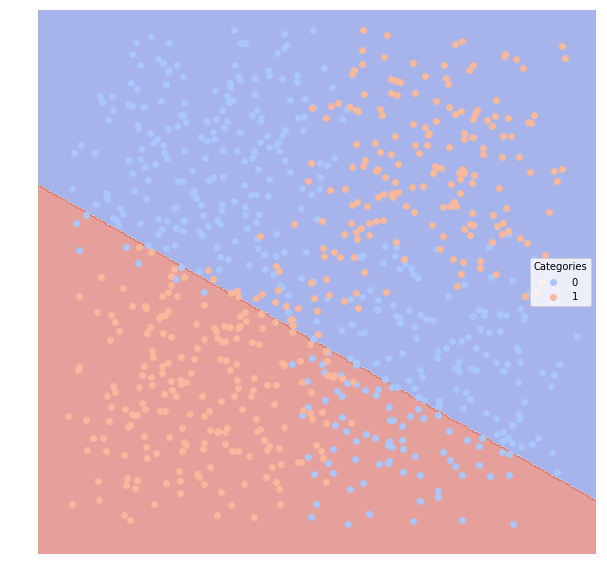

In [76]:
lucem_illud.plotregions(clf_linear, dfTrain_xor)

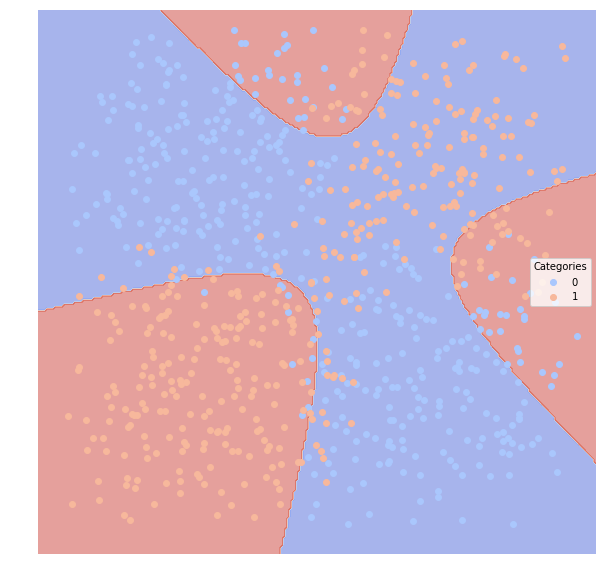

In [77]:
lucem_illud.plotregions(clf_poly, dfTrain_xor)

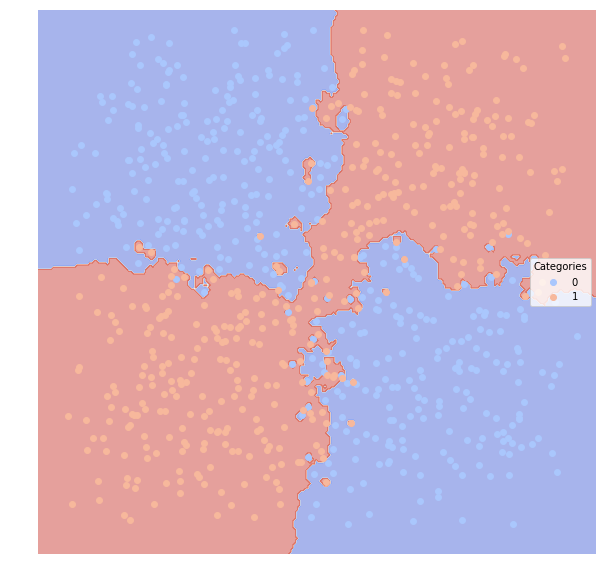

In [78]:
lucem_illud.plotregions(clf_KN, dfTrain_xor)

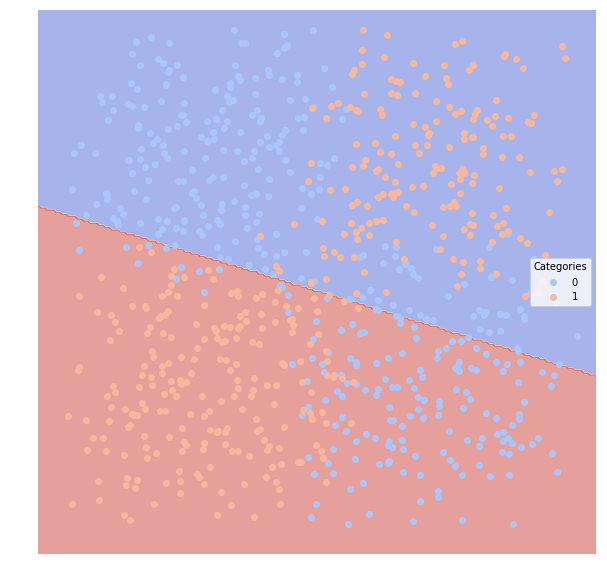

In [79]:
lucem_illud.plotregions(clf_log, dfTrain_xor)

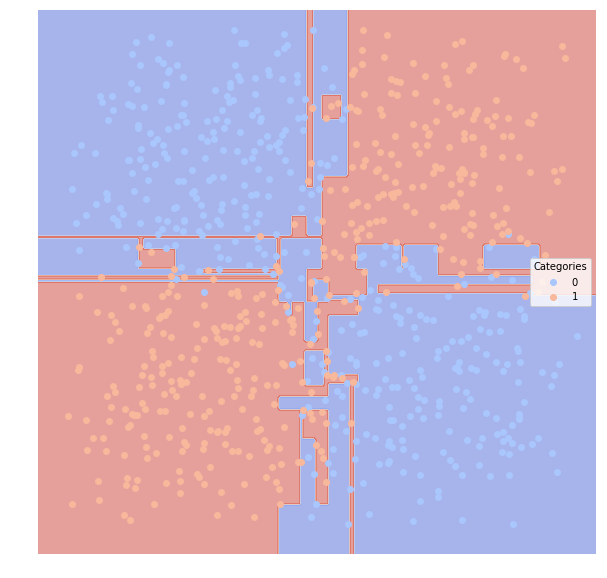

In [80]:
lucem_illud.plotregions(clf_decison, dfTrain_xor)

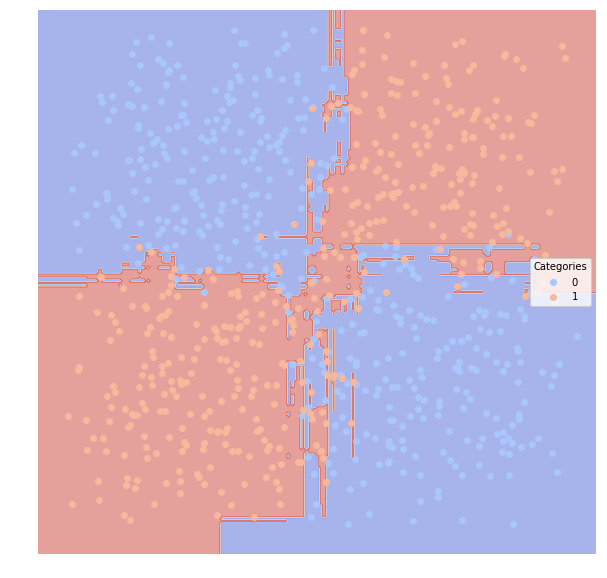

In [81]:
lucem_illud.plotregions(clf_forest, dfTrain_xor)

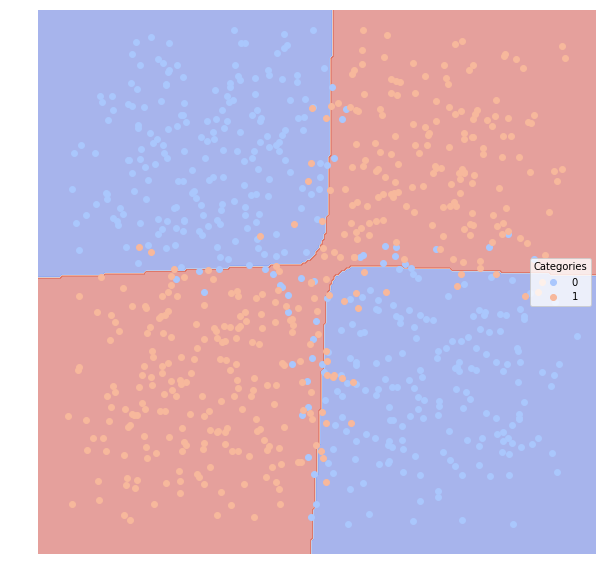

In [82]:
lucem_illud.plotregions(clf_network, dfTrain_xor)

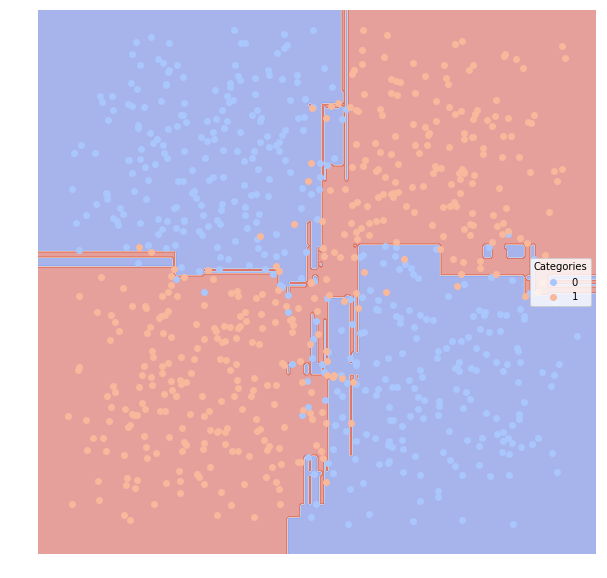

In [83]:
lucem_illud.plotregions(clf_ensemble, dfTrain_xor)

## Now we do the same for real data

Available data sets include:
+ Reddit threads "classified" by thread topic
+ 20 newsgroups "classified" by group topic
+ Senate press releases "classified" by Senator (2 senators)
+ Senate press releases "classified" by Senator (5 senators)
+ Emails classified as Spam or Ham

In [541]:
dfTrain_reddit, dfTest_reddit = lucem_illud.trainTestSplit(lucem_illud.loadReddit())
dfTrain_newsgroups, dfTest_newsgroups = lucem_illud.trainTestSplit(lucem_illud.loadNewsGroups())
dfTrain_senatesmall, dfTest_senatesmall = lucem_illud.trainTestSplit(lucem_illud.loadSenateSmall())
dfTrain_senatelarge, dfTest_senatelarge = lucem_illud.trainTestSplit(lucem_illud.loadSenateLarge())
dfTrain_spam, dfTest_spam = lucem_illud.trainTestSplit(lucem_illud.loadSpam())


Loading Reddit data
Converting to vectors
Loading data for: comp.sys.mac.hardware
Loading data for: comp.windows.x
Loading data for: misc.forsale
Loading data for: rec.autos
Converting to vectors
Loading senate data
Converting to vectors
Loading senator: Kennedy
Loading senator: Kerry
Loading senator: Klobuchar
Loading senator: Kohl
Loading senator: Kyl
Converting to vectors
Loading Spam
Loading Ham
Converting to vectors


In [542]:
#Bayes
clf_bayes = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf_linear = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up
clf_poly = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
clf_KN = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf_log = sklearn.linear_model.LogisticRegression()

#Symbolists
clf_decison = sklearn.tree.DecisionTreeClassifier()
clf_forest = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf_network = sklearn.neural_network.MLPClassifier()

#Ensemble
clf_ensemble = sklearn.ensemble.GradientBoostingClassifier()

In [4]:
#reddit+linear
clf_linear.fit(np.stack(dfTrain_reddit['vect'], axis=0), dfTrain_reddit['category'])
lucem_illud.evaluateClassifier(clf_linear, dfTest_reddit)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Relationships,0.980955,0.943628,0.015674,0.962025,0.974359
Tales From Tech Support,0.993671,0.990477,0.003135,1.000000,0.987342
Bad Roommates,0.995798,0.975904,0.006270,0.975904,1.000000
Weeaboo Tales,0.987654,0.981578,0.006270,1.000000,0.975309


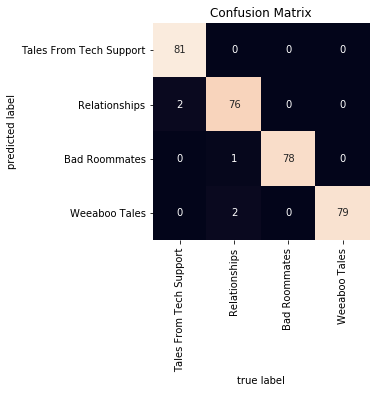

In [14]:
lucem_illud.plotConfusionMatrix(clf_linear, dfTest_reddit)

In [5]:
#reddit+bayes
clf_bayes.fit(np.stack(dfTrain_reddit['vect'], axis=0), dfTrain_reddit['category'])
lucem_illud.evaluateClassifier(clf_bayes, dfTest_reddit)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Relationships,0.663262,0.412708,0.194357,0.681818,0.384615
Tales From Tech Support,0.844014,0.722858,0.087774,0.918033,0.708861
Bad Roommates,0.815878,0.593055,0.141066,0.719512,0.728395
Weeaboo Tales,0.843215,0.544903,0.197492,0.568182,0.925926


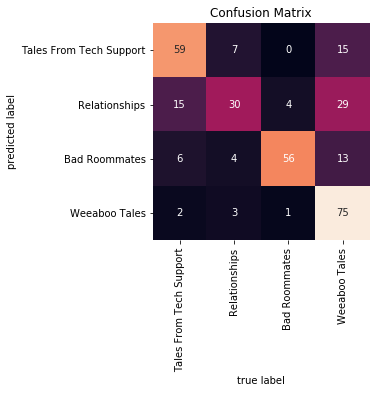

In [15]:
lucem_illud.plotConfusionMatrix(clf_bayes, dfTest_reddit)

In [6]:
#reddit+Poly
clf_poly.fit(np.stack(dfTrain_reddit['vect'], axis=0), dfTrain_reddit['category'])
lucem_illud.evaluateClassifier(clf_poly, dfTest_reddit)

//anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Relationships,0.854985,0.585386,0.153605,0.635514,0.871795
Tales From Tech Support,0.722917,0.372642,0.416928,0.372642,1.000000
Bad Roommates,0.500000,0.253918,0.253918,0.000000,0.000000
Weeaboo Tales,0.500000,0.253918,0.253918,0.000000,0.000000


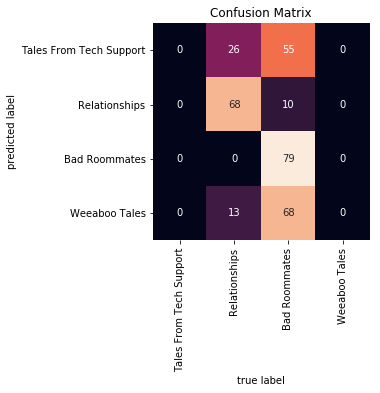

In [16]:
lucem_illud.plotConfusionMatrix(clf_poly, dfTest_reddit)

In [7]:
#reddit+KNeighbours
clf_KN.fit(np.stack(dfTrain_reddit['vect'], axis=0), dfTrain_reddit['category'])
lucem_illud.evaluateClassifier(clf_KN, dfTest_reddit)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Relationships,0.895734,0.783504,0.065831,0.901408,0.820513
Tales From Tech Support,0.941034,0.875880,0.037618,0.946667,0.898734
Bad Roommates,0.972689,0.861702,0.040752,0.861702,1.000000
Weeaboo Tales,0.954560,0.897852,0.031348,0.949367,0.925926


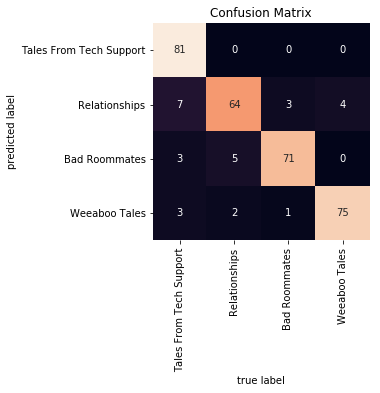

In [17]:
lucem_illud.plotConfusionMatrix(clf_KN, dfTest_reddit)

In [8]:
#reddit+logistic
clf_log.fit(np.stack(dfTrain_reddit['vect'], axis=0), dfTrain_reddit['category'])
lucem_illud.evaluateClassifier(clf_log, dfTest_reddit)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Relationships,0.980955,0.943628,0.015674,0.962025,0.974359
Tales From Tech Support,0.993671,0.990477,0.003135,1.000000,0.987342
Bad Roommates,0.995798,0.975904,0.006270,0.975904,1.000000
Weeaboo Tales,0.987654,0.981578,0.006270,1.000000,0.975309


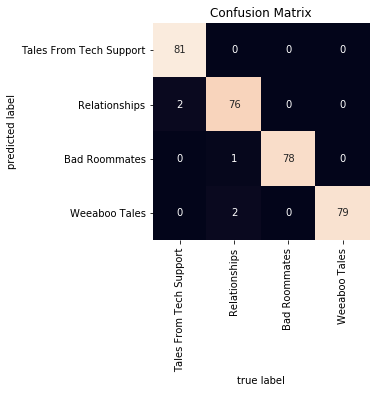

In [18]:
lucem_illud.plotConfusionMatrix(clf_log, dfTest_reddit)

In [9]:
#reddit+decisiontree
clf_decison.fit(np.stack(dfTrain_reddit['vect'], axis=0), dfTrain_reddit['category'])
lucem_illud.evaluateClassifier(clf_decison, dfTest_reddit)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Relationships,0.866874,0.649367,0.115987,0.730337,0.833333
Tales From Tech Support,0.875976,0.696095,0.097179,0.792683,0.822785
Bad Roommates,0.892572,0.763624,0.075235,0.870130,0.827160
Weeaboo Tales,0.905177,0.824447,0.056426,0.943662,0.827160


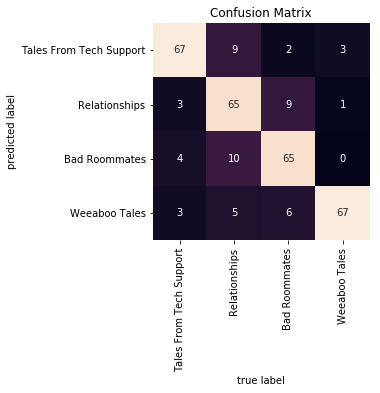

In [19]:
lucem_illud.plotConfusionMatrix(clf_decison, dfTest_reddit)

In [10]:
#reddit+Randomforest
clf_forest.fit(np.stack(dfTrain_reddit['vect'], axis=0), dfTrain_reddit['category'])
lucem_illud.evaluateClassifier(clf_forest, dfTest_reddit)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Relationships,0.874801,0.707861,0.090909,0.818182,0.807692
Tales From Tech Support,0.924130,0.858872,0.043887,0.957746,0.860759
Bad Roommates,0.900327,0.716385,0.094044,0.774194,0.888889
Weeaboo Tales,0.956660,0.909122,0.028213,0.961538,0.925926


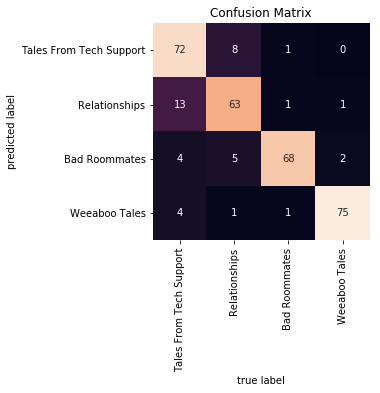

In [20]:
lucem_illud.plotConfusionMatrix(clf_forest, dfTest_reddit)

In [11]:
#reddit+Connectionists
clf_network.fit(np.stack(dfTrain_reddit['vect'], axis=0),dfTrain_reddit['category'])
lucem_illud.evaluateClassifier(clf_network, dfTest_reddit)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Relationships,0.976620,0.945968,0.015674,0.974026,0.961538
Tales From Tech Support,0.987342,0.980953,0.006270,1.000000,0.974684
Bad Roommates,0.985424,0.943758,0.015674,0.952381,0.987654
Weeaboo Tales,0.991726,0.978596,0.006270,0.987654,0.987654


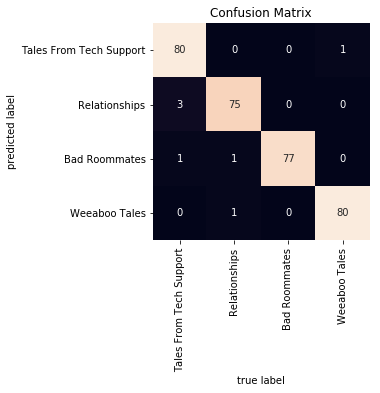

In [21]:
lucem_illud.plotConfusionMatrix(clf_network, dfTest_reddit)

In [12]:
#reddit+ensemble
clf_ensemble.fit(np.stack(dfTrain_reddit['vect'], axis=0), dfTrain_reddit['category'])
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_reddit)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Relationships,0.968321,0.899718,0.028213,0.925926,0.961538
Tales From Tech Support,0.993750,0.963415,0.009404,0.963415,1.000000
Bad Roommates,0.971107,0.939090,0.018809,0.974684,0.950617
Weeaboo Tales,0.975309,0.963156,0.012539,1.000000,0.950617


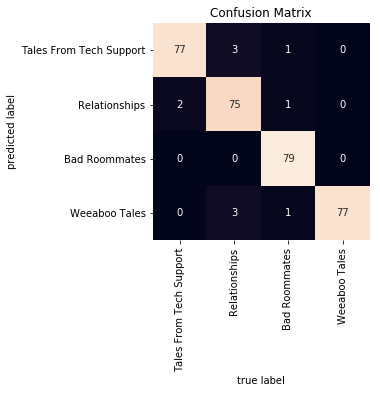

In [22]:
lucem_illud.plotConfusionMatrix(clf_ensemble, dfTest_reddit)

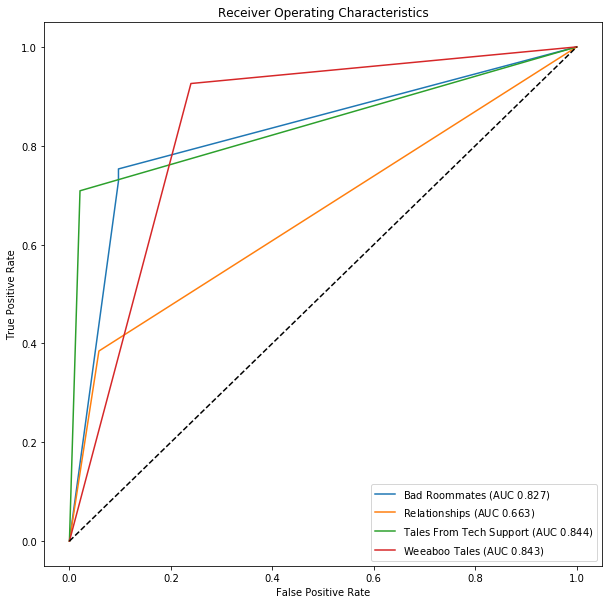

In [23]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_reddit)

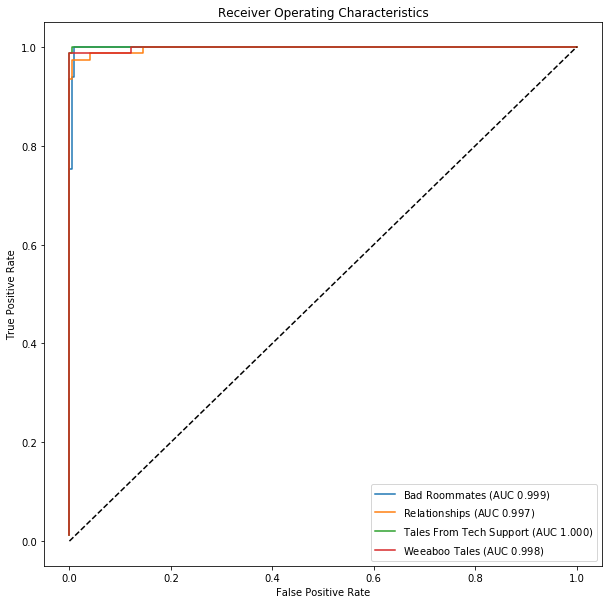

In [24]:
lucem_illud.plotMultiROC(clf_linear, dfTest_reddit)

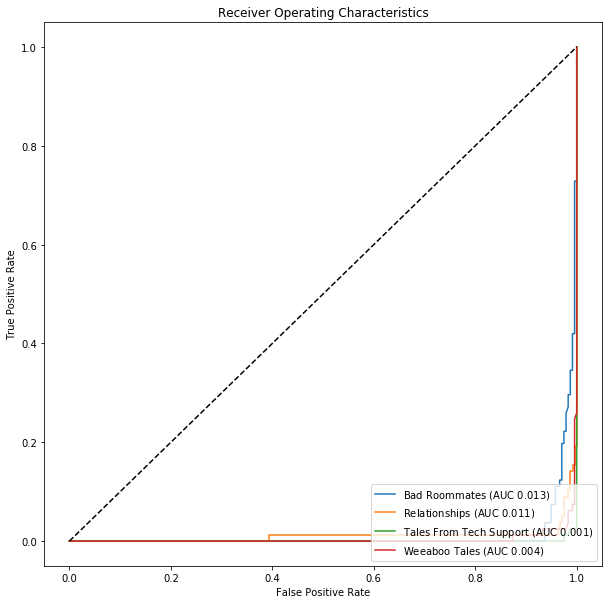

In [25]:
lucem_illud.plotMultiROC(clf_poly, dfTest_reddit)

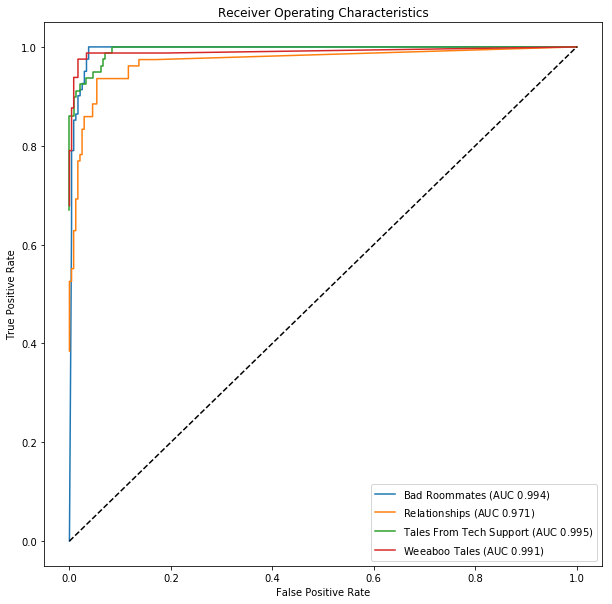

In [26]:
lucem_illud.plotMultiROC(clf_KN, dfTest_reddit)

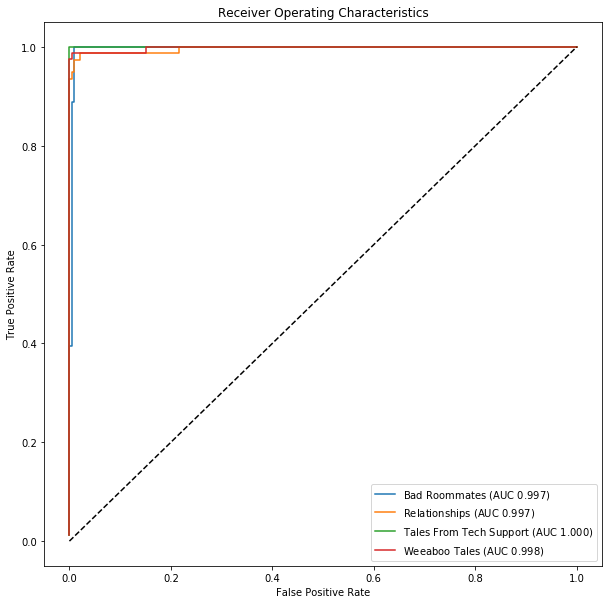

In [27]:
lucem_illud.plotMultiROC(clf_log, dfTest_reddit)

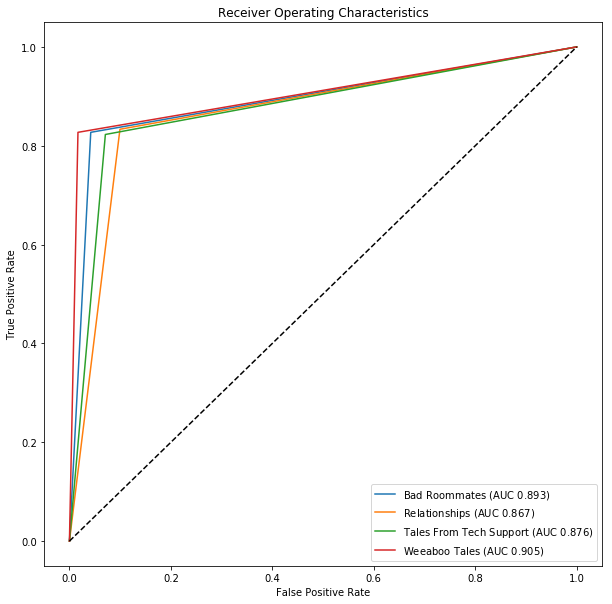

In [28]:
lucem_illud.plotMultiROC(clf_decison, dfTest_reddit)

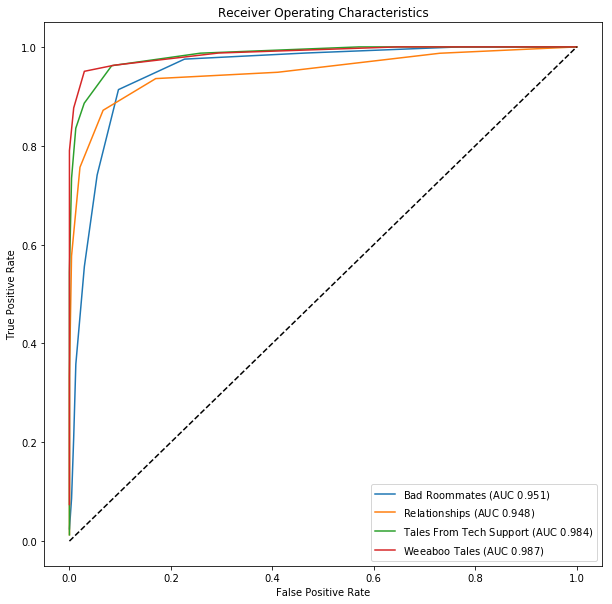

In [29]:
lucem_illud.plotMultiROC(clf_forest, dfTest_reddit)

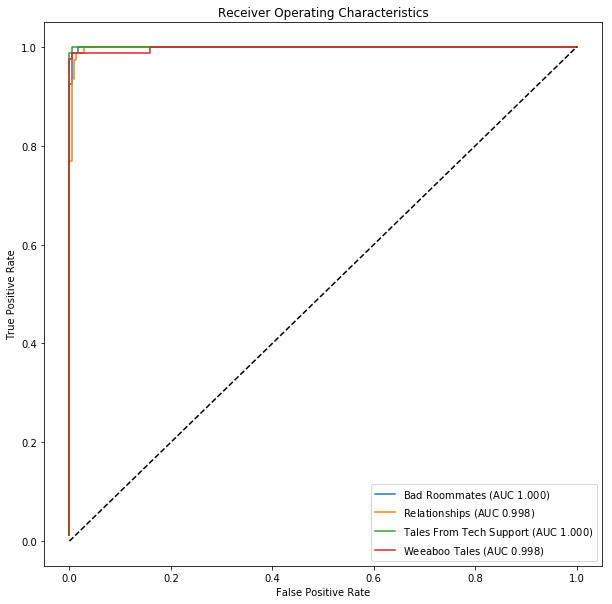

In [30]:
lucem_illud.plotMultiROC(clf_network, dfTest_reddit)

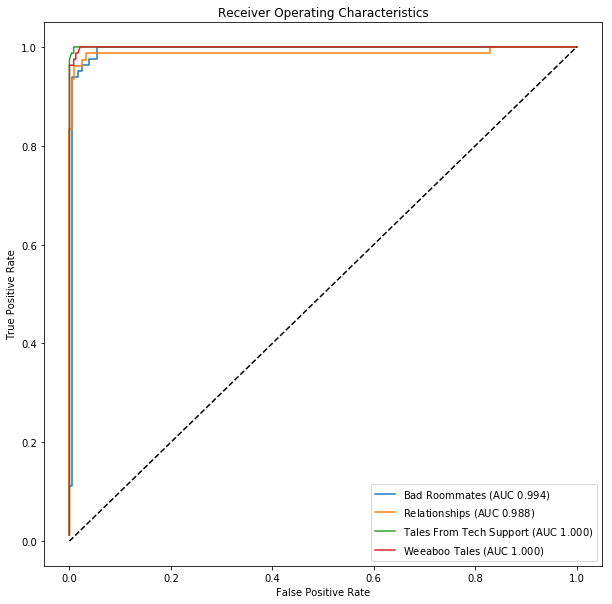

In [31]:
lucem_illud.plotMultiROC(clf_ensemble, dfTest_reddit)

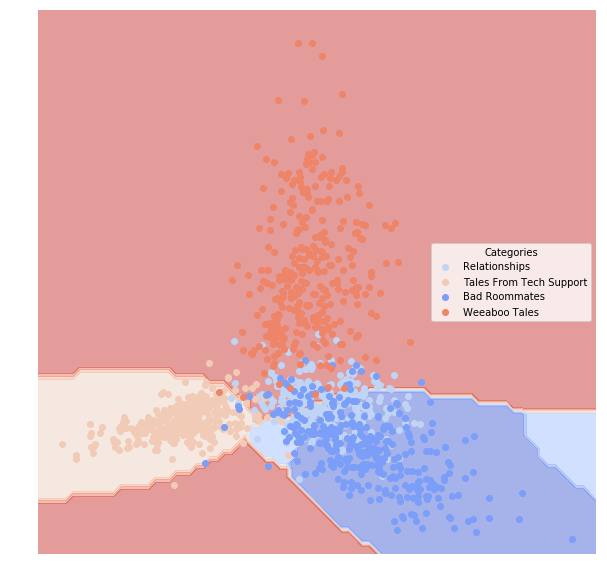

In [32]:
lucem_illud.plotregions(clf_bayes, dfTrain_reddit)

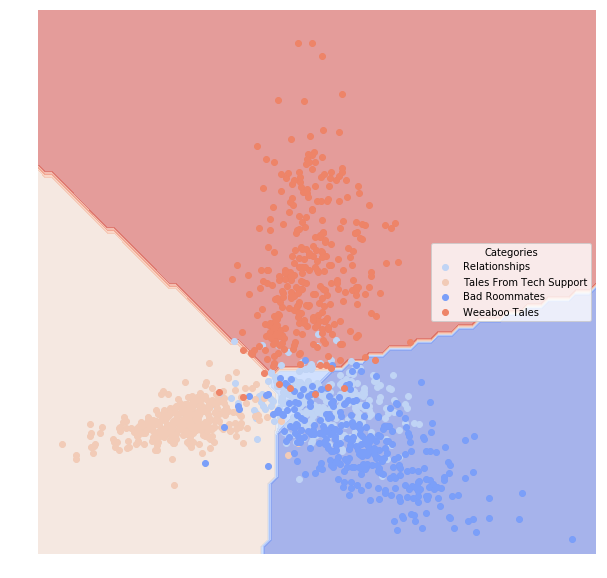

In [33]:
lucem_illud.plotregions(clf_linear, dfTrain_reddit)

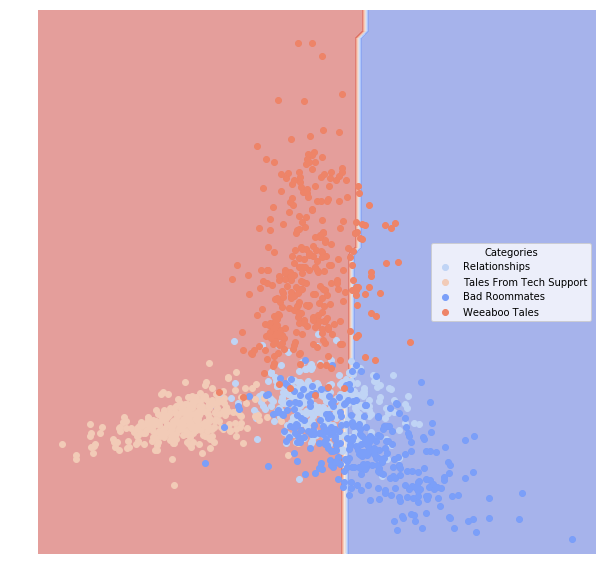

In [34]:
lucem_illud.plotregions(clf_poly, dfTrain_reddit)

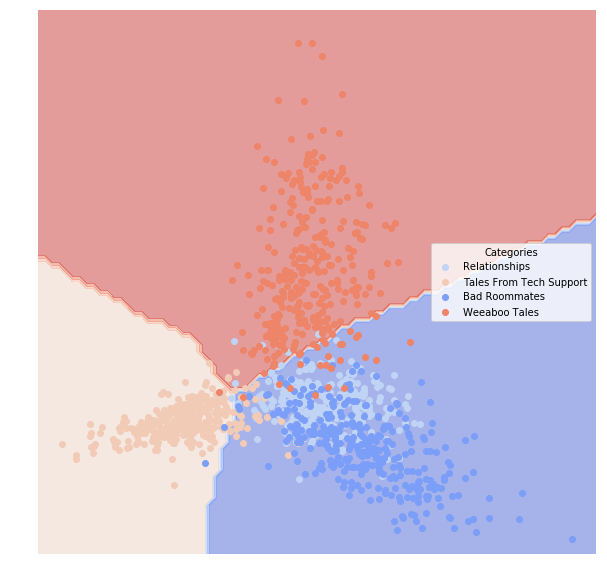

In [35]:
lucem_illud.plotregions(clf_KN, dfTrain_reddit)

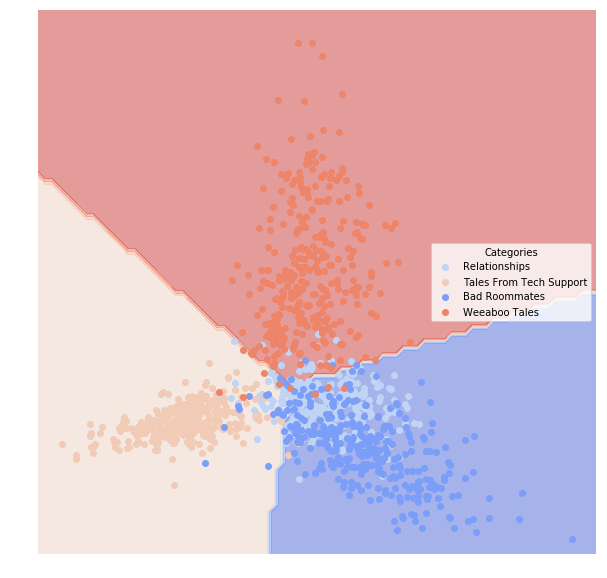

In [36]:
lucem_illud.plotregions(clf_log, dfTrain_reddit)

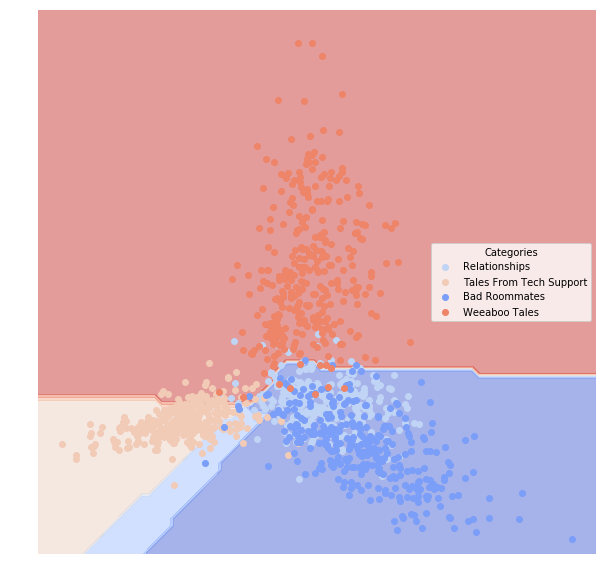

In [37]:
lucem_illud.plotregions(clf_decison, dfTrain_reddit)

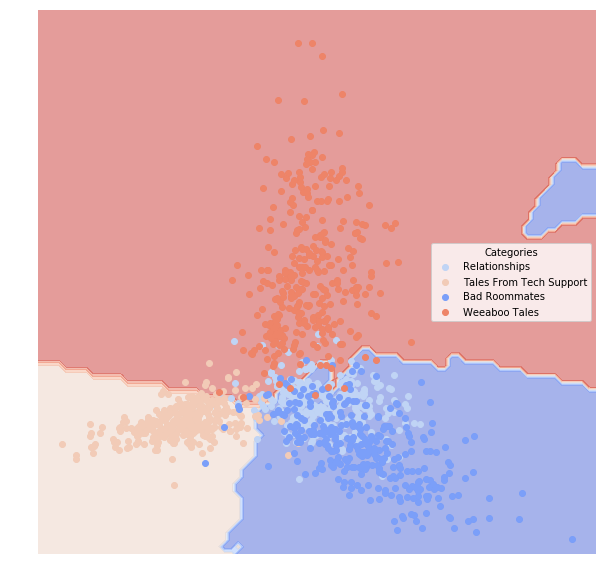

In [38]:
lucem_illud.plotregions(clf_forest, dfTrain_reddit)

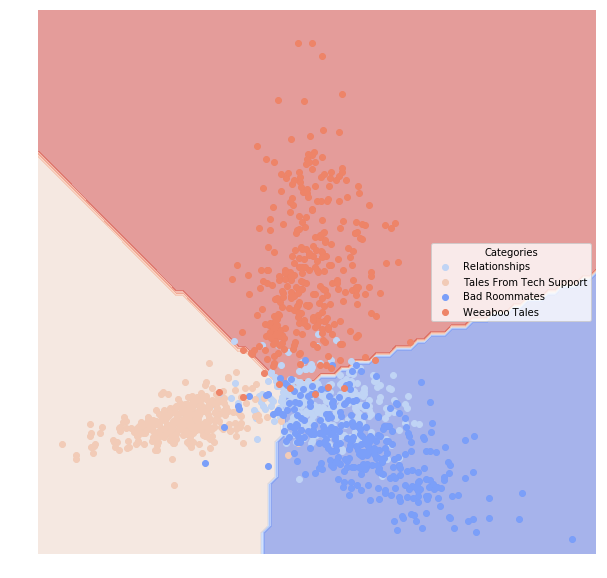

In [39]:
lucem_illud.plotregions(clf_network, dfTrain_reddit)

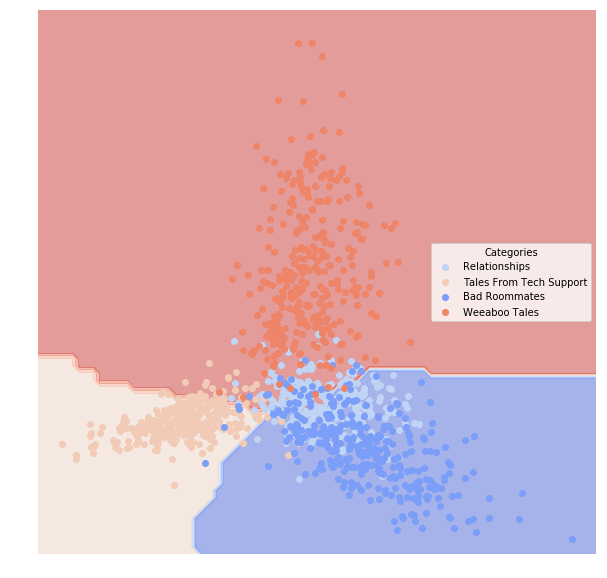

In [40]:
lucem_illud.plotregions(clf_ensemble, dfTrain_reddit)

In [543]:
clf_bayes.fit(np.stack(dfTrain_newsgroups['vect'], axis=0), dfTrain_newsgroups['category'])
clf_linear.fit(np.stack(dfTrain_newsgroups['vect'], axis=0), dfTrain_newsgroups['category'])
clf_poly.fit(np.stack(dfTrain_newsgroups['vect'], axis=0), dfTrain_newsgroups['category'])
clf_KN.fit(np.stack(dfTrain_newsgroups['vect'], axis=0), dfTrain_newsgroups['category'])
clf_log.fit(np.stack(dfTrain_newsgroups['vect'], axis=0), dfTrain_newsgroups['category'])
clf_decison.fit(np.stack(dfTrain_newsgroups['vect'], axis=0), dfTrain_newsgroups['category'])
clf_forest.fit(np.stack(dfTrain_newsgroups['vect'], axis=0), dfTrain_newsgroups['category'])
clf_network.fit(np.stack(dfTrain_newsgroups['vect'], axis=0), dfTrain_newsgroups['category'])
clf_ensemble.fit(np.stack(dfTrain_newsgroups['vect'], axis=0), dfTrain_newsgroups['category'])


GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [544]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_newsgroups)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
rec.autos,0.847067,0.665344,0.102128,0.807692,0.750000
misc.forsale,0.801696,0.638610,0.134043,0.826923,0.656489
comp.sys.mac.hardware,0.847836,0.604111,0.151064,0.666667,0.845528
comp.windows.x,0.910834,0.764548,0.063830,0.849057,0.865385


In [545]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_newsgroups)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
rec.autos,0.924631,0.770413,0.068085,0.822581,0.910714
misc.forsale,0.906573,0.820869,0.063830,0.924370,0.839695
comp.sys.mac.hardware,0.925541,0.814651,0.059574,0.880000,0.894309
comp.windows.x,0.947168,0.869922,0.034043,0.931373,0.913462


In [546]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_newsgroups)

//anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
rec.autos,0.5,0.238298,0.238298,0.000000,0.0
misc.forsale,0.5,0.278723,0.278723,0.000000,0.0
comp.sys.mac.hardware,0.5,0.261702,0.261702,0.000000,0.0
comp.windows.x,0.5,0.221277,0.778723,0.221277,1.0


In [547]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_newsgroups)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
rec.autos,0.512869,0.243176,0.461702,0.248804,0.464286
misc.forsale,0.556464,0.317228,0.285106,0.472727,0.198473
comp.sys.mac.hardware,0.504405,0.263432,0.448936,0.265957,0.406504
comp.windows.x,0.586538,0.356056,0.182979,1.000000,0.173077


In [548]:
lucem_illud.evaluateClassifier(clf_log, dfTest_newsgroups)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
rec.autos,0.942488,0.796527,0.059574,0.828125,0.946429
misc.forsale,0.901281,0.808948,0.068085,0.915966,0.832061
comp.sys.mac.hardware,0.920550,0.829609,0.055319,0.914530,0.869919
comp.windows.x,0.947877,0.853015,0.038298,0.905660,0.923077


In [550]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_newsgroups)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
rec.autos,0.838089,0.567355,0.153191,0.638889,0.821429
misc.forsale,0.816704,0.676781,0.119149,0.871287,0.671756
comp.sys.mac.hardware,0.807139,0.623646,0.129787,0.798077,0.674797
comp.windows.x,0.847126,0.592122,0.125532,0.685950,0.798077


In [551]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_newsgroups)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
rec.autos,0.843700,0.621094,0.121277,0.731092,0.776786
misc.forsale,0.839864,0.691583,0.112766,0.842105,0.732824
comp.sys.mac.hardware,0.831014,0.638638,0.125532,0.771186,0.739837
comp.windows.x,0.899249,0.696777,0.087234,0.764706,0.875000


In [552]:
lucem_illud.evaluateClassifier(clf_network, dfTest_newsgroups)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
rec.autos,0.935230,0.777975,0.065957,0.813953,0.937500
misc.forsale,0.903623,0.808040,0.068085,0.909091,0.839695
comp.sys.mac.hardware,0.918851,0.809204,0.061702,0.885246,0.878049
comp.windows.x,0.940285,0.872011,0.034043,0.948980,0.894231


In [553]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_newsgroups)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
rec.autos,0.888343,0.683147,0.100000,0.751938,0.866071
misc.forsale,0.853138,0.744479,0.093617,0.914286,0.732824
comp.sys.mac.hardware,0.856845,0.677237,0.110638,0.788618,0.788618
comp.windows.x,0.895098,0.705928,0.082979,0.787611,0.855769


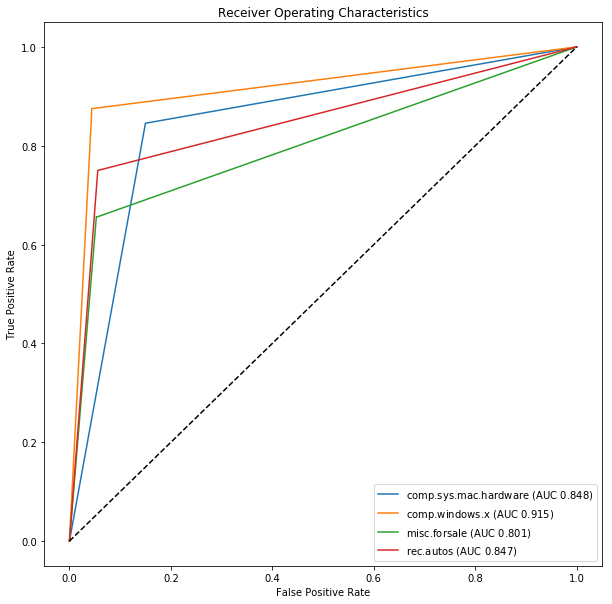

In [554]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_newsgroups)

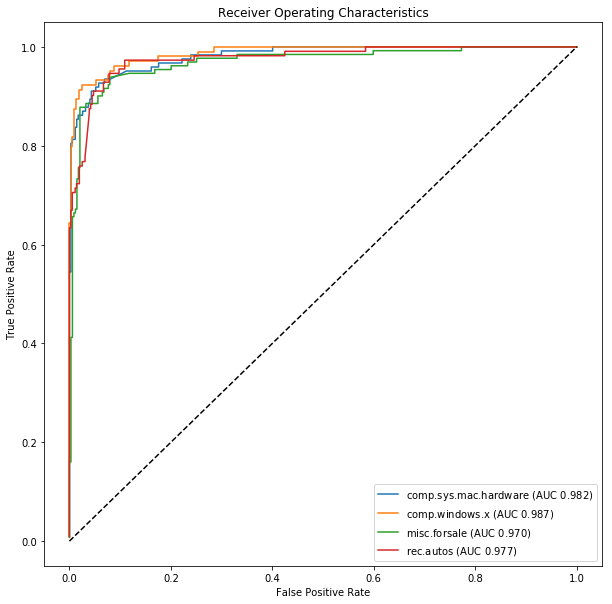

In [555]:
lucem_illud.plotMultiROC(clf_linear, dfTest_newsgroups)

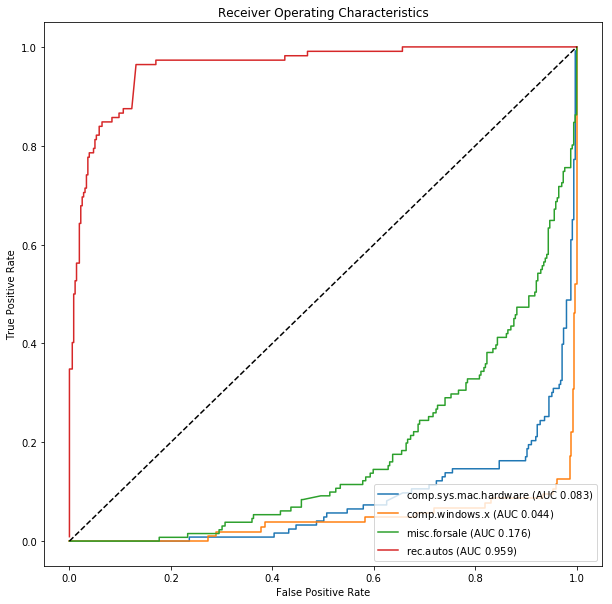

In [556]:
lucem_illud.plotMultiROC(clf_poly, dfTest_newsgroups)

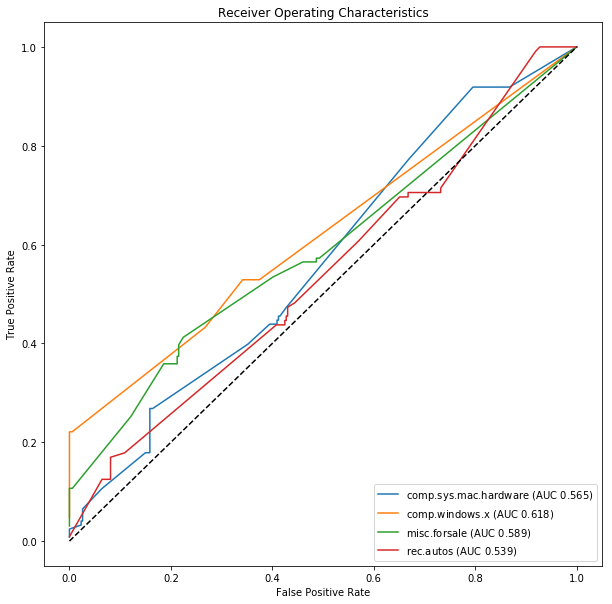

In [557]:
lucem_illud.plotMultiROC(clf_KN, dfTest_newsgroups)

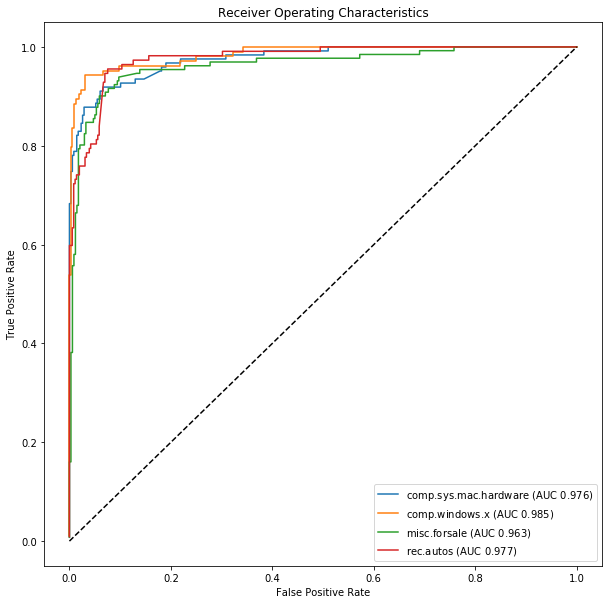

In [558]:
lucem_illud.plotMultiROC(clf_log, dfTest_newsgroups)

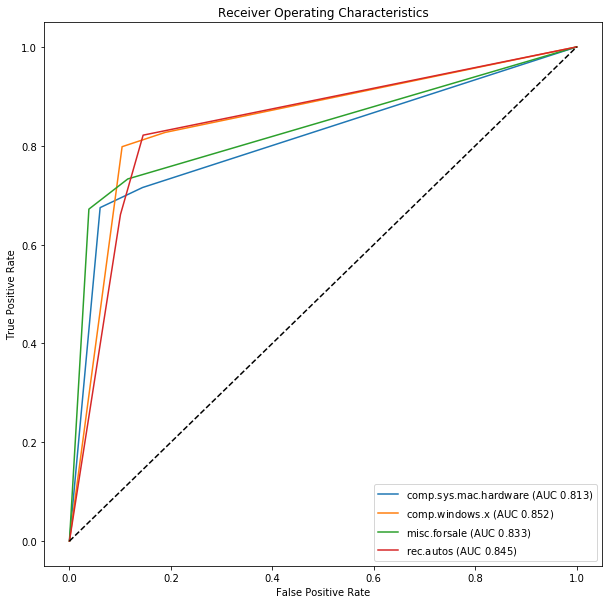

In [559]:
lucem_illud.plotMultiROC(clf_decison, dfTest_newsgroups)

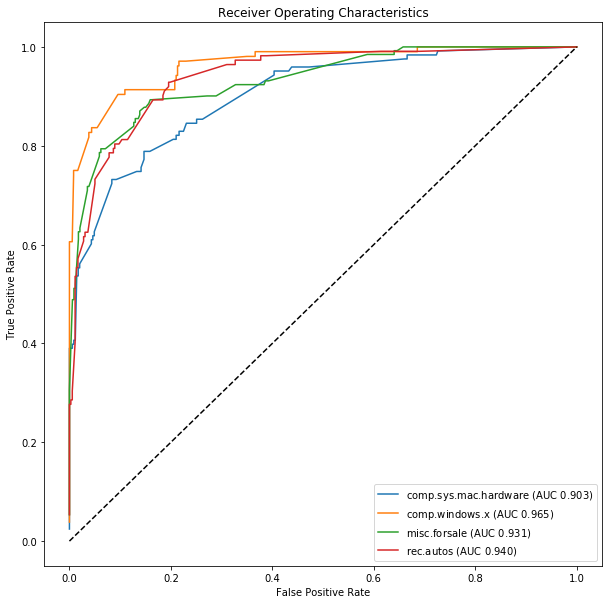

In [560]:
lucem_illud.plotMultiROC(clf_forest, dfTest_newsgroups)

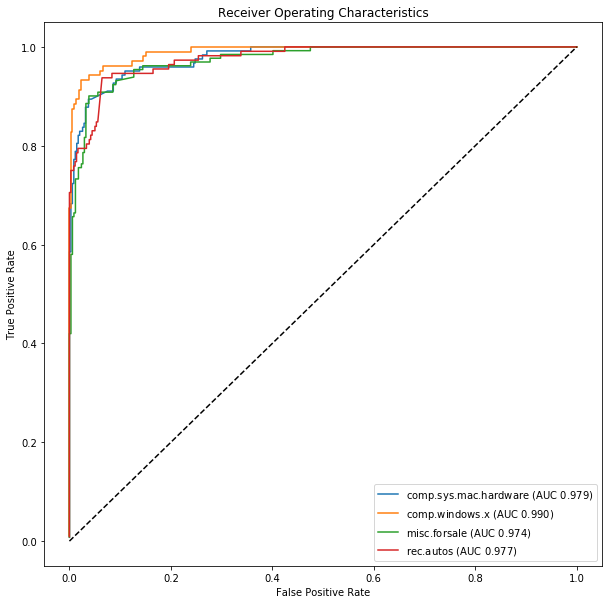

In [561]:
lucem_illud.plotMultiROC(clf_network, dfTest_newsgroups)

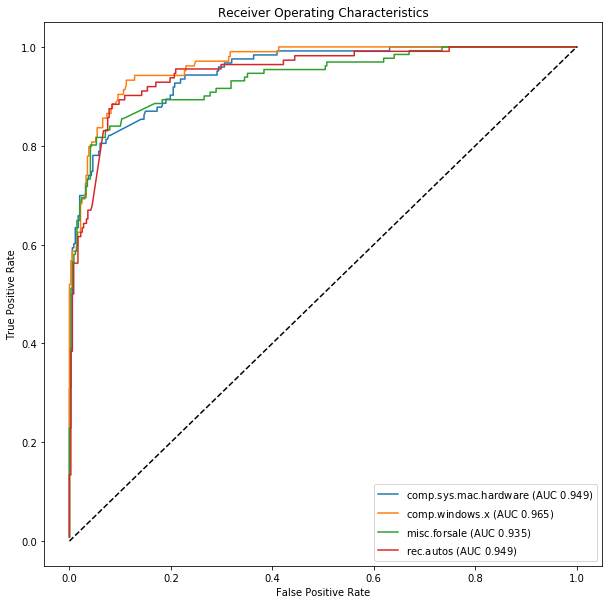

In [562]:
lucem_illud.plotMultiROC(clf_ensemble, dfTest_newsgroups)

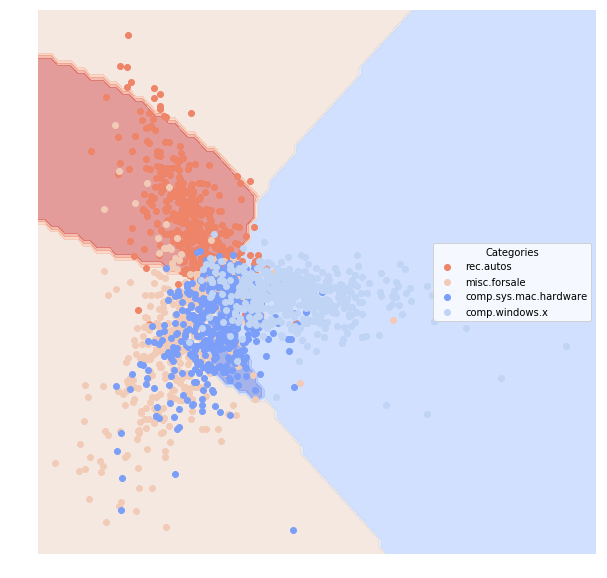

In [563]:
lucem_illud.plotregions(clf_bayes, dfTrain_newsgroups)

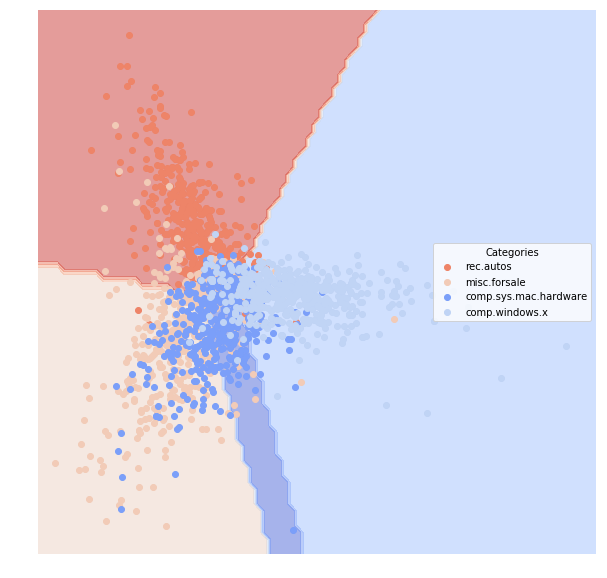

In [564]:
lucem_illud.plotregions(clf_linear, dfTrain_newsgroups)

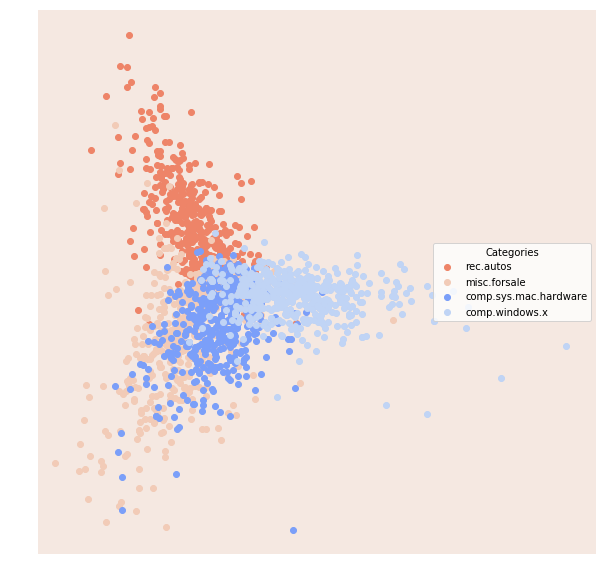

In [565]:
lucem_illud.plotregions(clf_poly, dfTrain_newsgroups)

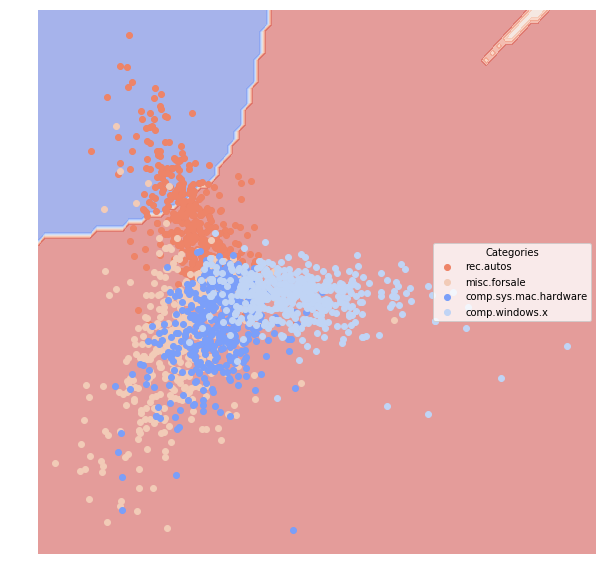

In [566]:
lucem_illud.plotregions(clf_KN, dfTrain_newsgroups)

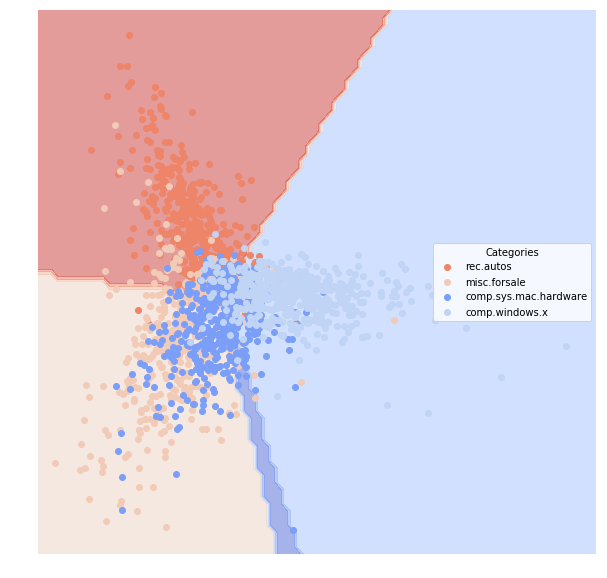

In [567]:
lucem_illud.plotregions(clf_log, dfTrain_newsgroups)

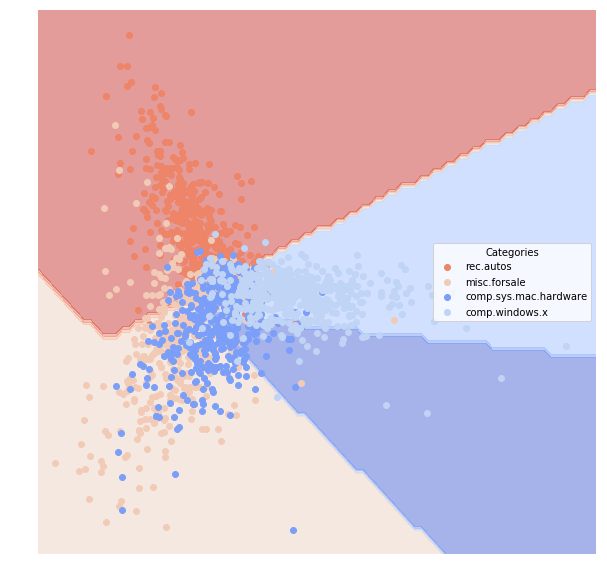

In [568]:
lucem_illud.plotregions(clf_decison, dfTrain_newsgroups)

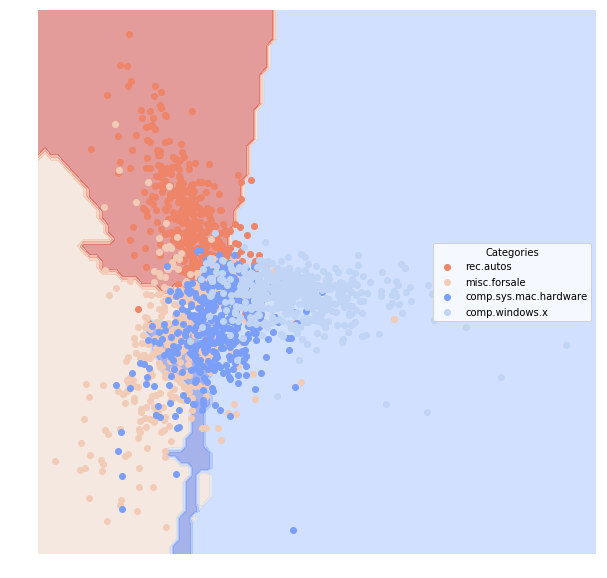

In [569]:
lucem_illud.plotregions(clf_forest, dfTrain_newsgroups)

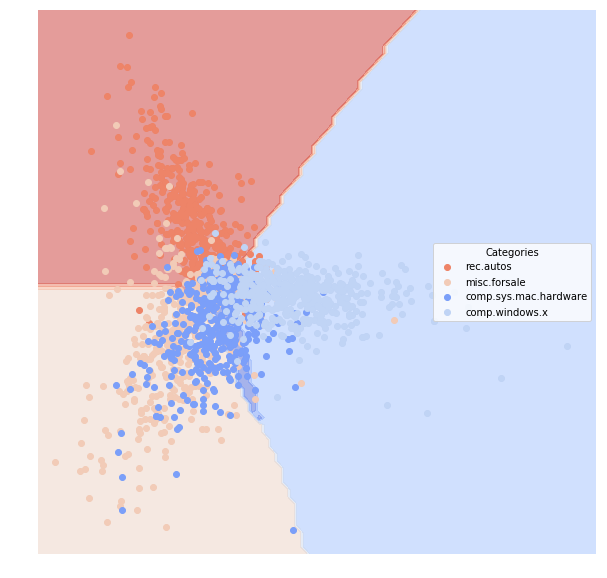

In [570]:
lucem_illud.plotregions(clf_network, dfTrain_newsgroups)

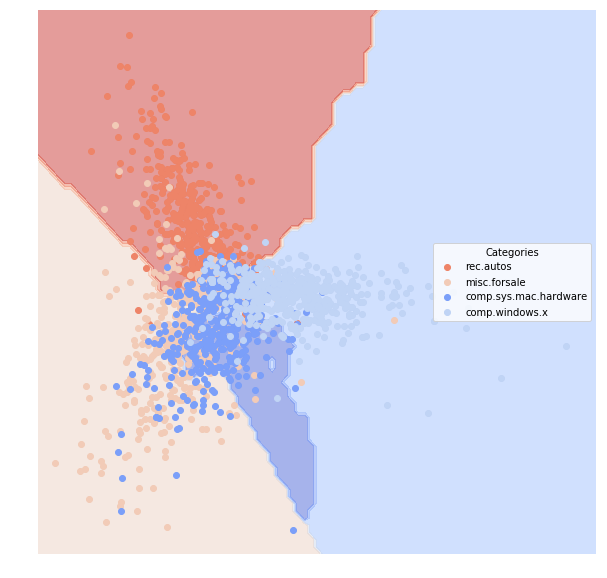

In [571]:
lucem_illud.plotregions(clf_ensemble, dfTrain_newsgroups)

In [572]:
clf_bayes.fit(np.stack(dfTrain_senatesmall['vect'], axis=0), dfTrain_senatesmall['category'])
clf_linear.fit(np.stack(dfTrain_senatesmall['vect'], axis=0), dfTrain_senatesmall['category'])
clf_poly.fit(np.stack(dfTrain_senatesmall['vect'], axis=0), dfTrain_senatesmall['category'])
clf_KN.fit(np.stack(dfTrain_senatesmall['vect'], axis=0), dfTrain_senatesmall['category'])
clf_log.fit(np.stack(dfTrain_senatesmall['vect'], axis=0), dfTrain_senatesmall['category'])
clf_decison.fit(np.stack(dfTrain_senatesmall['vect'], axis=0), dfTrain_senatesmall['category'])
clf_forest.fit(np.stack(dfTrain_senatesmall['vect'], axis=0), dfTrain_senatesmall['category'])
clf_network.fit(np.stack(dfTrain_senatesmall['vect'], axis=0), dfTrain_senatesmall['category'])
clf_ensemble.fit(np.stack(dfTrain_senatesmall['vect'], axis=0), dfTrain_senatesmall['category'])

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [573]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_senatesmall)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Obama,0.82601,0.742883,0.167155,0.833333,0.771812
Clinton,0.82601,0.800233,0.167155,0.832512,0.880208


In [574]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_senatesmall)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Obama,0.986577,0.984885,0.01173,1.000000,0.973154
Clinton,0.986577,0.979592,0.01173,0.979592,1.000000


In [575]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_senatesmall)

//anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Obama,0.5,0.43695,0.43695,0.00000,0.0
Clinton,0.5,0.56305,0.43695,0.56305,1.0


In [576]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_senatesmall)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Obama,0.860319,0.777784,0.13783,0.840000,0.845638
Clinton,0.860319,0.840015,0.13783,0.879581,0.875000


In [577]:
lucem_illud.evaluateClassifier(clf_log, dfTest_senatesmall)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Obama,0.966443,0.962211,0.029326,1.000000,0.932886
Clinton,0.966443,0.950495,0.029326,0.950495,1.000000


In [578]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_senatesmall)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Obama,1.0,1.0,0.0,1.0,1.0
Clinton,1.0,1.0,0.0,1.0,1.0


In [579]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_senatesmall)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Obama,0.993289,0.992442,0.005865,1.000000,0.986577
Clinton,0.993289,0.989691,0.005865,0.989691,1.000000


In [580]:
lucem_illud.evaluateClassifier(clf_network, dfTest_senatesmall)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Obama,0.937395,0.908541,0.058651,0.957447,0.90604
Clinton,0.937395,0.918533,0.058651,0.930000,0.96875


In [581]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_senatesmall)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Obama,1.0,1.0,0.0,1.0,1.0
Clinton,1.0,1.0,0.0,1.0,1.0


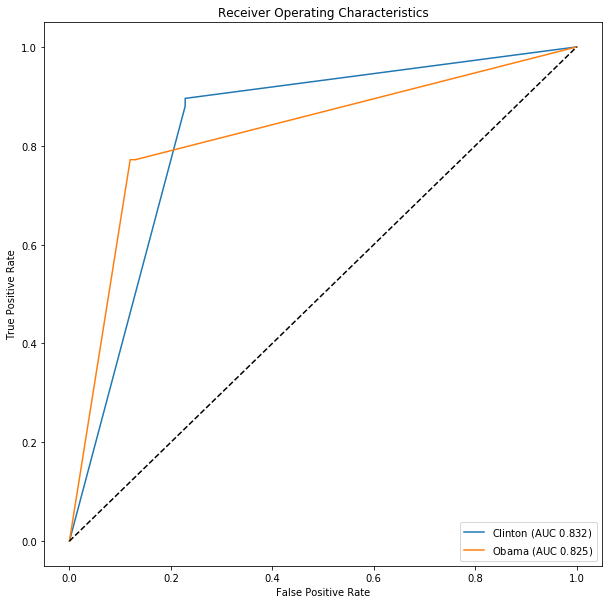

In [582]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_senatesmall)

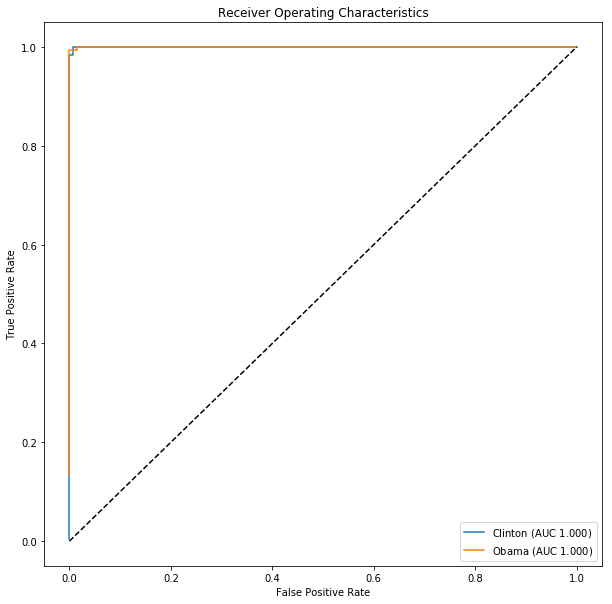

In [583]:
lucem_illud.plotMultiROC(clf_linear, dfTest_senatesmall)

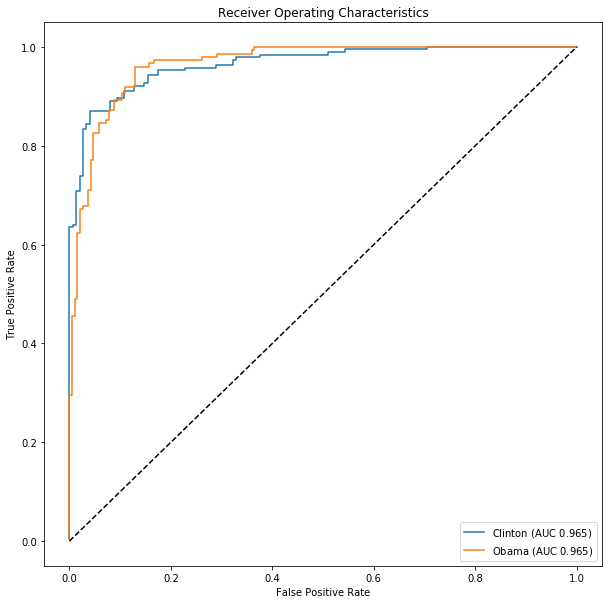

In [584]:
lucem_illud.plotMultiROC(clf_poly, dfTest_senatesmall)

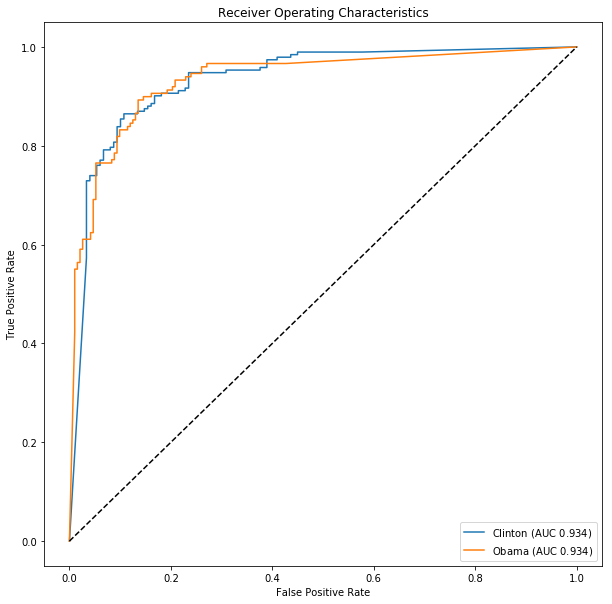

In [585]:
lucem_illud.plotMultiROC(clf_KN, dfTest_senatesmall)

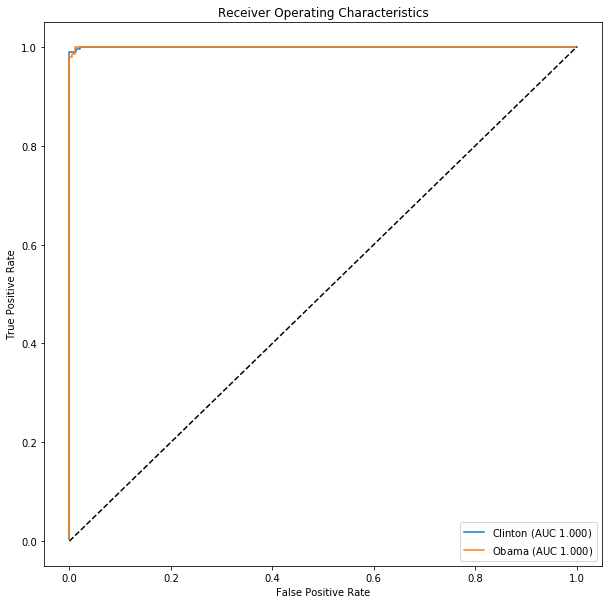

In [586]:
lucem_illud.plotMultiROC(clf_log, dfTest_senatesmall)

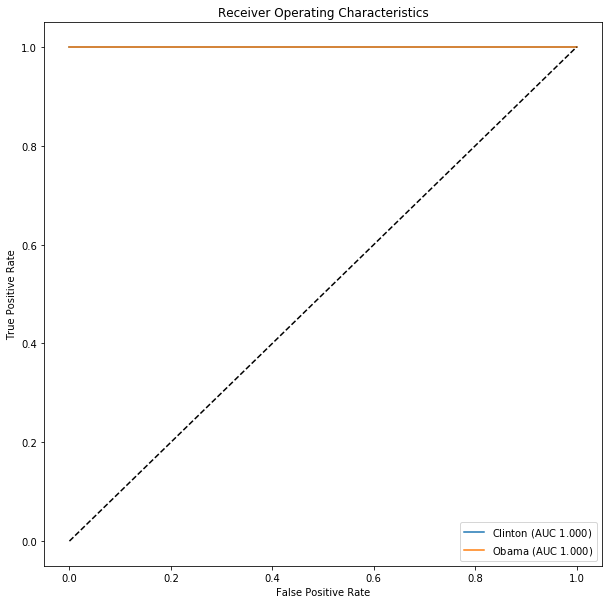

In [587]:
lucem_illud.plotMultiROC(clf_decison, dfTest_senatesmall)

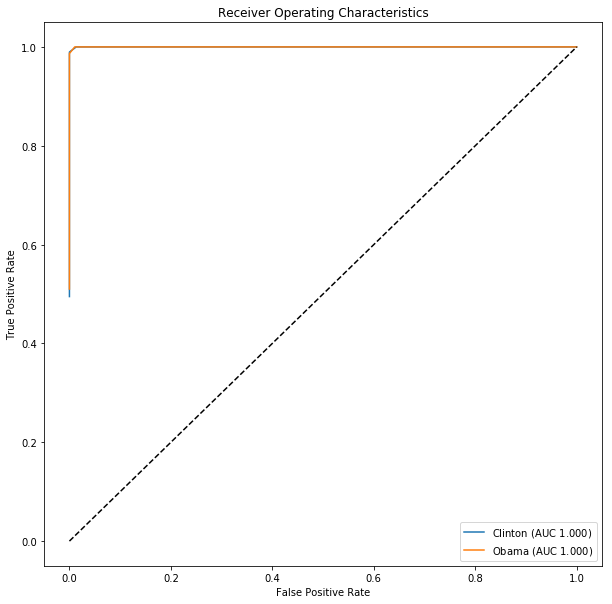

In [588]:
lucem_illud.plotMultiROC(clf_forest, dfTest_senatesmall)

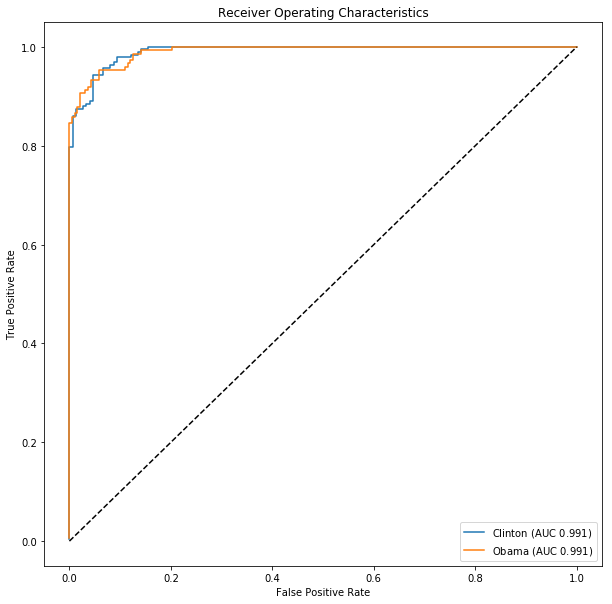

In [589]:
lucem_illud.plotMultiROC(clf_network, dfTest_senatesmall)

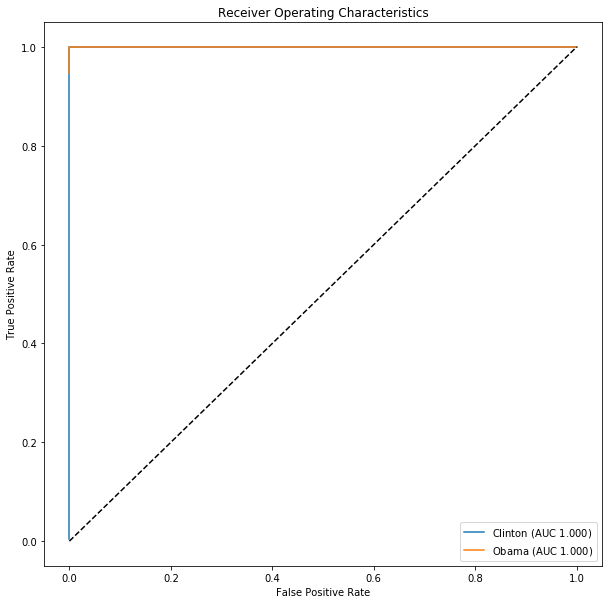

In [590]:
lucem_illud.plotMultiROC(clf_ensemble, dfTest_senatesmall)

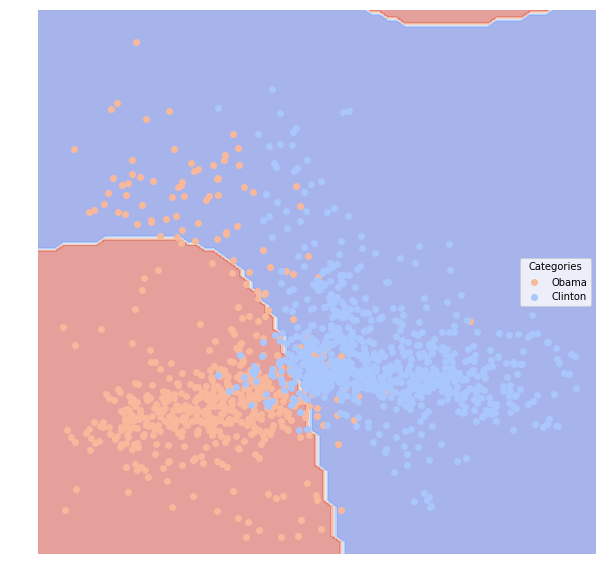

In [592]:
lucem_illud.plotregions(clf_bayes, dfTrain_senatesmall)

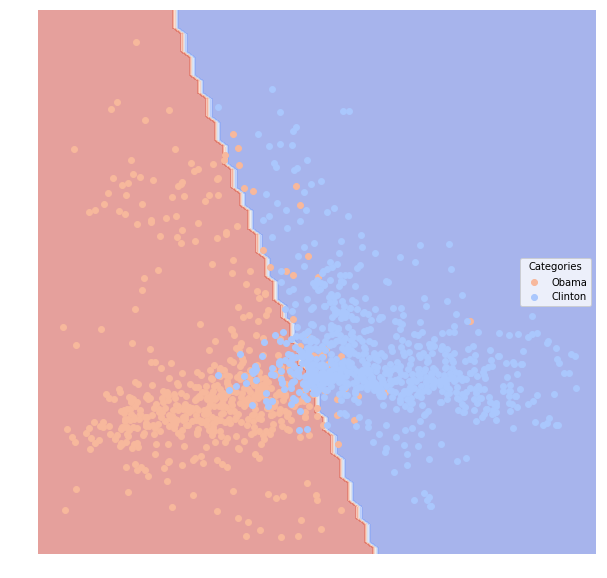

In [593]:
lucem_illud.plotregions(clf_linear, dfTrain_senatesmall)

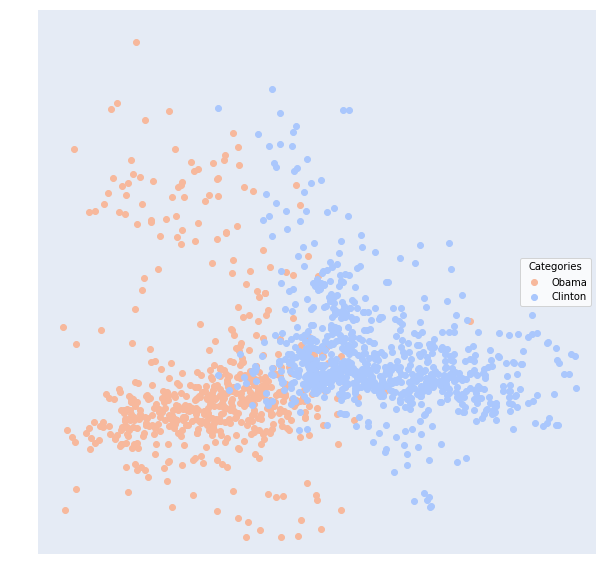

In [594]:
lucem_illud.plotregions(clf_poly, dfTrain_senatesmall)

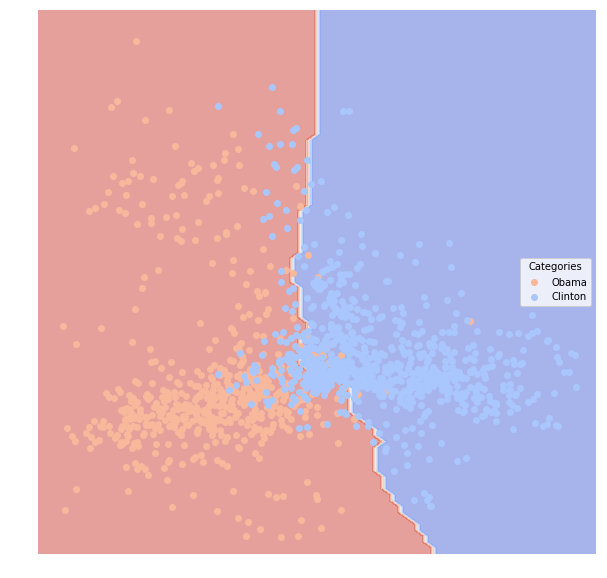

In [595]:
lucem_illud.plotregions(clf_KN, dfTrain_senatesmall)

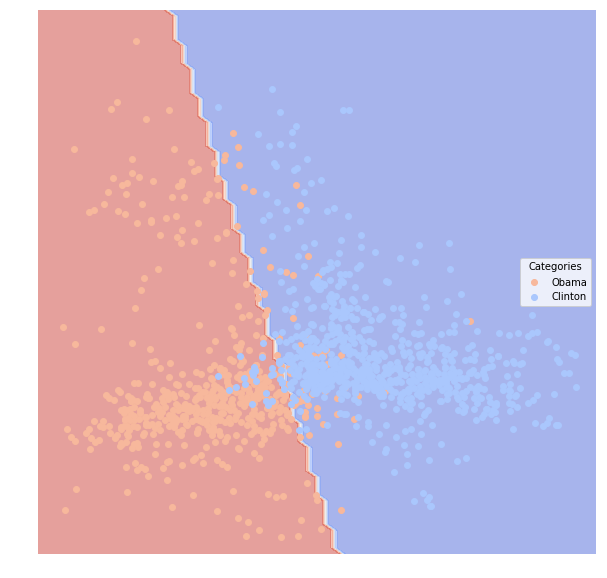

In [596]:
lucem_illud.plotregions(clf_log, dfTrain_senatesmall)

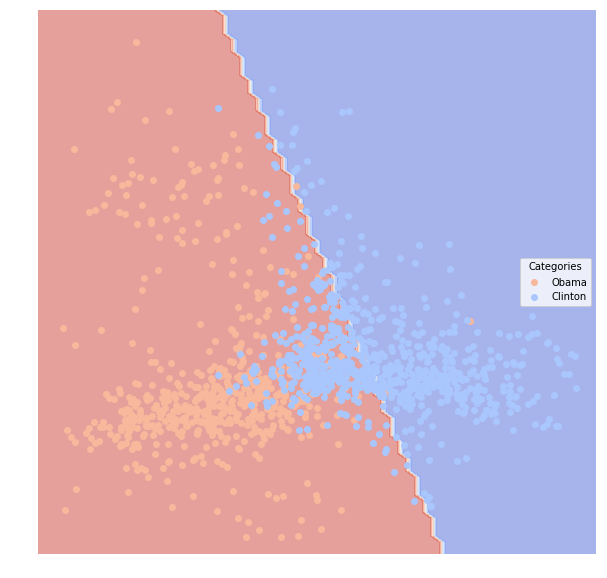

In [597]:
lucem_illud.plotregions(clf_decison, dfTrain_senatesmall)

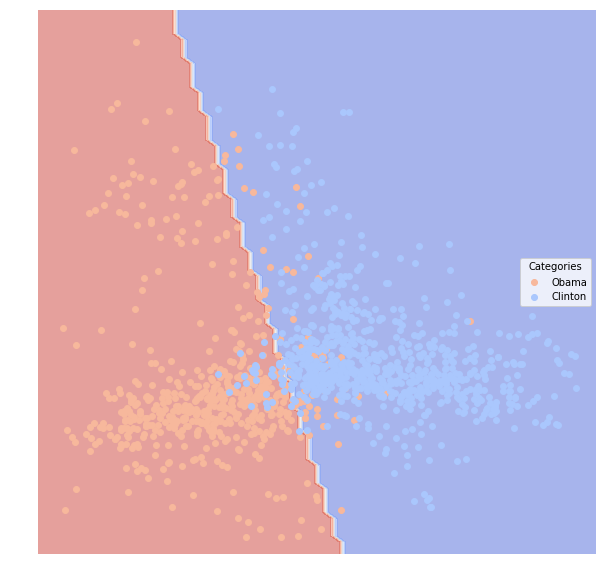

In [598]:
lucem_illud.plotregions(clf_network, dfTrain_senatesmall)

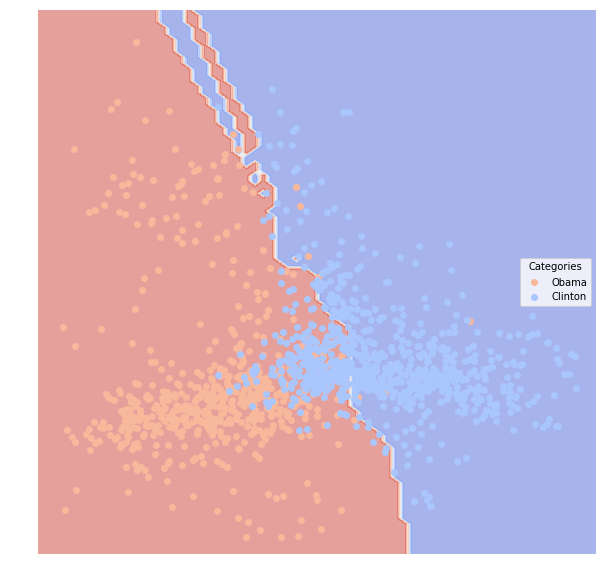

In [599]:
lucem_illud.plotregions(clf_forest, dfTrain_senatesmall)

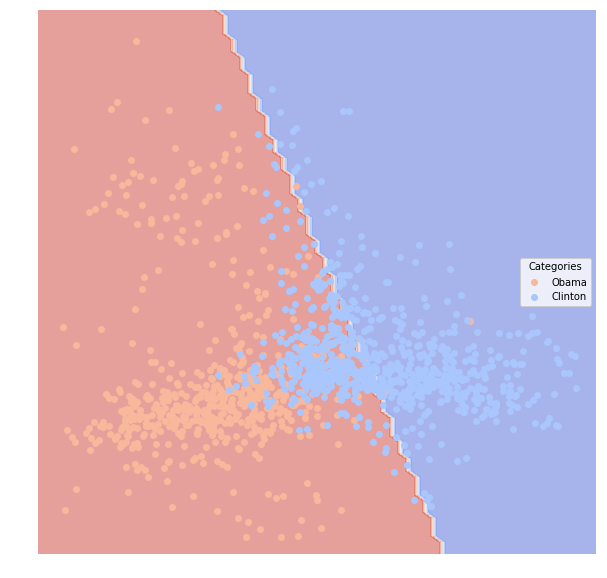

In [600]:
lucem_illud.plotregions(clf_ensemble, dfTrain_senatesmall)

In [601]:
clf_bayes.fit(np.stack(dfTrain_senatelarge['vect'], axis=0), dfTrain_senatelarge['category'])
clf_linear.fit(np.stack(dfTrain_senatelarge['vect'], axis=0), dfTrain_senatelarge['category'])
clf_poly.fit(np.stack(dfTrain_senatelarge['vect'], axis=0), dfTrain_senatelarge['category'])
clf_KN.fit(np.stack(dfTrain_senatelarge['vect'], axis=0), dfTrain_senatelarge['category'])
clf_log.fit(np.stack(dfTrain_senatelarge['vect'], axis=0), dfTrain_senatelarge['category'])
clf_decison.fit(np.stack(dfTrain_senatelarge['vect'], axis=0), dfTrain_senatelarge['category'])
clf_forest.fit(np.stack(dfTrain_senatelarge['vect'], axis=0), dfTrain_senatelarge['category'])
clf_network.fit(np.stack(dfTrain_senatelarge['vect'], axis=0), dfTrain_senatelarge['category'])
clf_ensemble.fit(np.stack(dfTrain_senatelarge['vect'], axis=0), dfTrain_senatelarge['category'])


GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [602]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_senatelarge)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Kennedy,0.778270,0.645891,0.241026,0.658537,0.941860
Kerry,0.790465,0.586128,0.142308,0.761628,0.651741
Kyl,0.738156,0.498890,0.074359,0.890909,0.485149
Klobuchar,0.740908,0.434413,0.047436,0.805556,0.491525
Kohl,0.659291,0.372585,0.066667,0.960000,0.320000


In [603]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_senatelarge)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Kennedy,0.973771,0.949551,0.026923,0.960114,0.979651
Kerry,0.975679,0.935924,0.019231,0.960396,0.965174
Kyl,0.995050,0.991381,0.001282,1.000000,0.990099
Klobuchar,0.991525,0.984333,0.001282,1.000000,0.983051
Kohl,0.960000,0.927692,0.007692,1.000000,0.920000


In [604]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_senatelarge)

//anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Kennedy,0.5,0.441026,0.558974,0.441026,1.0
Kerry,0.5,0.257692,0.257692,0.000000,0.0
Kyl,0.5,0.129487,0.129487,0.000000,0.0
Klobuchar,0.5,0.075641,0.075641,0.000000,0.0
Kohl,0.5,0.096154,0.096154,0.000000,0.0


In [605]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_senatelarge)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Kennedy,0.831702,0.715873,0.178205,0.741176,0.915698
Kerry,0.779754,0.574851,0.146154,0.763636,0.626866
Kyl,0.849072,0.663115,0.050000,0.878049,0.712871
Klobuchar,0.875115,0.653542,0.029487,0.833333,0.762712
Kohl,0.808369,0.581330,0.044872,0.870370,0.626667


In [606]:
lucem_illud.evaluateClassifier(clf_log, dfTest_senatelarge)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Kennedy,0.948848,0.893305,0.055128,0.901333,0.982558
Kerry,0.957402,0.905577,0.029487,0.954082,0.930348
Kyl,0.930693,0.879335,0.017949,1.000000,0.861386
Klobuchar,0.966102,0.937332,0.005128,1.000000,0.932203
Kohl,0.946667,0.903590,0.010256,1.000000,0.893333


In [607]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_senatelarge)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Kennedy,0.995106,0.989730,0.005128,0.991329,0.997093
Kerry,1.000000,1.000000,0.000000,1.000000,1.000000
Kyl,0.985149,0.974143,0.003846,1.000000,0.970297
Klobuchar,1.000000,1.000000,0.000000,1.000000,1.000000
Kohl,0.999291,0.986842,0.001282,0.986842,1.000000


In [608]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_senatelarge)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Kennedy,0.978744,0.952317,0.023077,0.955307,0.994186
Kerry,0.977509,0.955758,0.014103,0.984694,0.960199
Kyl,0.989363,0.972960,0.003846,0.990000,0.980198
Klobuchar,0.966102,0.937332,0.005128,1.000000,0.932203
Kohl,0.973333,0.951795,0.005128,1.000000,0.946667


In [609]:
lucem_illud.evaluateClassifier(clf_network, dfTest_senatelarge)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Kennedy,0.955875,0.918908,0.044872,0.937677,0.962209
Kerry,0.936329,0.844240,0.048718,0.905473,0.905473
Kyl,0.984412,0.964342,0.005128,0.989899,0.970297
Klobuchar,0.972496,0.904737,0.007692,0.949153,0.949153
Kohl,0.953333,0.915641,0.008974,1.000000,0.906667


In [610]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_senatelarge)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Kennedy,0.992506,0.985257,0.007692,0.988439,0.994186
Kerry,1.000000,1.000000,0.000000,1.000000,1.000000
Kyl,0.985149,0.974143,0.003846,1.000000,0.970297
Klobuchar,0.999307,0.983333,0.001282,0.983333,1.000000
Kohl,0.992624,0.974793,0.002564,0.986667,0.986667


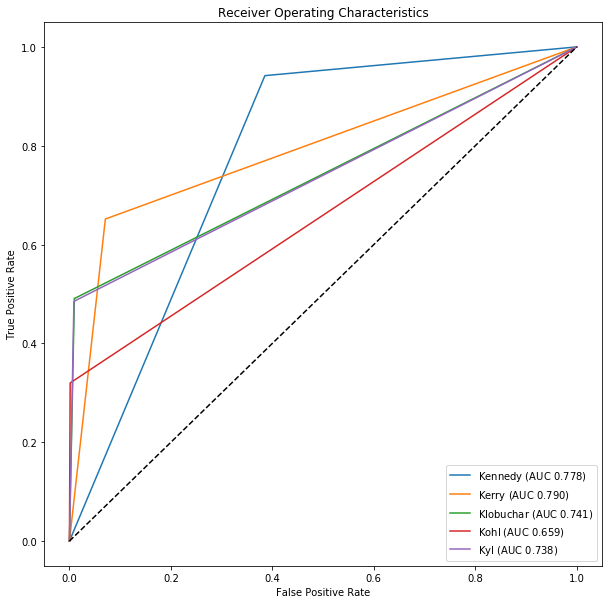

In [611]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_senatelarge)

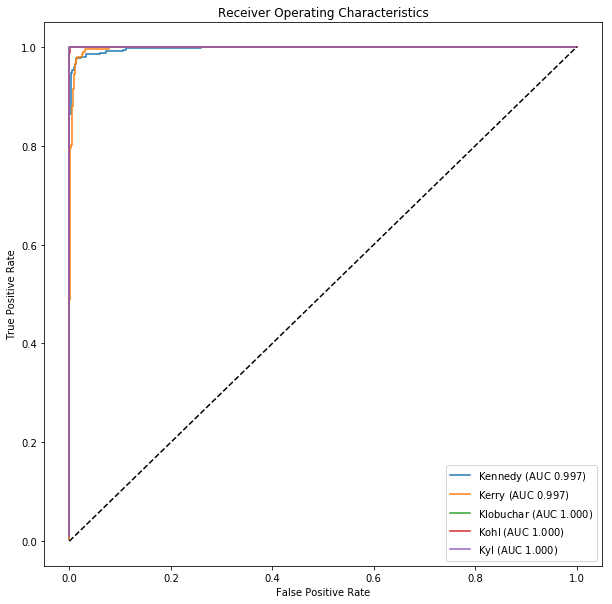

In [612]:
lucem_illud.plotMultiROC(clf_linear, dfTest_senatelarge)

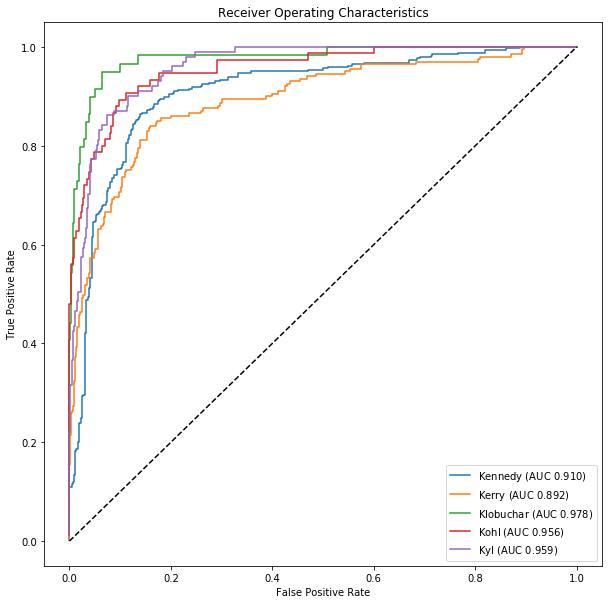

In [613]:
lucem_illud.plotMultiROC(clf_poly, dfTest_senatelarge)

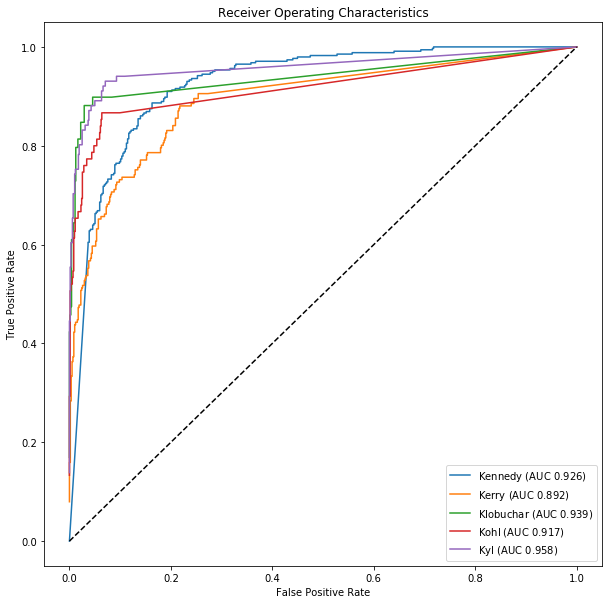

In [614]:
lucem_illud.plotMultiROC(clf_KN, dfTest_senatelarge)

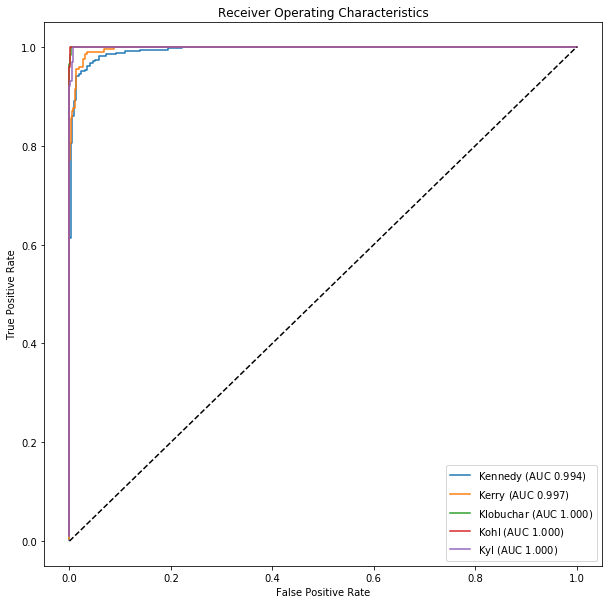

In [615]:
lucem_illud.plotMultiROC(clf_log, dfTest_senatelarge)

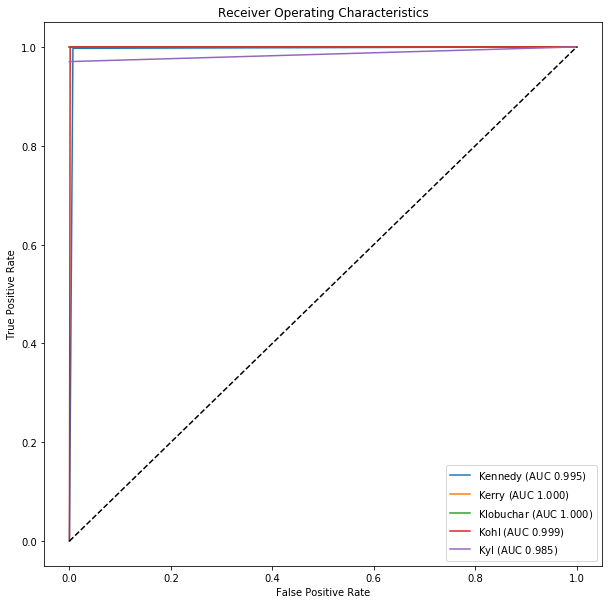

In [616]:
lucem_illud.plotMultiROC(clf_decison, dfTest_senatelarge)

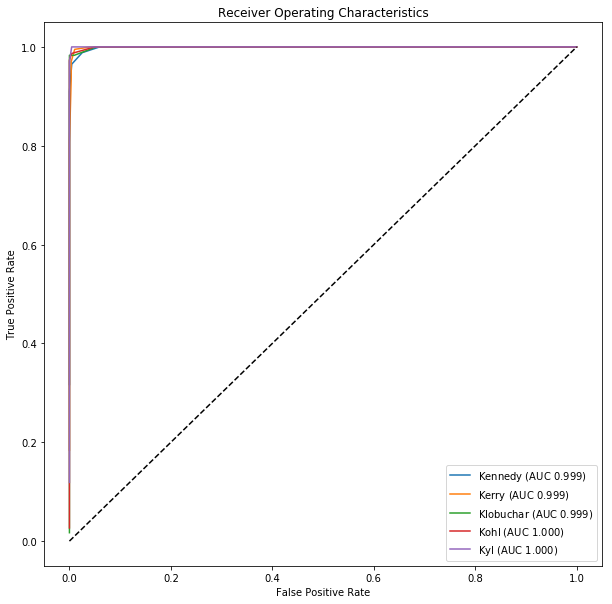

In [617]:
lucem_illud.plotMultiROC(clf_forest, dfTest_senatelarge)

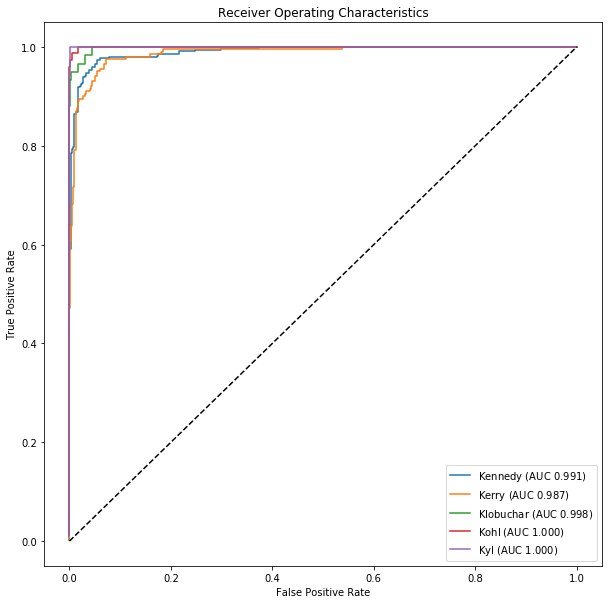

In [618]:
lucem_illud.plotMultiROC(clf_network, dfTest_senatelarge)

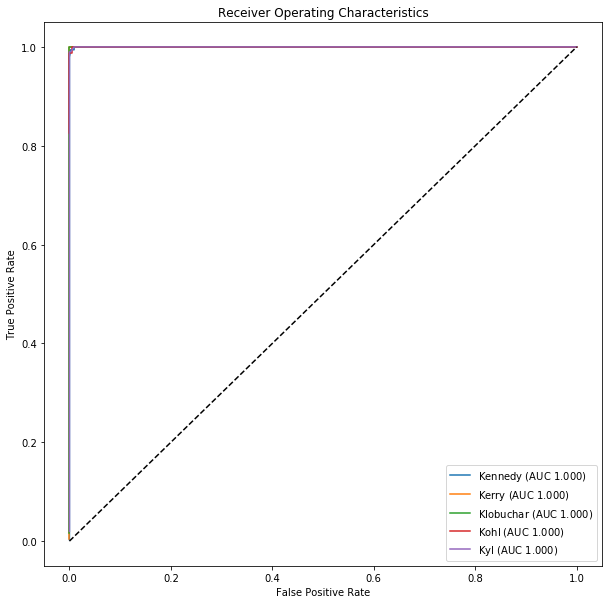

In [619]:
lucem_illud.plotMultiROC(clf_ensemble, dfTest_senatelarge)

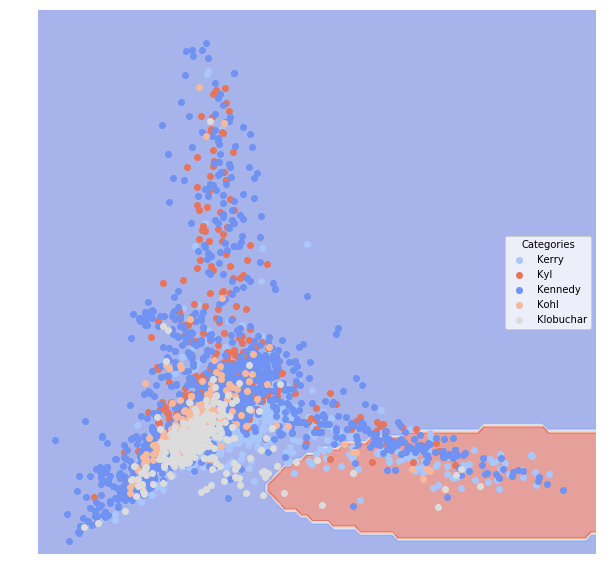

In [620]:
lucem_illud.plotregions(clf_bayes, dfTrain_senatelarge)

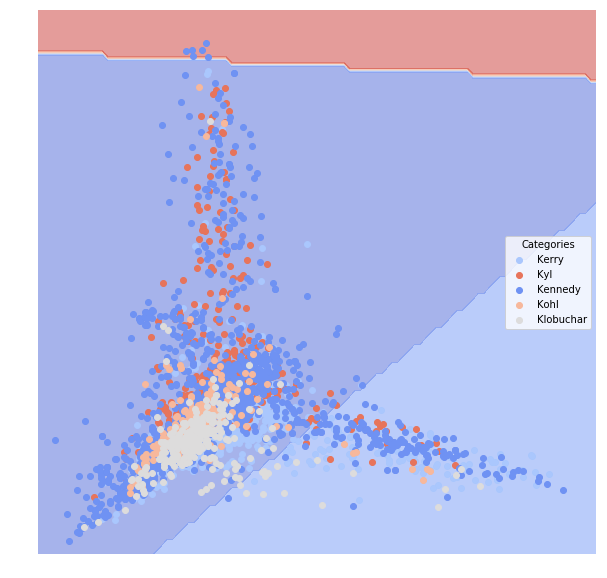

In [621]:
lucem_illud.plotregions(clf_linear, dfTrain_senatelarge)

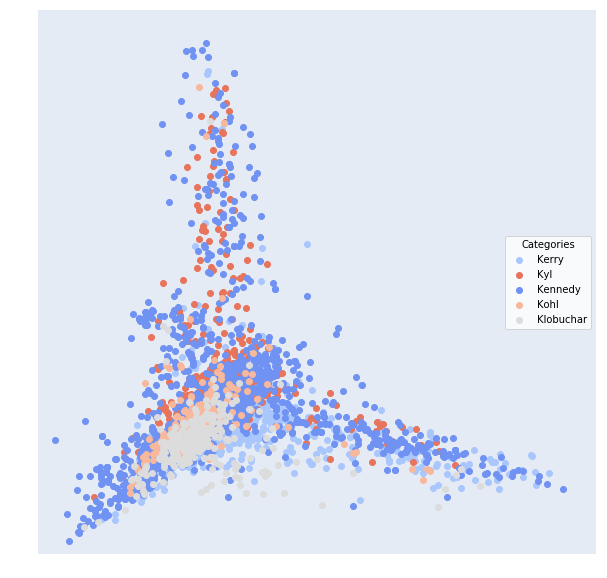

In [622]:
lucem_illud.plotregions(clf_poly, dfTrain_senatelarge)

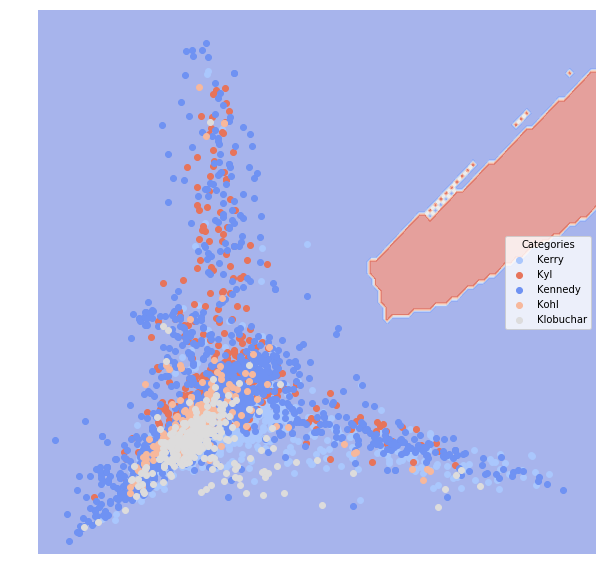

In [623]:
lucem_illud.plotregions(clf_KN, dfTrain_senatelarge)

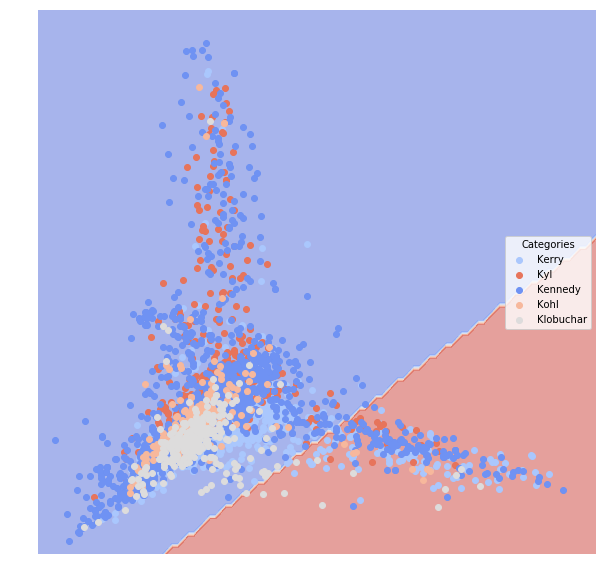

In [624]:
lucem_illud.plotregions(clf_log, dfTrain_senatelarge)

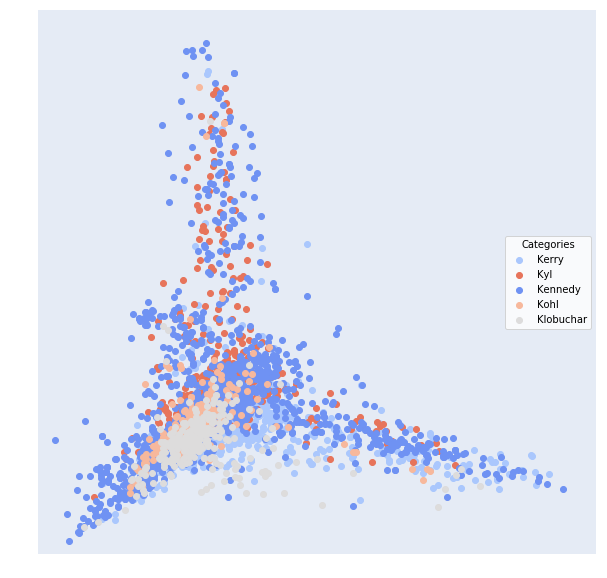

In [625]:
lucem_illud.plotregions(clf_decison, dfTrain_senatelarge)

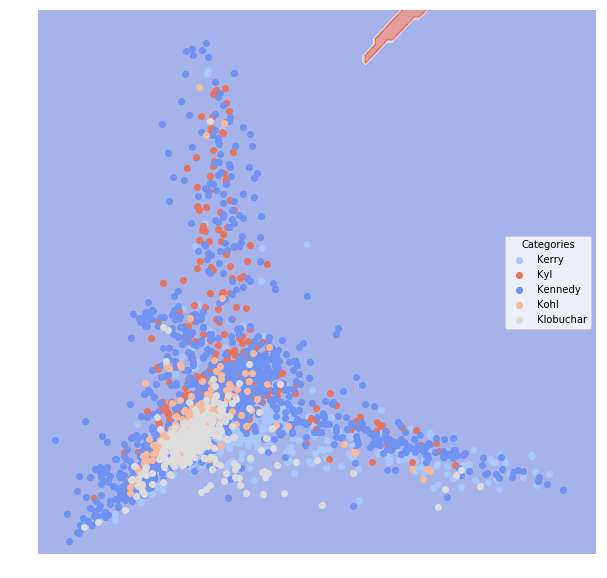

In [626]:
lucem_illud.plotregions(clf_forest, dfTrain_senatelarge)

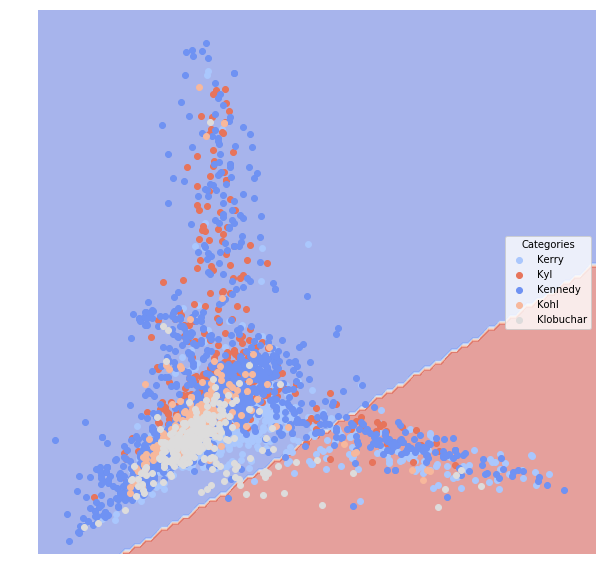

In [627]:
lucem_illud.plotregions(clf_network, dfTrain_senatelarge)

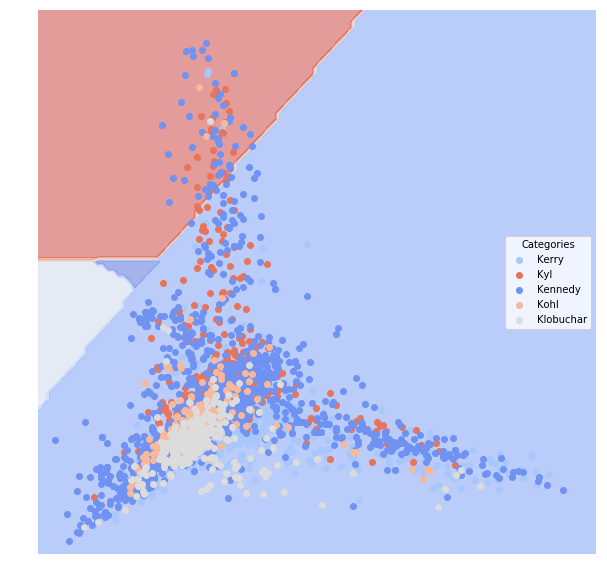

In [628]:
lucem_illud.plotregions(clf_ensemble, dfTrain_senatelarge)

In [629]:
clf_bayes.fit(np.stack(dfTrain_spam['vect'], axis=0), dfTrain_spam['category'])
clf_linear.fit(np.stack(dfTrain_spam['vect'], axis=0), dfTrain_spam['category'])
clf_poly.fit(np.stack(dfTrain_spam['vect'], axis=0), dfTrain_spam['category'])
clf_KN.fit(np.stack(dfTrain_spam['vect'], axis=0), dfTrain_spam['category'])
clf_log.fit(np.stack(dfTrain_spam['vect'], axis=0), dfTrain_spam['category'])
clf_decison.fit(np.stack(dfTrain_spam['vect'], axis=0), dfTrain_spam['category'])
clf_forest.fit(np.stack(dfTrain_spam['vect'], axis=0), dfTrain_spam['category'])
clf_network.fit(np.stack(dfTrain_spam['vect'], axis=0), dfTrain_spam['category'])
clf_ensemble.fit(np.stack(dfTrain_spam['vect'], axis=0), dfTrain_spam['category'])


GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [630]:
lucem_illud.evaluateClassifier(clf_bayes, dfTest_spam)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not spam,0.788664,0.933945,0.176901,0.949515,0.837329
spam,0.788664,0.362035,0.176901,0.437870,0.740000


In [631]:
lucem_illud.evaluateClassifier(clf_linear, dfTest_spam)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not spam,0.748288,0.920656,0.076023,0.920886,0.996575
spam,0.748288,0.553869,0.076023,0.961538,0.500000


In [632]:
lucem_illud.evaluateClassifier(clf_poly, dfTest_spam)

//anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not spam,0.5,0.853801,0.146199,0.853801,1.0
spam,0.5,0.146199,0.146199,0.000000,0.0


In [633]:
lucem_illud.evaluateClassifier(clf_KN, dfTest_spam)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not spam,0.692295,0.904715,0.100877,0.905512,0.984589
spam,0.692295,0.414250,0.100877,0.816327,0.400000


In [634]:
lucem_illud.evaluateClassifier(clf_log, dfTest_spam)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not spam,0.61,0.882175,0.114035,0.882175,1.00
spam,0.61,0.334035,0.114035,1.000000,0.22


In [635]:
lucem_illud.evaluateClassifier(clf_decison, dfTest_spam)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not spam,0.757877,0.923632,0.095029,0.926108,0.965753
spam,0.757877,0.469123,0.095029,0.733333,0.550000


In [636]:
lucem_illud.evaluateClassifier(clf_forest, dfTest_spam)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not spam,0.740445,0.918514,0.096491,0.920455,0.97089
spam,0.740445,0.454137,0.096491,0.750000,0.51000


In [637]:
lucem_illud.evaluateClassifier(clf_network, dfTest_spam)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not spam,0.799589,0.936025,0.080409,0.938640,0.969178
spam,0.799589,0.544094,0.080409,0.777778,0.630000


In [638]:
lucem_illud.evaluateClassifier(clf_ensemble, dfTest_spam)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not spam,0.610719,0.882375,0.119883,0.882622,0.991438
spam,0.610719,0.301502,0.119883,0.821429,0.230000


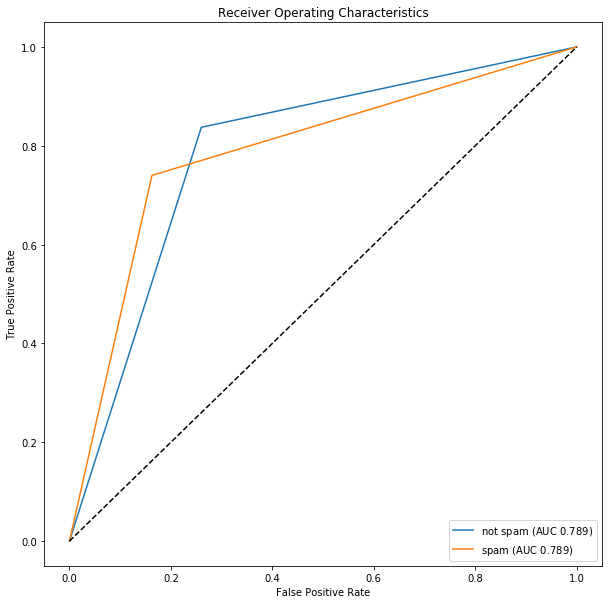

In [639]:
lucem_illud.plotMultiROC(clf_bayes, dfTest_spam)

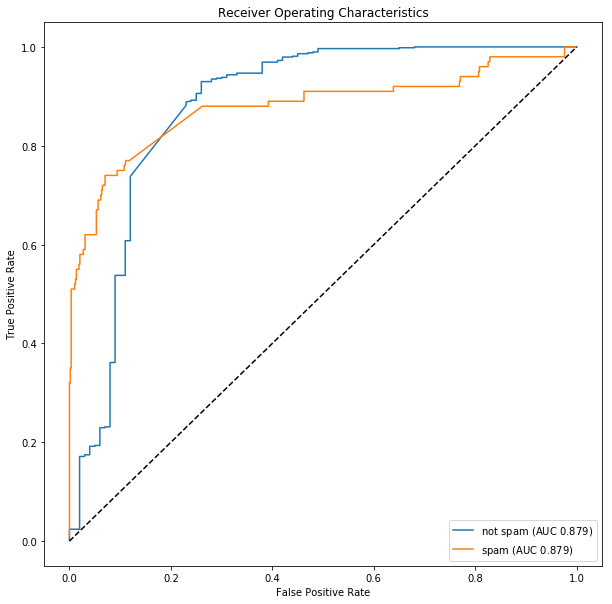

In [640]:
lucem_illud.plotMultiROC(clf_linear, dfTest_spam)

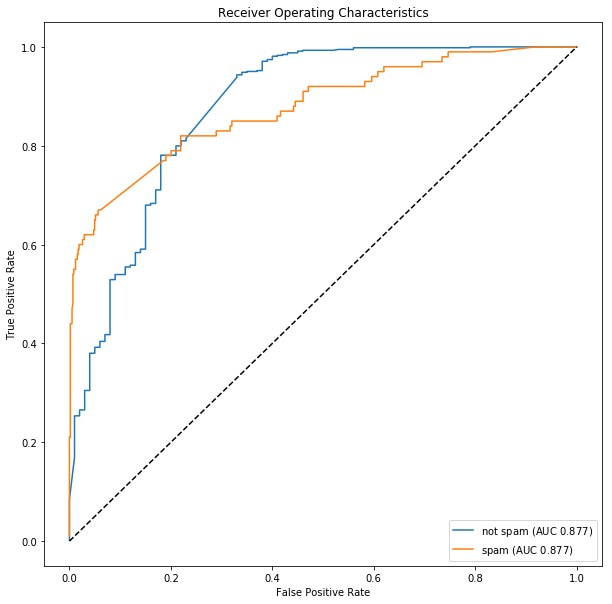

In [641]:
lucem_illud.plotMultiROC(clf_poly, dfTest_spam)

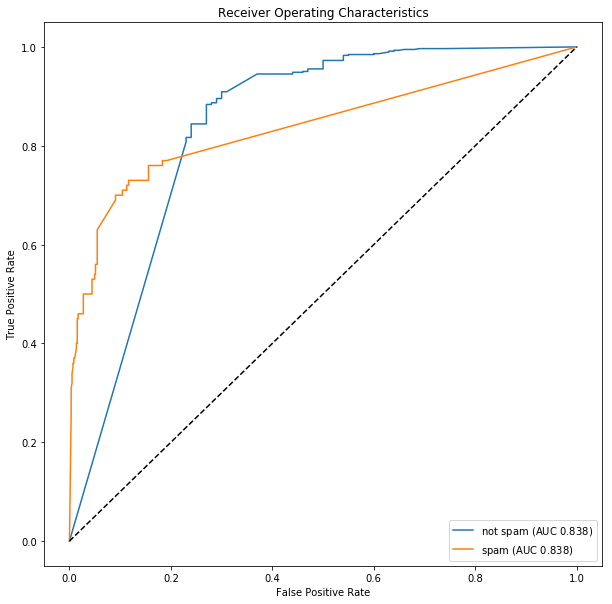

In [642]:
lucem_illud.plotMultiROC(clf_KN, dfTest_spam)

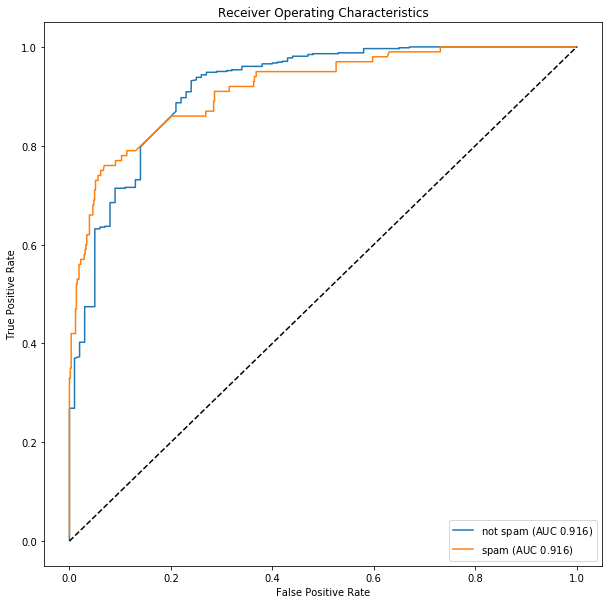

In [643]:
lucem_illud.plotMultiROC(clf_log, dfTest_spam)

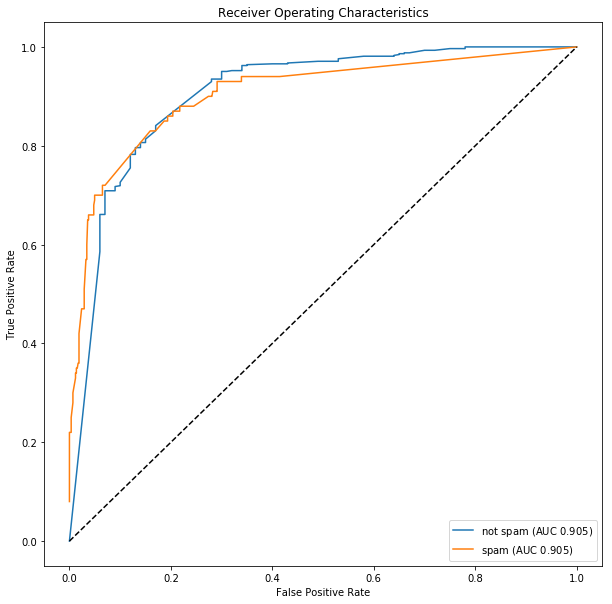

In [644]:
lucem_illud.plotMultiROC(clf_forest, dfTest_spam)

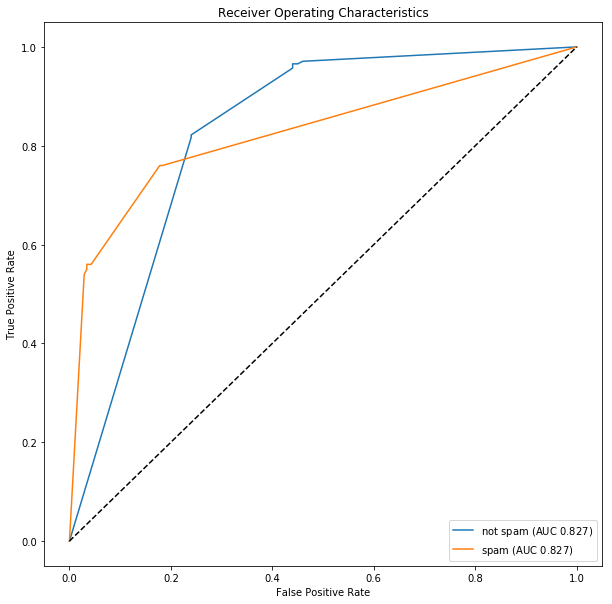

In [645]:
lucem_illud.plotMultiROC(clf_decison, dfTest_spam)

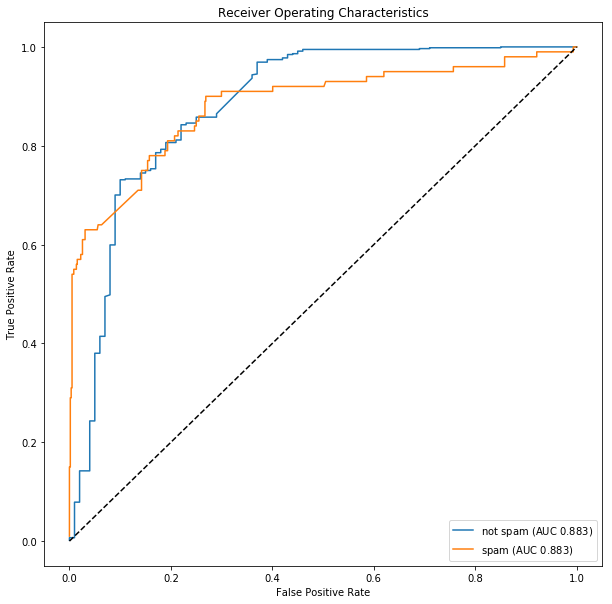

In [646]:
lucem_illud.plotMultiROC(clf_network, dfTest_spam)

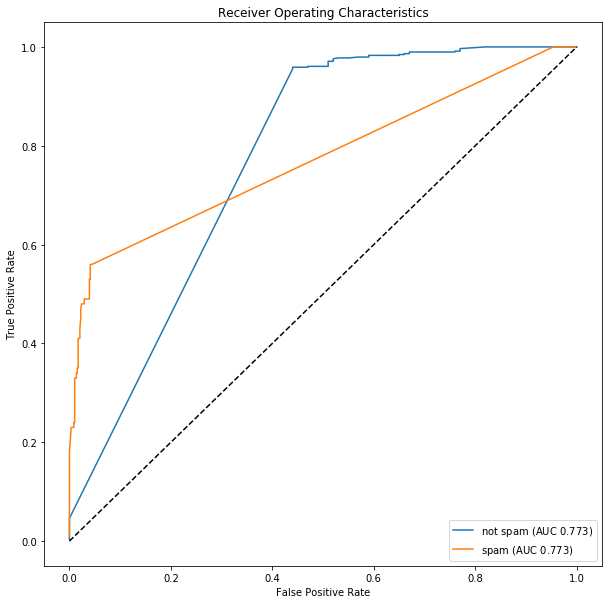

In [647]:
lucem_illud.plotMultiROC(clf_ensemble, dfTest_spam)

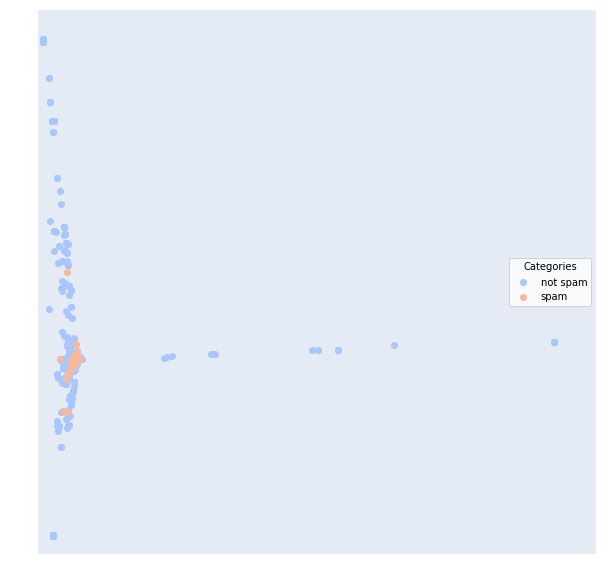

In [648]:
lucem_illud.plotregions(clf_bayes, dfTrain_spam)

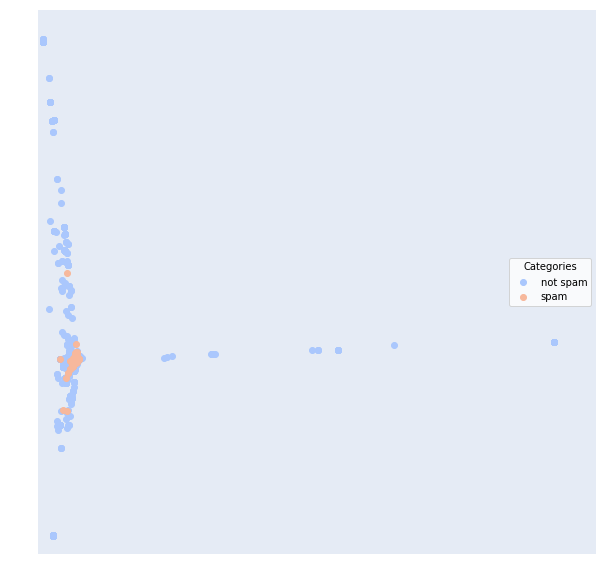

In [649]:
lucem_illud.plotregions(clf_linear, dfTrain_spam)

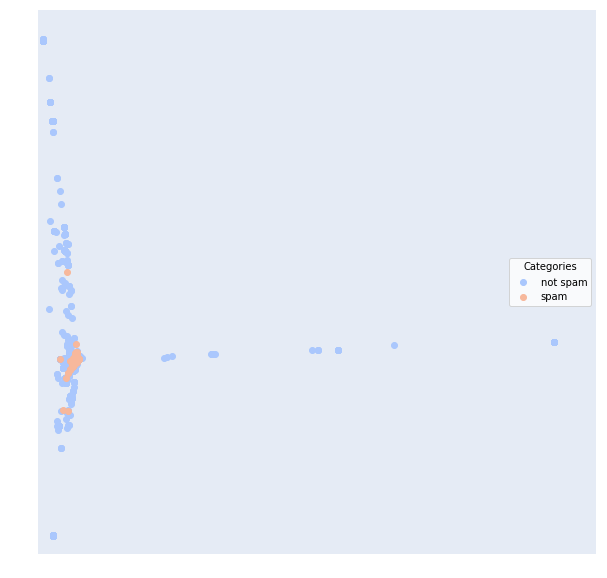

In [650]:
lucem_illud.plotregions(clf_poly, dfTrain_spam)

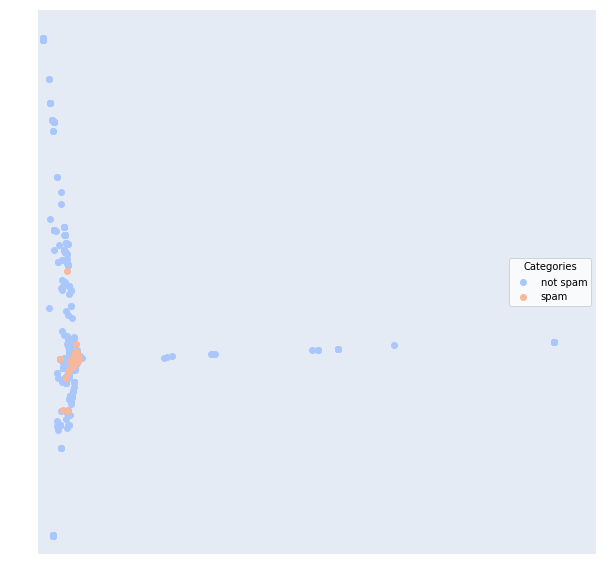

In [651]:
lucem_illud.plotregions(clf_KN, dfTrain_spam)

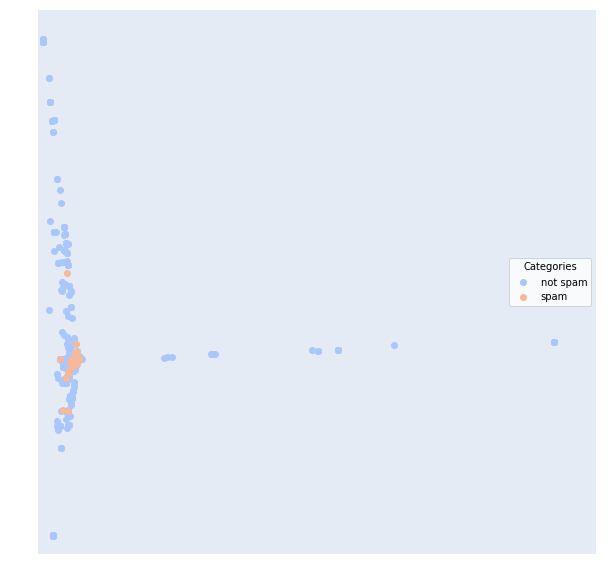

In [652]:
lucem_illud.plotregions(clf_log, dfTrain_spam)

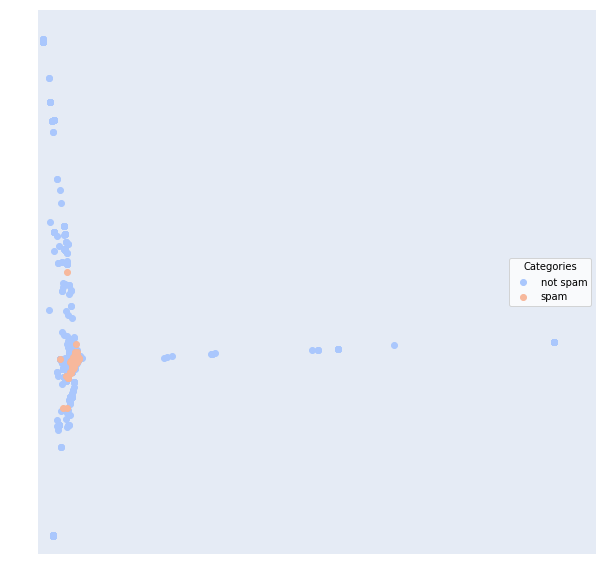

In [653]:
lucem_illud.plotregions(clf_decison, dfTrain_spam)

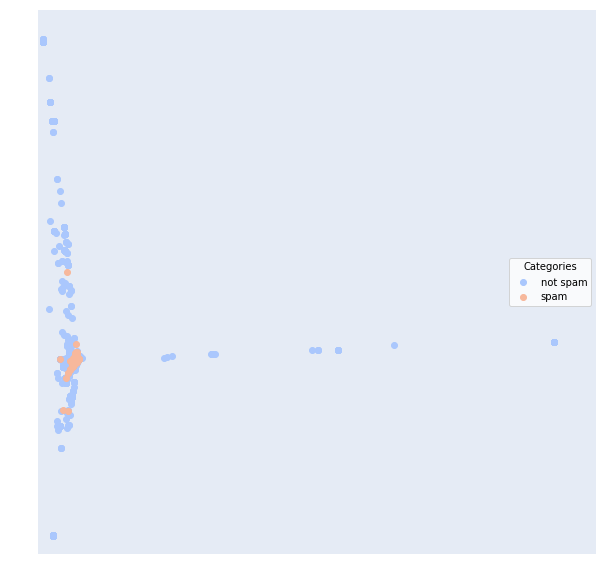

In [654]:
lucem_illud.plotregions(clf_forest, dfTrain_spam)

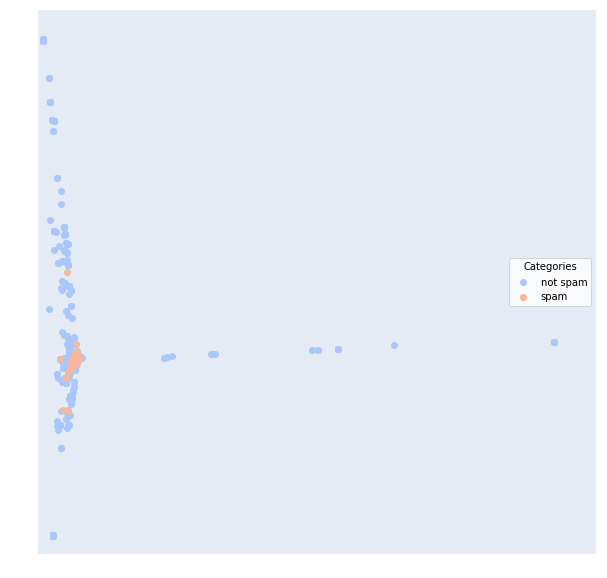

In [655]:
lucem_illud.plotregions(clf_network, dfTrain_spam)

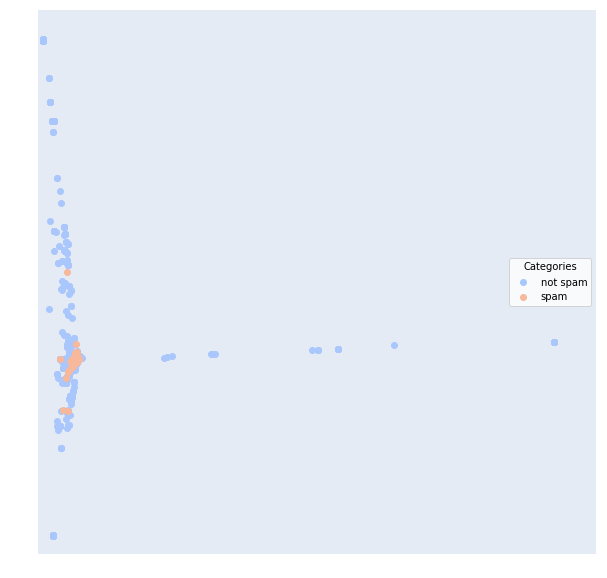

In [656]:
lucem_illud.plotregions(clf_ensemble, dfTrain_spam)

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Go back through all of the cells above and generate 10 distinct artificial datasets and classify them with all of the available methods. Add a cell immediately below and describe which classifier(s) worked best with which artificially constructed data source and why. Then go through all of the empirical datasets (i.e., Newsgroups, Senate Small, Senate Large, Email Spam) and classify them with all available methods. Add a second cell immediately below and describe which classifier(s) worked best with which data set and why.

<span style="color:red">***Stretch*** (but also required) Wander through the SKLearn documentation available [here](http://scikit-learn.org/stable/), particularly perusing the classifiers. In cells following, identify and implement a new classifier that we have not yet used (e.g., AdaBoost, CART) on one artificial dataset and one real dataset (used above). Then, in the next cell describe the classifier, detail how it compares with the approaches above, and why it performed better or worse than others.

So I used the generators to generate 10 distinct datasets, and applied the 9 classfiers to each one of them and see which one worked the best. The result shows as follows:

1. xorSplit in which the two classes are split, oppositely, along each dimension, with noise=0.2
   + By using the test set, the tables show that KNeighbor and Ensemble classifiers yield the highest precision scores
   + Then we can look at the area under the ROC curve, since the larger the area, the better the performance of the classifer, we can see that KNeighbors, Ensemble method, random forest and neural network all give rather good results.
   + In the end we look at the regions that each classifier identifies. We can see that they agree with our observations in point number 2, that KNeighbors, Ensemble method, random forest and neural network all give rather good results. 
2. xorSplit in which the two classes are split, oppositely, along each dimension, with noise=0.5
   + By using the test set, the tables show that KNeighbor classifier yield the highest precision scores
   + Then we can look at the area under the ROC curve, since the larger the area, the better the performance of the classifer, the KNeighbor, random forest, neural network and ensemble all have relatively big areas. 
   + In the end we look at the regions that each classifier identifies. We can see that the graphs agree with our observation in point number 2, KNeighbors, Ensemble method, random forest and neural network all give rather good results. 
3. andSplit in which the two classes are linearly split along one of two dimensions, with noise=0.2
   + Since this is a rather simple split, we can see that throughout the measurements, all of the classifiers did a good job in classficication. 
4. andSplit in which the two classes are linearly split along one of two dimensions, with noise=0.5
   + Similar as when noise=0.2, Since this is a rather simple split, we can see that throughout the measurements, all of the classifiers yield similar results in classficication. 
5. andSplit in which the two classes are linearly split along one of two dimensions, with noise=1.0
   + Since this is a dataset with complete noise/randomness, we can see no individual classifier did a good job in classification. 
6. targetSplit in which one class is nested within the other in two dimensions, with noise=0.2
   + By using the test set, the tables show that bayes,KNeighbor, random forest,decision tree,neural network,ensemble classifiers yield high precision scores
   + Then we can look at the area under the ROC curve, since the larger the area, the better the performance of the classifer, they agree with the observations in the tables,bayes,KNeighbor, random forest,decision tree,neural network,ensemble classifiers all have relatively big areas. 
   + In the end we look at the regions that each classifier identifies. We can see that the graphs agree with our observation in point number 1 and 2, bayes,KNeighbor, random forest,decision tree,neural network,ensemble classifiers  all give rather good results. 
7. targetSplit in which one class is nested within the other in two dimensions, with noise=0.5
   + Similar with when noise=0.2, throughout the measurements, bayes,KNeighbor,random forest,decision tree,neural network,ensemble classifiers give relatively good results. 
8. multiBlobs in which 5 classes are placed as bivariate Gaussians at random locations, with noise=0.2
   + We can see that throughout the measurements, most of the classifiers did a good job in classficication. Only decision tree has relatively lower precision/AUC scores, and less area under the curve.
9. multiBlobs in which 5 classes are placed as bivariate Gaussians at random locations, with noise=0.5
   + Similar with when noise=0.2, throughout the measurements, all of the classfiers give similar, and relatively good results. They all correctly classfied category 0.
10. xorSplit in which the two classes are split, oppositely, along each dimension, with noise=0.9
   + Since this is a dataset with a lot of noise/randomness, we can see almost no single classifier did a good job in classification. Among those "not-very-good" classfiers, polynomial, random forest, neural network and ensemble methods have yielded relatively better results, according to the scores, the area under the curve and the regions they classfied.


1. Reddit dataset
   +  By using the test set, the tables show that linear,KNeighbor, logistics,random forest,neural network and Ensemble classifiers yield high precision scores.
   + Then we can look at the area under the ROC curve, since the larger the area, the better the performance of the classifer, we can see that linear, KNeighbors,logistics, Ensemble method, random forest and neural network all give rather good results, which agree with the observations in the tables.
   + In the end we look at the regions that each classifier identifies. We can see that they agree with our observations in point number 1 and 2, that linear,KNeighbors, logistics,Ensemble method, random forest and neural network all give rather good results. 
2. Newsgroups
   +  By using the test set, the tables show that bayes,linear,logistics,neural network classifiers yield the lowest error rates.
   + Then we can look at the area under the ROC curve, since the larger the area, the better the performance of the classifer, we can see that bayes,linear,logistics, Ensemble method, random forest and neural network all give rather good results.
   + In the end we look at the regions that each classifier identifies. We can see that they agree with our observations in point 2, that bayes,linear,logistics,Ensemble method, random forest and neural network all give relatively good results. 
3. Small Senate
   +  By using the test set, the tables show that decision tree and ensemble methods yield the lowest error rates.
   + Then we can look at the area under the ROC curve, since the larger the area, the better the performance of the classifer, we can see that same with point 1, decision tree and ensemble methods all yield the biggest area under the curve.
4. Large Senate
   + By using the test set, the tables show that linear, logistics,decision tree,random forest,neural network and ensemble methods all yield the low error rates.
   + Then we can look at the area under the ROC curve, since the larger the area, the better the performance of the classifer, we can see that same with point 1, linear, logistics,decision tree,random forest,neural network and ensemble methods all yield big area under the curve.
5. Spam
   + For this problem, the most important point here is not to classify a spam as non-spam, so the false positive error needs to be small, so we mainly focus on AUC.
   + We can find that neural network gives the best classification in this case. 

# Clinton / Obama Press Releases

We often will not have nicely prepared data, so we will work though the proccess of cleaning and structuring in more detail here:

While the Clinton and Obama Senatorial Press Releases are not hand-coded, we can imagine that we have been given a stack of such press releases, but lost the metadata associated with which senatorial office issued which. If we label a few of them, how well can our classifier do at recovering the rest? 

In [99]:
ObamaClintonReleases = pandas.read_csv('../data/ObamaClintonReleases.csv', index_col=0)

Let's turn the 'targetSenator' column into a binary category variable.

In [100]:
ObamaClintonReleases['category'] = [s == 'Obama' for s in ObamaClintonReleases['targetSenator']]

Tokenize and normalize

In [101]:
ObamaClintonReleases['tokenized_text'] = ObamaClintonReleases['text'].apply(lambda x: nltk.word_tokenize(x))
ObamaClintonReleases['normalized_text'] = ObamaClintonReleases['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))

Let's split the data into training data and testing data.

In [102]:
holdBackFraction = .2
train_data_df, test_data_df = lucem_illud.trainTestSplit(ObamaClintonReleases, holdBackFraction=holdBackFraction)

In [103]:
print(len(train_data_df))
print(len(test_data_df))

1368
341


In [169]:
train_data_df[:10]

,download_url,html_url,name,path,text,targetSenator,category,tokenized_text,normalized_text,vect,pca,pca_reduced_10,pca_reduced_40,pca_reduced_100,pca_reduced_200,pca_reduced_400
472,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,28Feb2008Obama140.txt,raw/Obama/28Feb2008Obama140.txt,Obama Statement on the Mississippi River Br...,Obama,True,"[Obama, Statement, on, the, Mississippi, River...","[obama, statement, mississippi, river, bridg, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.04508403228053079, 0.02512234200205005, 0....","[-0.04508403228053079, 0.02512234200205005, 0....","[-0.04508403228053079, 0.02512234200205005, 0....","[-0.04508403228053079, 0.02512234200205005, 0....","[-0.04508403228053079, 0.02512234200205005, 0....","[-0.04508403228053079, 0.02512234200205005, 0...."
1453,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,18Dec2007Clinton64.txt,raw/Clinton/18Dec2007Clinton64.txt,December 18 2007 Clinton Announces Senate Pas...,Clinton,False,"[December, 18, 2007, Clinton, Announces, Senat...","[decemb, clinton, announc, senat, passag, teen...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.0003114339122378966, -0.012946311745296634...","[-0.0003114339122378966, -0.012946311745296634...","[-0.0003114339122378966, -0.012946311745296634...","[-0.0003114339122378966, -0.012946311745296634...","[-0.0003114339122378966, -0.012946311745296634...","[-0.0003114339122378966, -0.012946311745296634..."
316,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,22Jan2008Obama160.txt,raw/Obama/22Jan2008Obama160.txt,Obama Calls on Senate to Swiftly Pass India...,Obama,True,"[Obama, Calls, on, Senate, to, Swiftly, Pass, ...","[obama, call, senat, swift, pass, indian, heal...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.014378907503609721, -0.00795108988165657, -...","[0.014378907503609721, -0.00795108988165657, -...","[0.014378907503609721, -0.00795108988165657, -...","[0.014378907503609721, -0.00795108988165657, -...","[0.014378907503609721, -0.00795108988165657, -...","[0.014378907503609721, -0.00795108988165657, -..."
618,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,6Aug2007Obama314.txt,raw/Obama/6Aug2007Obama314.txt,Senate Passes Three Obama Proposals to Make...,Obama,True,"[Senate, Passes, Three, Obama, Proposals, to, ...","[senat, pass, three, obama, propos, make, amer...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.009952006567870833, -0.052151371281228064,...","[-0.009952006567870833, -0.052151371281228064,...","[-0.009952006567870833, -0.052151371281228064,...","[-0.009952006567870833, -0.052151371281228064,...","[-0.009952006567870833, -0.052151371281228064,...","[-0.009952006567870833, -0.052151371281228064,..."
314,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,22Aug2007Obama299.txt,raw/Obama/22Aug2007Obama299.txt,Durbin Obama Manzullo Urge President Bush...,Obama,True,"[Durbin, Obama, Manzullo, Urge, President, Bus...","[durbin, obama, manzullo, urg, presid, bush, d...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.36490945661950974, 0.4204606170384358, 0.1...","[-0.36490945661950974, 0.4204606170384358, 0.1...","[-0.36490945661950974, 0.4204606170384358, 0.1...","[-0.36490945661950974, 0.4204606170384358, 0.1...","[-0.36490945661950974, 0.4204606170384358, 0.1...","[-0.36490945661950974, 0.4204606170384358, 0.1..."
269,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,20Jan2008Obama162.txt,raw/Obama/20Jan2008Obama162.txt,Obama Statement on the Passing of Former Ch...,Obama,True,"[Obama, Statement, on, the, Passing, of, Forme...","[obama, statement, pass, former, chicago, mayo...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.000858044922162853

## Logistic Regression

First, let's try with a logistic regression, which may be familiar to you from statistical methods classes. First, we must turn the training dataset into a tf-idf matrix (`lucem_illud.generateVecs()` will help with this but for now we are doing it the long way):

In [104]:
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_data_df['text'])

Note that we can use the CountVectorizer instead, which simply produces a matrix of word counts.

In [105]:
TFVects.shape

(1368, 11385)

We can save this in the dataframe to make things easier

In [106]:
train_data_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In a regression, we cannot have more variables than cases. So, we need to first do a dimension reduction. First, we will approah this with PCA. You have previously seen this in week 3. Here we are not concerned about visualization, but rather classification and so all principal components are calculated. Watch out: we have to use `stack` not `sum` for combining the vectors. We note that you could also use topic loading and embedding dimensions as featured variables.

In [107]:
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_data_df['vect'], axis=0))

We can store the PCA space vectors in the dataframe too:

In [108]:
train_data_df['pca'] = [r for r in reduced_data]

Visualization in 2D:

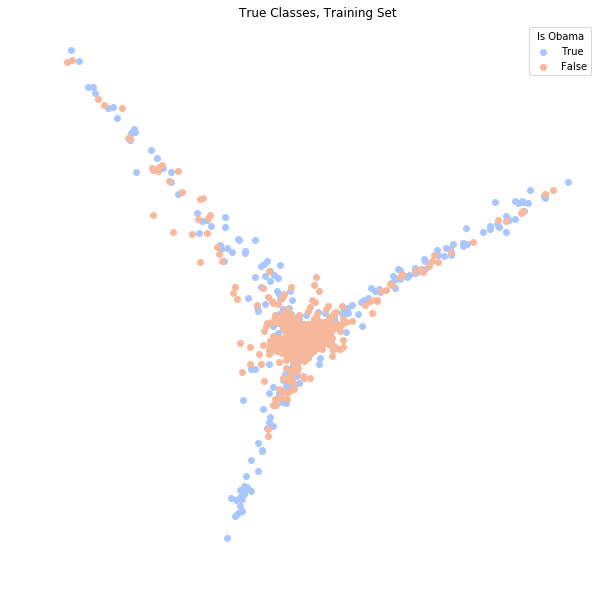

In [109]:
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot Obama
a = np.stack(train_data_df[train_data_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot not Obama
a = np.stack(train_data_df[train_data_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")
    
ax.legend(loc = 'upper right', title = 'Is Obama')
plt.title('True Classes, Training Set')
plt.show()

PCA cannot distinguish Obama very well. Let's perform a screeplot to see how many Principal Components we need.

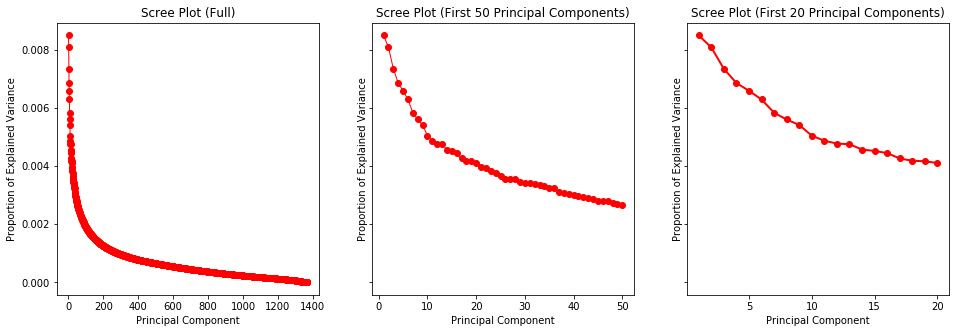

In [111]:
n = len(train_data_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

Let's choose the first 10 pricipal components as our covariates.

In [112]:
train_data_df['pca_reduced_10'] = train_data_df['pca'].apply(lambda x: x[:10])

Now we fit a logistic regression to our data.

In [113]:
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

Let's see how the logistic regression performs on the training dataset from which we develop the model. Unfortunately, the mean accuracy is only about 64%.

In [114]:
logistic.score(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

0.6659356725146199

How does it perform on the testing dataset, which we "held out" and did not use for model training? We need to repeat all the steps on the testing data, but without retraining:

In [115]:
#Create vectors
TFVects_test = TFVectorizer.transform(test_data_df['text'])
test_data_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_data_df['vect'], axis=0))
test_data_df['pca'] = [r for r in reduced_data_test]
test_data_df['pca_reduced_10'] = test_data_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_data_df['pca_reduced_10'], axis=0), test_data_df['category'])

0.6715542521994134

Slightly poorer. How about using more dimensions (40)?

In [116]:
train_data_df['pca_reduced_40'] = train_data_df['pca'].apply(lambda x: x[:40])
test_data_df['pca_reduced_40'] = test_data_df['pca'].apply(lambda x: x[:40])

logistic.fit(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_40'], axis=0), test_data_df['category']))

Training:
0.7580409356725146
Testing:
0.7390029325513197


Or still more (100)?

In [117]:
train_data_df['pca_reduced_100'] = train_data_df['pca'].apply(lambda x: x[:100])
test_data_df['pca_reduced_100'] = test_data_df['pca'].apply(lambda x: x[:100])

logistic.fit(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_100'], axis=0), test_data_df['category']))

Training:
0.8252923976608187
Testing:
0.7859237536656891


Or even more (200)!

In [118]:
train_data_df['pca_reduced_200'] = train_data_df['pca'].apply(lambda x: x[:200])
test_data_df['pca_reduced_200'] = test_data_df['pca'].apply(lambda x: x[:200])

logistic.fit(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_200'], axis=0), test_data_df['category']))

Training:
0.8640350877192983
Testing:
0.8005865102639296


This is becoming ridiculous (400)!

In [119]:
train_data_df['pca_reduced_400'] = train_data_df['pca'].apply(lambda x: x[:400])
test_data_df['pca_reduced_400'] = test_data_df['pca'].apply(lambda x: x[:400])

logistic.fit(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_400'], axis=0), test_data_df['category']))

Training:
0.9122807017543859
Testing:
0.8269794721407625


Increasing the number of covariates would overfit our data, and it seems that using a logistic regression, our prediction accuracy is at best about 65%. We can, however, try a logistic regression that uses the TF-IDF scores for each word, but with an L1 regularization or L1-norm loss function, which is also known as least absolute deviations (LAD), least absolute errors (LAE) or L1 penalty. It minimizes the sum of the absolute differences (S) between the target value ($Y_i$) and the estimated values ($f(x_i)$) and prunes all insignificant variables (i.e., word TF-IDF scores):

$S=\sum^n_{i=1}|y_i=f(x_i)|$

The result is a model retaining only the most individually significant features.

In [120]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l1')
logistic_l1.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
print(logistic_l1.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))

0.8194444444444444


Train the model using training data, and then test it on the testing data.

In [121]:
print(logistic_l1.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

0.7947214076246334


81% accuracy seems like the best we can get by using a logistic regression.

Now let's try with Naive Bayes. Classically, it is trained with word counts, but TF-IDF vectors are also quite good:

In [122]:
naiveBayes = sklearn.naive_bayes.BernoulliNB()
naiveBayes.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])

BernoulliNB(alpha=1.0, binarize=0.0, class_prior=None, fit_prior=True)

In [123]:
print("Training:")
print(naiveBayes.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))
print("Testing:")
print(naiveBayes.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

Training:
0.9656432748538012
Testing:
0.873900293255132


A bit better than the logit, but that's just looking at the accuracy. What about other measures? Let's first save the predictions in the dataframe to save use rerunning the model every time:

In [124]:
test_data_df['nb_predict'] = naiveBayes.predict(np.stack(test_data_df['vect'], axis=0))
test_data_df['nb_predict_prob_true'] = naiveBayes.predict_proba(np.stack(test_data_df['vect'], axis=0))[:,0] #other is prop false

Precision:

In [125]:
sklearn.metrics.precision_score(test_data_df['nb_predict'], test_data_df['category'])

0.8359375

Recall:

In [126]:
sklearn.metrics.recall_score(test_data_df['nb_predict'], test_data_df['category'])

0.8294573643410853

F1-measure:

In [127]:
sklearn.metrics.f1_score(test_data_df['nb_predict'], test_data_df['category'])

0.8326848249027237

Let's take a look at how well our posterior distribution looks relative to the truth.

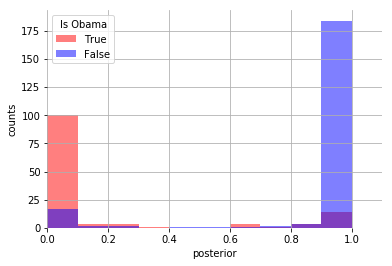

In [128]:
fig, ax = plt.subplots()
ax.grid(False)
ax.set_frame_on(False)
test_data_df[test_data_df['category'].eq(True)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'True', color = 'red')
test_data_df[test_data_df['category'].eq(False)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'False', color = 'blue')
ax.set_xlim((0,1.1))
ax.legend(title = "Is Obama")
ax.set_xlabel('posterior')
ax.set_ylabel('counts')
plt.show()

The classification is suprisingly accurate. We can even look at what words are most influential with a bit of simple math:

In [129]:
#Top indices
trueVals, falseVals = naiveBayes.feature_log_prob_

words_dict = {
    'Obama' : [],
    'Obama_log_prob' : [],
    'Clinton' : [],
    'Clinton_log_prob' : [],
}

for i, prob in sorted(enumerate(trueVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['Obama'].append(TFVectorizer.get_feature_names()[i])
    words_dict['Obama_log_prob'].append(prob)

for i, prob in sorted(enumerate(falseVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['Clinton'].append(TFVectorizer.get_feature_names()[i])
    words_dict['Clinton_log_prob'].append(prob)
    
pandas.DataFrame(words_dict)

,Clinton,Clinton_log_prob,Obama,Obama_log_prob
0,amy,-1.803839,signature,-2.193430
1,brundage,-1.868378,welcomed,-2.276317
2,dick,-1.879551,awarded,-2.314057
3,chicago,-2.064122,fy,-2.326961
4,reform,-2.193800,announcement,-2.340033
5,cases,-2.209304,initiative,-2.366701
6,temporary,-2.209304,ground,-2.408086
7,location,-2.290650,class,-2.422271
8,reported,-2.307744,growing,-2.422271
9,va,-2.307744,read,-2.422271


## Multinomial Naive Bayes

What if we want to classify our text into one of *many* classes? The multinomial Naive Bayes generating model assumes that document features (e.g., words) are generated by draws from a multinomial distribution (recall this gives the probability to observe a particular pattern of counts across features). 

Let's use again the dataset we used in week 3, the 20 newsgroup dataset.

In [130]:
newsgroups = sklearn.datasets.fetch_20newsgroups(data_home = '../data') #Free data to play with: documents from a newsgroup corpus.
newsgroups.target_names #Possible categories, i.e., the newsgroups

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

We can pick specific categories, and pull the relevant training and testing sets. 

In [131]:
target_categories = ['talk.religion.misc', 'soc.religion.christian', 'sci.space', 'comp.graphics'] #Can change these of course

newsgroupsDF = pandas.DataFrame(columns = ['text', 'category', 'source_file'])
for category in target_categories:
    print("Loading data for: {}".format(category))
    ng = sklearn.datasets.fetch_20newsgroups(categories = [category], remove=['headers', 'footers', 'quotes'], data_home = '../data')
    newsgroupsDF = newsgroupsDF.append(pandas.DataFrame({'text' : ng.data, 'category' : [category] * len(ng.data), 'source_file' : ng.filenames}), ignore_index=True)

Loading data for: talk.religion.misc
Loading data for: soc.religion.christian
Loading data for: sci.space
Loading data for: comp.graphics


Now we need to tokenize, and make a training and testing set:

In [132]:
newsgroupsDF['tokenized_text'] = newsgroupsDF['text'].apply(lambda x: nltk.word_tokenize(x))
newsgroupsDF['normalized_text'] = newsgroupsDF['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))

In [137]:
newsgroupsDF[:10]

,category,source_file,text,tokenized_text,normalized_text
0,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,\n\nParadise and salvation are not the same th...,"[Paradise, and, salvation, are, not, the, same...","[paradis, salvat, thing, salvat, better, refer..."
1,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,\nYou're admitting a lot more than that. You ...,"[You, 're, admitting, a, lot, more, than, that...","[admit, lot, admit, moral, situat, admit, acti..."
2,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,"\n\nJesus also recognized other holy days, lik...","[Jesus, also, recognized, other, holy, days, ,...","[jesus, also, recogn, holi, day, like, passov,..."
3,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,In <lsjc8cINNmc1@saltillo.cs.utexas.edu> turpi...,"[In, <, lsjc8cINNmc1, @, saltillo.cs.utexas.ed...","[turpin, russel, turpin, regard, love, less, b..."
4,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,"\nI'm sorry, but He does not! Ever read the F...","[I, 'm, sorry, ,, but, He, does, not, !, Ever,...","[sorri, doe, ever, read, first, command]"
5,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,"The primary problem in human nature is a ""frag...","[The, primary, problem, in, human, nature, is,...","[primari, problem, human, natur, fragment, hum..."
6,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,"\nJim, please, that's a lame explanation of th...","[Jim, ,, please, ,, that, 's, a, lame, explana...","[jim, pleas, lame, explan, triniti, jesus, pro..."
7,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,\n->I addressed most of the key issues in this...,"[-, >, I, addressed, most, of, the, key, issue...","[address, key, issu, veri, long, line, post, d..."
8,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,\nWhere does it say in the bible that Christia...,"[Where, does, it, say, in, the, bible, that, C...","[doe, say, bibl, christian, suppos, persecut, ..."
9,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,I addressed most of the key issues in this ver...,"[I, addressed, most, of, the, key, issues, in,...","[address, key, issu, veri, long, line, post, d..."


In [133]:
holdBackFraction = .2
train_ng_df, test_ng_df = lucem_illud.trainTestSplit(newsgroupsDF, holdBackFraction=holdBackFraction)

In [134]:
print(len(train_ng_df))
print(len(test_ng_df))

1723
430


We need to extract features from the text. We can use built-in feature extraction to do so. We will use a tf-idf vectorizer, which converts the document into a vector of words with tf-idf weights (term-frequency inverse-document frequency). This gives high weight to words that show up a lot in a given document, but rarely across documents in the corpus (more distinctive). 

In [135]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

In [138]:
train_ng_df[:10]

,category,source_file,text,tokenized_text,normalized_text,vect
743,soc.religion.christian,/Users/Reid/scikit_learn_data/20news_home/20ne...,\n\n This is a good point. Christ was hardly...,"[This, is, a, good, point, ., Christ, was, har...","[good, point, christ, hard, onli, person, clai...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
168,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,\n\nHow do you know? Were you there?\n\nWhile ...,"[How, do, you, know, ?, Were, you, there, ?, W...","[know, obvious, koresh, nut, case, typic, inab...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1277,sci.space,/Users/Reid/scikit_learn_data/20news_home/20ne...,"If gamma ray bursters are extragalactic, would...","[If, gamma, ray, bursters, are, extragalactic,...","[gamma, ray, burster, extragalact, would, abso...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
23,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,930418\n\nDo what thou wilt shall be the whole...,"[930418, Do, what, thou, wilt, shall, be, the,...","[thou, wilt, shall, whole, law, honest, word, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1922,comp.graphics,/Users/Reid/scikit_learn_data/20news_home/20ne...,Hello netters!\n \nI have a fairly weak questi...,"[Hello, netters, !, I, have, a, fairly, weak, ...","[hello, netter, fair, weak, question, ask, eve...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2087,comp.graphics,/Users/Reid/scikit_learn_data/20news_home/20ne...,\n\nI think APDA has something called MacWireF...,"[I, think, APDA, has, something, called, MacWi...","[think, apda, someth, call, macwirefram, full,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1438,sci.space,/Users/Reid/scikit_learn_data/20news_home/20ne...,They must be shipping that good Eau Clair acid...,"[They, must, be, shipping, that, good, Eau, Cl...","[must, ship, good, eau, clair, acid, california]","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1841,comp.graphics,/Users/Reid/scikit_learn_data/20news_home/20ne...,Recently I saw the latest Computer Shopper and...,"[Recently, I, saw, the, latest, Computer, Shop...","[recent, saw, latest, comput, shopper, articl,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
35,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,\nRemember the armor of God? The sword that C...,"[Remember, the, armor, of, God, ?, The, sword,...","[rememb, armor, god, sword, christian, wield, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1020,sci.space,/Users/Reid/scikit_learn_data/20news_home/20ne...,"\nActually, there are people who will tell you...","[Actually, ,, there, are, people, who, will, t...","[actual, peopl, tell, enough, ssto, develop, d...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


Now we can train the model:

In [136]:
MultinomialNB_ng = sklearn.naive_bayes.MultinomialNB()
MultinomialNB_ng.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

...and save predictions to the dataframe:

In [139]:
train_ng_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(train_ng_df['vect'], axis=0))
print("Training score:")
print(MultinomialNB_ng.score(np.stack(train_ng_df['vect'], axis=0), train_ng_df['category']))

Training score:
0.8943702843876958


In [140]:
train_ng_df[['category', 'nb_predict']][:10]

,category,nb_predict
743,soc.religion.christian,soc.religion.christian
168,talk.religion.misc,talk.religion.misc
1277,sci.space,sci.space
23,talk.religion.misc,talk.religion.misc
1922,comp.graphics,comp.graphics
2087,comp.graphics,comp.graphics
1438,sci.space,sci.space
1841,comp.graphics,comp.graphics
35,talk.religion.misc,talk.religion.misc
1020,sci.space,sci.space


Looks pretty good, lets examine the testing dataset:

In [141]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(MultinomialNB_ng.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Testing score:
0.7674418604651163


We can even use a confusion matrix, like we used last week for evaluating human coders relative to one another. Now we are evaluating our classifier relative to human coding. We'll just use the one in `lucem_illud`, which requres a classifier and a dataframe with `'vect'` and `'category'` columns, like we have in the examples:

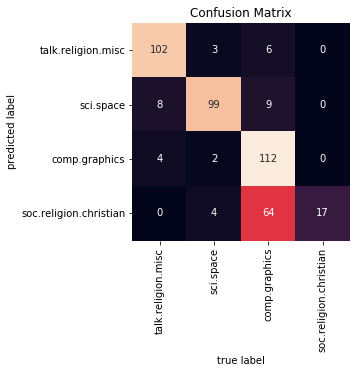

In [142]:
lucem_illud.plotConfusionMatrix(MultinomialNB_ng, test_ng_df)

Let's calculate the precision, recall, and F-measures.

In [143]:
print(sklearn.metrics.precision_score(test_ng_df['nb_predict'], test_ng_df['category'], average = 'weighted')) #precision
print(sklearn.metrics.recall_score(test_ng_df['nb_predict'], test_ng_df['category'], average = 'weighted')) #recall
print(sklearn.metrics.f1_score(test_ng_df['nb_predict'], test_ng_df['category'], average = 'weighted')) #F-1 measure

0.8874821073094896
0.7674418604651163
0.7975593007128344


We can evaluate these per catagory. This has the same requiments as `plotConfusionMatrix`:

In [144]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB_ng, test_ng_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
soc.religion.christian,0.847974,0.570525,0.197674,0.586387,0.949153
sci.space,0.912393,0.821862,0.060465,0.916667,0.853448
talk.religion.misc,0.600000,0.358140,0.158140,1.000000,0.200000
comp.graphics,0.940651,0.843121,0.048837,0.894737,0.918919


We can also plot the ROC curves. This has the same requiments as `plotConfusionMatrix`:

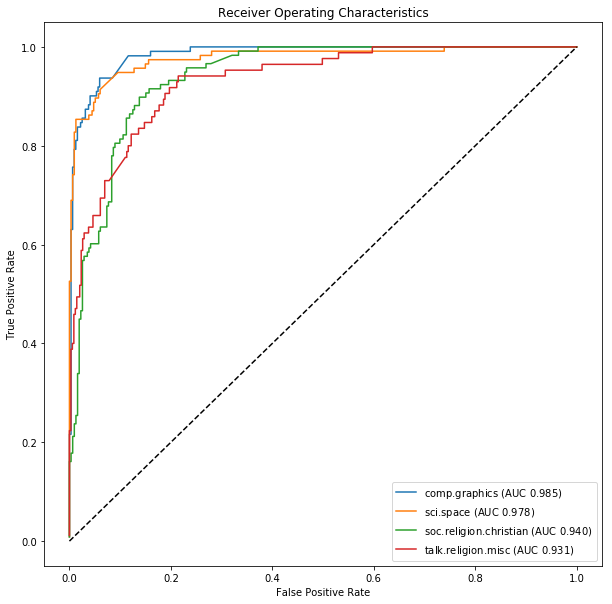

In [145]:
lucem_illud.plotMultiROC(MultinomialNB_ng, test_ng_df)

And we can plot the PCA space visualization:

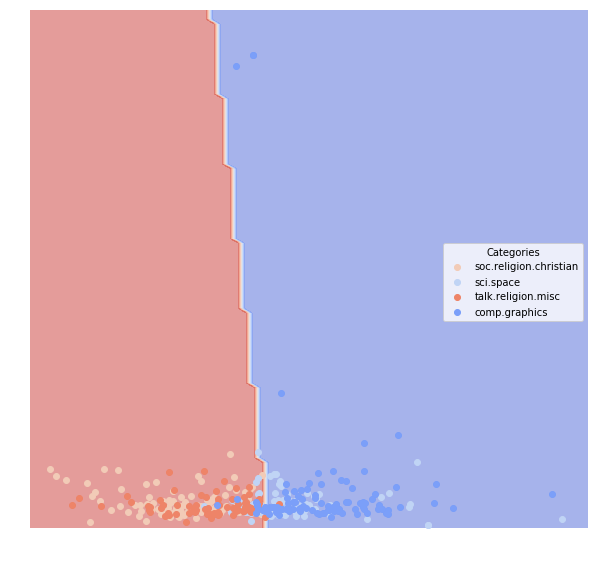

In [146]:
lucem_illud.plotregions(MultinomialNB_ng, test_ng_df)

We can also give the model a new string, not present in our data, and use the *predict* method to see if it can assign it to a category. Using our model to extend its classifications to new, uncoded data might be the primary purpose of a social science application. The words do have to be in the vocabulary, so don't be too creative :-)

In [147]:
def predict_category(s, model, tfidf): #We just define a simple function here
    a = np.zeros((1, len(tfidf.vocabulary_)))
    for w in nltk.word_tokenize(s):
        try:
            a[:,tfidf.vocabulary_[lucem_illud.stemmer_basic.stem(w.lower())]] = 1
        except KeyError:
            print("Warning: '{}' not in vocabulary".format(w))
    return model.predict(a)[0]

In [148]:
predict_category('rockets are cool', MultinomialNB_ng, TFVectorizer_ng)

'sci.space'

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">In the cells immediately following, perform Logistic and Naïve Bayes classification (binary or multinomial) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project (e.g., these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week). Visualize the confusion matrix for training and testing sets. Calculate precision, recall, the F-measure, and AUC, then perform an ROC visualization. How do these classifiers perform? Exrapolate codes from these models to all uncoded data.


For multinomial naive bayes classification, I used a dataset that contains reviews from 3 categories, food, shopping and convenience store, each of which has 500 pieces of text reviews. 

In [149]:
food_review_df = pandas.read_csv('~/food_reviews.csv', sep='\t')
food_review_df = food_review_df.dropna(axis=0, how='any')
food_review_df['category'] = 'Food'

shopping_review_df = pandas.read_csv('~/shopping_reviews.csv', sep='\t')
shopping_review_df = shopping_review_df.dropna(axis=0, how='any')
shopping_review_df['category'] = 'Shopping'

convenience_store_review_df = pandas.read_csv('~/conveniencestore_reviews.csv', sep='\t')
convenience_store_review_df = convenience_store_review_df.dropna(axis=0, how='any')
convenience_store_review_df['category'] = 'convenience_store'

frames = [food_review_df, shopping_review_df, convenience_store_review_df]

yelp_review_df = pandas.concat(frames,ignore_index=True)
yelp_review_df[495:505]

,business_id,text,category
495,58APdML-PG_OD4El2ePTvw,J'avais dans l'idée tous les restos de ce sect...,Food
496,58APdML-PG_OD4El2ePTvw,Rules for visiting Montréal:\n\n1. Go to Le Ca...,Food
497,58APdML-PG_OD4El2ePTvw,Le Cartet is my favorite cafe in Montreal! Ver...,Food
498,58APdML-PG_OD4El2ePTvw,"Over the new year week, we took off and escape...",Food
499,58APdML-PG_OD4El2ePTvw,My favorite brunch in Montreal. There is an A...,Food
500,YDf95gJZaq05wvo7hTQbbQ,"Eh, there's not a lot of stores here at this m...",Shopping
501,YDf95gJZaq05wvo7hTQbbQ,The only mall worse than this one is Midway. ...,Shopping
502,YDf95gJZaq05wvo7hTQbbQ,"I went here for a premier, I was so lost in th...",Shopping
503,YDf95gJZaq05wvo7hTQbbQ,This place kind of looked like a dump. The onl...,Shopping
504,YDf95gJZaq05wvo7hTQbbQ,There is so much to do at Richmond Town Square...,Shopping


In [150]:
yelp_review_df['tokenized_text'] = yelp_review_df['text'].apply(lambda x: nltk.word_tokenize(x))
yelp_review_df['normalized_text'] = yelp_review_df['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))

In [152]:
holdBackFraction = .2
train_review_df, test_review_df = lucem_illud.trainTestSplit(yelp_review_df, holdBackFraction=holdBackFraction)

In [155]:
print(len(train_review_df))
print(len(test_review_df))

1200
300


In [239]:
TFVectorizer_review = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_review = TFVectorizer_review.fit_transform(train_review_df['text'])
train_review_df['vect'] = [np.array(v).flatten() for v in TFVects_review.todense()]

Now we train the model.

In [157]:
MultinomialNB_review = sklearn.naive_bayes.MultinomialNB()
MultinomialNB_review.fit(np.stack(train_review_df['vect'], axis = 0), train_review_df['category'])

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

And save predictions to a dataframe. The training score is pretty high.

In [158]:
train_review_df['nb_predict'] = MultinomialNB_review.predict(np.stack(train_review_df['vect'], axis=0))
print("Training score:")
print(MultinomialNB_review.score(np.stack(train_review_df['vect'], axis=0), train_review_df['category']))

Training score:
0.9391666666666667


True label and predicted label look pretty good!

In [159]:
train_review_df[['category', 'nb_predict']][:10]

,category,nb_predict
548,Shopping,Shopping
787,Shopping,Shopping
1213,convenience_store,convenience_store
1009,convenience_store,convenience_store
1398,convenience_store,convenience_store
809,Shopping,Shopping
1055,convenience_store,convenience_store
1043,convenience_store,convenience_store
1378,convenience_store,convenience_store
396,Food,Food


Now let's examine the tesing data, and it looks pretty nice!

In [240]:
#Create vectors
TFVects_test = TFVectorizer_review.transform(test_review_df['text'])
test_review_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_review_df['nb_predict'] = MultinomialNB_review.predict(np.stack(test_review_df['vect'], axis=0))

#Test
print("Testing score:")
print(MultinomialNB_review.score(np.stack(test_review_df['vect'], axis=0), test_review_df['category']))

Testing score:
0.85


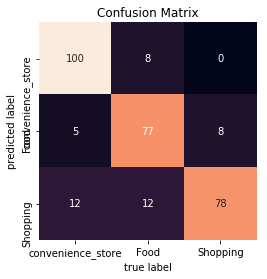

In [161]:
lucem_illud.plotConfusionMatrix(MultinomialNB_review, test_review_df)

In [162]:
print(sklearn.metrics.precision_score(test_review_df['nb_predict'], test_review_df['category'], average = 'weighted')) #precision
print(sklearn.metrics.recall_score(test_review_df['nb_predict'], test_review_df['category'], average = 'weighted')) #recall
print(sklearn.metrics.f1_score(test_review_df['nb_predict'], test_review_df['category'], average = 'weighted')) #F-1 measure

0.8569564270152504
0.85
0.8508135168961201


Let's calculate the precision, recall, and F-measures. We can see the error rate is low and precision scores are high.

In [163]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB_review, test_review_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Food,0.918692,0.818056,0.083333,0.854701,0.925926
convenience_store,0.862151,0.773570,0.106667,0.906977,0.764706
Shopping,0.880159,0.722486,0.110000,0.793814,0.855556


The area under the curve is big too.

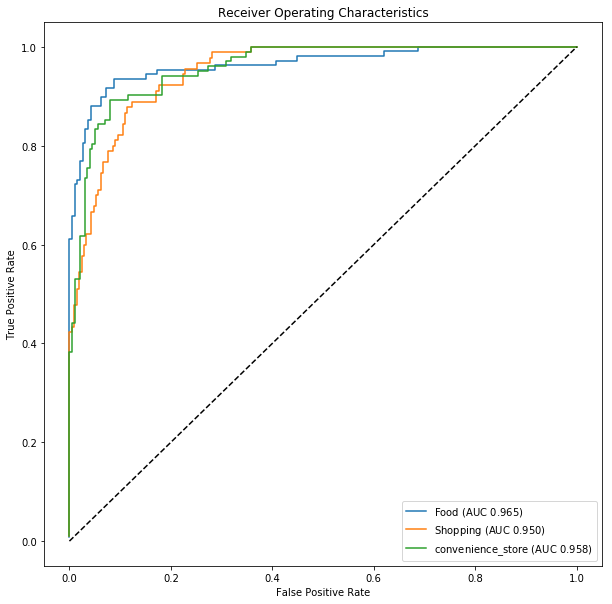

In [164]:
lucem_illud.plotMultiROC(MultinomialNB_review, test_review_df)

All these measures show that multinomial naive bayes is a good classficiation method in this case. 

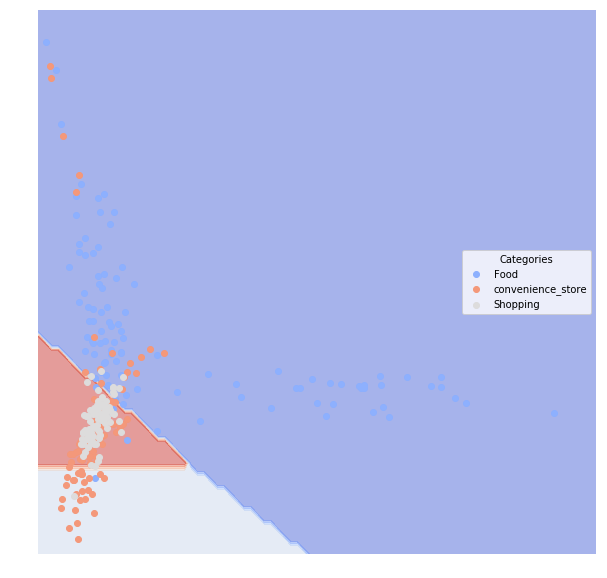

In [165]:
lucem_illud.plotregions(MultinomialNB_review, test_review_df)

For logistic classfication, I used a dataset that contain reviews from close or open restaurants, each of which has 1000 pieces of reviews.

In [170]:
openrestaurant_review_df = pandas.read_csv('~/openrestaurant_reviews.csv', sep='\t')
openrestaurant_review_df = openrestaurant_review_df.dropna(axis=0, how='any')
openrestaurant_review_df['is_open'] = 'yes'

closerestaurant_review_df = pandas.read_csv('~/closerestaurant_reviews.csv', sep='\t')
closerestaurant_review_df = closerestaurant_review_df.dropna(axis=0, how='any')
closerestaurant_review_df['is_open'] = 'no'

frames = [openrestaurant_review_df,closerestaurant_review_df]

yelp_review_isopen_df = pandas.concat(frames,ignore_index=True)
yelp_review_isopen_df[995:1005]

,business_id,text,is_open
995,--9e1ONYQuAa-CB_Rrw7Tw,"When I think Delmonico, I think banana cream p...",yes
996,--9e1ONYQuAa-CB_Rrw7Tw,We have been wanting to check out Delmonico fo...,yes
997,--9e1ONYQuAa-CB_Rrw7Tw,Went there for lunch during the week and it wa...,yes
998,--9e1ONYQuAa-CB_Rrw7Tw,Great steak but disappointing service for the ...,yes
999,--9e1ONYQuAa-CB_Rrw7Tw,From being a staple and a visit every single t...,yes
1000,--g-a85VwrdZJNf0R95GcQ,These guys are great. \n\nExtremely friendly a...,no
1001,--g-a85VwrdZJNf0R95GcQ,"What a wonderful surprise, this restaurant was...",no
1002,--g-a85VwrdZJNf0R95GcQ,Ordered takeout from the place and the food wa...,no
1003,--g-a85VwrdZJNf0R95GcQ,fantastic to have a true Mediterranean restaur...,no
1004,--g-a85VwrdZJNf0R95GcQ,All the food is very fresh and incredibly deli...,no


In [185]:
yelp_review_isopen_df['category'] = [s == 'yes' for s in yelp_review_isopen_df['is_open']]

In [171]:
yelp_review_isopen_df['tokenized_text'] = yelp_review_isopen_df['text'].apply(lambda x: nltk.word_tokenize(x))
yelp_review_isopen_df['normalized_text'] = yelp_review_isopen_df['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))

In [186]:
yelp_review_isopen_df[995:1005]

,business_id,text,is_open,tokenized_text,normalized_text,category
995,--9e1ONYQuAa-CB_Rrw7Tw,"When I think Delmonico, I think banana cream p...",yes,"[When, I, think, Delmonico, ,, I, think, banan...","[think, delmonico, think, banana, cream, pie, ...",True
996,--9e1ONYQuAa-CB_Rrw7Tw,We have been wanting to check out Delmonico fo...,yes,"[We, have, been, wanting, to, check, out, Delm...","[want, check, delmonico, restaur, week, made, ...",True
997,--9e1ONYQuAa-CB_Rrw7Tw,Went there for lunch during the week and it wa...,yes,"[Went, there, for, lunch, during, the, week, a...","[went, lunch, dure, week, dead, littl, worri, ...",True
998,--9e1ONYQuAa-CB_Rrw7Tw,Great steak but disappointing service for the ...,yes,"[Great, steak, but, disappointing, service, fo...","[great, steak, disappoint, servic, price, went...",True
999,--9e1ONYQuAa-CB_Rrw7Tw,From being a staple and a visit every single t...,yes,"[From, being, a, staple, and, a, visit, every,...","[stapl, visit, everi, singl, time, late, visit...",True
1000,--g-a85VwrdZJNf0R95GcQ,These guys are great. \n\nExtremely friendly a...,no,"[These, guys, are, great, ., \n\nExtremely, fr...","[guy, great, friend, nice, servic, food, perfe...",False
1001,--g-a85VwrdZJNf0R95GcQ,"What a wonderful surprise, this restaurant was...",no,"[What, a, wonderful, surprise, ,, this, restau...","[wonder, surpris, restaur, famili, restaur, ni...",False
1002,--g-a85VwrdZJNf0R95GcQ,Ordered takeout from the place and the food wa...,no,"[Ordered, takeout, from, the, place, and, the,...","[order, takeout, place, food, great, got, gyro...",False
1003,--g-a85VwrdZJNf0R95GcQ,fantastic to have a true Mediterranean restaur...,no,"[fantastic, to, have, a, true, Mediterranean, ...","[fantast, true, mediterranean, restaur, everyt...",False
1004,--g-a85VwrdZJNf0R95GcQ,All the food is very fresh and incredibly deli...,no,"[All, the, food, is, very, fresh, and, incredi...","[food, veri, fresh, incred, delici, falafel, p...",False


In [188]:
holdBackFraction = .2
train_isopen_review_df, test_isopen_review_df = lucem_illud.trainTestSplit(yelp_review_isopen_df, holdBackFraction=holdBackFraction)

In [189]:
print(len(train_isopen_review_df))
print(len(test_isopen_review_df))

1600
400


In [190]:
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_isopen_review_df['text'])
train_isopen_review_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [191]:
pca = sklearn.decomposition.PCA()
reduced_review_data = pca.fit_transform(np.stack(train_isopen_review_df['vect'], axis=0))

In [192]:
train_isopen_review_df['pca'] = [r for r in reduced_review_data]

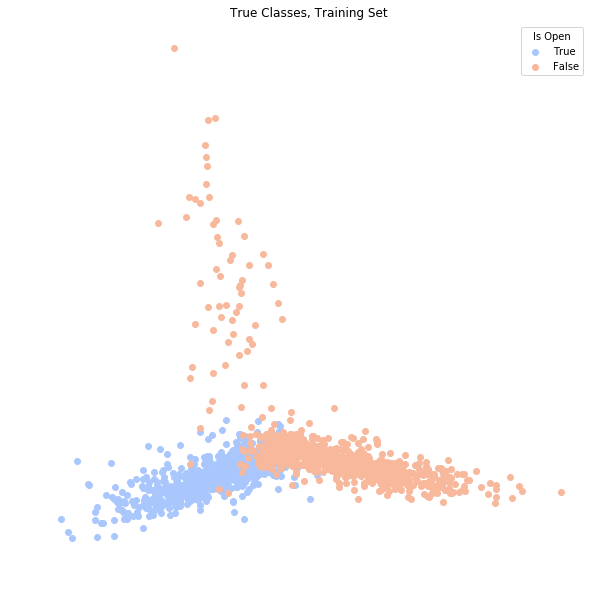

In [193]:
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot is open
a = np.stack(train_isopen_review_df[train_isopen_review_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot not open
a = np.stack(train_isopen_review_df[train_isopen_review_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")
    
ax.legend(loc = 'upper right', title = 'Is Open')
plt.title('True Classes, Training Set')
plt.show()

Let's perform a screeplot to see how many Principal Components we need.It looks like 5 may be a good number to start.

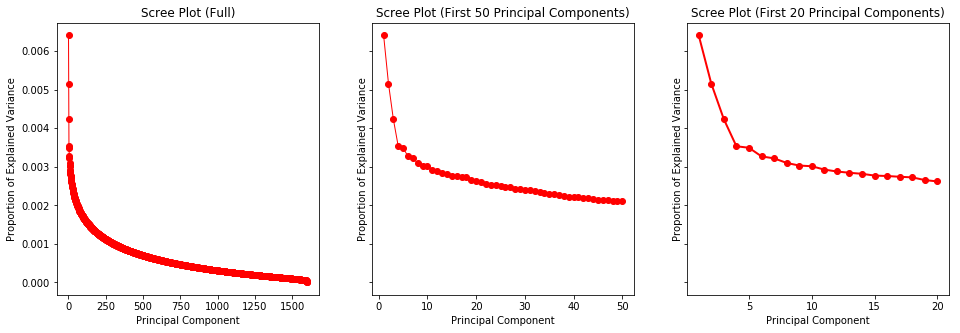

In [195]:
n = len(train_isopen_review_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

Let's choose the first 5 pricipal components as our covariates. We fit a logistic regression to our data.

In [197]:
train_isopen_review_df['pca_reduced_5'] = train_isopen_review_df['pca'].apply(lambda x: x[:5])
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_isopen_review_df['pca_reduced_5'], axis=0), train_isopen_review_df['category'])

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

Let's see how the logistic regression performs on the training dataset from which we develop the model.The mean accuracy is 89%, which is good!

In [198]:
logistic.score(np.stack(train_isopen_review_df['pca_reduced_5'], axis=0), train_isopen_review_df['category'])

0.899375

How does it perform on the testing dataset, which we "held out" and did not use for model training? The score is even higher!

In [199]:
#Create vectors
TFVects_test = TFVectorizer.transform(test_isopen_review_df['text'])
test_isopen_review_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_isopen_review_df['vect'], axis=0))
test_isopen_review_df['pca'] = [r for r in reduced_data_test]
test_isopen_review_df['pca_reduced_5'] = test_isopen_review_df['pca'].apply(lambda x: x[:5])

#Test
logistic.score(np.stack(test_isopen_review_df['pca_reduced_5'], axis=0), test_isopen_review_df['category'])

0.93

How about using more dimensions (20)? The score is even higher.

In [200]:
train_isopen_review_df['pca_reduced_20'] = train_isopen_review_df['pca'].apply(lambda x: x[:20])
test_isopen_review_df['pca_reduced_20'] = test_isopen_review_df['pca'].apply(lambda x: x[:20])

logistic.fit(np.stack(train_isopen_review_df['pca_reduced_20'], axis=0), train_isopen_review_df['category'])

print("Training:")
print(logistic.score(np.stack(train_isopen_review_df['pca_reduced_20'], axis=0), train_isopen_review_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_isopen_review_df['pca_reduced_20'], axis=0), test_isopen_review_df['category']))

Training:
0.925
Testing:
0.9525


How about using fewer dimensions (2)? The score is lower than 20, but higher than 5.

In [201]:
train_isopen_review_df['pca_reduced_2'] = train_isopen_review_df['pca'].apply(lambda x: x[:2])
test_isopen_review_df['pca_reduced_2'] = test_isopen_review_df['pca'].apply(lambda x: x[:2])

logistic.fit(np.stack(train_isopen_review_df['pca_reduced_2'], axis=0), train_isopen_review_df['category'])

print("Training:")
print(logistic.score(np.stack(train_isopen_review_df['pca_reduced_2'], axis=0), train_isopen_review_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_isopen_review_df['pca_reduced_2'], axis=0), test_isopen_review_df['category']))

Training:
0.90125
Testing:
0.93


In [202]:
train_isopen_review_df['pca_reduced_1'] = train_isopen_review_df['pca'].apply(lambda x: x[:1])
test_isopen_review_df['pca_reduced_1'] = test_isopen_review_df['pca'].apply(lambda x: x[:1])

logistic.fit(np.stack(train_isopen_review_df['pca_reduced_1'], axis=0), train_isopen_review_df['category'])

print("Training:")
print(logistic.score(np.stack(train_isopen_review_df['pca_reduced_1'], axis=0), train_isopen_review_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_isopen_review_df['pca_reduced_1'], axis=0), test_isopen_review_df['category']))

Training:
0.865625
Testing:
0.9


In [203]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l1')
logistic_l1.fit(np.stack(train_isopen_review_df['vect'], axis=0), train_isopen_review_df['category'])
print(logistic_l1.score(np.stack(train_isopen_review_df['vect'], axis=0), train_isopen_review_df['category']))

0.92375


92% accuracy seems like the best we can get by using a logistic regression.

In [204]:
print(logistic_l1.score(np.stack(test_isopen_review_df['vect'], axis=0), test_isopen_review_df['category']))

0.9025


# Decision Trees

Decision trees can be used to predict both categorical/class labels (i.e., classification) and continuous labels (i.e., regression).

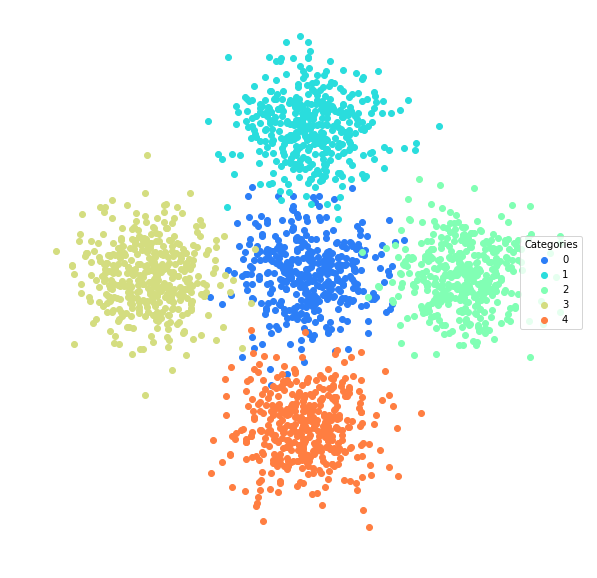

In [205]:
blobs_df = lucem_illud.multiBlobs(noise=.2, centers=[(0,0), (0,5), (5,0), (-5,0), (0,-5)])
df_exampleTree_train, df_exampleTree_test = lucem_illud.trainTestSplit(blobs_df)
lucem_illud.plotter(df_exampleTree_train)

Now we import our Decision Tree classifier from sklearn.tree (familiar syntax) and fit it using the fit method.

In [206]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')

To see what's going on visually with the classification: 

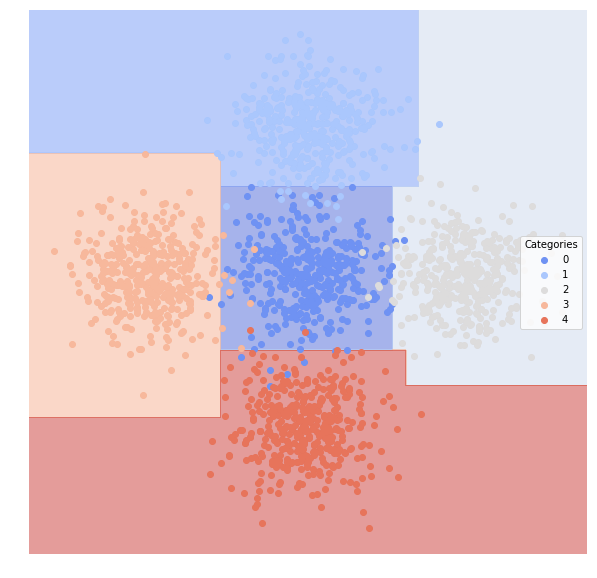

In [207]:
lucem_illud.plotregions(clf_tree, df_exampleTree_train)

In [208]:
lucem_illud.evaluateClassifier(clf_tree, df_exampleTree_test)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.981365,0.905297,0.024,0.911290,0.991228
1,0.980769,0.969538,0.008,1.000000,0.961538
2,0.988846,0.974396,0.006,0.990000,0.980198
3,0.974846,0.940347,0.012,0.976744,0.954545
4,0.983871,0.973742,0.006,1.000000,0.967742


Lets look at accuracy:

In [209]:
sklearn.metrics.accuracy_score(df_exampleTree_test['category'],clf_tree.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))

0.972

What happens if we trim the tree?

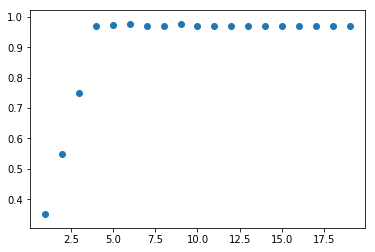

In [210]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])
    score = sklearn.metrics.accuracy_score(df_exampleTree_test['category'], tree2.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

We can select different layers of the decision tree or "prune" it. At approximately four layers down in the decision tree, the shape is somewhat odd, suggesting that our model is overfitting beyond those four layers.

Combining multiple overfitting estimators turns out to be a key idea in machine learning. This is called **bagging** and is a type of **ensemble** method. The idea is to make many randomized estimators--each can overfit, as decision trees are wont to do--but then to combine them, ultimately producing a better classification. A **random forest** is produced by bagging decision trees.

In [211]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10) #Create an instance of our decision tree classifier.

bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data

In [212]:
bag.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category']) #Fit the bagged classifier

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
         bootstrap=True, bootstrap_features=False, max_features=1.0,
         max_samples=0.8, n_estimators=100, n_jobs=1, oob_score=False,
         random_state=1, verbose=0, warm_start=False)

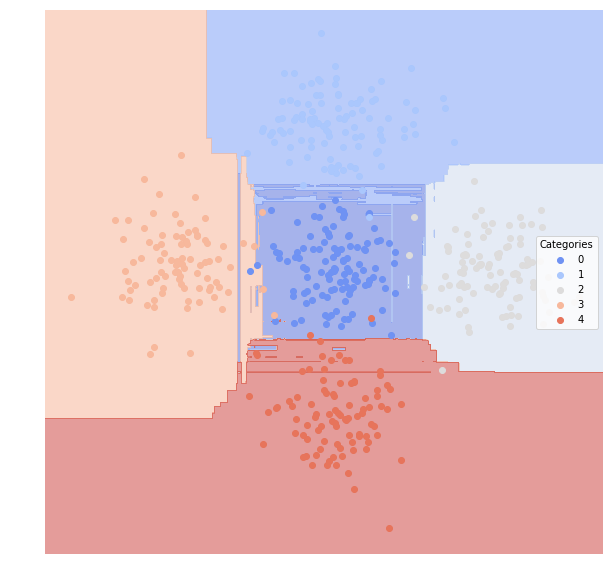

In [213]:
lucem_illud.plotregions(bag, df_exampleTree_test)

In [214]:
lucem_illud.evaluateClassifier(bag, df_exampleTree_test)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.975184,0.906658,0.024,0.925000,0.973684
1,0.987859,0.965908,0.008,0.980769,0.980769
2,0.985149,0.976297,0.006,1.000000,0.970297
3,0.981741,0.960678,0.008,0.988372,0.965909
4,0.988019,0.971859,0.006,0.989130,0.978495


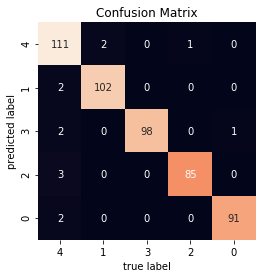

In [215]:
lucem_illud.plotConfusionMatrix(bag, df_exampleTree_test)

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">In the cells immediately following, perform decision tree and random forest classification (binary, multinomial or continuous) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. As with ***Exercise 2***, these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week. Visualize the classification of data points. Calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Now build an ensemble classifier by bagging trees into a random forest. Visualize the result. How do these classifiers perform? What does ensemble learning do?

For this problem we use the dataset with reviews from 3 categories.

In [216]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(train_review_df['vect'], axis =0), train_review_df['category'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')

Let's see how does decision tree perform on our dataset. 

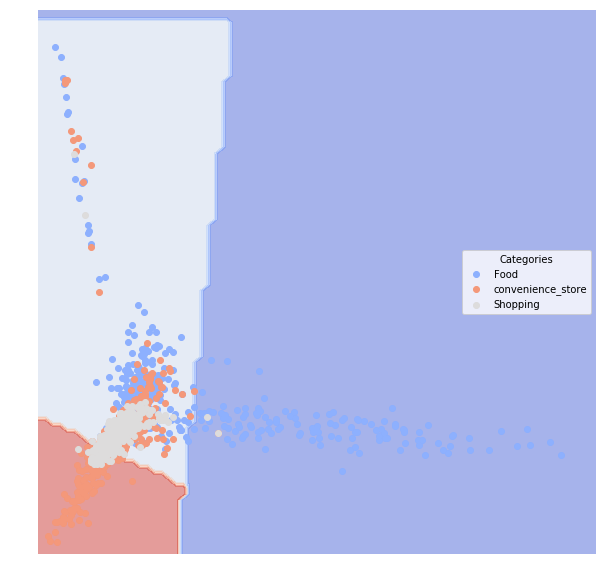

In [217]:
lucem_illud.plotregions(clf_tree, train_review_df)

From the table we can see that Decision tree does not seem like an appropriate classfier on our dataset. 

In [218]:
lucem_illud.evaluateClassifier(clf_tree, test_review_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Food,0.695312,0.585000,0.226667,0.900000,0.416667
convenience_store,0.639483,0.507380,0.250000,0.909091,0.294118
Shopping,0.689683,0.408914,0.430000,0.410138,0.988889


The accuracy is not high. 

In [219]:
sklearn.metrics.accuracy_score(test_review_df['category'],clf_tree.predict(np.stack(test_review_df['vect'], axis = 0)))

0.5466666666666666

What if we trim the tree? It seems like the tree can keep growing even after the depth of 18, meaning that there are a lot of subtopics within the category.

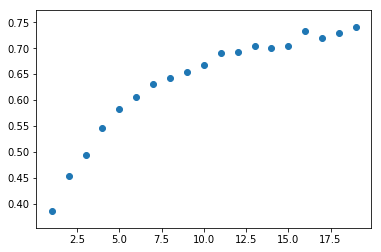

In [220]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(train_review_df['vect'], axis =0), train_review_df['category'])
    score = sklearn.metrics.accuracy_score(test_review_df['category'], tree2.predict(np.stack(test_review_df['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

Now let's do bagging.

In [221]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=20) #Create an instance of our decision tree classifier.

bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data

In [222]:
bag.fit(np.stack(train_review_df['vect'], axis =0), train_review_df['category']) #Fit the bagged classifier

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=20,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
         bootstrap=True, bootstrap_features=False, max_features=1.0,
         max_samples=0.8, n_estimators=100, n_jobs=1, oob_score=False,
         random_state=1, verbose=0, warm_start=False)

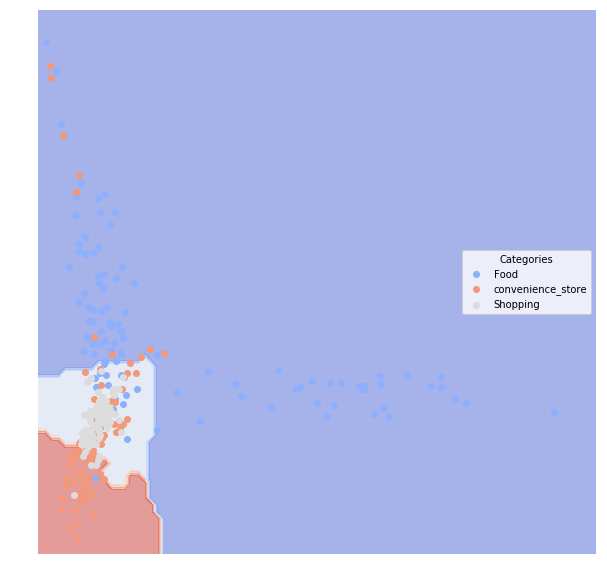

In [223]:
lucem_illud.plotregions(bag, test_review_df)

In [224]:
lucem_illud.evaluateClassifier(bag, test_review_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Food,0.813947,0.709847,0.150000,0.870588,0.685185
convenience_store,0.773619,0.642607,0.173333,0.837838,0.607843
Shopping,0.815079,0.556533,0.223333,0.581560,0.911111


Wow after we combine the random estimators, and creating this random forests, we can see the performace on our dataset is much better than decision tree!

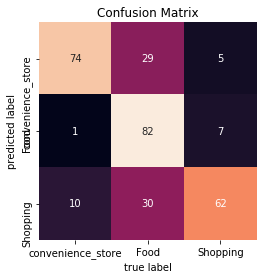

In [225]:
lucem_illud.plotConfusionMatrix(bag, test_review_df)

# K-Nearest Neighbors

The K-Nearest neighbors classifier takes a simpler premise than those before: Find the closest labeled datapoint in set and "borrow" its label.

Let's use newsgroup data again.

In [226]:
newsgroupsDF[:5]

,category,source_file,text,tokenized_text,normalized_text
0,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,\n\nParadise and salvation are not the same th...,"[Paradise, and, salvation, are, not, the, same...","[paradis, salvat, thing, salvat, better, refer..."
1,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,\nYou're admitting a lot more than that. You ...,"[You, 're, admitting, a, lot, more, than, that...","[admit, lot, admit, moral, situat, admit, acti..."
2,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,"\n\nJesus also recognized other holy days, lik...","[Jesus, also, recognized, other, holy, days, ,...","[jesus, also, recogn, holi, day, like, passov,..."
3,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,In <lsjc8cINNmc1@saltillo.cs.utexas.edu> turpi...,"[In, <, lsjc8cINNmc1, @, saltillo.cs.utexas.ed...","[turpin, russel, turpin, regard, love, less, b..."
4,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,"\nI'm sorry, but He does not! Ever read the F...","[I, 'm, sorry, ,, but, He, does, not, !, Ever,...","[sorri, doe, ever, read, first, command]"


Make a testing and training set:

In [227]:
holdBackFraction = .2
train_ng_df, test_ng_df = lucem_illud.trainTestSplit(newsgroupsDF, holdBackFraction=holdBackFraction)

Let's initialize our k-nearest neighbors classifier:

In [228]:
n_neighbors = 15
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

Let's try to classify using the TF-IDF vectors:

In [229]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

In [230]:
clf_knearest.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=15, p=2,
           weights='uniform')

In [231]:
lucem_illud.evaluateClassifier(clf_knearest, train_ng_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
soc.religion.christian,0.502105,0.278732,0.274521,1.000000,0.004211
sci.space,0.539010,0.295905,0.359837,0.337868,0.312369
talk.religion.misc,0.589949,0.204803,0.338944,0.243902,0.482759
comp.graphics,0.558995,0.307836,0.412652,0.337110,0.494802


And lets look at the testing data

In [232]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = clf_knearest.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(clf_knearest.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Testing score:
0.23953488372093024


Let's produce another confusion matrix:

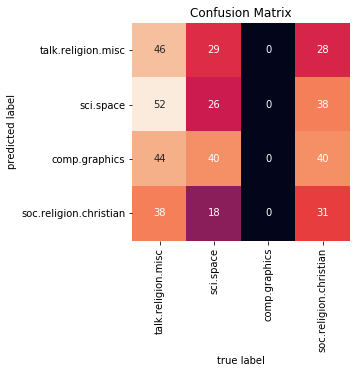

In [233]:
lucem_illud.plotConfusionMatrix(clf_knearest, test_ng_df)

You can produce the PCA space visual if you want, altough it can take a very long time, so we'll leave it optionally commented out:

In [ ]:
#lucem_illud.plotregions(clf_knearest, test_ng_df)

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">In the cells immediately following, perform and visualize k-nearest neighbor classification using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. Visualize the classification of data points and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Articulate how the *k*-nearest neighbor approach relates to *k*-means clustering explored in ***week 3***?

In [234]:
n_neighbors = 15
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

In [235]:
clf_knearest.fit(np.stack(train_review_df['vect'], axis = 0), train_review_df['category'])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=15, p=2,
           weights='uniform')

The table shows that the k-nearest neighbor classfication is a good classfication method for our data, with low error-rate and high precision scores.

In [236]:
lucem_illud.evaluateClassifier(clf_knearest, train_review_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Food,0.928357,0.826423,0.070833,0.866348,0.926020
convenience_store,0.908489,0.818576,0.078333,0.891753,0.869347
Shopping,0.918138,0.845986,0.069167,0.916031,0.878049


By testing on our test data, the accuracy rate is high too. 

In [241]:
#Create vectors
TFVects_test = TFVectorizer_review.transform(test_review_df['text'])
test_review_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_review_df['knear_predict'] = clf_knearest.predict(np.stack(test_review_df['vect'], axis=0))

#Test
print("Testing score:")
print(clf_knearest.score(np.stack(test_review_df['vect'], axis=0), test_review_df['category']))

Testing score:
0.86


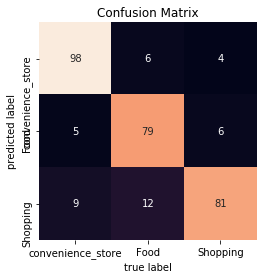

In [242]:
lucem_illud.plotConfusionMatrix(clf_knearest, test_review_df)

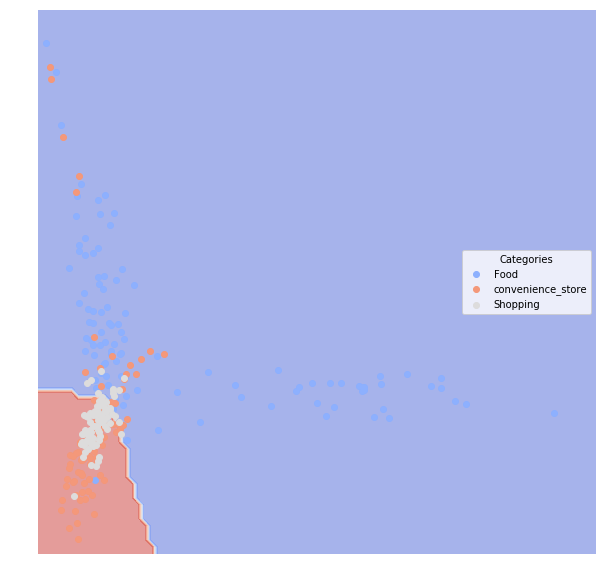

In [243]:
lucem_illud.plotregions(clf_knearest, test_review_df)

# SVMs

Now we will examine Support Vector Machines, an approach that creates the partition that preserves the "maximum margin" between classes.

We will use a few sub forums from reddit--which tend to share text rather than memes--namely `talesfromtechsupport`, `badroommates`, `weeabootales` and `relationships`. The top 100 text posts from each have been saved to `data/reddit.csv`.

In [244]:
redditDf = pandas.read_csv('../data/reddit.csv', index_col = 0)

#Drop a couple missing values

redditDf = redditDf.dropna()

#Set category

redditDf['category'] = redditDf['subreddit']

#tokenize and normalize
redditDf['tokenized_text'] = redditDf['text'].apply(lambda x: nltk.word_tokenize(x))
redditDf['normalized_text'] = redditDf['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))

We will tf.idf the data to make our vectors:

In [246]:
redditTFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.5, min_df=3, stop_words='english', norm='l2')
redditTFVects = redditTFVectorizer.fit_transform([' '.join(l) for l in redditDf['normalized_text']])
redditDf['vect'] = [np.array(v).flatten() for v in redditTFVects.todense()]

Initilize the model and make a train test split:

In [247]:
holdBackFraction = .2
train_redditDf, test_redditDf = lucem_illud.trainTestSplit(redditDf, holdBackFraction=holdBackFraction)

In [ ]:
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
#probability = True is slower but  lets you call predict_proba()
clf_svm.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

...and consider the results:

In [ ]:
lucem_illud.evaluateClassifier(clf_svm, test_redditDf)

In [ ]:
lucem_illud.plotConfusionMatrix(clf_svm, test_redditDf)

In [ ]:
lucem_illud.plotregions(clf_svm, test_redditDf)

# Neural Nets

We include an example of a simple neural network, the Multi-layer Perceptron (MLP) that learns a function $f(\cdot): R^m \rightarrow R^o$ by training on a dataset, where $m$ is the number of dimensions for input and $o$ is the number of dimensions for output. Given a set of features $X = {x_1, x_2, ..., x_m}$ and a target $y$, it can learn a non-linear function approximator for either classification or regression. It is different from logistic regression, in that between the input and the output layer, there can be one or more non-linear layers, called hidden layers. The following figure shows a one hidden layer MLP with scalar output. ![title](../data/multilayerperceptron_network.png) The leftmost layer, known as the input layer, consists of a set of "neurons" $\{x_i | x_1, x_2, ..., x_m\}$ representing the input features (e.g., weighted words). Each neuron in the hidden layer transforms the values from the previous layer with a weighted linear summation $w_1x_1 + w_2x_2 + ... + w_mx_m$, followed by a non-linear activation function $g(\cdot):R \rightarrow R$ - like the logistic or hyperbolic tan function. The output layer receives the values from the last hidden layer and transforms them into output values.

In [248]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=None,
       shuffle=True, solver='adam', tol=0.0001, validation_fraction=0.1,
       verbose=False, warm_start=False)

In [249]:
lucem_illud.evaluateClassifier(clf_nn, test_redditDf)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Relationships,0.957499,0.911730,0.028213,0.962500,0.927711
Tales From Tech Support,0.991118,0.975925,0.006270,0.986301,0.986301
Bad Roommates: Tales of Irritation,0.976554,0.918328,0.021944,0.936709,0.973684
Weeaboo Tales: stories about the extreme fans of japanese culture,0.984195,0.960821,0.012539,0.977011,0.977011


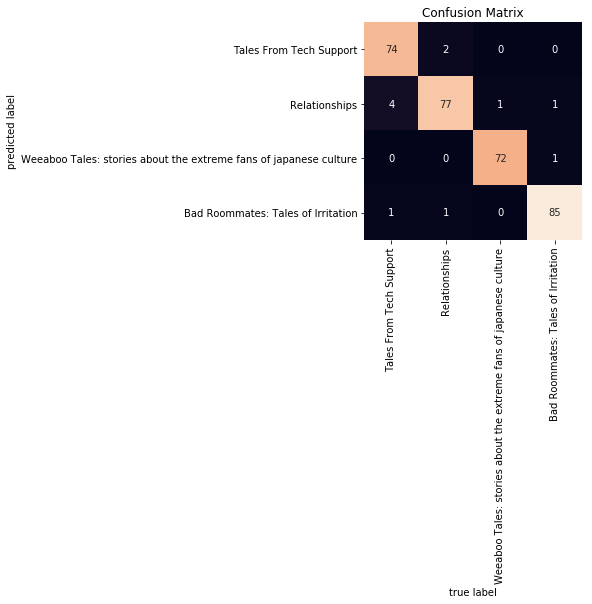

In [250]:
lucem_illud.plotConfusionMatrix(clf_nn, test_redditDf)

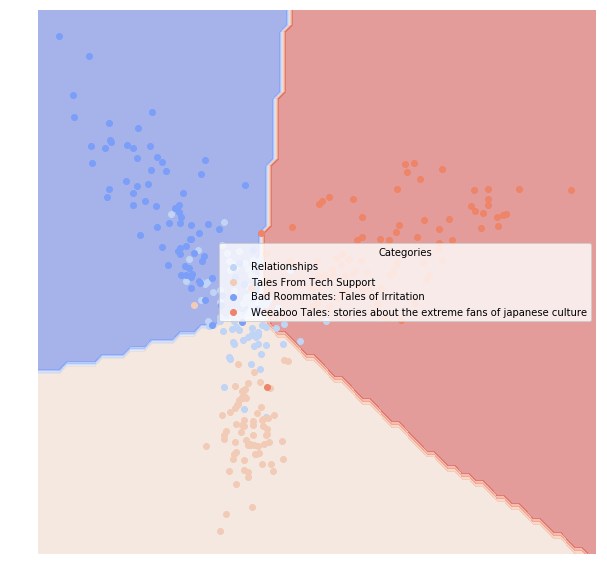

In [251]:
lucem_illud.plotregions(clf_nn, test_redditDf)

It performs very well.

## <span style="color:red">*Exercise 5*</span>

<span style="color:red">In the cells immediately following, perform a neural network classification and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). How does this classify relevant to *k*-nearest neighbor, Naive Bayes, logistic and decision-tree approaches?

In [252]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_review_df['vect'], axis=0), train_review_df['category'])

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=None,
       shuffle=True, solver='adam', tol=0.0001, validation_fraction=0.1,
       verbose=False, warm_start=False)

After I fit the data using neural network, I compared it with the other classfiers. We can see that except for decision tree, all the other classfiers have yielded relatively good classifications.The error rates are all low, and the precision socres are high.  

In [253]:
lucem_illud.evaluateClassifier(clf_nn, test_review_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Food,0.932292,0.862569,0.063333,0.908257,0.916667
convenience_store,0.869578,0.788135,0.100000,0.918605,0.774510
Shopping,0.884921,0.710582,0.116667,0.761905,0.888889


In [256]:
lucem_illud.evaluateClassifier(clf_tree, test_review_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Food,0.695312,0.585000,0.226667,0.900000,0.416667
convenience_store,0.639483,0.507380,0.250000,0.909091,0.294118
Shopping,0.689683,0.408914,0.430000,0.410138,0.988889


In [257]:
lucem_illud.evaluateClassifier(clf_knearest, test_review_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Food,0.917245,0.827315,0.080000,0.875000,0.907407
convenience_store,0.871806,0.776852,0.103333,0.890110,0.794118
Shopping,0.896032,0.751558,0.096667,0.814433,0.877778


In [258]:
lucem_illud.evaluateClassifier(MultinomialNB_review, test_review_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Food,0.918692,0.818056,0.083333,0.854701,0.925926
convenience_store,0.862151,0.773570,0.106667,0.906977,0.764706
Shopping,0.880159,0.722486,0.110000,0.793814,0.855556


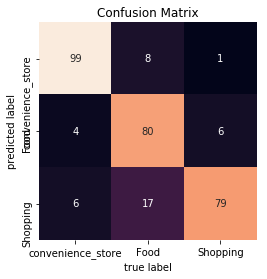

In [254]:
lucem_illud.plotConfusionMatrix(clf_nn, test_review_df)

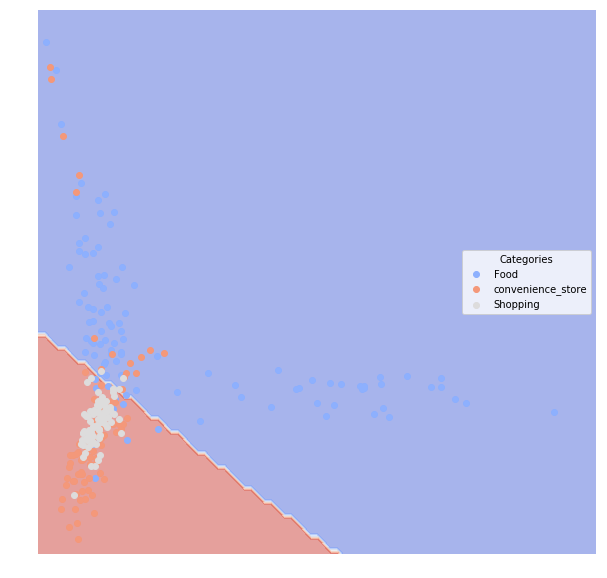

In [255]:
lucem_illud.plotregions(clf_nn, test_review_df)